In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils as utils
import torchvision.transforms as transforms

from torch.autograd import Variable

import os
import time

from PIL.Image import BICUBIC
from torchvision.datasets import MNIST
from ram import RecurrentAttentionModel
from trainer import *

### MNIST dataset
Testing out this model and training algorithm implementation on the basic MNIST dataset, which is pretty simple so hopefully everything goes well.

In [2]:
num_train_data_copies = 1  # Number of times to load the training dataset (with augmentation)
num_eval_data_copies = 1   # Number of times to load the evaluation dataset (with augmentation)
test_val_split = 0.5       # Percentage of the test set to use as validation data
batch_size = 20            # Batch size for training
eval_batch_size = 20       # Batch size for validation and testing

# Image parameters
num_classes = 10       # Digits 0-9
image_size = 28        # MNIST images are 28x28 b/w images
in_channels = 1        # Number of color channels in the inputs (MNIST dataset is grayscale)

glimpse_sizes = [8]  #[5, 10, 18]
padding = int(np.ceil(glimpse_sizes[-1] / 2))
padded_img_size = image_size + 2*padding

In [3]:
# Down/load MNIST data
mnist_data_loc = os.path.join('data', 'mnist')
data_transforms = transforms.Compose([ # Keep things pretty basic for now
    # Pad images with 0s so the GlimpseSensor won't have to
    transforms.Pad(padding = padding),
    # Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255]
    # to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0]
    transforms.ToTensor(),
])

'''
Can increase the number of images in each dataset by loading up the data again,
applying the (random) transformations, then concatenating it all together
'''
### Training Dataset and DataLoader
all_train_datasets = [
    MNIST(
        root = mnist_data_loc, train = True,
        download = True, transform = data_transforms
    ) for _ in range(num_train_data_copies)
]
train_datasets = utils.data.ConcatDataset(all_train_datasets)
train_data = utils.data.DataLoader(train_datasets, batch_size = batch_size, shuffle = True)
num_train_data = len(train_datasets)
num_train_batches = len(train_data)

### Validation and Test Dataset and DataLoader
all_eval_datasets = [
    MNIST(
        root = mnist_data_loc, train = False,
        download = True, transform = data_transforms
    ) for _ in range(num_eval_data_copies)
]
eval_datasets = utils.data.ConcatDataset(all_eval_datasets)
num_eval_data = len(eval_datasets)

eval_split_pt = int(test_val_split * num_eval_data)
eval_idx = list(range(num_eval_data))
np.random.shuffle(eval_idx)

val_idx, test_idx = eval_idx[:eval_split_pt], eval_idx[eval_split_pt:]

val_sampler = utils.data.sampler.SubsetRandomSampler(val_idx)
val_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = val_sampler
)
num_val_data = len(val_sampler)
num_val_batches = len(val_data)

test_sampler = utils.data.sampler.SubsetRandomSampler(test_idx)
test_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = test_sampler
)
num_test_data = len(test_sampler)
num_test_batches = len(test_data)

print('Num:\n- train data: %d (%d batches)\n- val data: %d (%d batches)\n- test data: %d (%d batches)' % (
    num_train_data, num_train_batches, num_val_data, num_val_batches, num_test_data, num_test_batches
))

Num:
- train data: 60000 (3000 batches)
- val data: 5000 (250 batches)
- test data: 5000 (250 batches)


In [4]:
# Basic training hyperparameters
lr = 1e-3
grad_clip = 2
lr_step_size = 1
steps_per_epoch = int(num_train_data_copies * 15)  # Number of times to step the lr scheduler in an epoch
decay_rate = 0.999

# RL training hyperparameters
end_train_ep_early = False     # End each training episode early after a correct classification
assert (end_train_ep_early and batch_size == 1) or not end_train_ep_early
max_ep_len = 6                 # Maximum number of glimpses per episode
num_epochs = 400               # Number of times to go through all of the training examples
early_stopping = int(num_epochs * 0.02)

random_start_loc = True
error_penalty = -0.01  # Amount of penalty to apply each time the agent makes an incorrect classification (<= 0.)
gamma = 0.5            # Reward discount factor

# Etc
log_freq = num_train_batches // 10    # How often to print a training log in an epoch
viz_freq = num_train_batches // 5     # How often to visualize the glimpses in an epoch
eval_viz_freq = num_val_batches // 2  # How often to visualize the glimpses in an epoch

### Model
Need to modify class implementation so that any recurrent `nn.Module` instance can be passed in when initializing a new `RecurrentAttentionModel` to make it easier to try this visual attention mechanism out with different core recurrent networks.

In [5]:
# Model hyperparameters
glimpse_g_size = 128    # Size of the transformed Glimpse representation in the GlimpseNetwork
loc_g_size = 128        # Size of the transformed location representation in the GlimpseNetwork
glimpse_net_size = 256  # Size of the GlimpseNetwork output
rnn_state_size = 256
sensor_size = 8         # Size of the glimpses after resizing
g_rep_op = 'mul'

dropout = 0.0
# Standard deviation to use when sampling the glimpse location coordinates from a normal distribution
loc_std = 0.22

In [6]:
# Initialize the network
model = RecurrentAttentionModel(
    image_size = image_size, in_channels = in_channels,
    glimpse_g_size = glimpse_g_size, loc_g_size = loc_g_size,
    glimpse_net_size = glimpse_net_size, g_rep_op = g_rep_op,
    rnn_state_size = rnn_state_size, num_actions = num_classes,
    sensor_size = sensor_size, glimpse_sizes = glimpse_sizes,
    pad_imgs = False, padding = padding, dropout = dropout
)
num_parameters = sum([p.numel() for p in model.parameters()])
print('Model has %d parameters' % num_parameters)

# Criterion, optimizer, learning rate scheduler
class_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = lr)
lr_scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma = decay_rate)

Model has 547085 parameters


Epoch   1/400) lr = 0.001
 b    300/  3000 >> 148.5 ms/b | lr: 9.99e-04 | grad 2norm:  6.71 | grad inf norm:  4.999
         Weights || abs max:  0.40 ( 4229.54) | mean: -4.10e-04 ( 0.02) | var: 2.03e-03 ( 1002.74)
          Biases || abs max:  0.13 ( 1427.44) | mean:  9.95e-03 ( 2.01) | var: 4.27e-04 (13238.00)
                    class loss: 2.021 | steps: 4.519 | reward:  1.337 | acc.: 28.62%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 162.3 ms/b | lr: 9.98e-04 | grad 2norm:  8.76 | grad inf norm:  4.290
         Weights || abs max:  0.47 (21242.16) | mean: -5.89e-04 ( 0.06) | var: 4.50e-03 (171476.94)
          Biases || abs max:  0.32 (  650.40) | mean:  1.58e-02 ( 0.95) | var: 1.08e-03 ( 1342.42)
                    class loss: 1.623 | steps: 4.042 | reward:  1.985 | acc.: 43.53%

	Target class: 2 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]
	                | Baseline rewards:   [

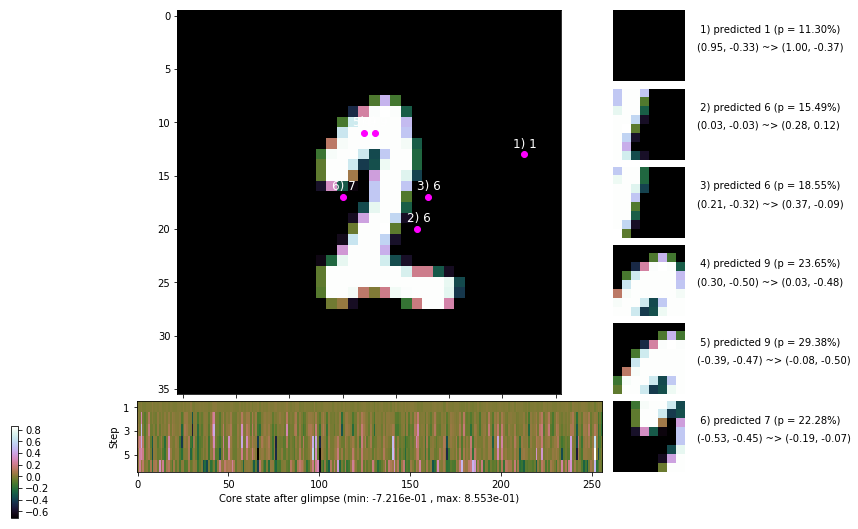

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 170.6 ms/b | lr: 9.96e-04 | grad 2norm:  9.84 | grad inf norm:  3.686
         Weights || abs max:  0.53 ( 6095.48) | mean: -5.51e-04 ( 0.03) | var: 6.11e-03 (  731.49)
          Biases || abs max:  0.44 (  574.51) | mean:  1.65e-02 ( 0.73) | var: 1.54e-03 ( 2370.52)
                    class loss: 1.429 | steps: 3.791 | reward:  2.298 | acc.: 50.12%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 170.9 ms/b | lr: 9.95e-04 | grad 2norm: 10.97 | grad inf norm:  3.701
         Weights || abs max:  0.60 ( 4306.14) | mean: -5.22e-04 ( 0.03) | var: 7.15e-03 (  804.72)
          Biases || abs max:  0.54 (  976.23) | mean:  1.60e-02 ( 0.90) | var: 1.90e-03 (14465.22)
                    class loss: 1.289 | steps: 3.648 | reward:  2.541 | acc.: 55.02%

	Target class: 5 | Discounted rewards: [0.201, 0.423, 0.8

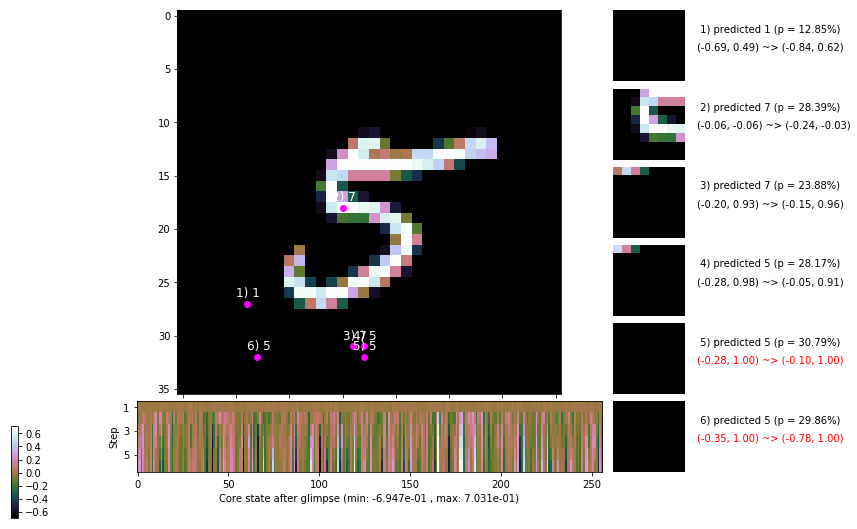

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 176.4 ms/b | lr: 9.93e-04 | grad 2norm: 11.56 | grad inf norm:  3.620
         Weights || abs max:  0.66 ( 5822.88) | mean: -4.90e-04 ( 0.03) | var: 8.08e-03 (  649.99)
          Biases || abs max:  0.61 (  515.04) | mean:  1.40e-02 ( 0.69) | var: 2.22e-03 ( 4429.34)
                    class loss: 1.239 | steps: 3.506 | reward:  2.687 | acc.: 56.68%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 162.4 ms/b | lr: 9.92e-04 | grad 2norm: 11.54 | grad inf norm:  3.468
         Weights || abs max:  0.71 (14186.58) | mean: -4.55e-04 ( 0.05) | var: 8.90e-03 (23520.00)
          Biases || abs max:  0.65 (  810.78) | mean:  1.20e-02 ( 0.73) | var: 2.61e-03 (11560.49)
                    class loss: 1.163 | steps: 3.436 | reward:  2.810 | acc.: 60.17%

	Target class: 4 | Discounted rewards: [-0.020, -0.019, -

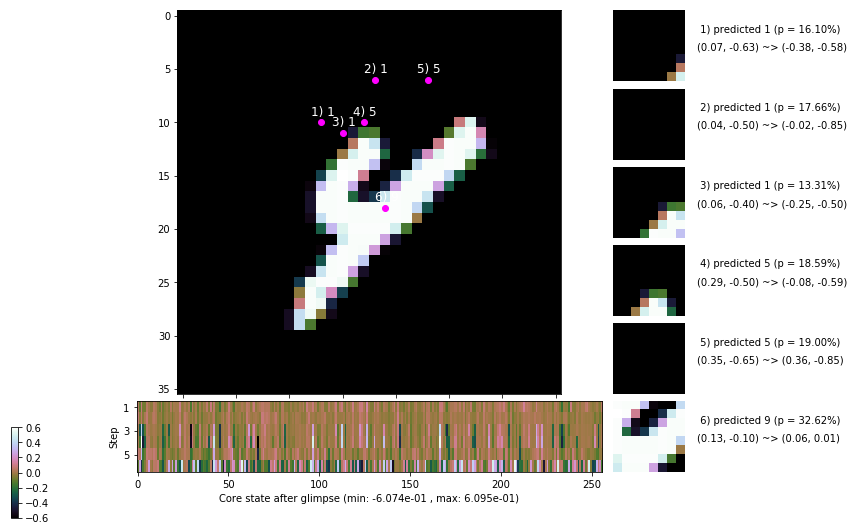

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 156.7 ms/b | lr: 9.90e-04 | grad 2norm: 12.11 | grad inf norm:  3.448
         Weights || abs max:  0.73 ( 7883.23) | mean: -4.58e-04 ( 0.03) | var: 9.58e-03 ( 5755.36)
          Biases || abs max:  0.68 (  316.80) | mean:  1.05e-02 ( 0.43) | var: 2.97e-03 (  336.72)
                    class loss: 1.065 | steps: 3.326 | reward:  2.943 | acc.: 62.73%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 132.3 ms/b | lr: 9.89e-04 | grad 2norm: 12.58 | grad inf norm:  3.600
         Weights || abs max:  0.80 ( 9801.76) | mean: -4.70e-04 ( 0.04) | var: 1.02e-02 ( 7389.45)
          Biases || abs max:  0.72 (  455.59) | mean:  9.32e-03 ( 0.56) | var: 3.38e-03 ( 3401.62)
                    class loss: 1.033 | steps: 3.212 | reward:  3.055 | acc.: 63.97%

	Target class: 7 | Discounted rewards: [-0.020, -0.019, -

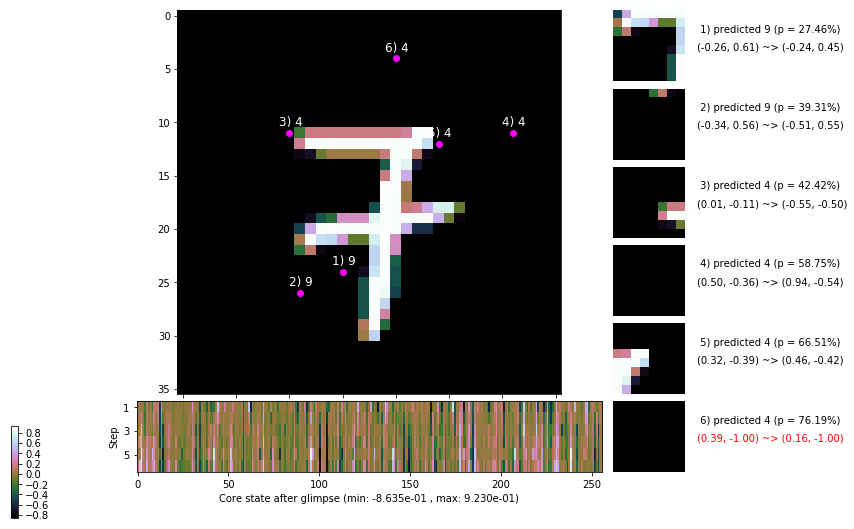

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 135.5 ms/b | lr: 9.87e-04 | grad 2norm: 12.41 | grad inf norm:  3.528
         Weights || abs max:  0.87 ( 7144.51) | mean: -4.22e-04 ( 0.03) | var: 1.07e-02 ( 1998.19)
          Biases || abs max:  0.75 ( 2314.25) | mean:  6.93e-03 ( 1.76) | var: 3.79e-03 (437475.59)
                    class loss: 0.990 | steps: 3.171 | reward:  3.138 | acc.: 66.98%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.6 ms/b | lr: 9.86e-04 | grad 2norm: 12.68 | grad inf norm:  3.500
         Weights || abs max:  0.92 ( 5624.43) | mean: -4.21e-04 ( 0.03) | var: 1.12e-02 ( 1792.90)
          Biases || abs max:  0.79 (  844.26) | mean:  5.03e-03 ( 0.60) | var: 4.20e-03 (37180.52)
                    class loss: 0.933 | steps: 3.091 | reward:  3.230 | acc.: 67.85%

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.

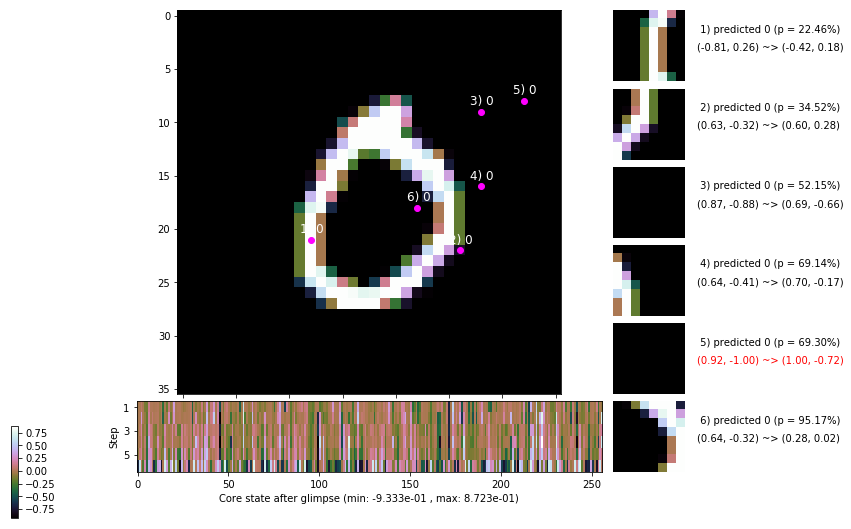

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


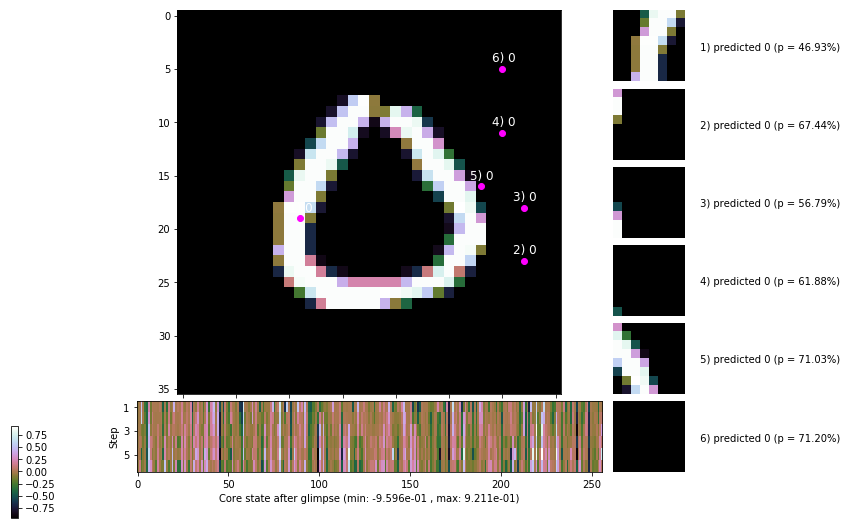


	Target class: 1 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


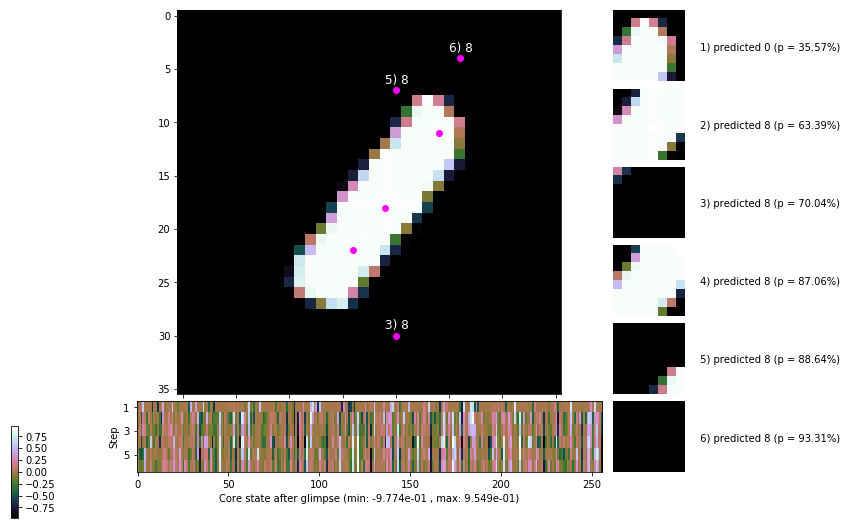

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


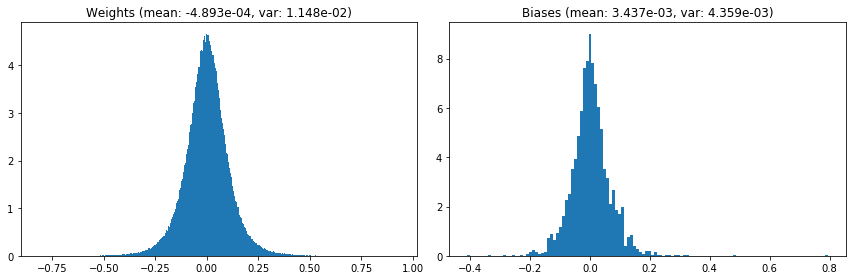

                                      Location network weights and biases


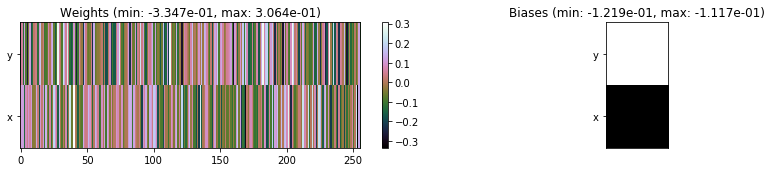

---------------------------------------------------------------------------------------------------------------
Elapsed time:  466.29 sec | TRAIN >> class loss: 1.2787 | steps:  3.574    | reward:  2.6025    | acc.: 55.567% 
                          | VAL   >> class loss: 0.9340 | steps:  3.022    | reward:  3.3471    | acc.: 67.420% 


Epoch   2/400) lr = 0.0009851
 b    300/  3000 >> 143.8 ms/b | lr: 9.84e-04 | grad 2norm: 12.66 | grad inf norm:  3.425
         Weights || abs max:  0.95 ( 6931.75) | mean: -4.80e-04 ( 0.03) | var: 1.17e-02 ( 4540.05)
          Biases || abs max:  0.81 (  482.29) | mean:  2.30e-03 ( 0.57) | var: 4.61e-03 ( 7245.15)
                    class loss: 0.941 | steps: 3.123 | reward:  3.243 | acc.: 67.53%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 139.7 ms/b | lr: 9.83e-04 | grad 2norm: 13.11 | grad inf norm:  3.622
         Weights || abs max:  0.98 ( 4652.40) | mean: -4.36e-04 ( 0.0

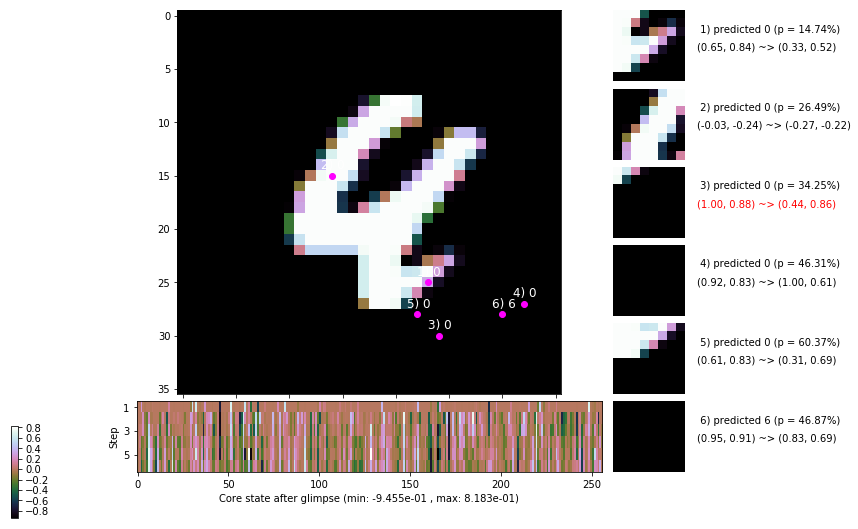

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 134.4 ms/b | lr: 9.81e-04 | grad 2norm: 12.74 | grad inf norm:  3.327
         Weights || abs max:  1.03 ( 2783.46) | mean: -3.91e-04 ( 0.02) | var: 1.26e-02 (  134.52)
          Biases || abs max:  0.86 ( 1045.02) | mean: -1.44e-03 ( 0.70) | var: 5.35e-03 (65810.46)
                    class loss: 0.897 | steps: 3.042 | reward:  3.333 | acc.: 70.03%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 131.0 ms/b | lr: 9.80e-04 | grad 2norm: 13.08 | grad inf norm:  3.517
         Weights || abs max:  1.05 (12145.19) | mean: -3.43e-04 ( 0.04) | var: 1.30e-02 (12167.81)
          Biases || abs max:  0.88 (  307.35) | mean: -3.78e-03 ( 0.39) | var: 5.73e-03 (  481.06)
                    class loss: 0.874 | steps: 3.016 | reward:  3.370 | acc.: 69.85%

	Target class: 4 | Discounted rewards: [-0.020, -0.019, -

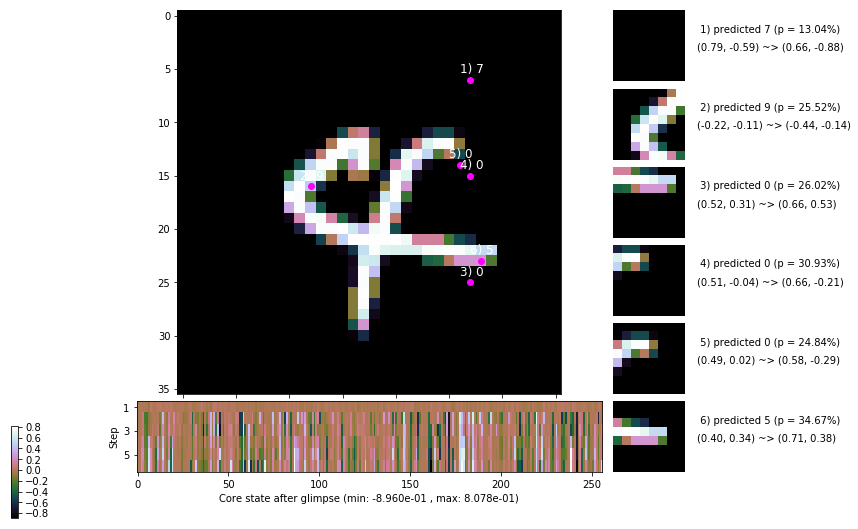

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 140.1 ms/b | lr: 9.78e-04 | grad 2norm: 12.66 | grad inf norm:  3.344
         Weights || abs max:  1.08 ( 5327.85) | mean: -3.48e-04 ( 0.03) | var: 1.34e-02 (  858.14)
          Biases || abs max:  0.88 (  531.94) | mean: -6.45e-03 ( 0.55) | var: 6.21e-03 (12495.10)
                    class loss: 0.882 | steps: 3.020 | reward:  3.377 | acc.: 69.93%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 171.2 ms/b | lr: 9.77e-04 | grad 2norm: 12.79 | grad inf norm:  3.543
         Weights || abs max:  1.14 (12075.57) | mean: -3.11e-04 ( 0.04) | var: 1.38e-02 (24827.20)
          Biases || abs max:  0.89 (  422.93) | mean: -9.17e-03 ( 0.41) | var: 6.72e-03 ( 1744.22)
                    class loss: 0.883 | steps: 3.020 | reward:  3.362 | acc.: 70.12%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

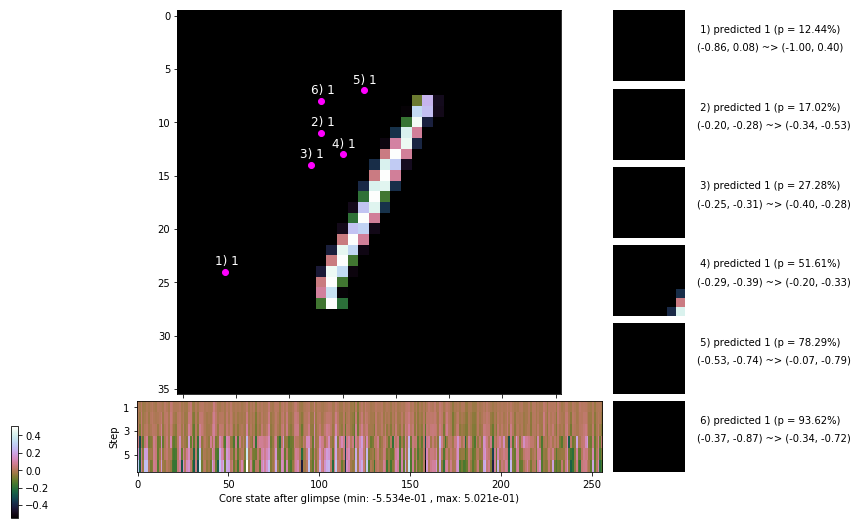

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 139.2 ms/b | lr: 9.75e-04 | grad 2norm: 12.76 | grad inf norm:  3.523
         Weights || abs max:  1.16 ( 4175.60) | mean: -3.01e-04 ( 0.02) | var: 1.42e-02 (  636.15)
          Biases || abs max:  0.89 (  354.74) | mean: -1.13e-02 ( 0.36) | var: 7.19e-03 (  837.96)
                    class loss: 0.863 | steps: 2.967 | reward:  3.420 | acc.: 70.78%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 137.9 ms/b | lr: 9.74e-04 | grad 2norm: 12.64 | grad inf norm:  3.305
         Weights || abs max:  1.19 ( 4959.71) | mean: -3.06e-04 ( 0.03) | var: 1.46e-02 (  875.92)
          Biases || abs max:  0.90 (  273.15) | mean: -1.30e-02 ( 0.34) | var: 7.52e-03 (  457.57)
                    class loss: 0.836 | steps: 2.990 | reward:  3.412 | acc.: 71.27%

	Target class: 4 | Discounted rewards: [1.969, 1.938, 1.8

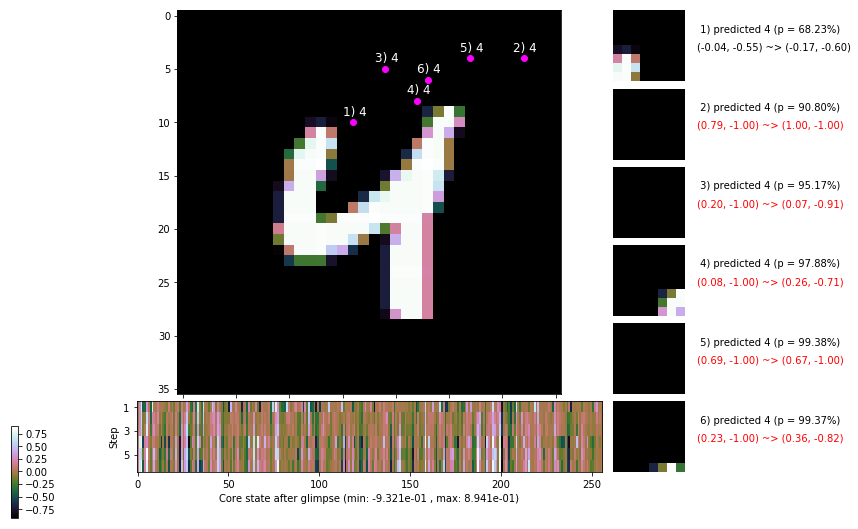

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 141.1 ms/b | lr: 9.72e-04 | grad 2norm: 13.08 | grad inf norm:  3.477
         Weights || abs max:  1.20 ( 4433.49) | mean: -2.88e-04 ( 0.02) | var: 1.50e-02 (  735.40)
          Biases || abs max:  0.89 (  250.84) | mean: -1.55e-02 ( 0.34) | var: 7.98e-03 (  411.22)
                    class loss: 0.863 | steps: 2.958 | reward:  3.425 | acc.: 70.55%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 149.2 ms/b | lr: 9.71e-04 | grad 2norm: 13.04 | grad inf norm:  3.445
         Weights || abs max:  1.21 ( 4776.50) | mean: -2.54e-04 ( 0.02) | var: 1.53e-02 (  545.14)
          Biases || abs max:  0.90 (  342.15) | mean: -1.75e-02 ( 0.31) | var: 8.53e-03 ( 4343.71)
                    class loss: 0.858 | steps: 2.945 | reward:  3.446 | acc.: 70.92%

	Target class: 0 | Discounted rewards: [0.485, 0.991, -0.

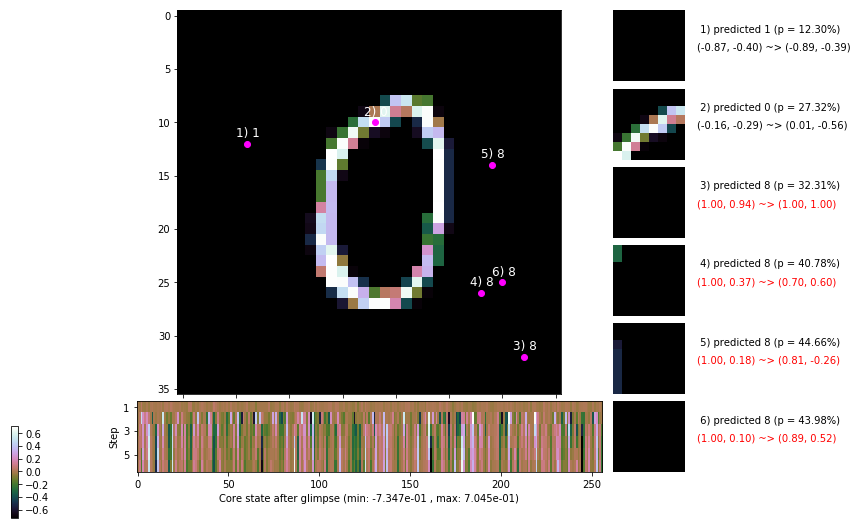

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 5 | Discounted rewards: [1.464, 0.928, 1.875, 1.750, 1.500, 1.000]


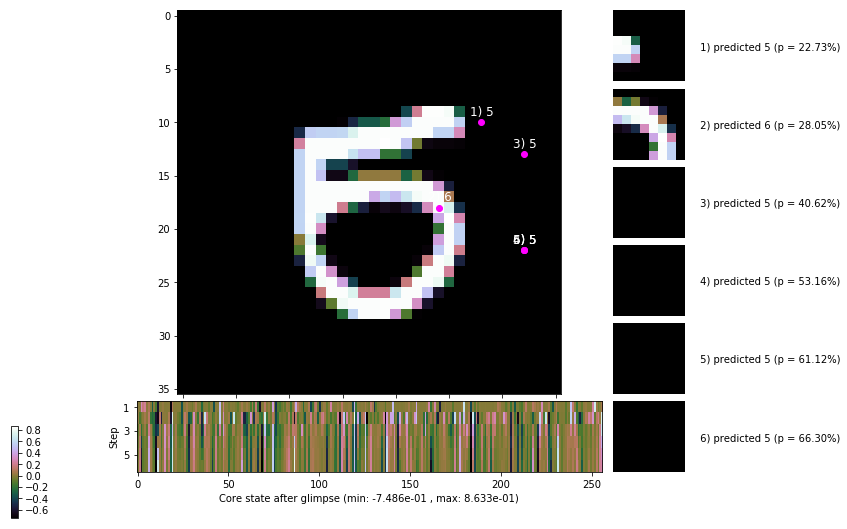


	Target class: 2 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


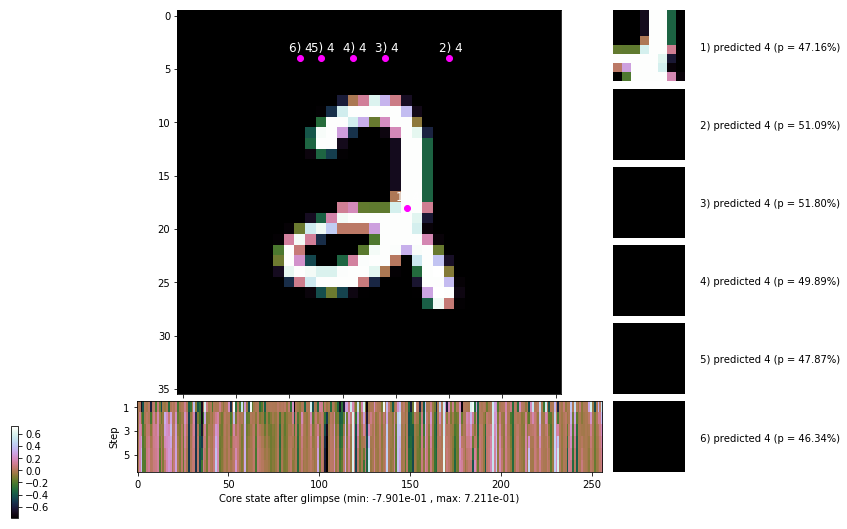

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


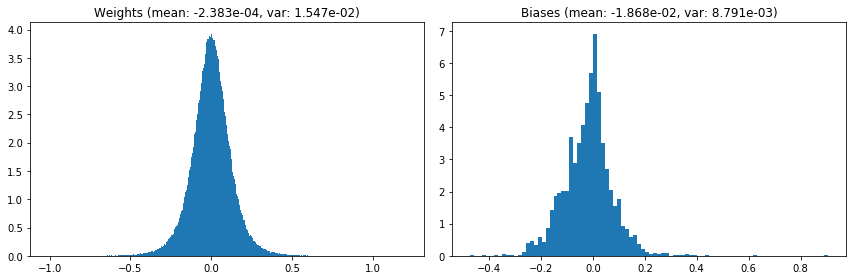

                                      Location network weights and biases


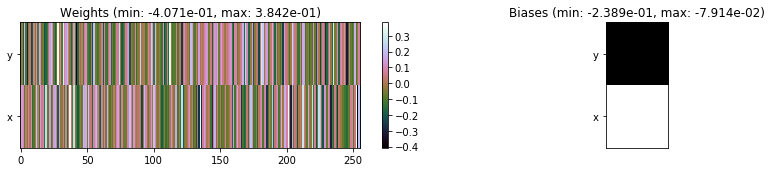

---------------------------------------------------------------------------------------------------------------
Elapsed time:  428.87 sec | TRAIN >> class loss: 0.8795 | steps:  3.015    | reward:  3.3670    | acc.: 69.973% 
                          | VAL   >> class loss: 0.8568 | steps:  2.882    | reward:  3.5386    | acc.: 70.160% 


Epoch   3/400) lr = 0.0009704
 b    300/  3000 >> 138.6 ms/b | lr: 9.69e-04 | grad 2norm: 12.87 | grad inf norm:  3.390
         Weights || abs max:  1.22 ( 4194.57) | mean: -2.31e-04 ( 0.02) | var: 1.57e-02 (  816.35)
          Biases || abs max:  0.90 (  378.86) | mean: -1.97e-02 ( 0.36) | var: 8.97e-03 ( 3796.58)
                    class loss: 0.833 | steps: 2.972 | reward:  3.434 | acc.: 71.02%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 134.1 ms/b | lr: 9.68e-04 | grad 2norm: 12.64 | grad inf norm:  3.438
         Weights || abs max:  1.25 ( 5239.45) | mean: -1.73e-04 ( 0.0

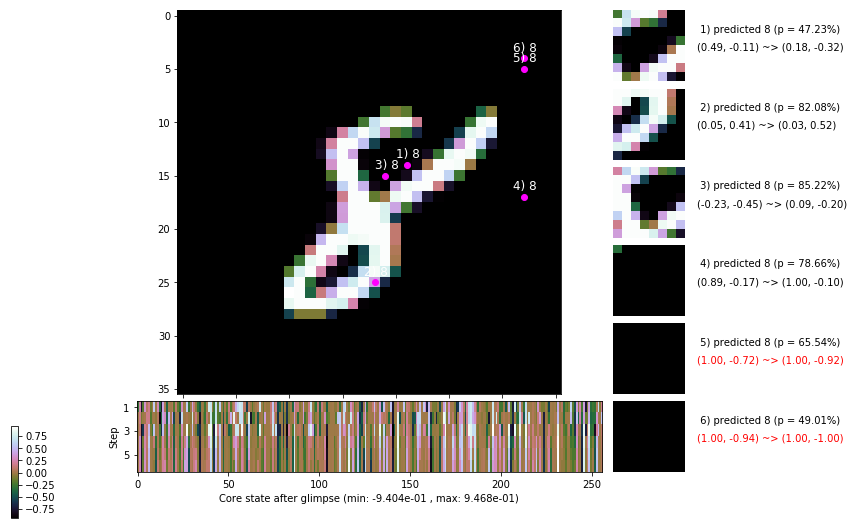

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 138.8 ms/b | lr: 9.67e-04 | grad 2norm: 12.69 | grad inf norm:  3.429
         Weights || abs max:  1.27 ( 3349.88) | mean: -9.82e-05 ( 0.02) | var: 1.64e-02 (  285.13)
          Biases || abs max:  0.93 (  267.51) | mean: -2.33e-02 ( 0.31) | var: 9.92e-03 (  590.16)
                    class loss: 0.847 | steps: 2.970 | reward:  3.445 | acc.: 71.12%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 138.4 ms/b | lr: 9.66e-04 | grad 2norm: 12.71 | grad inf norm:  3.635
         Weights || abs max:  1.29 ( 8696.31) | mean: -1.16e-04 ( 0.03) | var: 1.68e-02 (21495.48)
          Biases || abs max:  0.93 ( 1013.65) | mean: -2.53e-02 ( 0.90) | var: 1.04e-02 (92621.45)
                    class loss: 0.841 | steps: 2.914 | reward:  3.498 | acc.: 72.02%

	Target class: 4 | Discounted rewards: [-0.020, -0.019, -

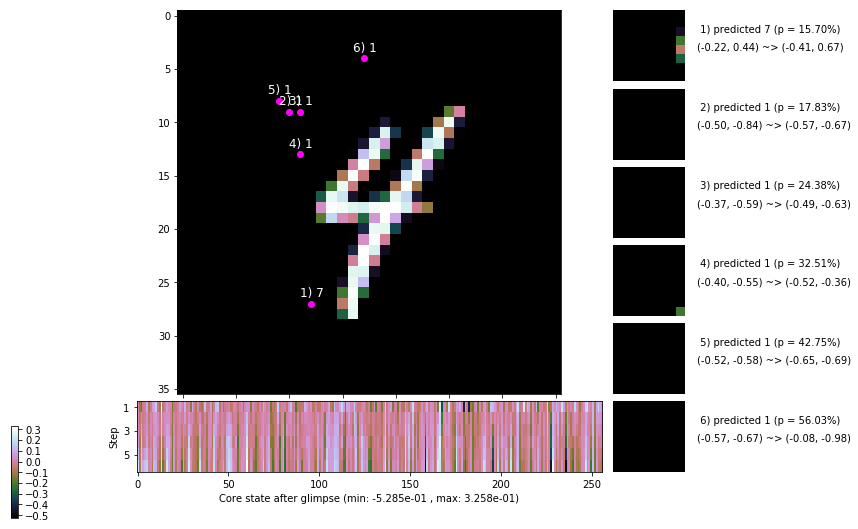

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 158.0 ms/b | lr: 9.64e-04 | grad 2norm: 12.66 | grad inf norm:  3.527
         Weights || abs max:  1.30 ( 5273.42) | mean: -1.02e-04 ( 0.03) | var: 1.71e-02 (  513.64)
          Biases || abs max:  0.92 (  514.60) | mean: -2.72e-02 ( 0.40) | var: 1.10e-02 ( 6229.86)
                    class loss: 0.846 | steps: 2.941 | reward:  3.480 | acc.: 71.03%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 137.7 ms/b | lr: 9.63e-04 | grad 2norm: 12.41 | grad inf norm:  3.466
         Weights || abs max:  1.29 ( 7838.83) | mean: -9.05e-05 ( 0.03) | var: 1.75e-02 ( 2534.07)
          Biases || abs max:  0.94 (  199.44) | mean: -2.80e-02 ( 0.27) | var: 1.14e-02 (  193.40)
                    class loss: 0.827 | steps: 2.917 | reward:  3.499 | acc.: 71.57%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

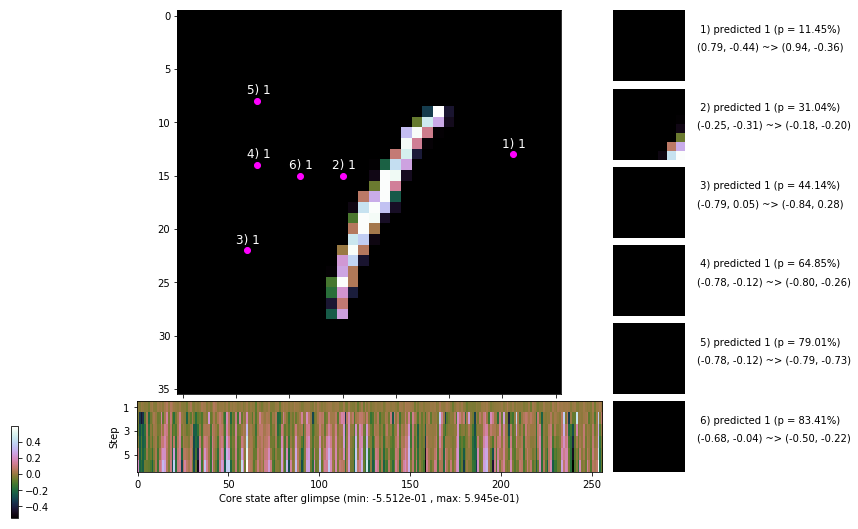

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 130.3 ms/b | lr: 9.61e-04 | grad 2norm: 12.45 | grad inf norm:  3.394
         Weights || abs max:  1.30 ( 4551.86) | mean: -8.53e-05 ( 0.02) | var: 1.78e-02 (  388.74)
          Biases || abs max:  0.94 (  193.22) | mean: -2.93e-02 ( 0.27) | var: 1.19e-02 (  101.14)
                    class loss: 0.861 | steps: 2.949 | reward:  3.464 | acc.: 70.38%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 129.3 ms/b | lr: 9.60e-04 | grad 2norm: 12.59 | grad inf norm:  3.362
         Weights || abs max:  1.31 ( 5795.61) | mean: -7.63e-05 ( 0.03) | var: 1.82e-02 ( 1307.81)
          Biases || abs max:  0.95 (  589.05) | mean: -3.03e-02 ( 0.59) | var: 1.24e-02 (16171.37)
                    class loss: 0.840 | steps: 2.921 | reward:  3.478 | acc.: 70.48%

	Target class: 3 | Discounted rewards: [0.201, 0.423, 0.8

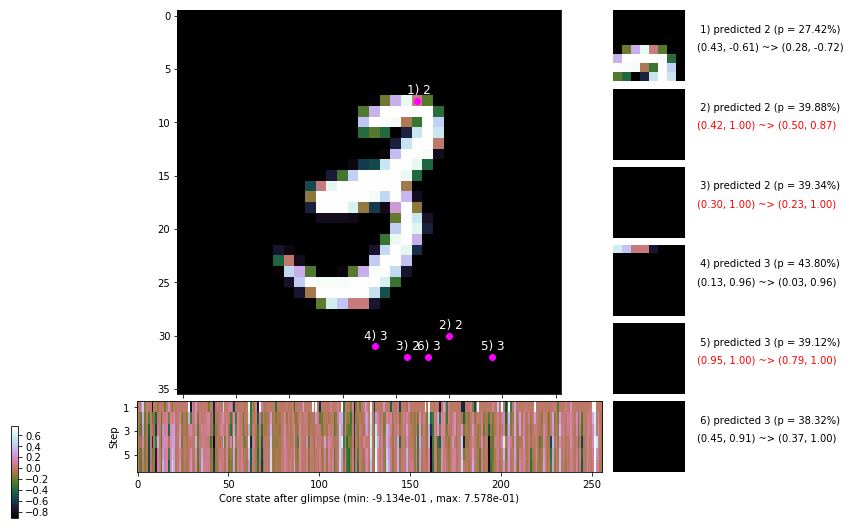

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 149.3 ms/b | lr: 9.58e-04 | grad 2norm: 12.66 | grad inf norm:  3.338
         Weights || abs max:  1.31 (23040.89) | mean: -4.96e-05 ( 0.06) | var: 1.85e-02 (155696.84)
          Biases || abs max:  0.95 (  838.76) | mean: -3.20e-02 ( 0.55) | var: 1.29e-02 (28597.23)
                    class loss: 0.807 | steps: 2.888 | reward:  3.550 | acc.: 72.45%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 188.7 ms/b | lr: 9.57e-04 | grad 2norm: 13.16 | grad inf norm:  3.480
         Weights || abs max:  1.31 ( 3788.20) | mean: -5.50e-05 ( 0.02) | var: 1.88e-02 (  296.21)
          Biases || abs max:  0.96 (  233.58) | mean: -3.29e-02 ( 0.26) | var: 1.34e-02 (  127.90)
                    class loss: 0.813 | steps: 2.856 | reward:  3.542 | acc.: 71.95%

	Target class: 5 | Discounted rewards: [-0.020, -0.019, 

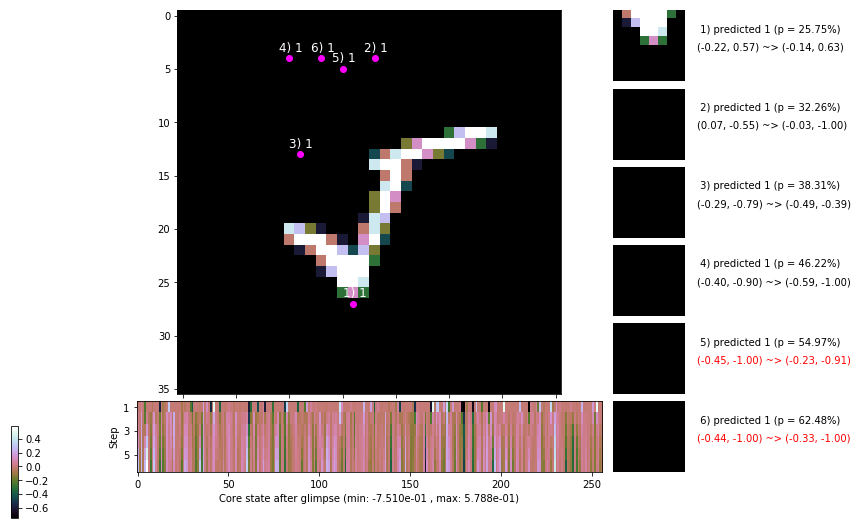

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 2 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


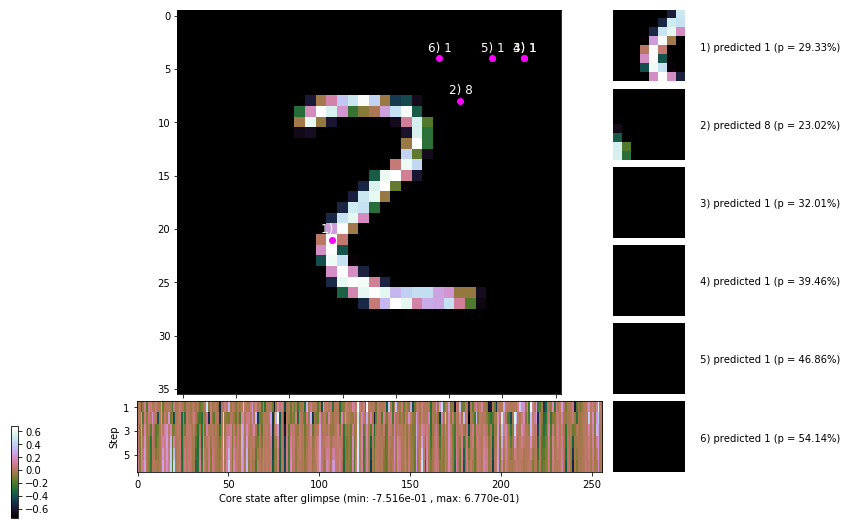


	Target class: 9 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


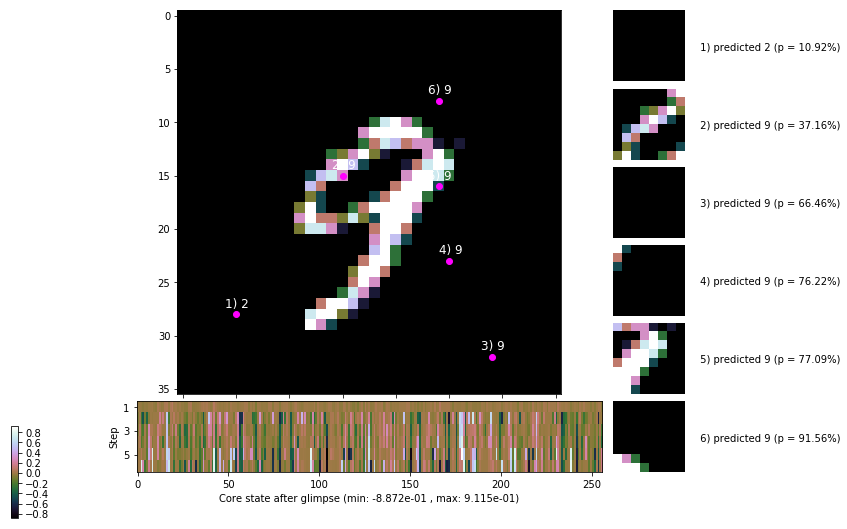

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


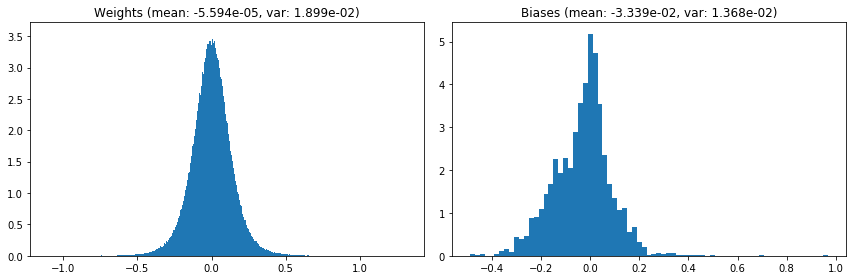

                                      Location network weights and biases


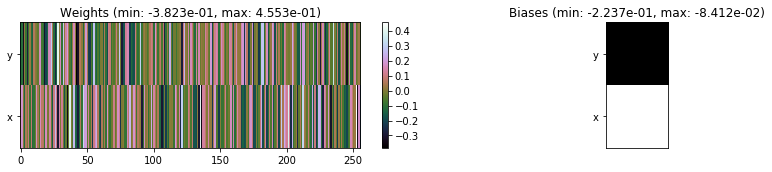

---------------------------------------------------------------------------------------------------------------
Elapsed time:  433.61 sec | TRAIN >> class loss: 0.8332 | steps:  2.926    | reward:  3.4897    | acc.: 71.422% 
                          | VAL   >> class loss: 0.8449 | steps:  2.811    | reward:  3.5659    | acc.: 69.900% :(


Epoch   4/400) lr = 0.000956
 b    300/  3000 >> 150.6 ms/b | lr: 9.55e-04 | grad 2norm: 12.89 | grad inf norm:  3.439
         Weights || abs max:  1.34 ( 4296.46) | mean: -3.78e-05 ( 0.02) | var: 1.91e-02 (  525.26)
          Biases || abs max:  0.97 (  412.52) | mean: -3.42e-02 ( 0.35) | var: 1.39e-02 ( 1669.37)
                    class loss: 0.818 | steps: 2.868 | reward:  3.564 | acc.: 72.32%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 136.1 ms/b | lr: 9.54e-04 | grad 2norm: 12.78 | grad inf norm:  3.411
         Weights || abs max:  1.36 ( 7063.40) | mean:  1.28e-05 ( 0.

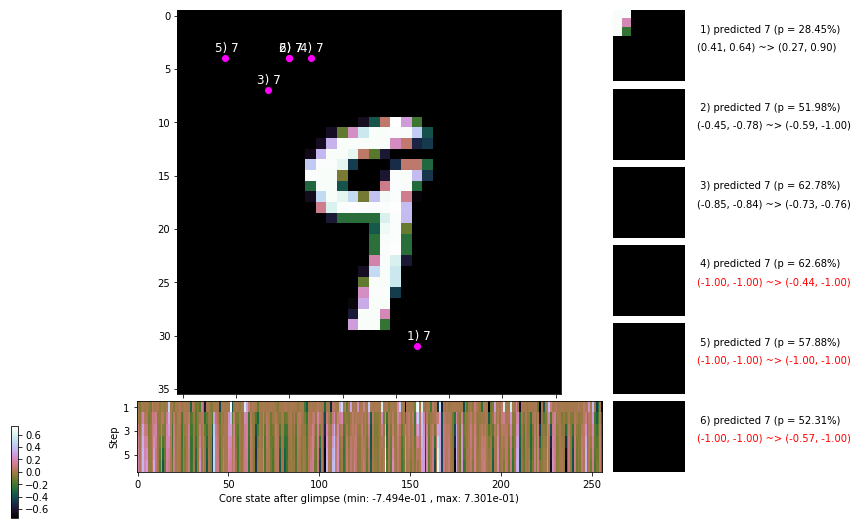

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 139.6 ms/b | lr: 9.52e-04 | grad 2norm: 12.46 | grad inf norm:  3.312
         Weights || abs max:  1.38 ( 5152.86) | mean:  2.07e-05 ( 0.02) | var: 1.98e-02 ( 1781.51)
          Biases || abs max:  0.97 (  324.16) | mean: -3.67e-02 ( 0.32) | var: 1.47e-02 ( 1726.18)
                    class loss: 0.818 | steps: 2.849 | reward:  3.571 | acc.: 72.25%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 134.5 ms/b | lr: 9.51e-04 | grad 2norm: 12.61 | grad inf norm:  3.411
         Weights || abs max:  1.38 ( 3800.20) | mean: -2.20e-06 ( 0.02) | var: 2.01e-02 (  307.96)
          Biases || abs max:  0.97 (  405.86) | mean: -3.79e-02 ( 0.36) | var: 1.52e-02 ( 2590.35)
                    class loss: 0.832 | steps: 2.848 | reward:  3.567 | acc.: 72.12%

	Target class: 8 | Discounted rewards: [-0.020, -0.019, -

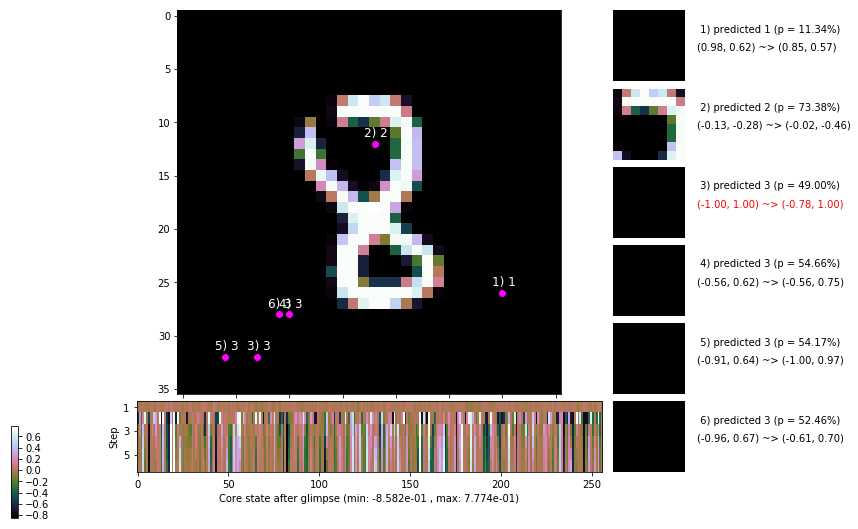

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 149.6 ms/b | lr: 9.49e-04 | grad 2norm: 12.63 | grad inf norm:  3.478
         Weights || abs max:  1.38 ( 9146.33) | mean:  2.21e-05 ( 0.03) | var: 2.04e-02 ( 4482.72)
          Biases || abs max:  0.97 (  189.28) | mean: -3.90e-02 ( 0.23) | var: 1.57e-02 (  149.20)
                    class loss: 0.827 | steps: 2.872 | reward:  3.534 | acc.: 70.87%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 136.6 ms/b | lr: 9.48e-04 | grad 2norm: 12.98 | grad inf norm:  3.618
         Weights || abs max:  1.41 ( 7589.79) | mean:  3.87e-05 ( 0.03) | var: 2.07e-02 ( 4857.89)
          Biases || abs max:  0.97 (  609.87) | mean: -3.99e-02 ( 0.40) | var: 1.62e-02 ( 9103.24)
                    class loss: 0.823 | steps: 2.878 | reward:  3.548 | acc.: 71.57%

	Target class: 6 | Discounted rewards: [-0.020, -0.019, -

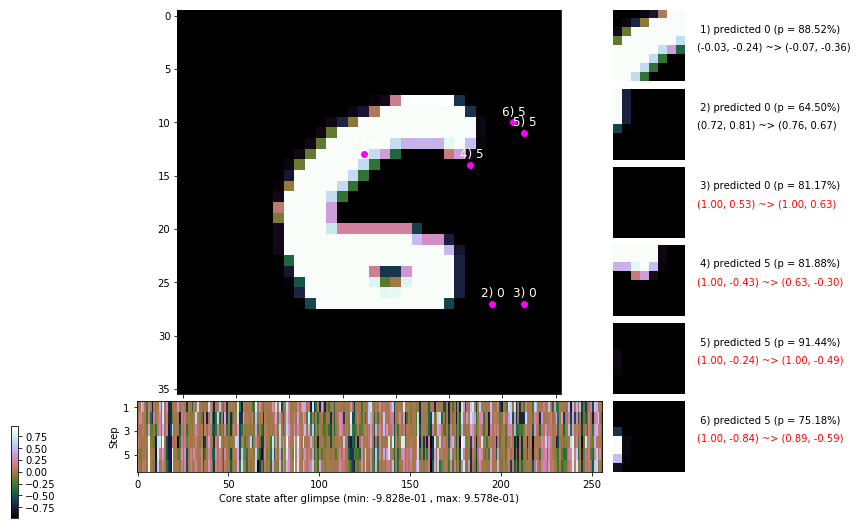

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 159.5 ms/b | lr: 9.46e-04 | grad 2norm: 12.61 | grad inf norm:  3.352
         Weights || abs max:  1.42 ( 5598.25) | mean:  2.50e-05 ( 0.03) | var: 2.10e-02 ( 1037.67)
          Biases || abs max:  0.98 (  969.90) | mean: -4.09e-02 ( 0.86) | var: 1.66e-02 (142402.55)
                    class loss: 0.790 | steps: 2.806 | reward:  3.627 | acc.: 72.92%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 153.6 ms/b | lr: 9.46e-04 | grad 2norm: 12.90 | grad inf norm:  3.568
         Weights || abs max:  1.44 (12423.09) | mean:  6.54e-05 ( 0.04) | var: 2.13e-02 (23391.59)
          Biases || abs max:  0.97 (  246.59) | mean: -4.19e-02 ( 0.25) | var: 1.71e-02 (  935.19)
                    class loss: 0.804 | steps: 2.852 | reward:  3.573 | acc.: 72.48%

	Target class: 2 | Discounted rewards: [1.969, 1.938, 1.

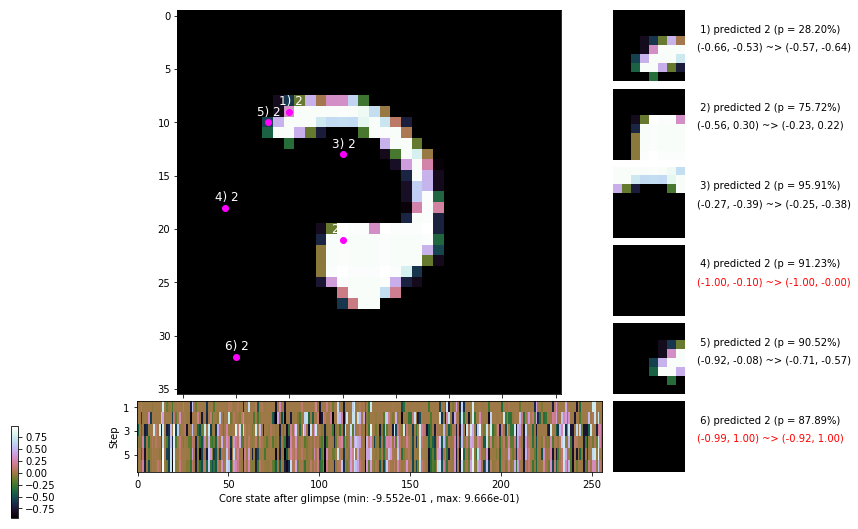

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 149.7 ms/b | lr: 9.44e-04 | grad 2norm: 12.83 | grad inf norm:  3.499
         Weights || abs max:  1.44 ( 6207.65) | mean:  8.02e-05 ( 0.02) | var: 2.16e-02 ( 3777.97)
          Biases || abs max:  0.98 (  168.21) | mean: -4.26e-02 ( 0.22) | var: 1.74e-02 (  136.06)
                    class loss: 0.771 | steps: 2.786 | reward:  3.663 | acc.: 73.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 149.0 ms/b | lr: 9.43e-04 | grad 2norm: 13.03 | grad inf norm:  3.469
         Weights || abs max:  1.48 ( 3741.97) | mean:  1.38e-04 ( 0.02) | var: 2.20e-02 (  363.36)
          Biases || abs max:  0.99 (  196.06) | mean: -4.38e-02 ( 0.25) | var: 1.79e-02 (  276.60)
                    class loss: 0.790 | steps: 2.805 | reward:  3.628 | acc.: 73.55%

	Target class: 9 | Discounted rewards: [0.959, 1.938, 1.8

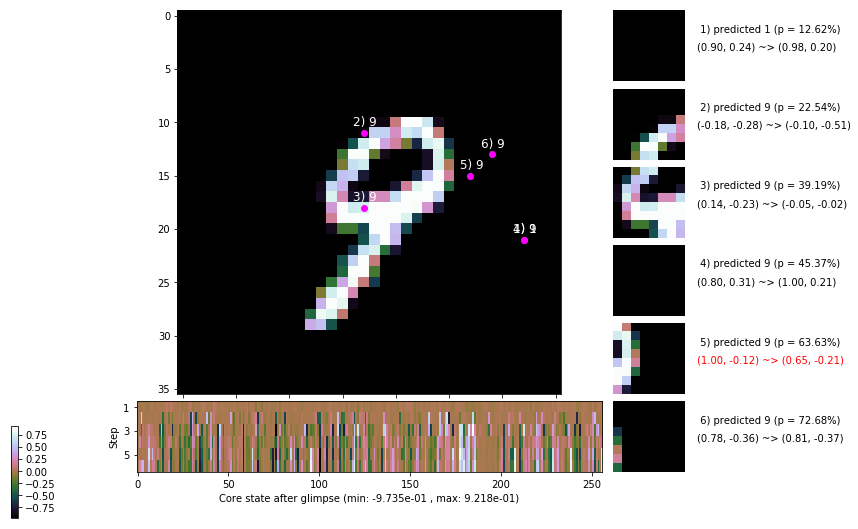

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


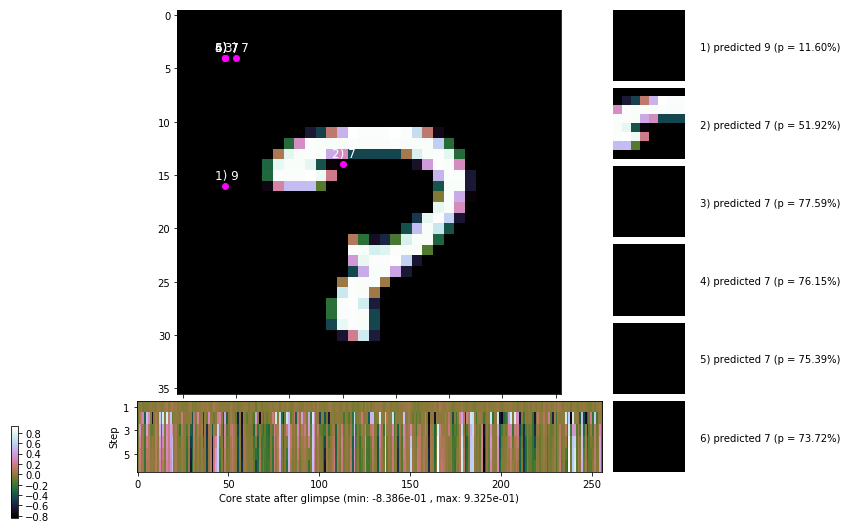


	Target class: 6 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


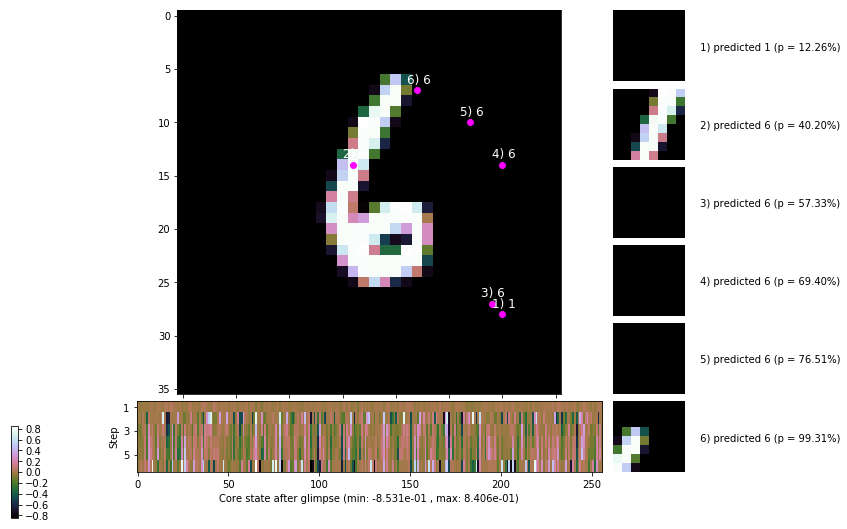

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


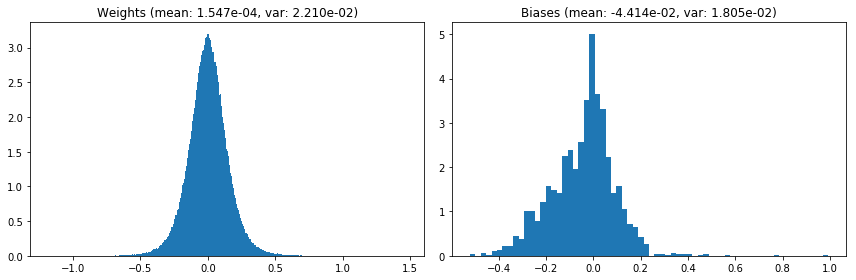

                                      Location network weights and biases


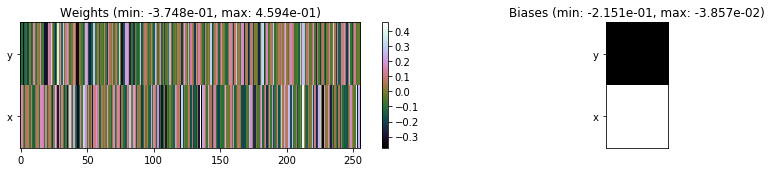

---------------------------------------------------------------------------------------------------------------
Elapsed time:  438.29 sec | TRAIN >> class loss: 0.8082 | steps:  2.842    | reward:  3.5869    | acc.: 72.412% 
                          | VAL   >> class loss: 0.7814 | steps:  2.750    | reward:  3.6988    | acc.: 72.920% 


Epoch   5/400) lr = 0.0009417
 b    300/  3000 >> 136.3 ms/b | lr: 9.41e-04 | grad 2norm: 12.85 | grad inf norm:  3.386
         Weights || abs max:  1.47 ( 3478.69) | mean:  1.78e-04 ( 0.02) | var: 2.22e-02 (  233.20)
          Biases || abs max:  0.99 (  174.36) | mean: -4.49e-02 ( 0.21) | var: 1.83e-02 (  373.15)
                    class loss: 0.787 | steps: 2.801 | reward:  3.661 | acc.: 73.33%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 162.6 ms/b | lr: 9.40e-04 | grad 2norm: 12.80 | grad inf norm:  3.357
         Weights || abs max:  1.48 ( 5634.53) | mean:  1.76e-04 ( 0.0

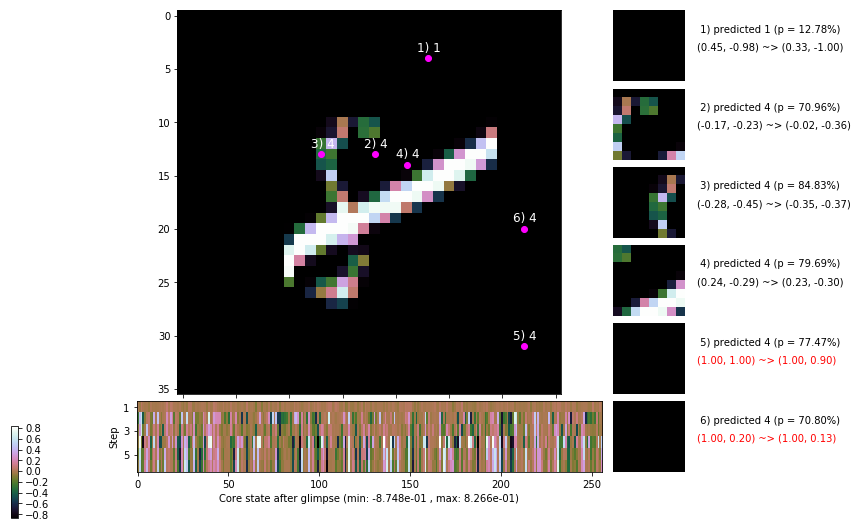

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 198.4 ms/b | lr: 9.38e-04 | grad 2norm: 12.92 | grad inf norm:  3.365
         Weights || abs max:  1.48 ( 5995.16) | mean:  1.63e-04 ( 0.02) | var: 2.28e-02 ( 1270.98)
          Biases || abs max:  1.00 (  274.12) | mean: -4.62e-02 ( 0.23) | var: 1.89e-02 ( 1064.01)
                    class loss: 0.739 | steps: 2.746 | reward:  3.710 | acc.: 74.10%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 152.7 ms/b | lr: 9.37e-04 | grad 2norm: 13.09 | grad inf norm:  3.358
         Weights || abs max:  1.48 ( 3134.07) | mean:  9.42e-05 ( 0.02) | var: 2.31e-02 (   98.40)
          Biases || abs max:  1.00 (  398.76) | mean: -4.68e-02 ( 0.30) | var: 1.94e-02 ( 2067.83)
                    class loss: 0.719 | steps: 2.732 | reward:  3.763 | acc.: 75.40%

	Target class: 6 | Discounted rewards: [1.969, 1.938, 1.8

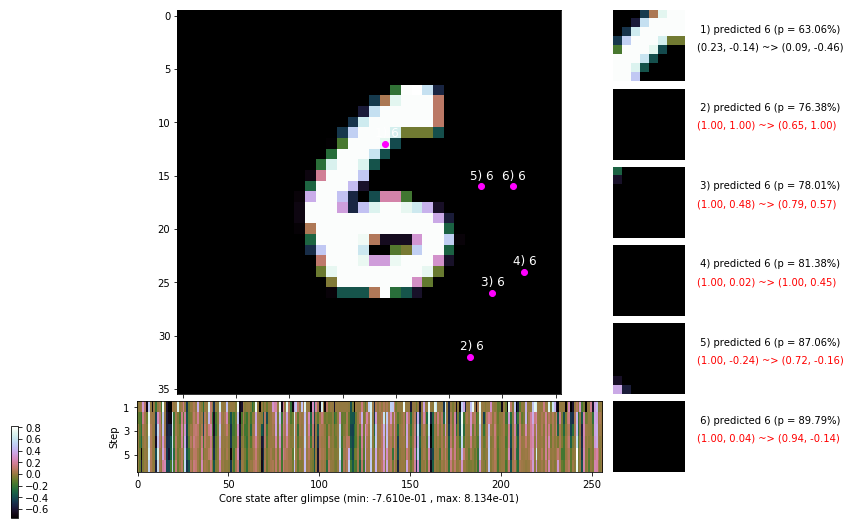

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 162.7 ms/b | lr: 9.35e-04 | grad 2norm: 13.08 | grad inf norm:  3.318
         Weights || abs max:  1.47 ( 2719.32) | mean:  7.62e-05 ( 0.02) | var: 2.34e-02 (   70.28)
          Biases || abs max:  1.01 (  163.38) | mean: -4.73e-02 ( 0.19) | var: 1.98e-02 (  116.17)
                    class loss: 0.744 | steps: 2.772 | reward:  3.697 | acc.: 74.58%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 153.3 ms/b | lr: 9.34e-04 | grad 2norm: 13.03 | grad inf norm:  3.422
         Weights || abs max:  1.45 ( 2756.43) | mean:  6.81e-05 ( 0.02) | var: 2.36e-02 (  111.68)
          Biases || abs max:  1.01 (  430.00) | mean: -4.85e-02 ( 0.41) | var: 2.01e-02 (19948.68)
                    class loss: 0.739 | steps: 2.757 | reward:  3.720 | acc.: 74.42%

	Target class: 5 | Discounted rewards: [0.959, 1.938, 1.8

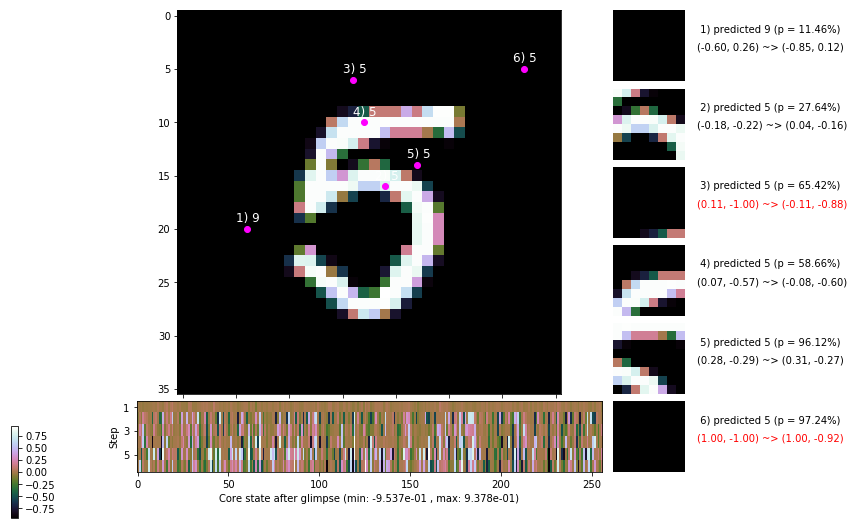

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 162.7 ms/b | lr: 9.32e-04 | grad 2norm: 13.03 | grad inf norm:  3.311
         Weights || abs max:  1.46 ( 6406.14) | mean:  3.83e-05 ( 0.03) | var: 2.39e-02 ( 2994.18)
          Biases || abs max:  1.01 (  145.90) | mean: -4.96e-02 ( 0.17) | var: 2.05e-02 (   96.73)
                    class loss: 0.766 | steps: 2.760 | reward:  3.690 | acc.: 73.62%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 157.8 ms/b | lr: 9.31e-04 | grad 2norm: 13.09 | grad inf norm:  3.509
         Weights || abs max:  1.48 ( 8416.41) | mean:  5.54e-05 ( 0.03) | var: 2.42e-02 ( 4593.60)
          Biases || abs max:  1.01 (   93.59) | mean: -5.07e-02 ( 0.16) | var: 2.09e-02 (   31.42)
                    class loss: 0.760 | steps: 2.767 | reward:  3.691 | acc.: 74.22%

	Target class: 8 | Discounted rewards: [-0.020, -0.019, -

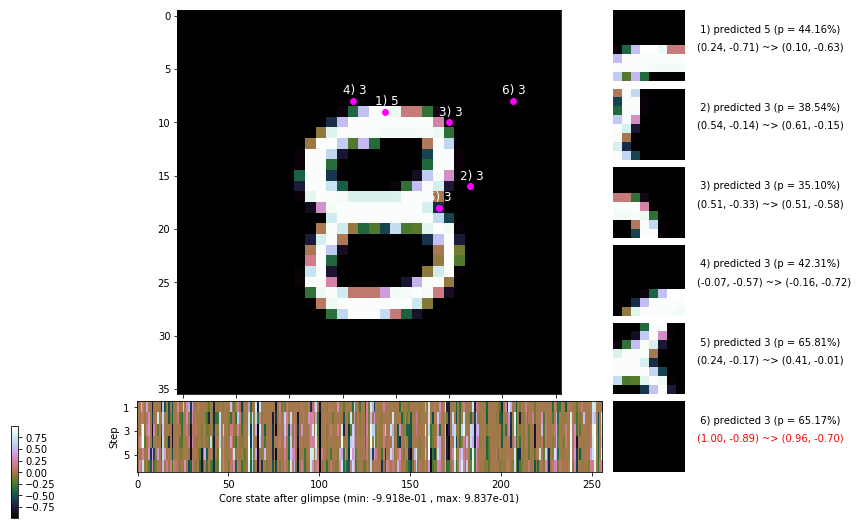

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 162.7 ms/b | lr: 9.30e-04 | grad 2norm: 13.10 | grad inf norm:  3.457
         Weights || abs max:  1.51 (10308.50) | mean:  7.00e-05 ( 0.03) | var: 2.44e-02 (15928.46)
          Biases || abs max:  1.01 (  321.53) | mean: -5.17e-02 ( 0.30) | var: 2.13e-02 ( 2936.53)
                    class loss: 0.736 | steps: 2.744 | reward:  3.745 | acc.: 75.20%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 155.5 ms/b | lr: 9.29e-04 | grad 2norm: 12.98 | grad inf norm:  3.396
         Weights || abs max:  1.51 ( 5315.38) | mean:  8.40e-05 ( 0.02) | var: 2.47e-02 (  813.08)
          Biases || abs max:  1.01 (  204.26) | mean: -5.21e-02 ( 0.23) | var: 2.17e-02 (  684.97)
                    class loss: 0.723 | steps: 2.697 | reward:  3.807 | acc.: 76.13%

	Target class: 7 | Discounted rewards: [0.612, 1.243, 0.4

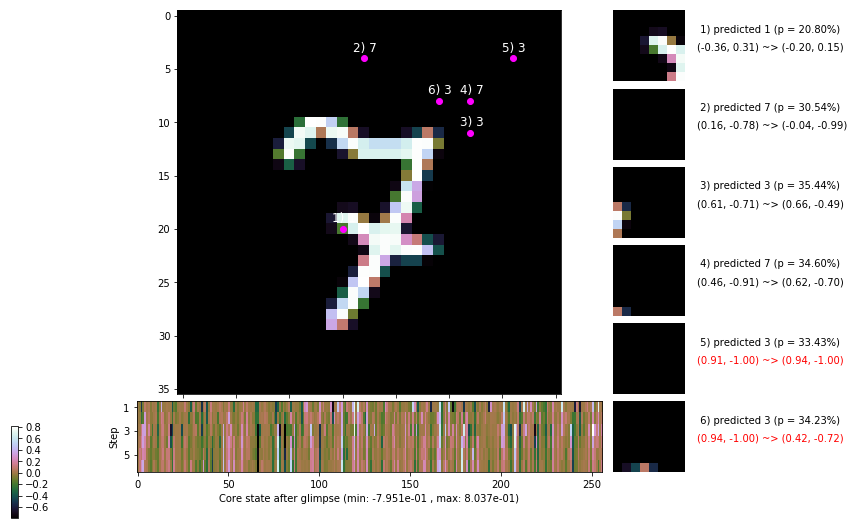

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 0 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


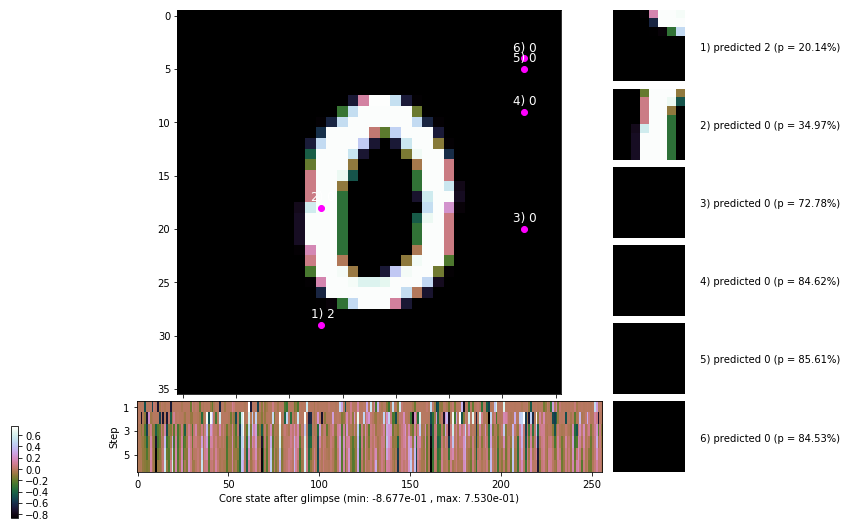


	Target class: 0 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


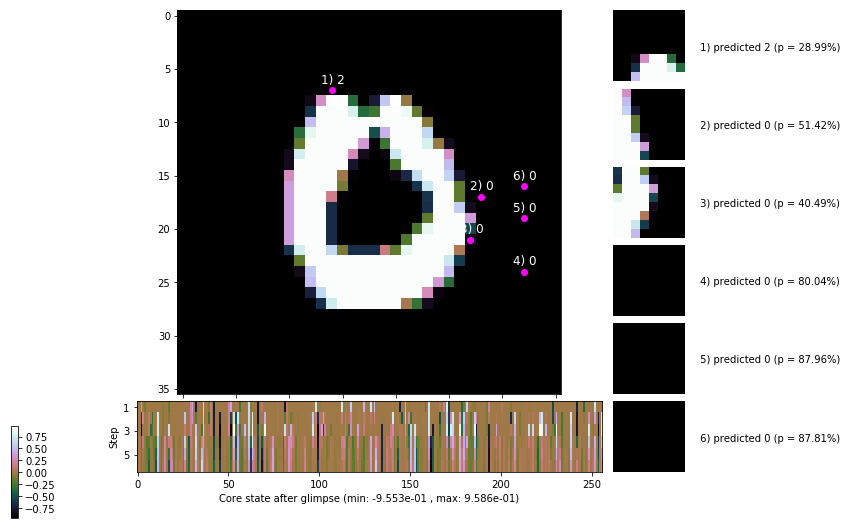

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


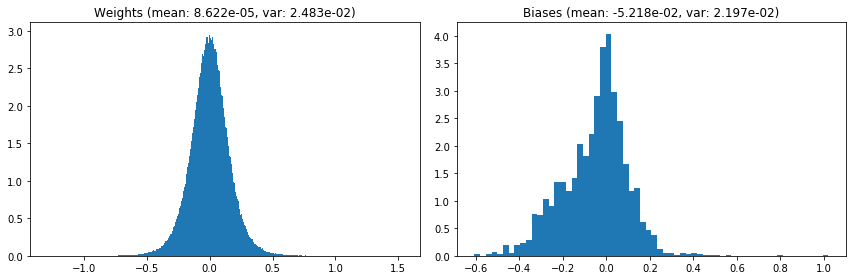

                                      Location network weights and biases


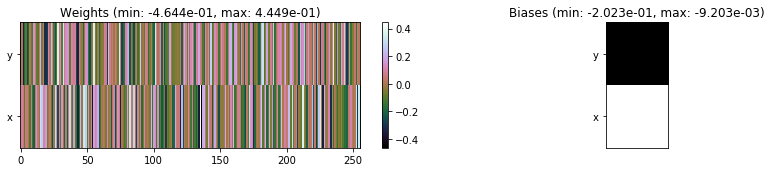

---------------------------------------------------------------------------------------------------------------
Elapsed time:  482.00 sec | TRAIN >> class loss: 0.7471 | steps:  2.759    | reward:  3.7135    | acc.: 74.462% 
                          | VAL   >> class loss: 0.7029 | steps:  2.666    | reward:  3.8283    | acc.: 75.340% 


Epoch   6/400) lr = 0.0009277
 b    300/  3000 >> 143.0 ms/b | lr: 9.27e-04 | grad 2norm: 12.98 | grad inf norm:  3.488
         Weights || abs max:  1.54 ( 6652.10) | mean:  6.39e-05 ( 0.03) | var: 2.50e-02 ( 2371.84)
          Biases || abs max:  1.03 (  191.58) | mean: -5.23e-02 ( 0.20) | var: 2.21e-02 (  230.99)
                    class loss: 0.758 | steps: 2.758 | reward:  3.726 | acc.: 74.65%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 140.6 ms/b | lr: 9.26e-04 | grad 2norm: 13.01 | grad inf norm:  3.292
         Weights || abs max:  1.55 (17018.67) | mean:  4.39e-05 ( 0.0

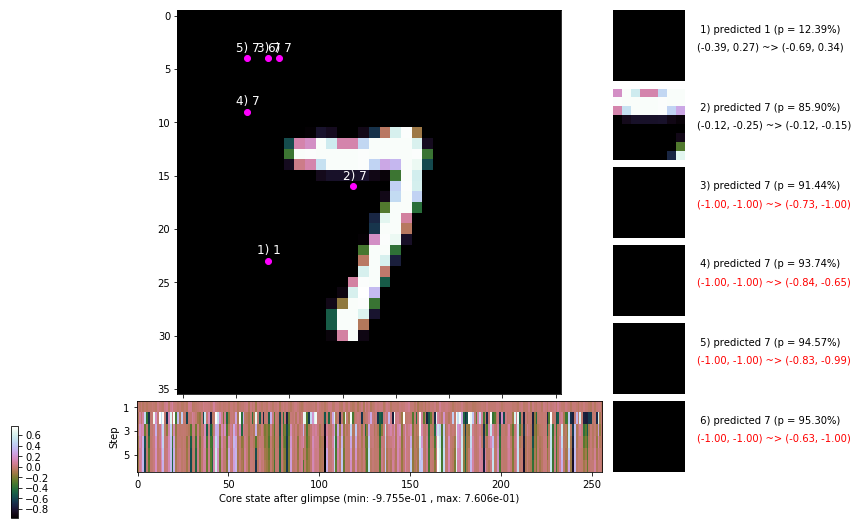

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 155.1 ms/b | lr: 9.24e-04 | grad 2norm: 13.10 | grad inf norm:  3.510
         Weights || abs max:  1.55 ( 3664.89) | mean:  4.54e-05 ( 0.02) | var: 2.55e-02 (  172.21)
          Biases || abs max:  1.03 (  204.60) | mean: -5.39e-02 ( 0.19) | var: 2.28e-02 (  623.58)
                    class loss: 0.747 | steps: 2.769 | reward:  3.721 | acc.: 74.97%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 161.2 ms/b | lr: 9.23e-04 | grad 2norm: 12.88 | grad inf norm:  3.290
         Weights || abs max:  1.55 ( 3562.54) | mean:  7.77e-05 ( 0.02) | var: 2.58e-02 (  145.29)
          Biases || abs max:  1.03 (  318.35) | mean: -5.43e-02 ( 0.24) | var: 2.32e-02 ( 3856.78)
                    class loss: 0.706 | steps: 2.731 | reward:  3.745 | acc.: 75.13%

	Target class: 7 | Discounted rewards: [0.075, 0.170, 0.3

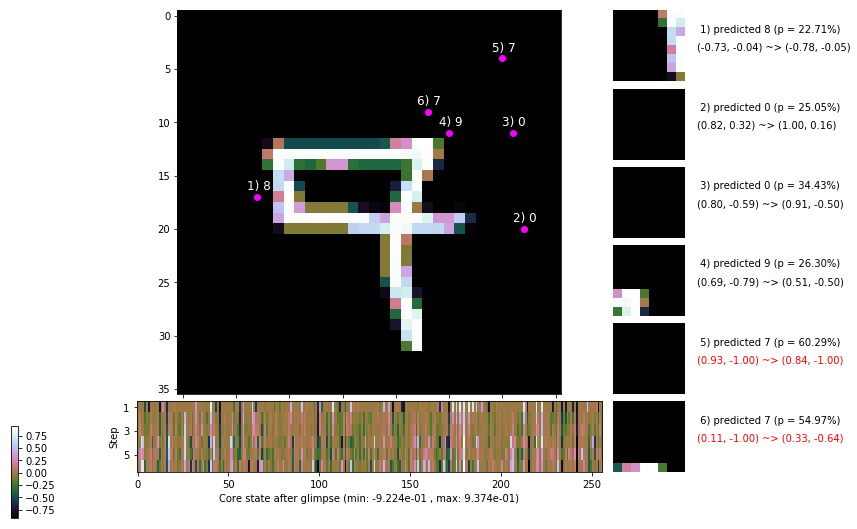

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 153.1 ms/b | lr: 9.21e-04 | grad 2norm: 12.99 | grad inf norm:  3.393
         Weights || abs max:  1.55 (90773.41) | mean:  8.30e-05 ( 0.18) | var: 2.60e-02 (4004361.00)
          Biases || abs max:  1.02 (  201.29) | mean: -5.58e-02 ( 0.19) | var: 2.36e-02 (  314.65)
                    class loss: 0.725 | steps: 2.727 | reward:  3.763 | acc.: 75.57%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 152.4 ms/b | lr: 9.20e-04 | grad 2norm: 12.86 | grad inf norm:  3.305
         Weights || abs max:  1.54 ( 4226.46) | mean:  1.08e-04 ( 0.02) | var: 2.63e-02 (  476.71)
          Biases || abs max:  1.02 (  212.65) | mean: -5.57e-02 ( 0.20) | var: 2.39e-02 (  343.77)
                    class loss: 0.700 | steps: 2.712 | reward:  3.783 | acc.: 75.85%

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1

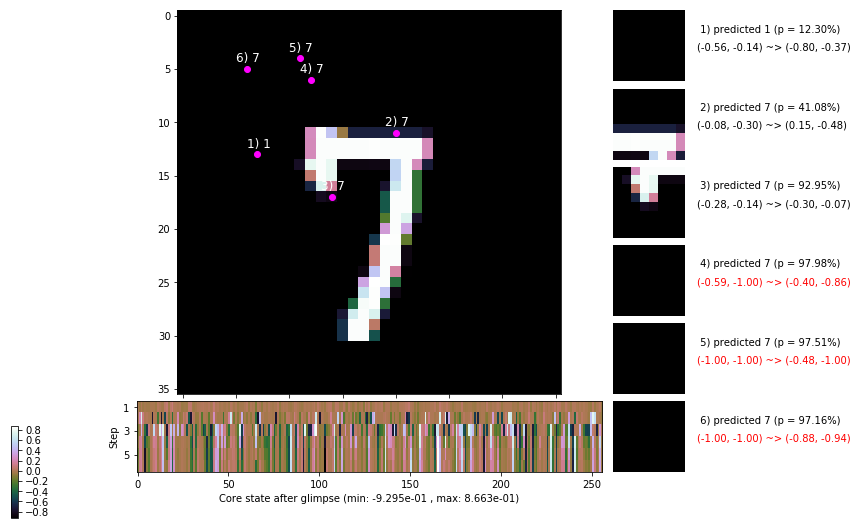

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 173.6 ms/b | lr: 9.18e-04 | grad 2norm: 13.07 | grad inf norm:  3.478
         Weights || abs max:  1.55 ( 5502.09) | mean:  1.57e-04 ( 0.02) | var: 2.65e-02 ( 3443.33)
          Biases || abs max:  1.02 (  200.04) | mean: -5.72e-02 ( 0.19) | var: 2.42e-02 (  755.95)
                    class loss: 0.766 | steps: 2.714 | reward:  3.722 | acc.: 74.38%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 139.5 ms/b | lr: 9.18e-04 | grad 2norm: 12.85 | grad inf norm:  3.279
         Weights || abs max:  1.57 ( 3875.74) | mean:  1.77e-04 ( 0.02) | var: 2.68e-02 (  236.80)
          Biases || abs max:  1.03 (  192.72) | mean: -5.73e-02 ( 0.18) | var: 2.46e-02 (  263.58)
                    class loss: 0.730 | steps: 2.688 | reward:  3.780 | acc.: 75.38%

	Target class: 8 | Discounted rewards: [0.959, 1.938, 1.8

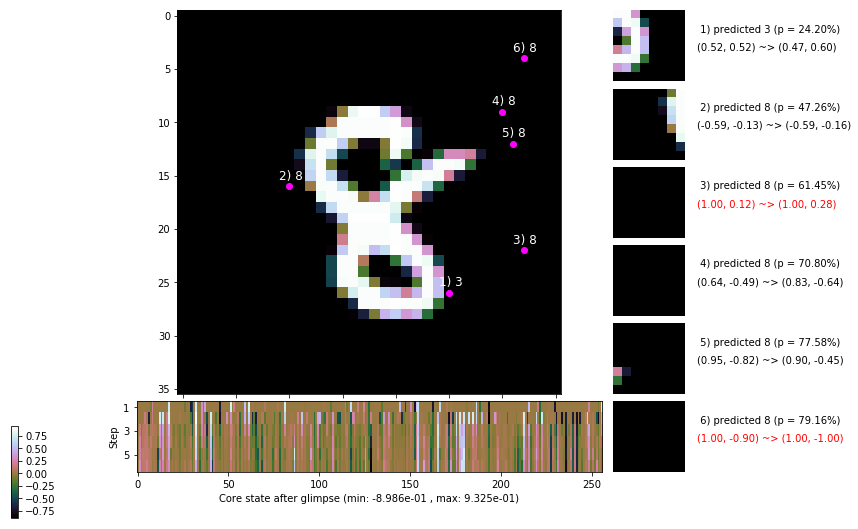

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 137.2 ms/b | lr: 9.16e-04 | grad 2norm: 12.84 | grad inf norm:  3.365
         Weights || abs max:  1.56 ( 4040.23) | mean:  1.46e-04 ( 0.02) | var: 2.71e-02 (  787.39)
          Biases || abs max:  1.02 (  340.02) | mean: -5.79e-02 ( 0.23) | var: 2.51e-02 ( 6102.26)
                    class loss: 0.741 | steps: 2.781 | reward:  3.698 | acc.: 74.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.2 ms/b | lr: 9.15e-04 | grad 2norm: 12.70 | grad inf norm:  3.253
         Weights || abs max:  1.58 ( 2283.38) | mean:  1.28e-04 ( 0.02) | var: 2.73e-02 (   37.22)
          Biases || abs max:  1.02 (  110.47) | mean: -5.85e-02 ( 0.14) | var: 2.55e-02 (   52.05)
                    class loss: 0.706 | steps: 2.672 | reward:  3.820 | acc.: 76.07%

	Target class: 6 | Discounted rewards: [0.454, 0.928, 1.8

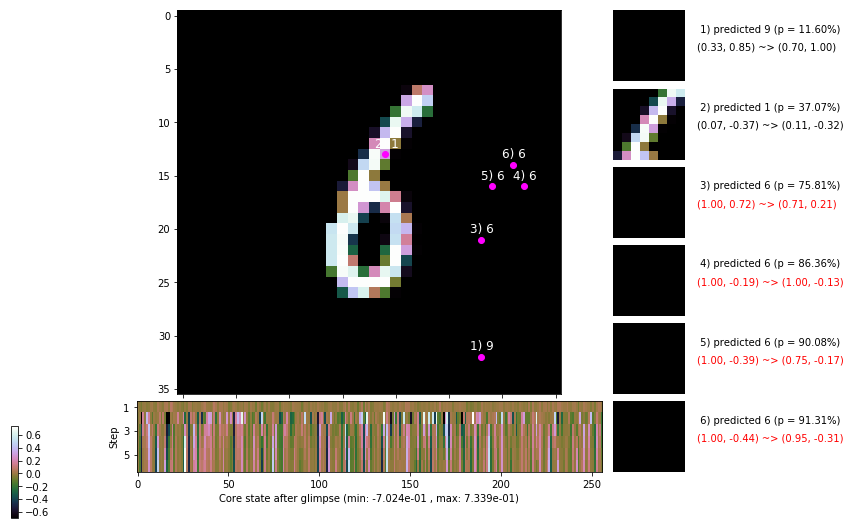

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 2 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


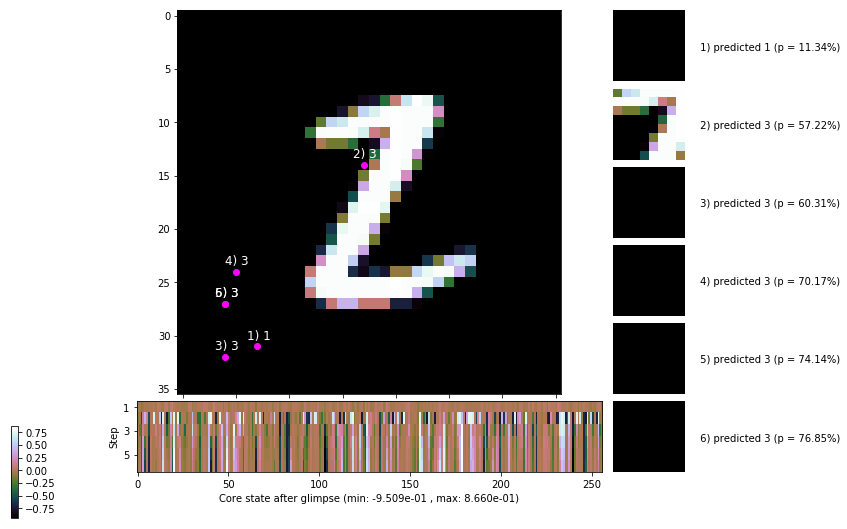


	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


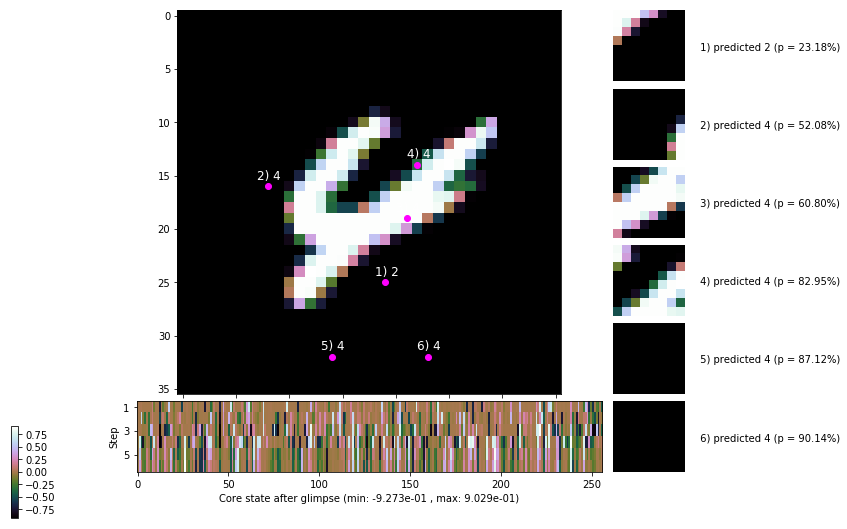

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


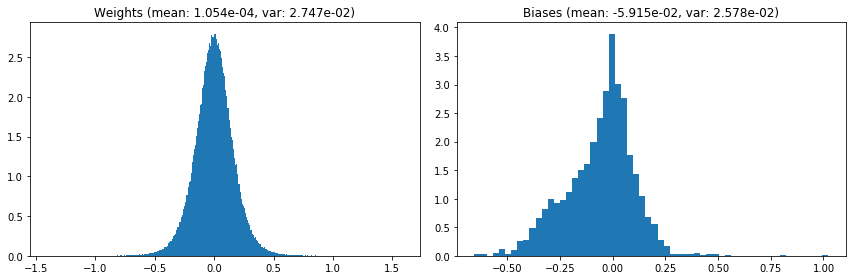

                                      Location network weights and biases


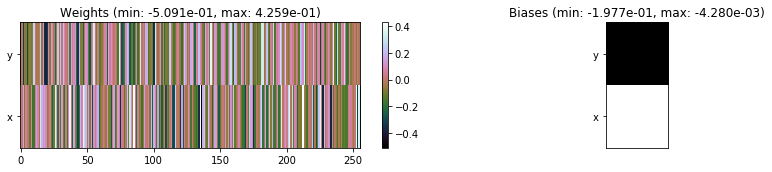

---------------------------------------------------------------------------------------------------------------
Elapsed time:  447.48 sec | TRAIN >> class loss: 0.7329 | steps:  2.730    | reward:  3.7491    | acc.: 75.090% 
                          | VAL   >> class loss: 0.6976 | steps:  2.612    | reward:  3.8925    | acc.: 76.100% 


Epoch   7/400) lr = 0.0009139
 b    300/  3000 >> 134.1 ms/b | lr: 9.13e-04 | grad 2norm: 12.98 | grad inf norm:  3.351
         Weights || abs max:  1.59 ( 2443.41) | mean:  1.01e-04 ( 0.02) | var: 2.76e-02 (   64.07)
          Biases || abs max:  1.02 (  188.51) | mean: -5.99e-02 ( 0.19) | var: 2.59e-02 (  196.60)
                    class loss: 0.719 | steps: 2.699 | reward:  3.756 | acc.: 75.08%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 141.0 ms/b | lr: 9.12e-04 | grad 2norm: 13.11 | grad inf norm:  3.465
         Weights || abs max:  1.59 ( 8294.91) | mean:  1.07e-04 ( 0.0

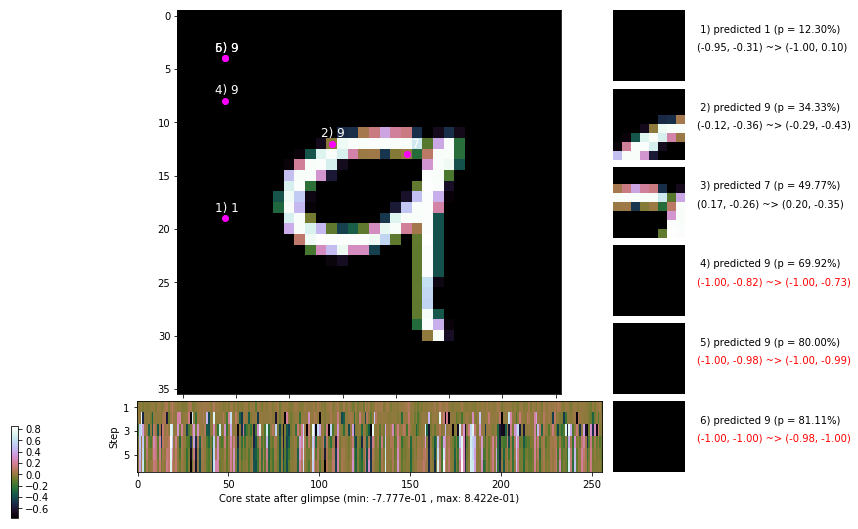

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 140.9 ms/b | lr: 9.10e-04 | grad 2norm: 13.09 | grad inf norm:  3.258
         Weights || abs max:  1.58 ( 3962.65) | mean:  1.07e-04 ( 0.02) | var: 2.81e-02 (  408.12)
          Biases || abs max:  1.02 (  265.18) | mean: -6.12e-02 ( 0.21) | var: 2.67e-02 ( 1510.16)
                    class loss: 0.707 | steps: 2.678 | reward:  3.785 | acc.: 76.22%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 136.5 ms/b | lr: 9.09e-04 | grad 2norm: 13.04 | grad inf norm:  3.363
         Weights || abs max:  1.57 ( 2855.06) | mean:  1.11e-04 ( 0.02) | var: 2.83e-02 (  144.48)
          Biases || abs max:  1.03 (  255.35) | mean: -6.18e-02 ( 0.19) | var: 2.70e-02 ( 2046.58)
                    class loss: 0.681 | steps: 2.654 | reward:  3.816 | acc.: 77.10%

	Target class: 9 | Discounted rewards: [0.454, 0.928, 1.8

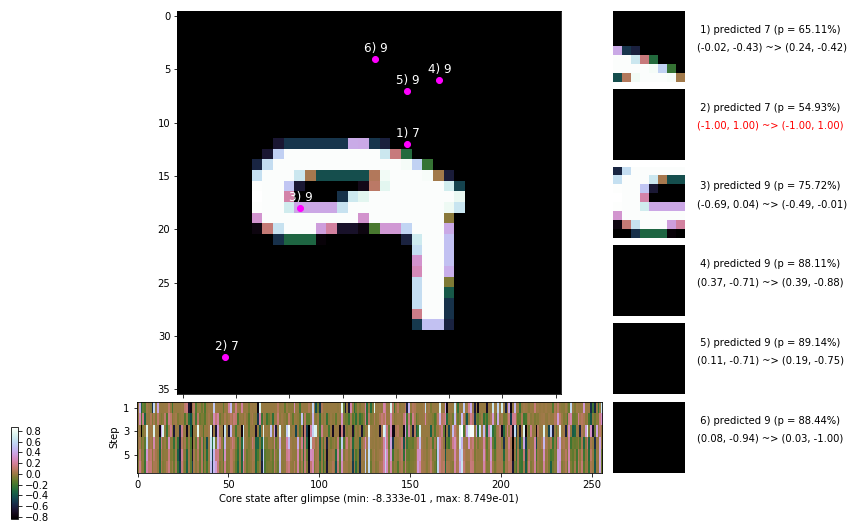

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 139.3 ms/b | lr: 9.08e-04 | grad 2norm: 13.05 | grad inf norm:  3.398
         Weights || abs max:  1.55 ( 4202.26) | mean:  9.13e-05 ( 0.02) | var: 2.86e-02 (  688.54)
          Biases || abs max:  1.03 ( 1575.34) | mean: -6.25e-02 ( 0.70) | var: 2.73e-02 (252208.08)
                    class loss: 0.676 | steps: 2.689 | reward:  3.798 | acc.: 76.62%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 149.0 ms/b | lr: 9.07e-04 | grad 2norm: 13.00 | grad inf norm:  3.416
         Weights || abs max:  1.56 ( 3559.87) | mean:  7.64e-05 ( 0.02) | var: 2.88e-02 (  222.19)
          Biases || abs max:  1.04 (  104.21) | mean: -6.33e-02 ( 0.14) | var: 2.76e-02 (   32.94)
                    class loss: 0.660 | steps: 2.630 | reward:  3.866 | acc.: 77.37%

	Target class: 2 | Discounted rewards: [0.959, 1.938, 1.

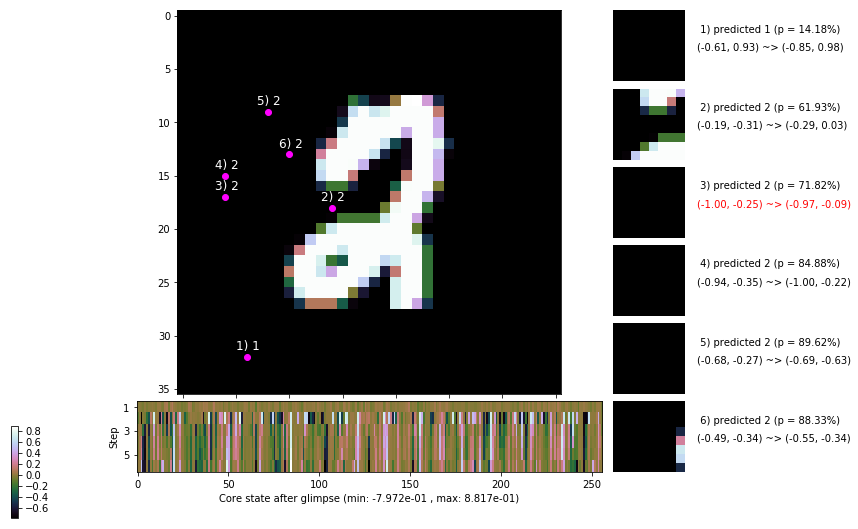

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 164.8 ms/b | lr: 9.05e-04 | grad 2norm: 12.98 | grad inf norm:  3.330
         Weights || abs max:  1.56 ( 7266.68) | mean:  7.26e-05 ( 0.03) | var: 2.90e-02 ( 4242.06)
          Biases || abs max:  1.04 (  885.46) | mean: -6.40e-02 ( 0.43) | var: 2.79e-02 (71299.95)
                    class loss: 0.673 | steps: 2.673 | reward:  3.828 | acc.: 76.82%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 156.8 ms/b | lr: 9.04e-04 | grad 2norm: 12.90 | grad inf norm:  3.376
         Weights || abs max:  1.55 ( 3686.71) | mean:  3.64e-05 ( 0.02) | var: 2.92e-02 (  550.12)
          Biases || abs max:  1.04 (  103.52) | mean: -6.49e-02 ( 0.12) | var: 2.83e-02 (   25.19)
                    class loss: 0.672 | steps: 2.669 | reward:  3.832 | acc.: 76.58%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

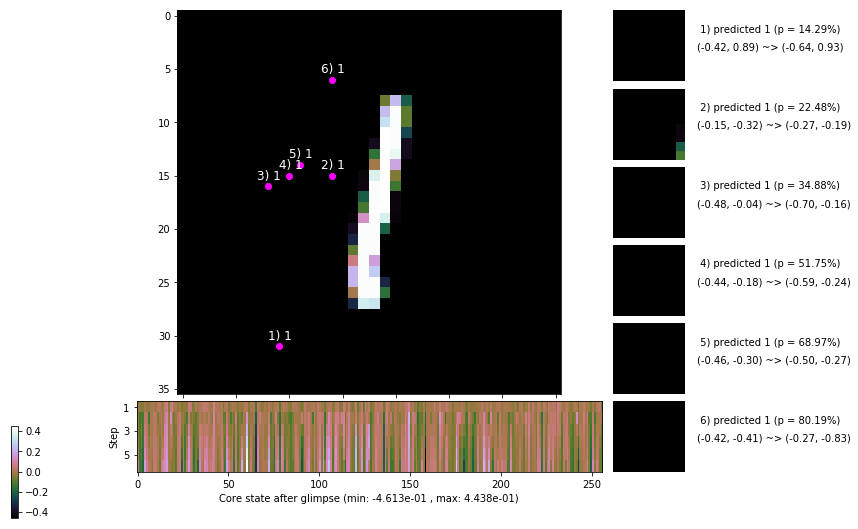

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 156.6 ms/b | lr: 9.02e-04 | grad 2norm: 13.03 | grad inf norm:  3.397
         Weights || abs max:  1.56 ( 2568.42) | mean: -3.12e-06 ( 0.02) | var: 2.95e-02 (  104.09)
          Biases || abs max:  1.04 (  180.49) | mean: -6.56e-02 ( 0.15) | var: 2.86e-02 (  453.80)
                    class loss: 0.678 | steps: 2.695 | reward:  3.793 | acc.: 76.28%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 140.9 ms/b | lr: 9.01e-04 | grad 2norm: 12.82 | grad inf norm:  3.331
         Weights || abs max:  1.56 ( 3619.89) | mean: -1.71e-05 ( 0.02) | var: 2.97e-02 (  195.65)
          Biases || abs max:  1.05 (  213.35) | mean: -6.59e-02 ( 0.17) | var: 2.89e-02 (  390.66)
                    class loss: 0.645 | steps: 2.660 | reward:  3.861 | acc.: 77.58%

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.8

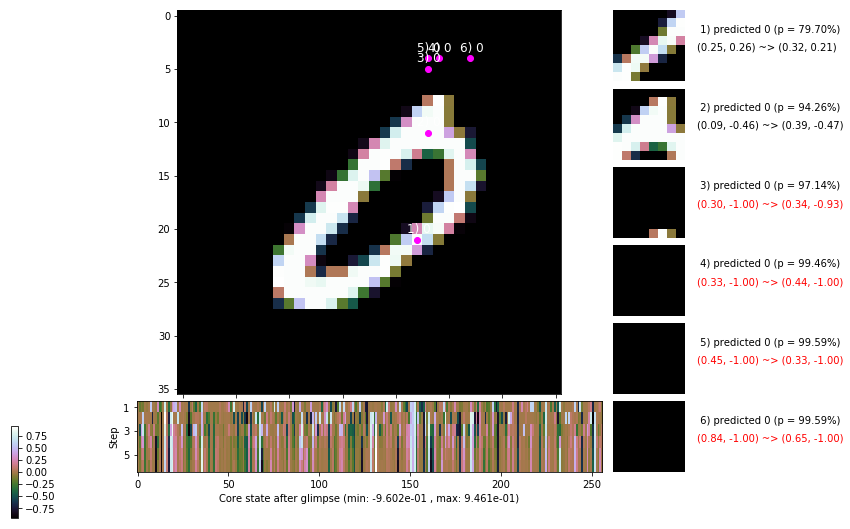

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 6 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


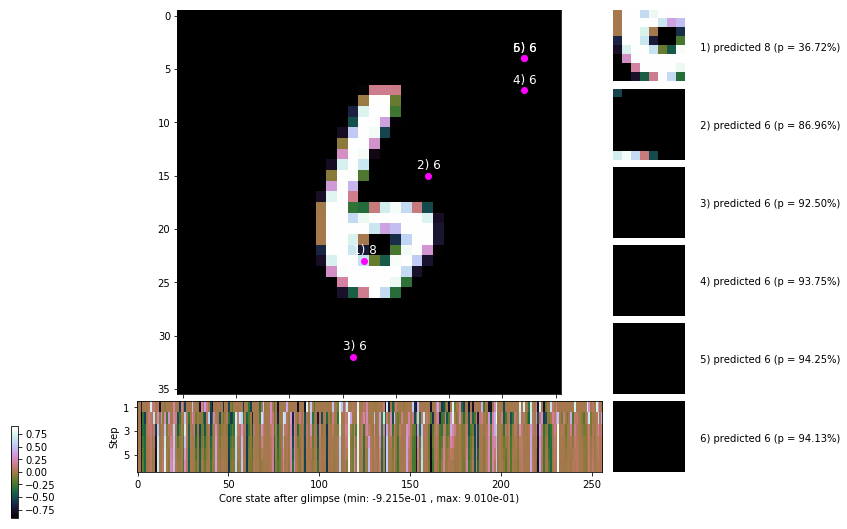


	Target class: 6 | Discounted rewards: [0.170, 0.359, 0.739, 1.497, 0.995, -0.010]


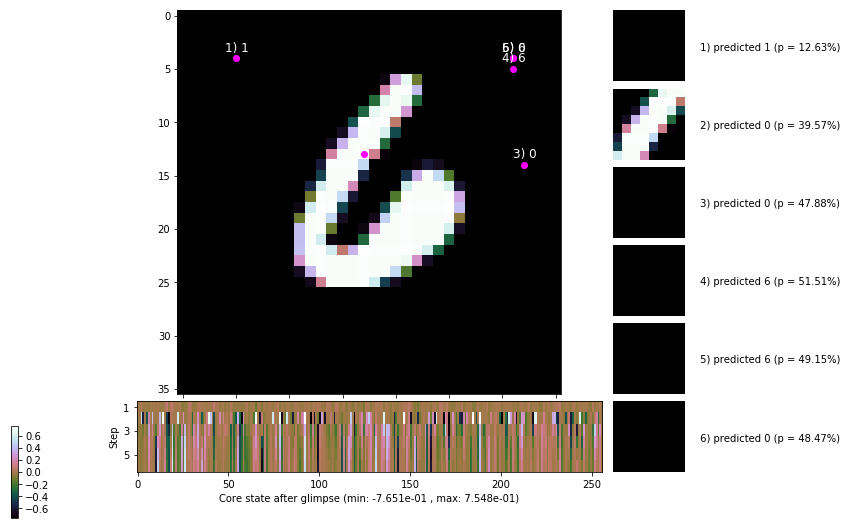

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


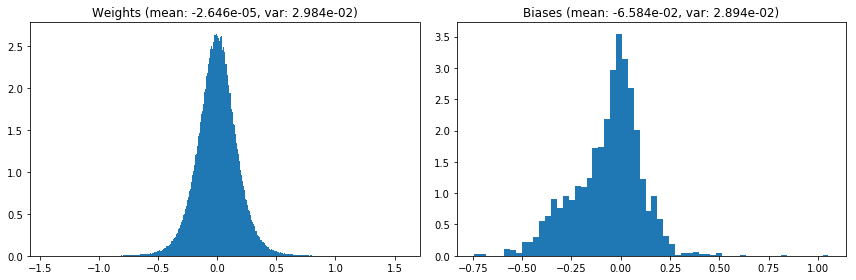

                                      Location network weights and biases


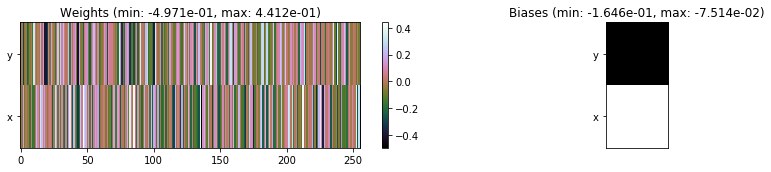

---------------------------------------------------------------------------------------------------------------
Elapsed time:  438.70 sec | TRAIN >> class loss: 0.6812 | steps:  2.673    | reward:  3.8133    | acc.: 76.533% 
                          | VAL   >> class loss: 0.6558 | steps:  2.576    | reward:  3.9626    | acc.: 77.660% 


Epoch   8/400) lr = 0.0009003
 b    300/  3000 >> 168.2 ms/b | lr: 8.99e-04 | grad 2norm: 12.85 | grad inf norm:  3.243
         Weights || abs max:  1.57 ( 7657.55) | mean: -2.92e-05 ( 0.03) | var: 3.00e-02 ( 6156.37)
          Biases || abs max:  1.06 (  238.22) | mean: -6.58e-02 ( 0.21) | var: 2.91e-02 (  379.22)
                    class loss: 0.640 | steps: 2.619 | reward:  3.887 | acc.: 78.12%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 150.8 ms/b | lr: 8.98e-04 | grad 2norm: 13.12 | grad inf norm:  3.317
         Weights || abs max:  1.57 ( 5582.68) | mean:  3.06e-06 ( 0.0

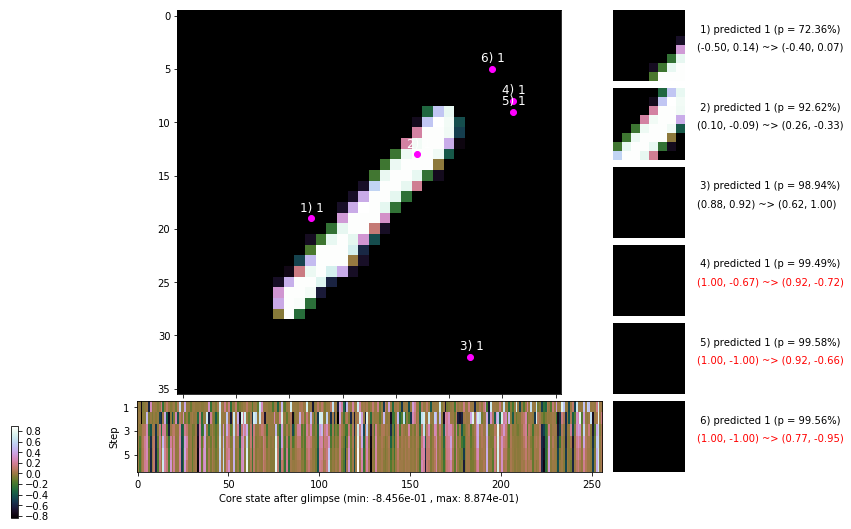

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 152.2 ms/b | lr: 8.97e-04 | grad 2norm: 13.09 | grad inf norm:  3.340
         Weights || abs max:  1.56 ( 3358.78) | mean: -1.18e-05 ( 0.02) | var: 3.04e-02 (  158.42)
          Biases || abs max:  1.07 (  119.26) | mean: -6.74e-02 ( 0.12) | var: 2.98e-02 (  124.39)
                    class loss: 0.623 | steps: 2.599 | reward:  3.909 | acc.: 78.30%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 150.5 ms/b | lr: 8.96e-04 | grad 2norm: 13.37 | grad inf norm:  3.482
         Weights || abs max:  1.57 ( 4062.98) | mean: -1.89e-05 ( 0.02) | var: 3.06e-02 (  222.95)
          Biases || abs max:  1.07 ( 1893.86) | mean: -6.85e-02 ( 0.81) | var: 3.03e-02 (328881.59)
                    class loss: 0.661 | steps: 2.650 | reward:  3.841 | acc.: 77.10%

	Target class: 5 | Discounted rewards: [0.454, 0.928, 1.

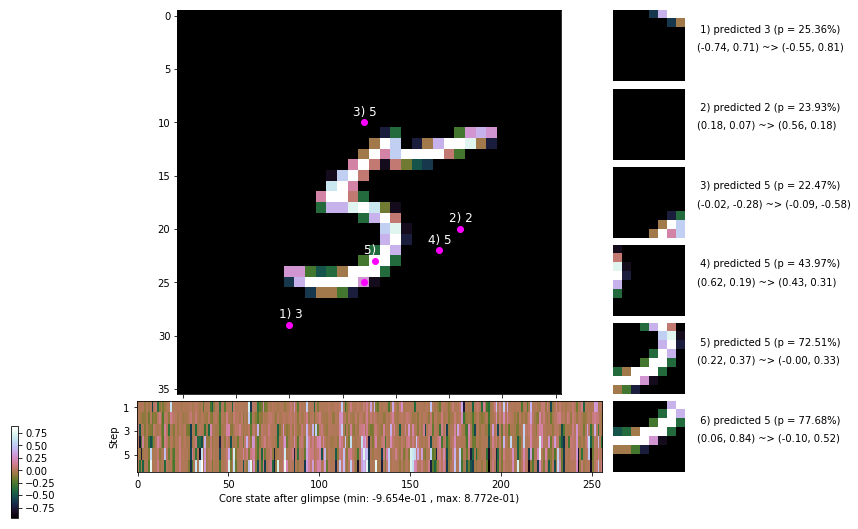

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 155.3 ms/b | lr: 8.94e-04 | grad 2norm: 12.67 | grad inf norm:  3.161
         Weights || abs max:  1.58 ( 7575.00) | mean:  7.82e-06 ( 0.03) | var: 3.09e-02 ( 2319.08)
          Biases || abs max:  1.07 (  148.41) | mean: -6.88e-02 ( 0.14) | var: 3.06e-02 (  388.17)
                    class loss: 0.615 | steps: 2.607 | reward:  3.930 | acc.: 79.17%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 139.8 ms/b | lr: 8.93e-04 | grad 2norm: 12.97 | grad inf norm:  3.329
         Weights || abs max:  1.59 ( 3843.78) | mean:  5.10e-05 ( 0.02) | var: 3.11e-02 (  459.01)
          Biases || abs max:  1.07 (  261.46) | mean: -7.01e-02 ( 0.21) | var: 3.11e-02 ( 1754.20)
                    class loss: 0.637 | steps: 2.626 | reward:  3.905 | acc.: 78.52%

	Target class: 3 | Discounted rewards: [0.927, 1.874, 1.7

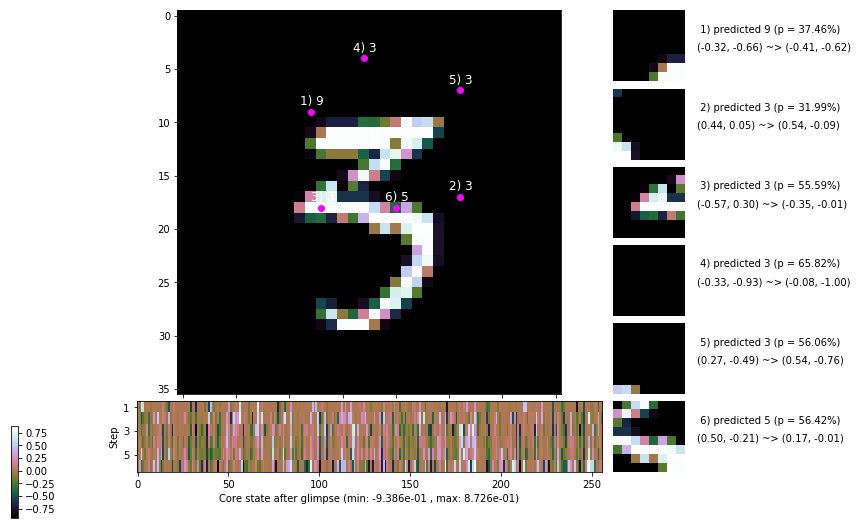

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 131.0 ms/b | lr: 8.91e-04 | grad 2norm: 13.11 | grad inf norm:  3.374
         Weights || abs max:  1.61 ( 6151.74) | mean:  9.22e-05 ( 0.02) | var: 3.13e-02 ( 2078.40)
          Biases || abs max:  1.07 (  124.00) | mean: -7.05e-02 ( 0.13) | var: 3.15e-02 (   95.33)
                    class loss: 0.628 | steps: 2.640 | reward:  3.879 | acc.: 78.57%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 132.6 ms/b | lr: 8.90e-04 | grad 2norm: 12.78 | grad inf norm:  3.296
         Weights || abs max:  1.65 ( 2519.72) | mean:  1.25e-04 ( 0.02) | var: 3.15e-02 (   85.46)
          Biases || abs max:  1.07 (  230.62) | mean: -7.13e-02 ( 0.17) | var: 3.18e-02 (  996.33)
                    class loss: 0.604 | steps: 2.582 | reward:  3.972 | acc.: 79.78%

	Target class: 6 | Discounted rewards: [0.959, 1.938, 1.8

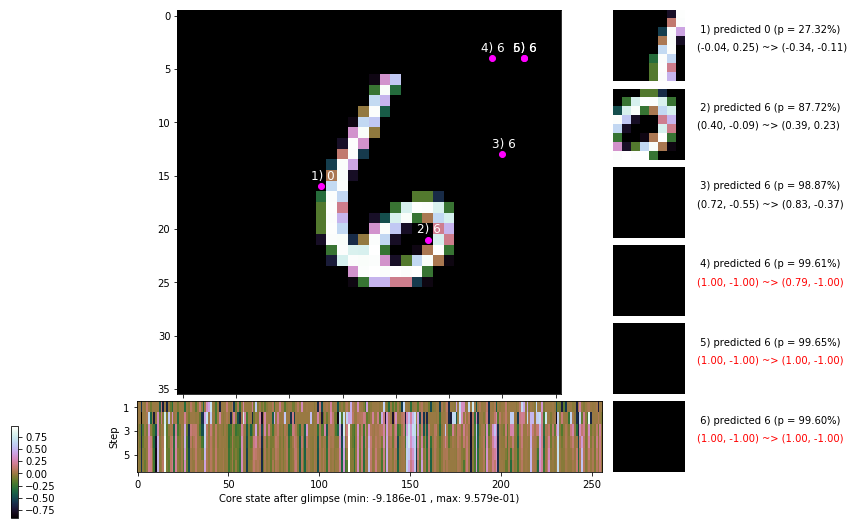

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 149.0 ms/b | lr: 8.89e-04 | grad 2norm: 12.87 | grad inf norm:  3.159
         Weights || abs max:  1.68 ( 4140.39) | mean:  1.67e-04 ( 0.02) | var: 3.17e-02 (  476.19)
          Biases || abs max:  1.07 (  251.22) | mean: -7.20e-02 ( 0.20) | var: 3.21e-02 (  622.46)
                    class loss: 0.622 | steps: 2.622 | reward:  3.911 | acc.: 78.80%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 149.6 ms/b | lr: 8.88e-04 | grad 2norm: 12.95 | grad inf norm:  3.375
         Weights || abs max:  1.70 (18027.90) | mean:  1.74e-04 ( 0.05) | var: 3.20e-02 (63638.26)
          Biases || abs max:  1.08 (  129.36) | mean: -7.23e-02 ( 0.13) | var: 3.24e-02 (  123.04)
                    class loss: 0.613 | steps: 2.605 | reward:  3.924 | acc.: 79.27%

	Target class: 4 | Discounted rewards: [0.422, 0.864, 1.7

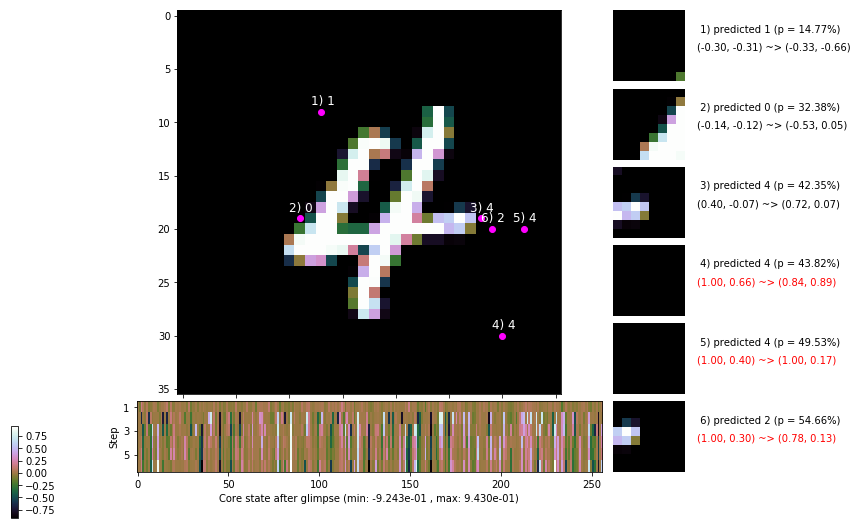

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 6 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


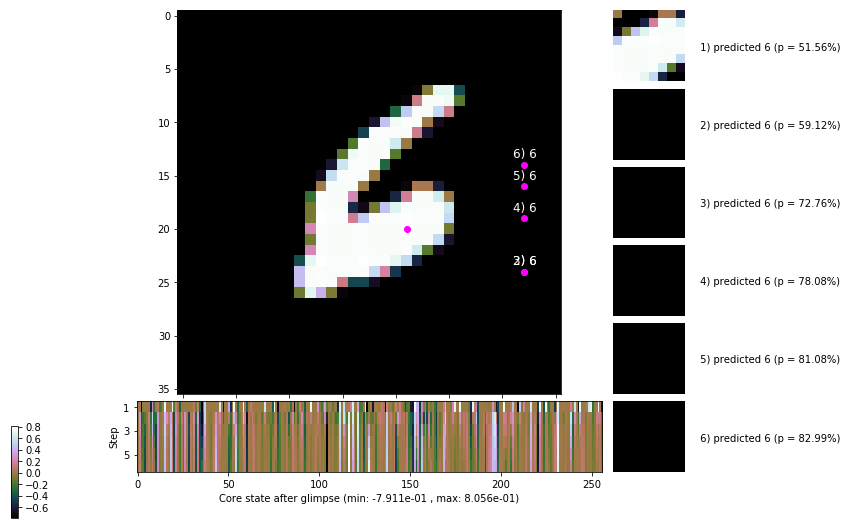


	Target class: 8 | Discounted rewards: [0.107, 0.233, 0.486, 0.993, -0.015, -0.010]


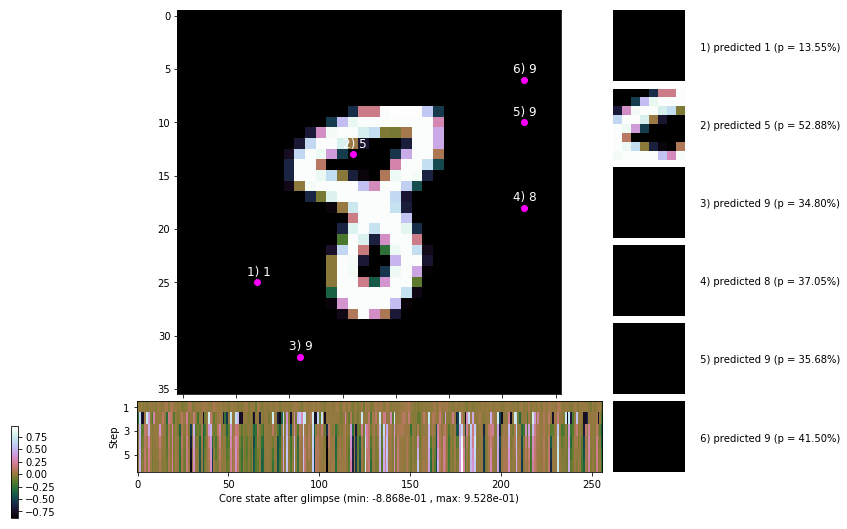

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


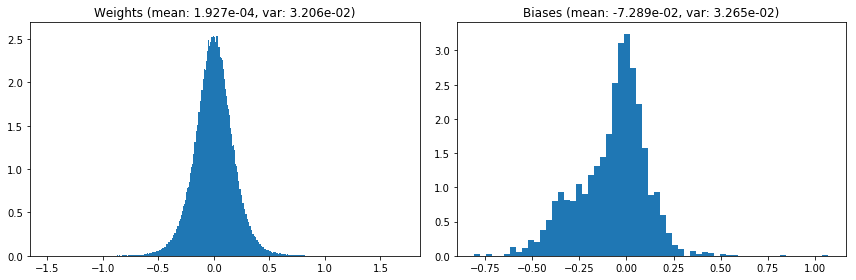

                                      Location network weights and biases


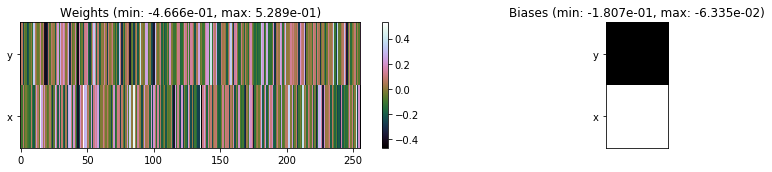

---------------------------------------------------------------------------------------------------------------
Elapsed time:  444.32 sec | TRAIN >> class loss: 0.6309 | steps:  2.621    | reward:  3.9001    | acc.: 78.453% 
                          | VAL   >> class loss: 0.6133 | steps:  2.535    | reward:  4.0289    | acc.: 78.820% 


Epoch   9/400) lr = 0.0008869
 b    300/  3000 >> 135.1 ms/b | lr: 8.86e-04 | grad 2norm: 12.76 | grad inf norm:  3.125
         Weights || abs max:  1.71 ( 4648.99) | mean:  1.76e-04 ( 0.02) | var: 3.22e-02 ( 1476.17)
          Biases || abs max:  1.07 (  192.37) | mean: -7.32e-02 ( 0.16) | var: 3.28e-02 (  246.28)
                    class loss: 0.621 | steps: 2.615 | reward:  3.906 | acc.: 78.35%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 154.2 ms/b | lr: 8.85e-04 | grad 2norm: 12.63 | grad inf norm:  3.194
         Weights || abs max:  1.73 ( 2419.34) | mean:  1.29e-04 ( 0.0

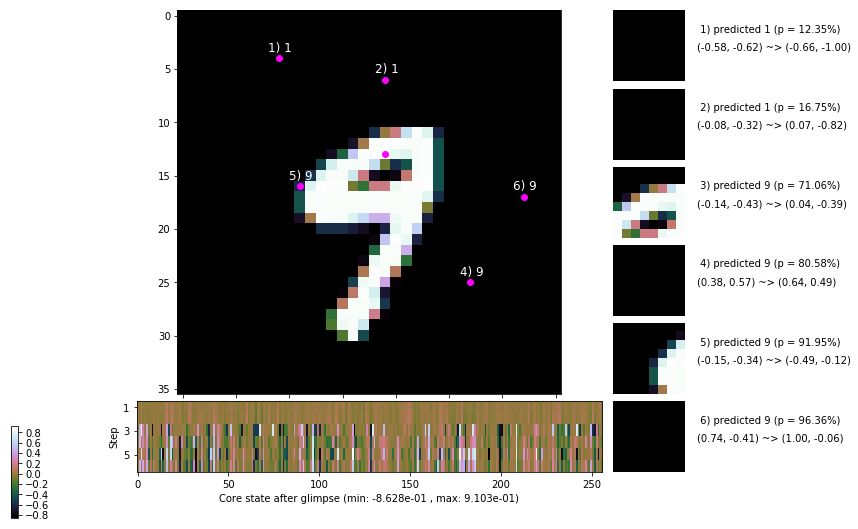

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 163.2 ms/b | lr: 8.83e-04 | grad 2norm: 12.81 | grad inf norm:  3.398
         Weights || abs max:  1.73 ( 4847.35) | mean:  1.77e-04 ( 0.02) | var: 3.26e-02 (  772.54)
          Biases || abs max:  1.09 (   90.23) | mean: -7.41e-02 ( 0.11) | var: 3.37e-02 (   29.36)
                    class loss: 0.612 | steps: 2.577 | reward:  3.954 | acc.: 79.07%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 140.5 ms/b | lr: 8.82e-04 | grad 2norm: 12.58 | grad inf norm:  3.281
         Weights || abs max:  1.71 ( 7093.67) | mean:  2.29e-04 ( 0.03) | var: 3.28e-02 ( 2220.60)
          Biases || abs max:  1.09 (  252.03) | mean: -7.50e-02 ( 0.22) | var: 3.41e-02 ( 1854.79)
                    class loss: 0.633 | steps: 2.598 | reward:  3.934 | acc.: 78.73%

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.8

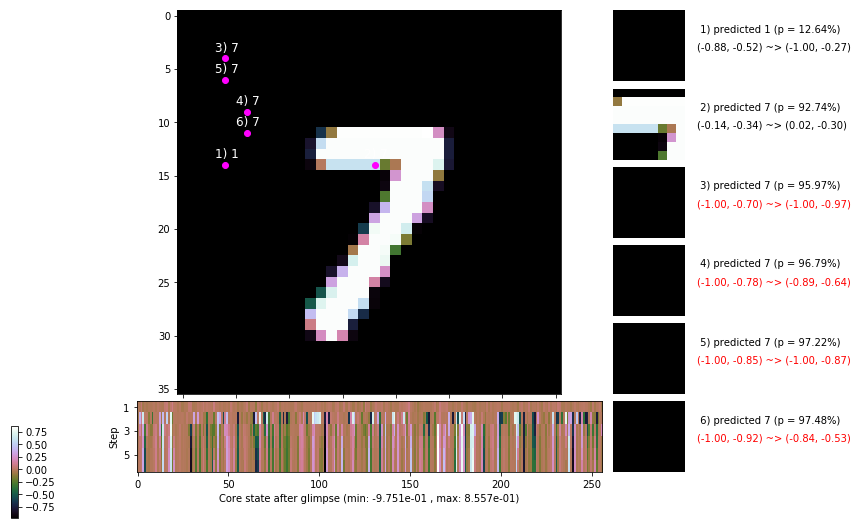

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 151.9 ms/b | lr: 8.81e-04 | grad 2norm: 12.71 | grad inf norm:  3.337
         Weights || abs max:  1.70 ( 4453.59) | mean:  2.40e-04 ( 0.02) | var: 3.30e-02 (  577.90)
          Biases || abs max:  1.09 (  227.64) | mean: -7.47e-02 ( 0.18) | var: 3.41e-02 (  679.29)
                    class loss: 0.609 | steps: 2.623 | reward:  3.934 | acc.: 79.40%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 134.3 ms/b | lr: 8.80e-04 | grad 2norm: 12.88 | grad inf norm:  3.369
         Weights || abs max:  1.71 ( 2943.74) | mean:  2.20e-04 ( 0.02) | var: 3.32e-02 (  122.04)
          Biases || abs max:  1.08 (  230.58) | mean: -7.63e-02 ( 0.16) | var: 3.46e-02 ( 2196.28)
                    class loss: 0.628 | steps: 2.622 | reward:  3.891 | acc.: 78.55%

	Target class: 9 | Discounted rewards: [1.969, 1.938, 1.8

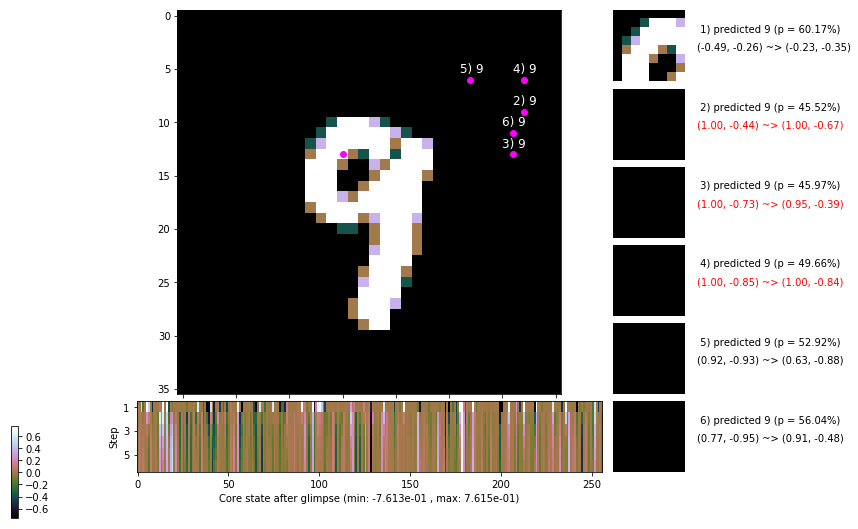

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 140.3 ms/b | lr: 8.78e-04 | grad 2norm: 12.93 | grad inf norm:  3.302
         Weights || abs max:  1.73 ( 6064.06) | mean:  1.93e-04 ( 0.02) | var: 3.35e-02 ( 1802.56)
          Biases || abs max:  1.09 ( 1636.28) | mean: -7.67e-02 ( 1.32) | var: 3.48e-02 (528415.38)
                    class loss: 0.631 | steps: 2.595 | reward:  3.943 | acc.: 78.92%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 139.5 ms/b | lr: 8.77e-04 | grad 2norm: 12.58 | grad inf norm:  3.138
         Weights || abs max:  1.77 ( 6375.75) | mean:  2.14e-04 ( 0.02) | var: 3.37e-02 ( 2011.20)
          Biases || abs max:  1.09 (   92.49) | mean: -7.76e-02 ( 0.12) | var: 3.53e-02 (   30.36)
                    class loss: 0.619 | steps: 2.557 | reward:  3.968 | acc.: 79.77%

	Target class: 6 | Discounted rewards: [0.959, 1.938, 1.

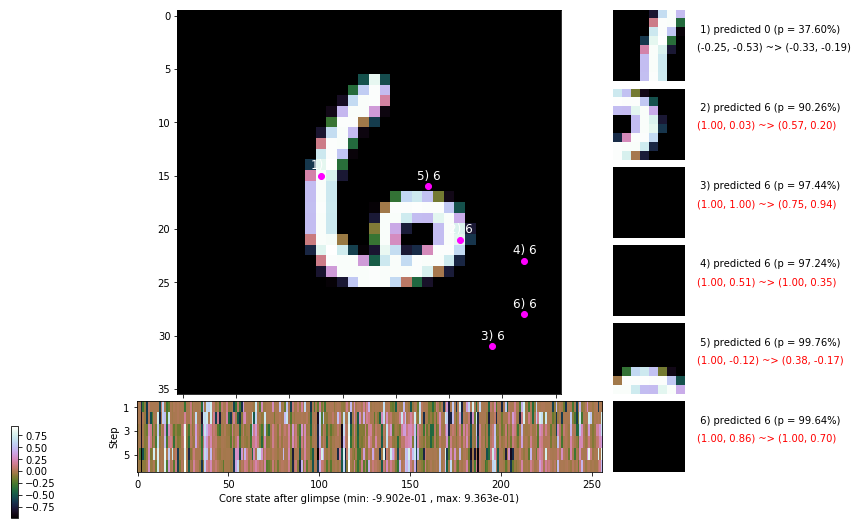

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 145.3 ms/b | lr: 8.75e-04 | grad 2norm: 12.64 | grad inf norm:  3.247
         Weights || abs max:  1.78 (2943551.25) | mean:  2.20e-04 ( 5.42) | var: 3.39e-02 (4771201536.00)
          Biases || abs max:  1.08 (  135.83) | mean: -7.82e-02 ( 0.12) | var: 3.56e-02 (  212.48)
                    class loss: 0.621 | steps: 2.606 | reward:  3.934 | acc.: 79.05%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.9 ms/b | lr: 8.75e-04 | grad 2norm: 12.97 | grad inf norm:  3.337
         Weights || abs max:  1.78 ( 5596.65) | mean:  2.31e-04 ( 0.02) | var: 3.41e-02 ( 1725.04)
          Biases || abs max:  1.09 (  128.92) | mean: -7.80e-02 ( 0.15) | var: 3.59e-02 (  170.69)
                    class loss: 0.603 | steps: 2.567 | reward:  3.977 | acc.: 79.43%

	Target class: 7 | Discounted rewards: [0.959, 1.9

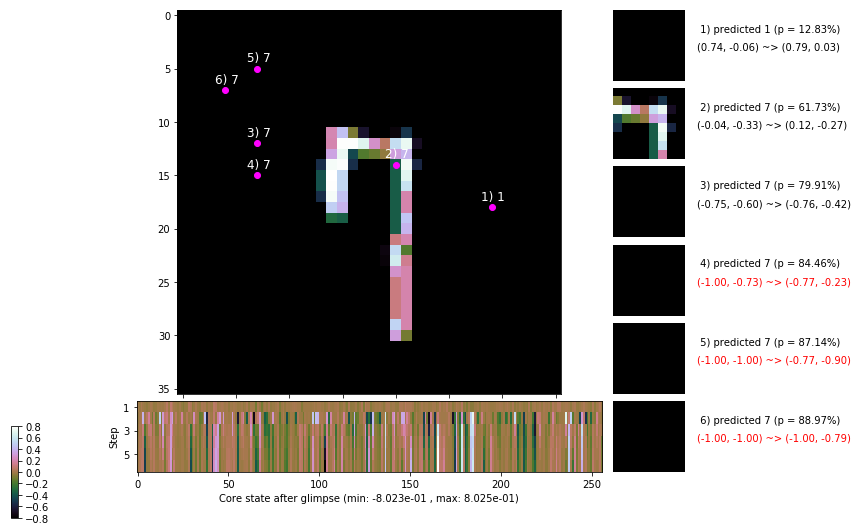

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 4 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


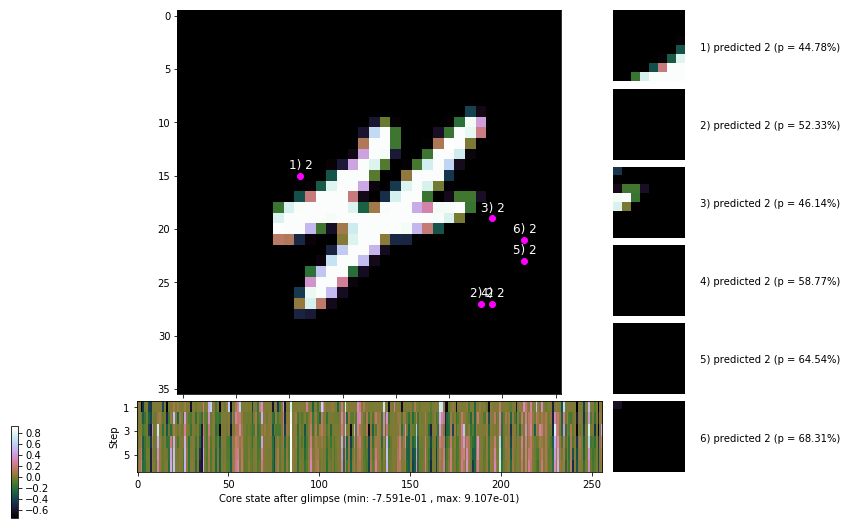


	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


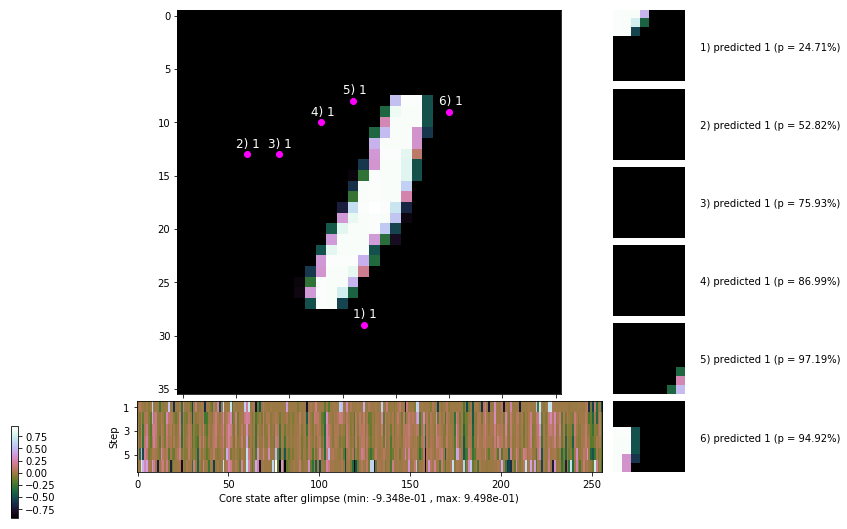

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


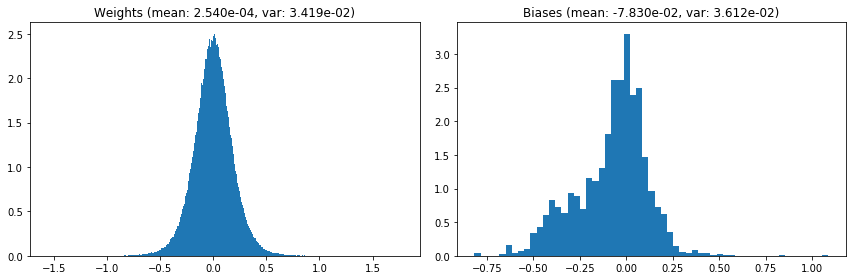

                                      Location network weights and biases


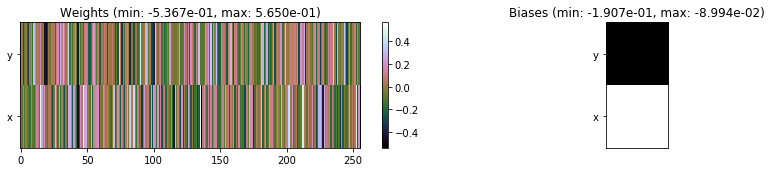

---------------------------------------------------------------------------------------------------------------
Elapsed time:  434.40 sec | TRAIN >> class loss: 0.6172 | steps:  2.591    | reward:  3.9439    | acc.: 79.110% 
                          | VAL   >> class loss: 0.6469 | steps:  2.561 :( | reward:  3.9826 :( | acc.: 77.720% :(


Epoch  10/400) lr = 0.0008737
 b    300/  3000 >> 148.5 ms/b | lr: 8.73e-04 | grad 2norm: 12.69 | grad inf norm:  3.311
         Weights || abs max:  1.77 ( 5098.43) | mean:  2.22e-04 ( 0.02) | var: 3.43e-02 (  999.55)
          Biases || abs max:  1.09 (  226.63) | mean: -7.87e-02 ( 0.19) | var: 3.63e-02 (  573.14)
                    class loss: 0.637 | steps: 2.607 | reward:  3.946 | acc.: 78.80%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 132.4 ms/b | lr: 8.72e-04 | grad 2norm: 12.83 | grad inf norm:  3.303
         Weights || abs max:  1.77 ( 4280.02) | mean:  1.54e-04 ( 0

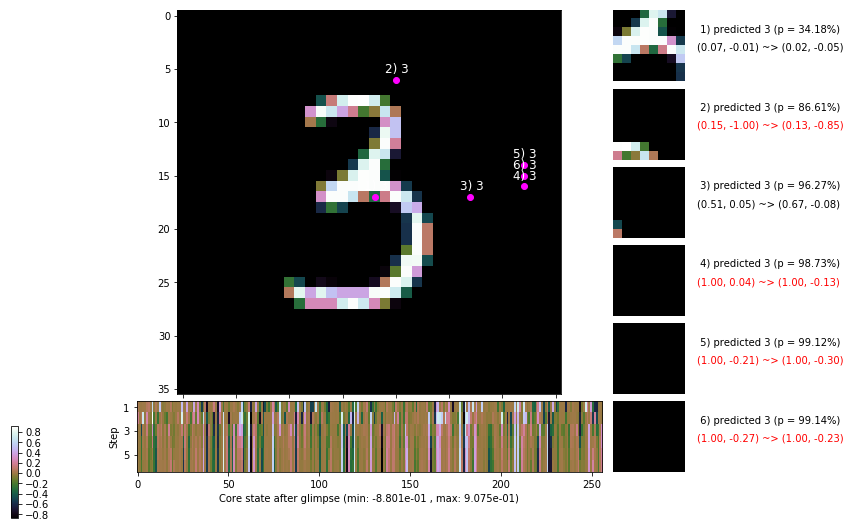

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 135.9 ms/b | lr: 8.70e-04 | grad 2norm: 12.64 | grad inf norm:  3.447
         Weights || abs max:  1.77 (17547.75) | mean:  1.54e-04 ( 0.04) | var: 3.47e-02 (83338.58)
          Biases || abs max:  1.08 (  192.79) | mean: -7.97e-02 ( 0.17) | var: 3.70e-02 (  298.50)
                    class loss: 0.639 | steps: 2.607 | reward:  3.925 | acc.: 78.38%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 143.0 ms/b | lr: 8.69e-04 | grad 2norm: 12.67 | grad inf norm:  3.406
         Weights || abs max:  1.77 (24730.01) | mean:  1.33e-04 ( 0.06) | var: 3.49e-02 (180468.22)
          Biases || abs max:  1.08 (  329.69) | mean: -8.06e-02 ( 0.22) | var: 3.75e-02 ( 1893.95)
                    class loss: 0.653 | steps: 2.642 | reward:  3.889 | acc.: 78.07%

	Target class: 3 | Discounted rewards: [0.959, 1.938, 1.

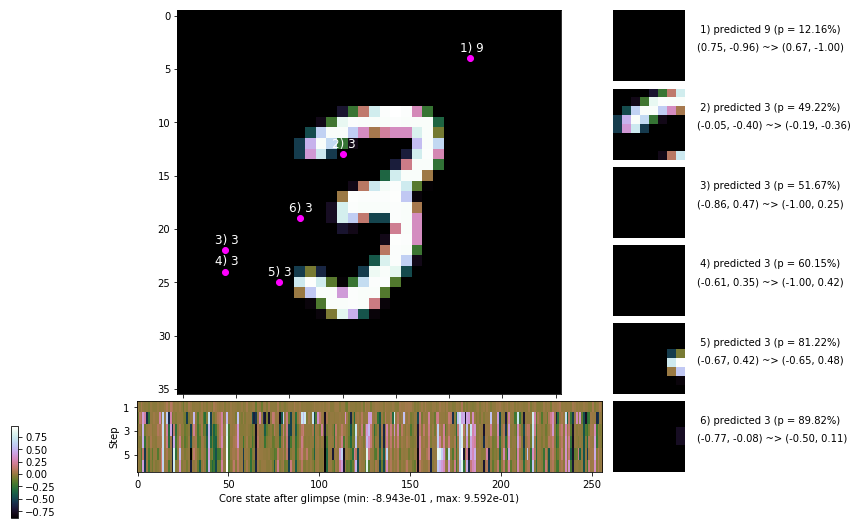

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 140.0 ms/b | lr: 8.68e-04 | grad 2norm: 12.57 | grad inf norm:  3.438
         Weights || abs max:  1.78 ( 8881.23) | mean:  1.27e-04 ( 0.03) | var: 3.51e-02 (13900.43)
          Biases || abs max:  1.08 (  107.39) | mean: -8.11e-02 ( 0.12) | var: 3.78e-02 (   43.16)
                    class loss: 0.646 | steps: 2.602 | reward:  3.917 | acc.: 78.43%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 135.9 ms/b | lr: 8.67e-04 | grad 2norm: 12.28 | grad inf norm:  3.324
         Weights || abs max:  1.79 ( 3059.28) | mean:  1.54e-04 ( 0.02) | var: 3.54e-02 (  195.10)
          Biases || abs max:  1.08 (  137.16) | mean: -8.17e-02 ( 0.14) | var: 3.81e-02 (  110.88)
                    class loss: 0.614 | steps: 2.597 | reward:  3.950 | acc.: 79.32%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

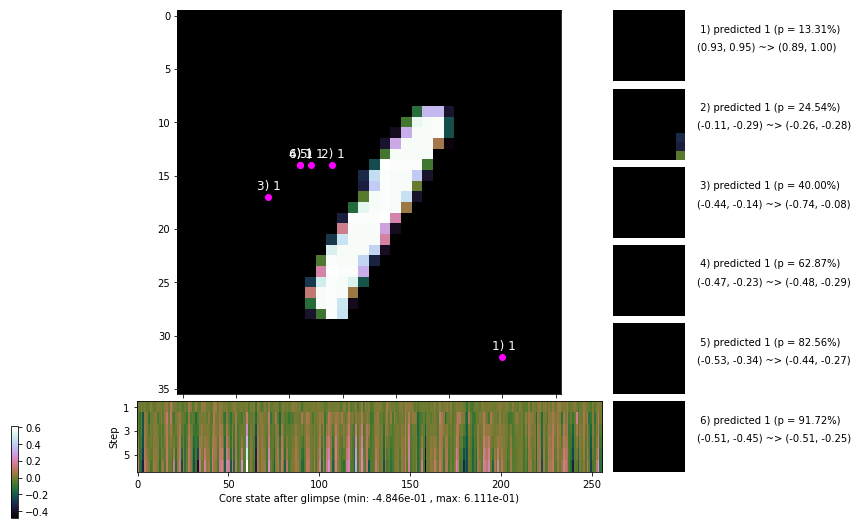

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 138.9 ms/b | lr: 8.65e-04 | grad 2norm: 12.47 | grad inf norm:  3.370
         Weights || abs max:  1.79 (61282.78) | mean:  1.15e-04 ( 0.12) | var: 3.56e-02 (1597233.38)
          Biases || abs max:  1.08 (  146.18) | mean: -8.18e-02 ( 0.14) | var: 3.84e-02 (   79.51)
                    class loss: 0.612 | steps: 2.582 | reward:  3.946 | acc.: 79.53%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 140.8 ms/b | lr: 8.64e-04 | grad 2norm: 12.62 | grad inf norm:  3.327
         Weights || abs max:  1.80 ( 2766.77) | mean:  1.11e-04 ( 0.02) | var: 3.58e-02 (   97.31)
          Biases || abs max:  1.09 (  148.59) | mean: -8.23e-02 ( 0.14) | var: 3.87e-02 (  204.23)
                    class loss: 0.624 | steps: 2.607 | reward:  3.952 | acc.: 78.87%

	Target class: 4 | Discounted rewards: [-0.020, -0.019,

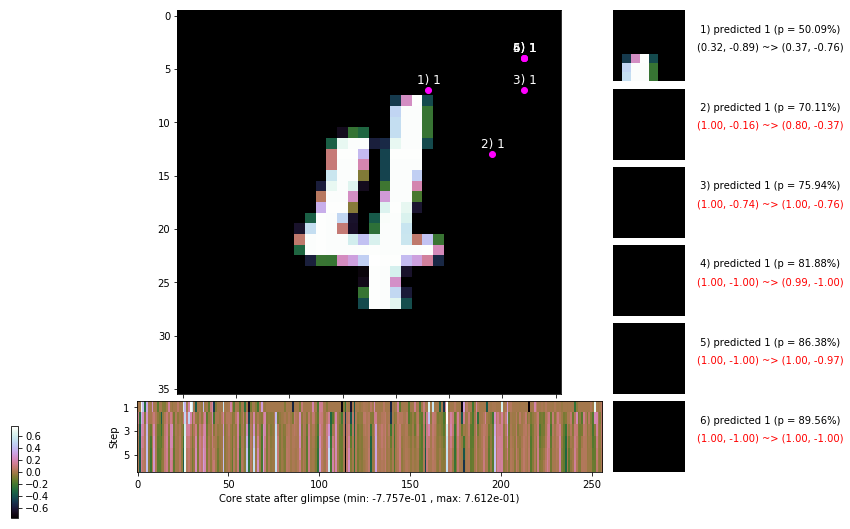

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 134.2 ms/b | lr: 8.62e-04 | grad 2norm: 12.59 | grad inf norm:  3.265
         Weights || abs max:  1.82 ( 3839.76) | mean:  1.06e-04 ( 0.02) | var: 3.60e-02 (  684.76)
          Biases || abs max:  1.09 (  356.43) | mean: -8.32e-02 ( 0.22) | var: 3.92e-02 ( 4193.47)
                    class loss: 0.626 | steps: 2.627 | reward:  3.923 | acc.: 79.53%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.6 ms/b | lr: 8.62e-04 | grad 2norm: 12.50 | grad inf norm:  3.252
         Weights || abs max:  1.83 ( 3673.56) | mean:  1.30e-04 ( 0.02) | var: 3.62e-02 (  575.47)
          Biases || abs max:  1.09 (  178.29) | mean: -8.30e-02 ( 0.17) | var: 3.93e-02 ( 1218.61)
                    class loss: 0.624 | steps: 2.600 | reward:  3.949 | acc.: 79.08%

	Target class: 7 | Discounted rewards: [0.454, 0.928, 1.8

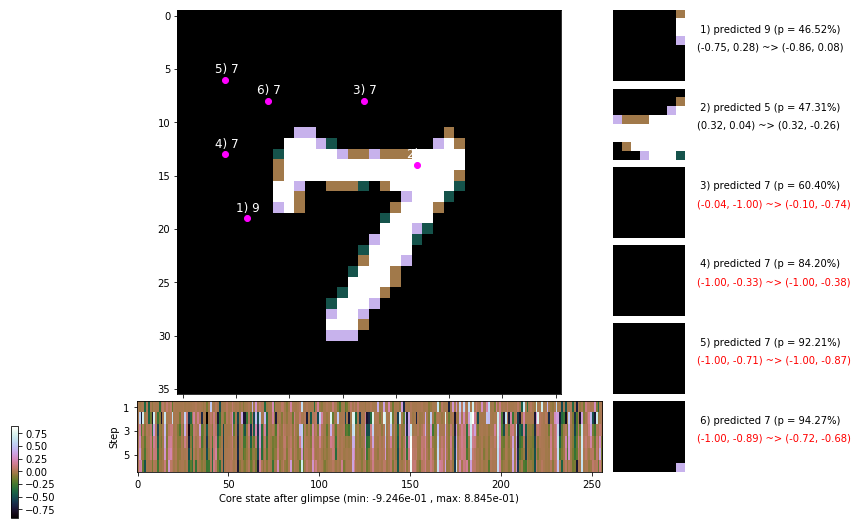

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 9 | Discounted rewards: [1.495, 0.991, -0.019, -0.018, -0.015, -0.010]


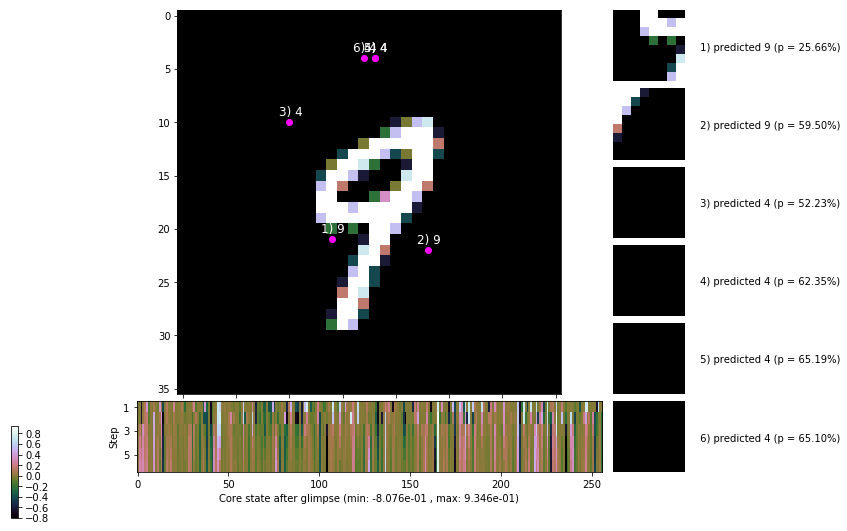


	Target class: 0 | Discounted rewards: [0.454, 0.928, 1.875, 1.750, 1.500, 1.000]


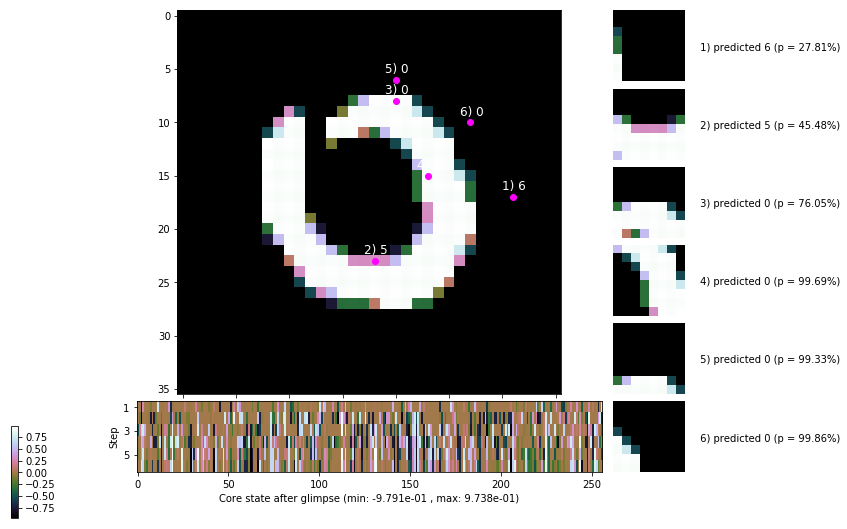

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


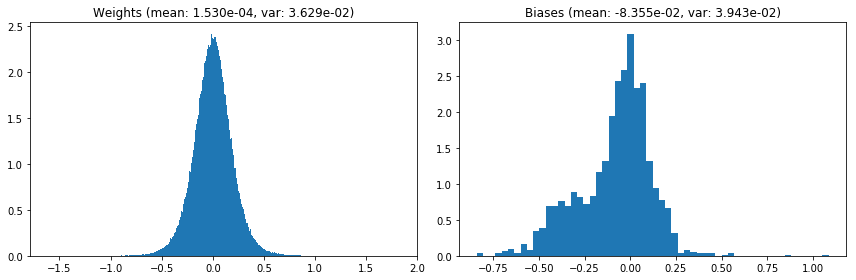

                                      Location network weights and biases


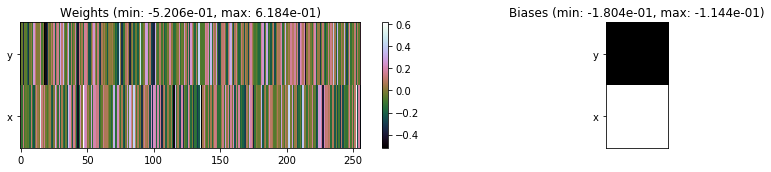

---------------------------------------------------------------------------------------------------------------
Elapsed time:  416.45 sec | TRAIN >> class loss: 0.6325 | steps:  2.609 :( | reward:  3.9306 :( | acc.: 78.817% :(
                          | VAL   >> class loss: 0.6641 | steps:  2.586 :( | reward:  3.9517 :( | acc.: 76.880% :(


Epoch  11/400) lr = 0.0008606
 b    300/  3000 >> 157.9 ms/b | lr: 8.60e-04 | grad 2norm: 12.60 | grad inf norm:  3.309
         Weights || abs max:  1.83 ( 3274.14) | mean:  1.35e-04 ( 0.02) | var: 3.64e-02 (  112.61)
          Biases || abs max:  1.08 (  157.27) | mean: -8.46e-02 ( 0.14) | var: 3.97e-02 (  248.77)
                    class loss: 0.664 | steps: 2.642 | reward:  3.872 | acc.: 77.50%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 153.0 ms/b | lr: 8.59e-04 | grad 2norm: 12.50 | grad inf norm:  3.285
         Weights || abs max:  1.84 ( 2916.52) | mean:  1.20e-04 (

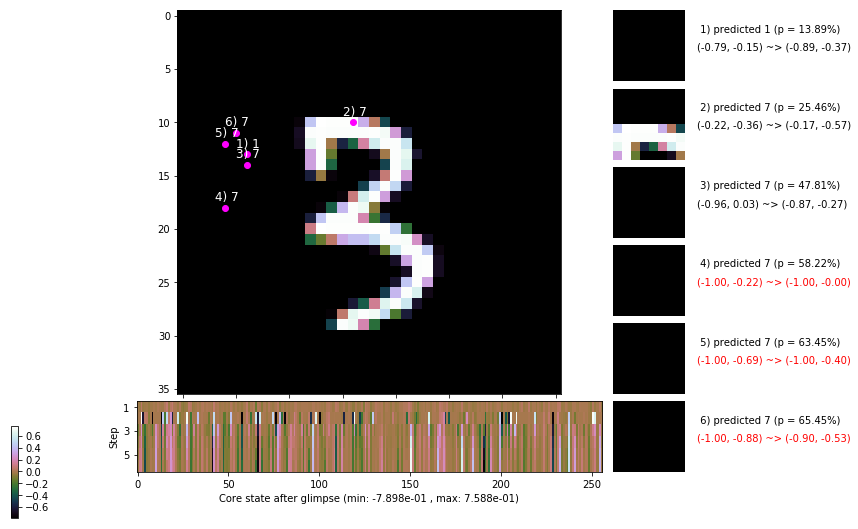

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 141.5 ms/b | lr: 8.57e-04 | grad 2norm: 12.59 | grad inf norm:  3.308
         Weights || abs max:  1.82 ( 4477.25) | mean:  1.32e-04 ( 0.02) | var: 3.68e-02 (  953.42)
          Biases || abs max:  1.09 (  166.53) | mean: -8.46e-02 ( 0.14) | var: 4.03e-02 (  269.17)
                    class loss: 0.642 | steps: 2.638 | reward:  3.901 | acc.: 78.48%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 148.2 ms/b | lr: 8.56e-04 | grad 2norm: 12.70 | grad inf norm:  3.438
         Weights || abs max:  1.81 ( 2571.37) | mean:  1.03e-04 ( 0.02) | var: 3.70e-02 (  120.58)
          Biases || abs max:  1.09 (  153.56) | mean: -8.53e-02 ( 0.14) | var: 4.06e-02 (  189.06)
                    class loss: 0.631 | steps: 2.606 | reward:  3.935 | acc.: 78.58%

	Target class: 0 | Discounted rewards: [0.580, 1.180, 0.3

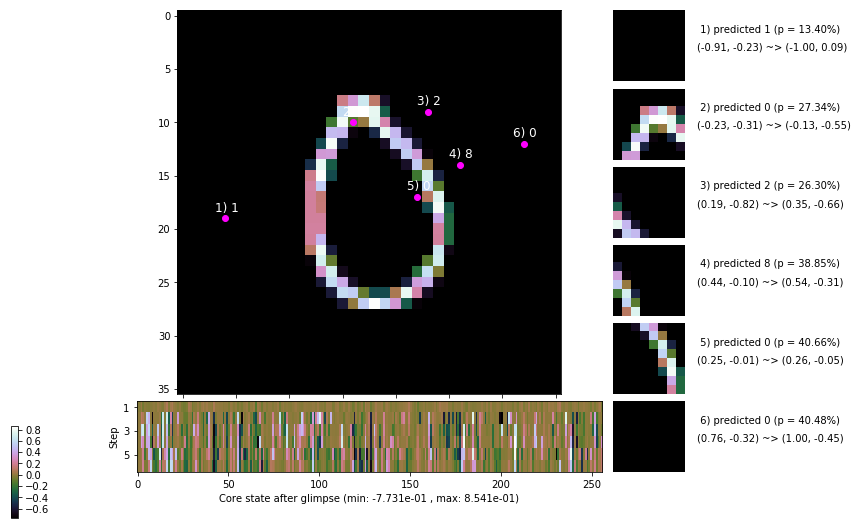

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 144.2 ms/b | lr: 8.55e-04 | grad 2norm: 12.55 | grad inf norm:  3.284
         Weights || abs max:  1.81 ( 4069.25) | mean:  1.03e-04 ( 0.02) | var: 3.72e-02 (  458.77)
          Biases || abs max:  1.09 (  178.00) | mean: -8.61e-02 ( 0.15) | var: 4.09e-02 (  179.92)
                    class loss: 0.631 | steps: 2.612 | reward:  3.925 | acc.: 78.83%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 134.4 ms/b | lr: 8.54e-04 | grad 2norm: 12.59 | grad inf norm:  3.208
         Weights || abs max:  1.80 ( 2604.97) | mean:  1.28e-04 ( 0.02) | var: 3.74e-02 (   88.86)
          Biases || abs max:  1.09 (  244.76) | mean: -8.72e-02 ( 0.19) | var: 4.14e-02 (  984.24)
                    class loss: 0.630 | steps: 2.604 | reward:  3.907 | acc.: 78.40%

	Target class: 2 | Discounted rewards: [1.874, 1.748, 1.4

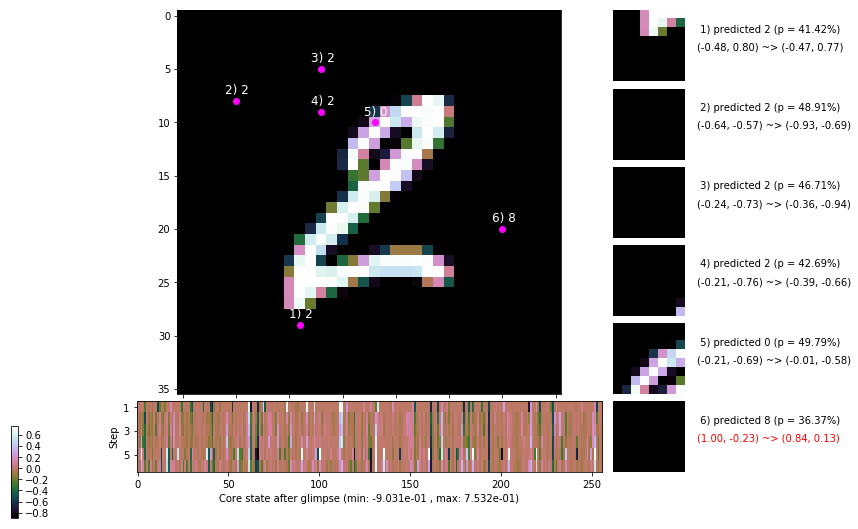

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 136.5 ms/b | lr: 8.52e-04 | grad 2norm: 12.38 | grad inf norm:  3.192
         Weights || abs max:  1.80 ( 3504.80) | mean:  1.21e-04 ( 0.02) | var: 3.77e-02 (  272.42)
          Biases || abs max:  1.11 (  211.65) | mean: -8.74e-02 ( 0.18) | var: 4.16e-02 (  875.85)
                    class loss: 0.604 | steps: 2.561 | reward:  3.987 | acc.: 79.62%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 135.4 ms/b | lr: 8.51e-04 | grad 2norm: 12.41 | grad inf norm:  3.158
         Weights || abs max:  1.78 ( 8430.99) | mean:  8.72e-05 ( 0.03) | var: 3.79e-02 ( 4636.40)
          Biases || abs max:  1.10 (  206.70) | mean: -8.72e-02 ( 0.16) | var: 4.17e-02 (  497.58)
                    class loss: 0.630 | steps: 2.582 | reward:  3.960 | acc.: 78.90%

	Target class: 3 | Discounted rewards: [0.454, 0.928, 1.8

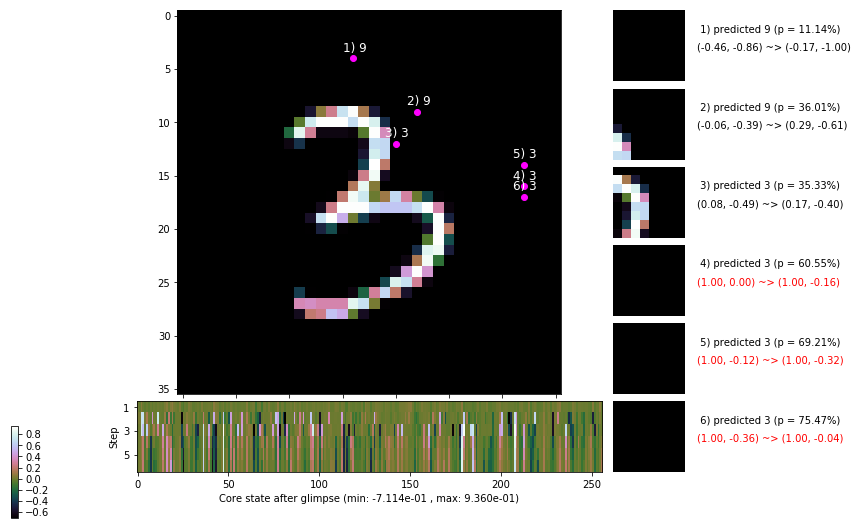

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 155.6 ms/b | lr: 8.50e-04 | grad 2norm: 12.45 | grad inf norm:  3.256
         Weights || abs max:  1.76 ( 6757.94) | mean:  6.90e-05 ( 0.02) | var: 3.81e-02 ( 5665.32)
          Biases || abs max:  1.10 (  284.59) | mean: -8.74e-02 ( 0.21) | var: 4.21e-02 ( 2623.28)
                    class loss: 0.625 | steps: 2.606 | reward:  3.948 | acc.: 78.87%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 143.0 ms/b | lr: 8.49e-04 | grad 2norm: 12.44 | grad inf norm:  3.136
         Weights || abs max:  1.76 ( 3957.10) | mean:  6.93e-05 ( 0.02) | var: 3.83e-02 (  420.78)
          Biases || abs max:  1.10 (  285.08) | mean: -8.78e-02 ( 0.19) | var: 4.24e-02 ( 2105.28)
                    class loss: 0.623 | steps: 2.596 | reward:  3.926 | acc.: 78.53%

	Target class: 4 | Discounted rewards: [0.201, 0.423, 0.8

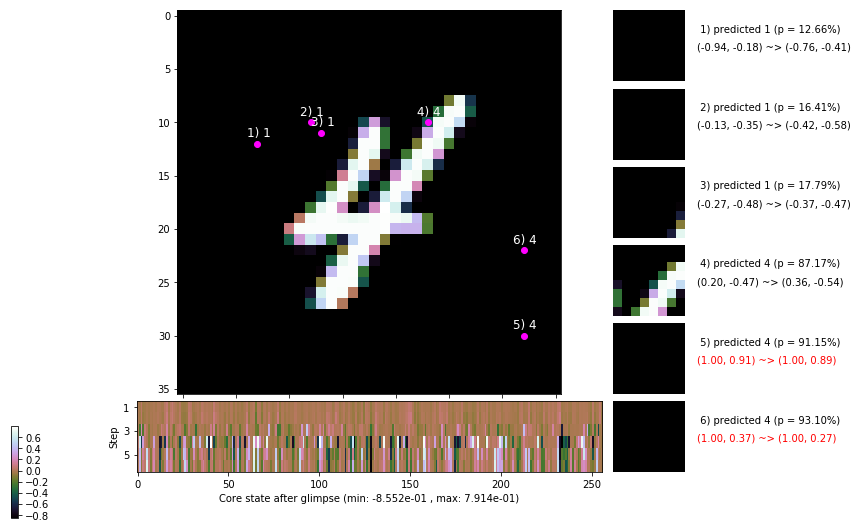

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 2 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


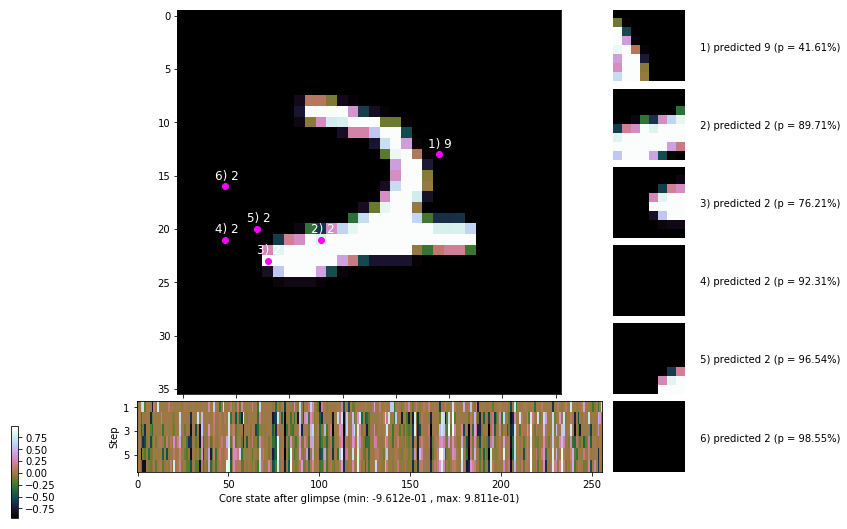


	Target class: 9 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


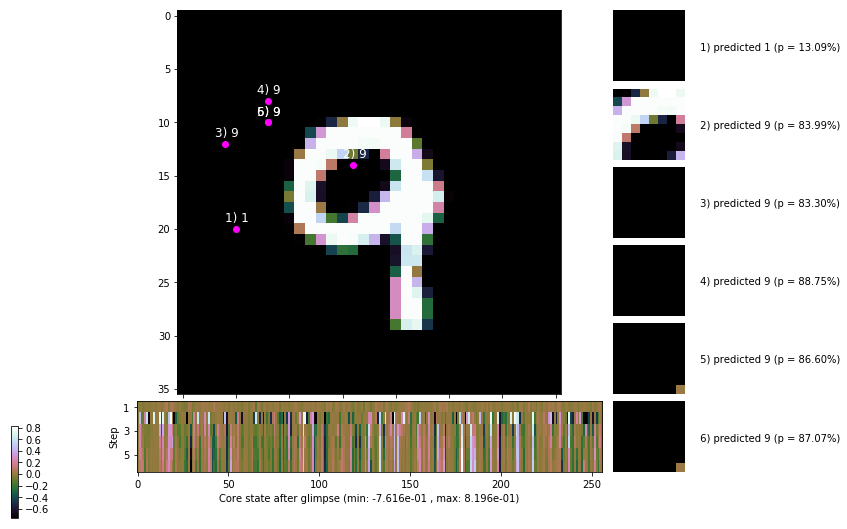

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


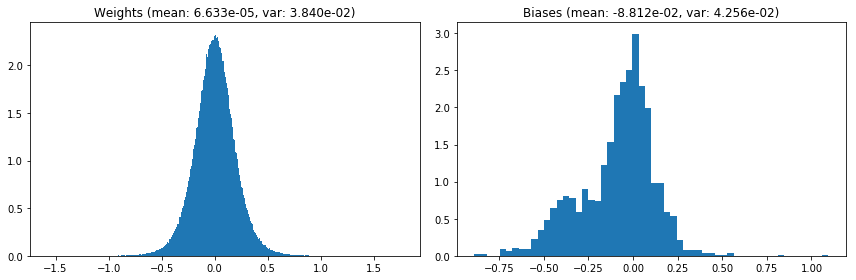

                                      Location network weights and biases


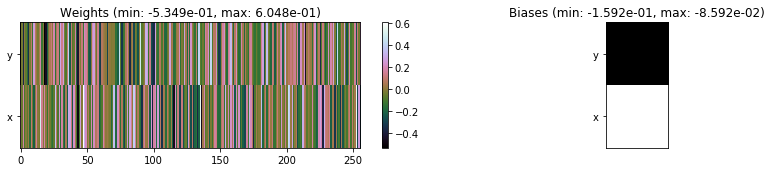

---------------------------------------------------------------------------------------------------------------
Elapsed time:  435.47 sec | TRAIN >> class loss: 0.6312 | steps:  2.606 :( | reward:  3.9271 :( | acc.: 78.593% :(
                          | VAL   >> class loss: 0.6478 | steps:  2.538 :( | reward:  3.9968 :( | acc.: 78.260% :(


Epoch  12/400) lr = 0.0008478
 b    300/  3000 >> 133.5 ms/b | lr: 8.47e-04 | grad 2norm: 12.50 | grad inf norm:  3.218
         Weights || abs max:  1.77 ( 4659.26) | mean:  8.21e-05 ( 0.02) | var: 3.85e-02 ( 1263.52)
          Biases || abs max:  1.10 (  192.58) | mean: -8.82e-02 ( 0.16) | var: 4.26e-02 (  398.30)
                    class loss: 0.613 | steps: 2.593 | reward:  3.956 | acc.: 79.30%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 130.9 ms/b | lr: 8.46e-04 | grad 2norm: 12.67 | grad inf norm:  3.348
         Weights || abs max:  1.79 ( 2757.60) | mean:  9.70e-05 (

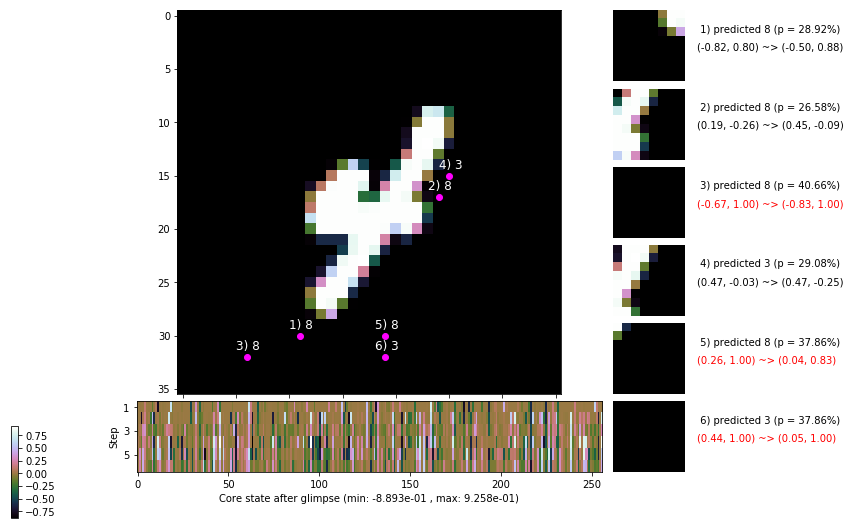

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 137.8 ms/b | lr: 8.44e-04 | grad 2norm: 12.61 | grad inf norm:  3.217
         Weights || abs max:  1.80 ( 3624.86) | mean:  1.09e-04 ( 0.02) | var: 3.89e-02 (  847.74)
          Biases || abs max:  1.10 (  114.69) | mean: -8.83e-02 ( 0.12) | var: 4.33e-02 (  295.89)
                    class loss: 0.617 | steps: 2.587 | reward:  3.962 | acc.: 79.03%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 132.7 ms/b | lr: 8.44e-04 | grad 2norm: 12.69 | grad inf norm:  3.153
         Weights || abs max:  1.81 ( 2303.61) | mean:  9.68e-05 ( 0.01) | var: 3.91e-02 (   75.32)
          Biases || abs max:  1.11 (   81.21) | mean: -8.79e-02 ( 0.10) | var: 4.34e-02 (   23.19)
                    class loss: 0.623 | steps: 2.585 | reward:  3.946 | acc.: 78.88%

	Target class: 7 | Discounted rewards: [-0.020, -0.019, -

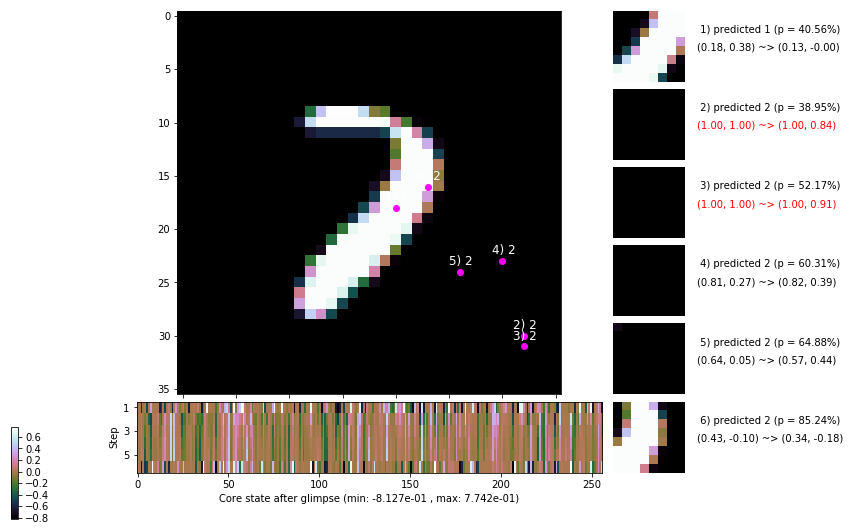

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 138.5 ms/b | lr: 8.42e-04 | grad 2norm: 12.53 | grad inf norm:  3.327
         Weights || abs max:  1.82 ( 3875.95) | mean:  7.29e-05 ( 0.02) | var: 3.93e-02 (  688.78)
          Biases || abs max:  1.11 (  118.22) | mean: -8.88e-02 ( 0.12) | var: 4.37e-02 (  137.55)
                    class loss: 0.624 | steps: 2.554 | reward:  3.954 | acc.: 78.88%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 141.5 ms/b | lr: 8.41e-04 | grad 2norm: 12.43 | grad inf norm:  3.231
         Weights || abs max:  1.81 (11126.26) | mean:  8.44e-05 ( 0.03) | var: 3.94e-02 (25600.46)
          Biases || abs max:  1.11 (  148.75) | mean: -8.92e-02 ( 0.13) | var: 4.40e-02 (  593.32)
                    class loss: 0.601 | steps: 2.561 | reward:  3.975 | acc.: 79.07%

	Target class: 5 | Discounted rewards: [0.959, 1.938, 1.8

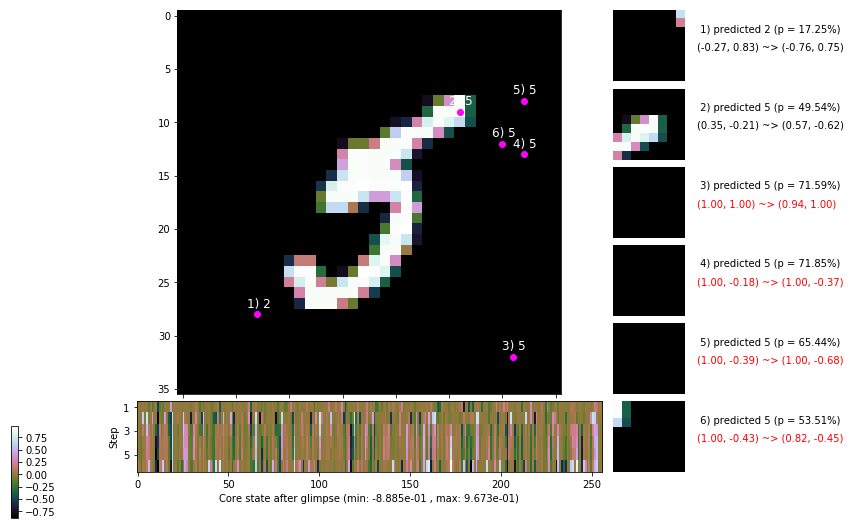

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 142.6 ms/b | lr: 8.39e-04 | grad 2norm: 12.51 | grad inf norm:  3.353
         Weights || abs max:  1.83 ( 4848.72) | mean:  1.01e-04 ( 0.02) | var: 3.96e-02 ( 1868.84)
          Biases || abs max:  1.11 (  132.67) | mean: -8.96e-02 ( 0.13) | var: 4.42e-02 (   58.76)
                    class loss: 0.630 | steps: 2.572 | reward:  3.956 | acc.: 79.00%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 148.0 ms/b | lr: 8.39e-04 | grad 2norm: 12.59 | grad inf norm:  3.295
         Weights || abs max:  1.83 (11677.57) | mean:  1.39e-04 ( 0.03) | var: 3.98e-02 (33986.93)
          Biases || abs max:  1.11 (   93.96) | mean: -8.98e-02 ( 0.11) | var: 4.45e-02 (   51.67)
                    class loss: 0.610 | steps: 2.552 | reward:  3.979 | acc.: 79.08%

	Target class: 2 | Discounted rewards: [0.959, 1.938, 1.8

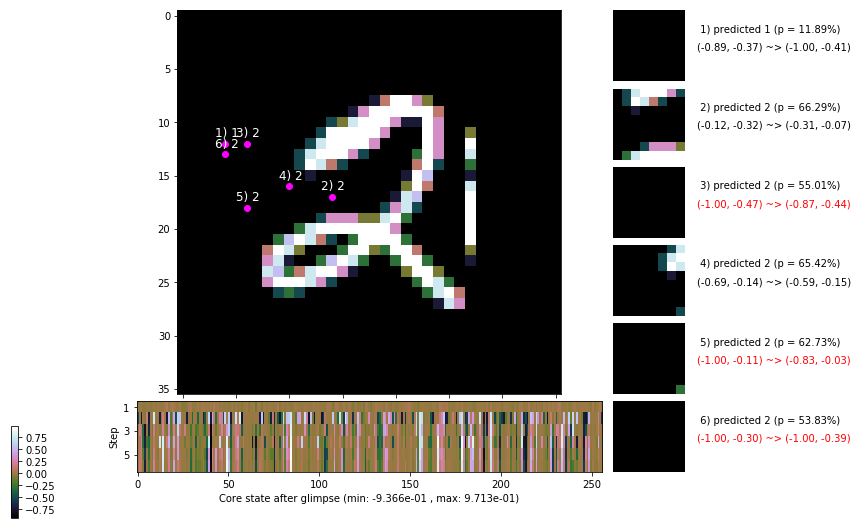

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 166.1 ms/b | lr: 8.37e-04 | grad 2norm: 12.68 | grad inf norm:  3.333
         Weights || abs max:  1.84 ( 3143.95) | mean:  1.88e-04 ( 0.02) | var: 4.00e-02 (  199.22)
          Biases || abs max:  1.11 (  205.77) | mean: -9.03e-02 ( 0.16) | var: 4.49e-02 (  462.08)
                    class loss: 0.624 | steps: 2.582 | reward:  3.936 | acc.: 78.15%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 149.4 ms/b | lr: 8.36e-04 | grad 2norm: 12.40 | grad inf norm:  3.159
         Weights || abs max:  1.84 ( 5769.78) | mean:  1.90e-04 ( 0.02) | var: 4.02e-02 ( 4609.44)
          Biases || abs max:  1.11 (   95.06) | mean: -9.06e-02 ( 0.11) | var: 4.54e-02 (   30.90)
                    class loss: 0.599 | steps: 2.558 | reward:  3.983 | acc.: 79.82%

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.8

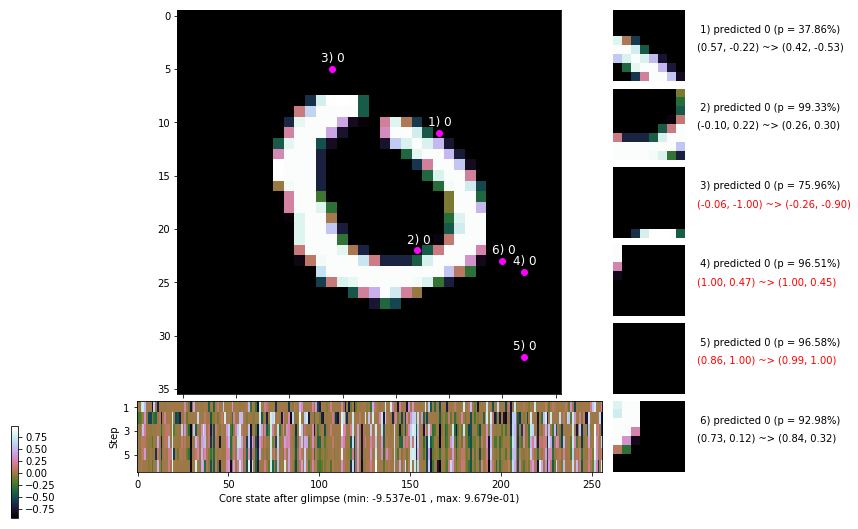

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


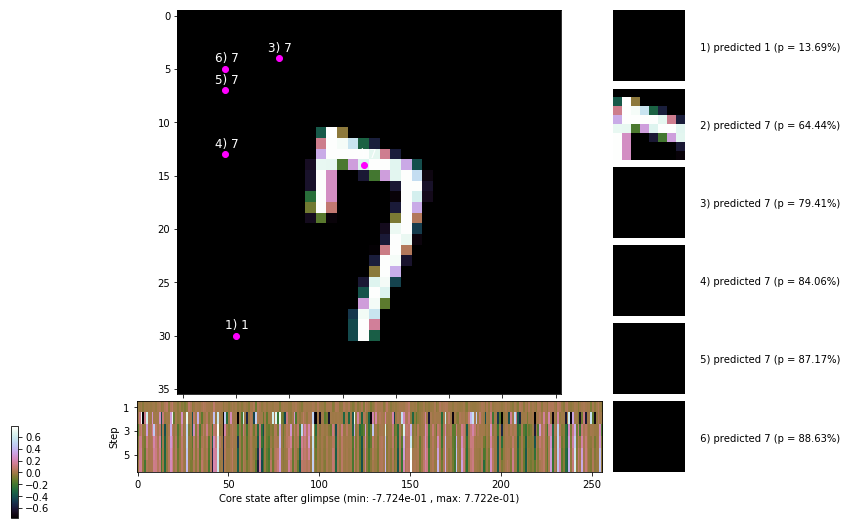


	Target class: 8 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


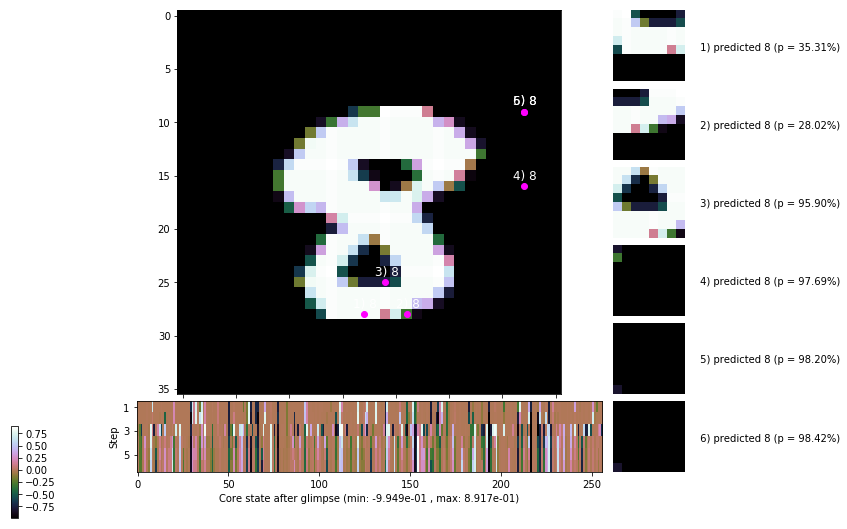

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


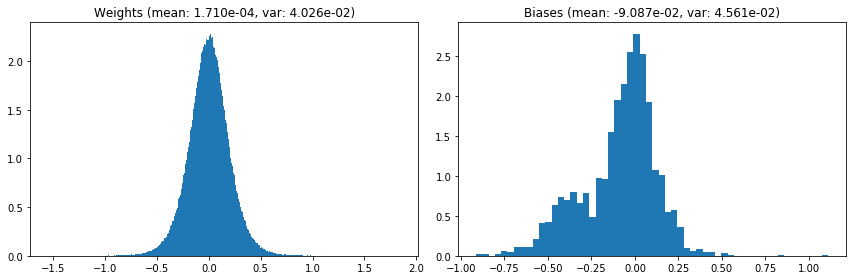

                                      Location network weights and biases


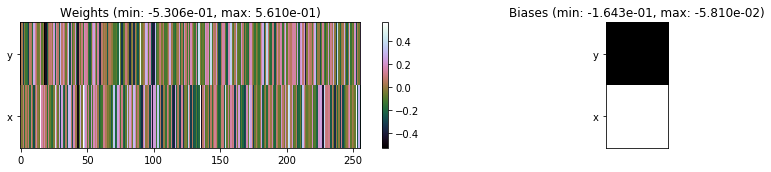

---------------------------------------------------------------------------------------------------------------
Elapsed time:  426.87 sec | TRAIN >> class loss: 0.6171 | steps:  2.574    | reward:  3.9587    | acc.: 78.923% :(
                          | VAL   >> class loss: 0.6161 | steps:  2.454    | reward:  4.0822    | acc.: 78.840% 


Epoch  13/400) lr = 0.0008352
 b    300/  3000 >> 138.0 ms/b | lr: 8.34e-04 | grad 2norm: 12.46 | grad inf norm:  3.254
         Weights || abs max:  1.85 ( 4115.46) | mean:  1.30e-04 ( 0.02) | var: 4.04e-02 (  275.50)
          Biases || abs max:  1.11 (  124.88) | mean: -9.11e-02 ( 0.14) | var: 4.56e-02 (  181.73)
                    class loss: 0.609 | steps: 2.580 | reward:  3.961 | acc.: 79.18%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 135.4 ms/b | lr: 8.34e-04 | grad 2norm: 12.26 | grad inf norm:  3.179
         Weights || abs max:  1.86 ( 3971.74) | mean:  6.64e-05 ( 0

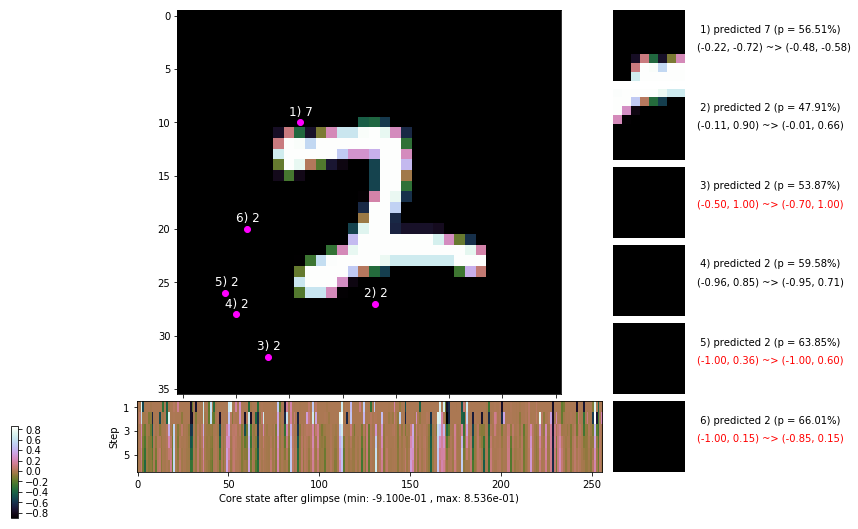

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 148.1 ms/b | lr: 8.32e-04 | grad 2norm: 12.33 | grad inf norm:  3.245
         Weights || abs max:  1.87 ( 2835.48) | mean:  6.46e-05 ( 0.01) | var: 4.07e-02 (  271.94)
          Biases || abs max:  1.11 (   81.77) | mean: -9.20e-02 ( 0.11) | var: 4.64e-02 (   16.50)
                    class loss: 0.613 | steps: 2.547 | reward:  3.968 | acc.: 78.93%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 147.4 ms/b | lr: 8.31e-04 | grad 2norm: 12.23 | grad inf norm:  3.104
         Weights || abs max:  1.86 ( 2536.90) | mean:  4.63e-05 ( 0.01) | var: 4.09e-02 (   76.92)
          Biases || abs max:  1.11 (  156.60) | mean: -9.27e-02 ( 0.13) | var: 4.67e-02 (  671.95)
                    class loss: 0.623 | steps: 2.545 | reward:  3.970 | acc.: 78.97%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

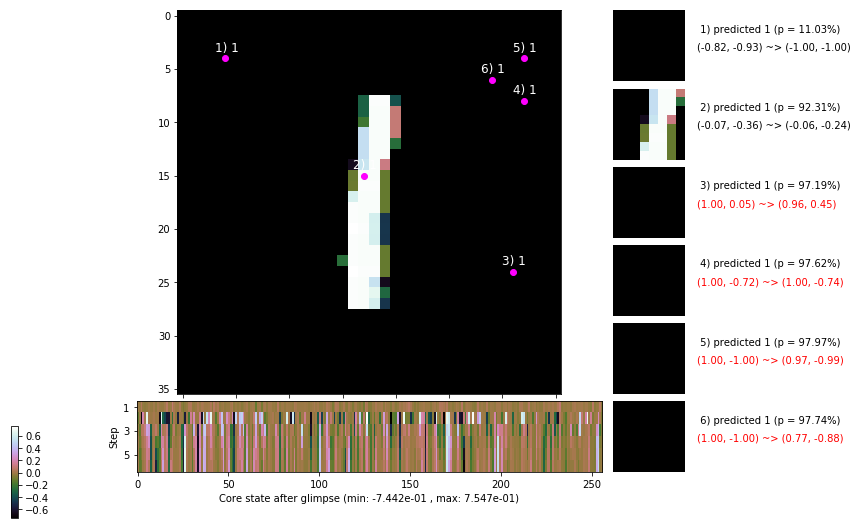

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 158.7 ms/b | lr: 8.29e-04 | grad 2norm: 12.29 | grad inf norm:  3.172
         Weights || abs max:  1.86 ( 2016.07) | mean:  3.23e-05 ( 0.01) | var: 4.11e-02 (  150.41)
          Biases || abs max:  1.11 (  184.63) | mean: -9.26e-02 ( 0.15) | var: 4.68e-02 (  179.11)
                    class loss: 0.627 | steps: 2.590 | reward:  3.944 | acc.: 78.83%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 156.7 ms/b | lr: 8.29e-04 | grad 2norm: 12.38 | grad inf norm:  3.217
         Weights || abs max:  1.87 ( 2555.19) | mean:  4.33e-06 ( 0.01) | var: 4.13e-02 (  146.72)
          Biases || abs max:  1.11 (   98.77) | mean: -9.30e-02 ( 0.11) | var: 4.69e-02 (   64.66)
                    class loss: 0.616 | steps: 2.563 | reward:  3.983 | acc.: 79.63%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

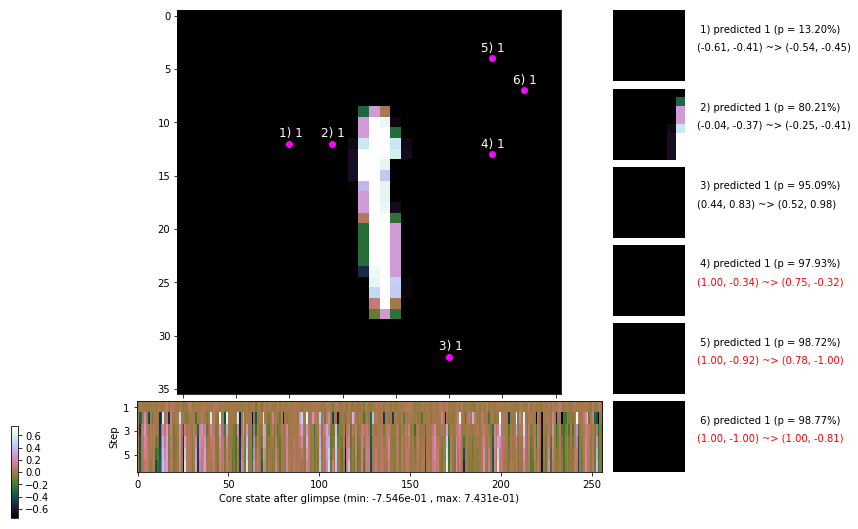

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 151.1 ms/b | lr: 8.27e-04 | grad 2norm: 12.31 | grad inf norm:  3.223
         Weights || abs max:  1.87 ( 4741.71) | mean:  8.93e-06 ( 0.02) | var: 4.15e-02 ( 1344.13)
          Biases || abs max:  1.12 (  245.99) | mean: -9.33e-02 ( 0.17) | var: 4.71e-02 ( 2405.97)
                    class loss: 0.596 | steps: 2.546 | reward:  3.993 | acc.: 79.87%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 162.1 ms/b | lr: 8.26e-04 | grad 2norm: 12.28 | grad inf norm:  3.296
         Weights || abs max:  1.87 ( 3327.98) | mean:  1.65e-05 ( 0.02) | var: 4.17e-02 (  132.26)
          Biases || abs max:  1.11 (  172.77) | mean: -9.33e-02 ( 0.14) | var: 4.73e-02 (  514.32)
                    class loss: 0.620 | steps: 2.585 | reward:  3.949 | acc.: 78.77%

	Target class: 2 | Discounted rewards: [0.454, 0.928, 1.8

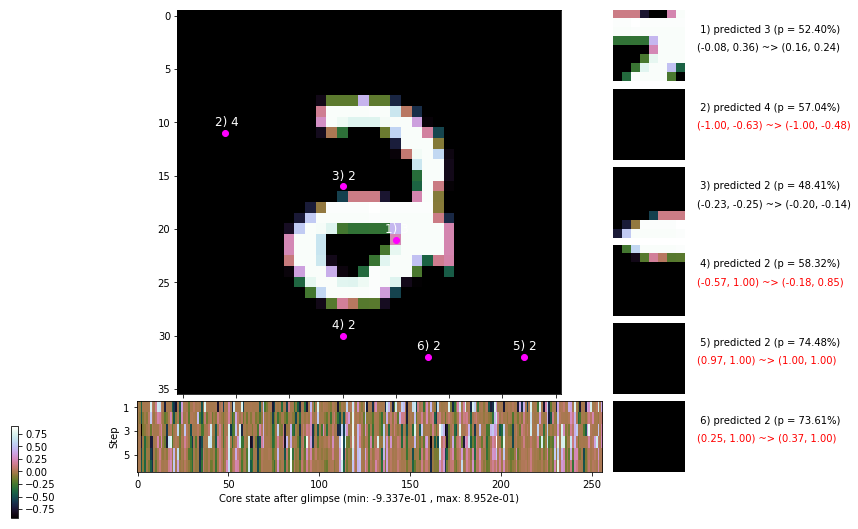

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 146.9 ms/b | lr: 8.24e-04 | grad 2norm: 12.24 | grad inf norm:  3.238
         Weights || abs max:  1.88 ( 3453.08) | mean:  4.81e-05 ( 0.02) | var: 4.19e-02 (  191.04)
          Biases || abs max:  1.10 (  323.09) | mean: -9.44e-02 ( 0.20) | var: 4.77e-02 ( 5583.42)
                    class loss: 0.604 | steps: 2.601 | reward:  3.954 | acc.: 79.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 154.3 ms/b | lr: 8.24e-04 | grad 2norm: 12.25 | grad inf norm:  3.331
         Weights || abs max:  1.88 ( 2109.52) | mean:  6.22e-05 ( 0.01) | var: 4.21e-02 (   44.25)
          Biases || abs max:  1.10 (  115.25) | mean: -9.47e-02 ( 0.12) | var: 4.79e-02 (  139.52)
                    class loss: 0.586 | steps: 2.525 | reward:  4.009 | acc.: 79.50%

	Target class: 6 | Discounted rewards: [1.969, 1.938, 1.8

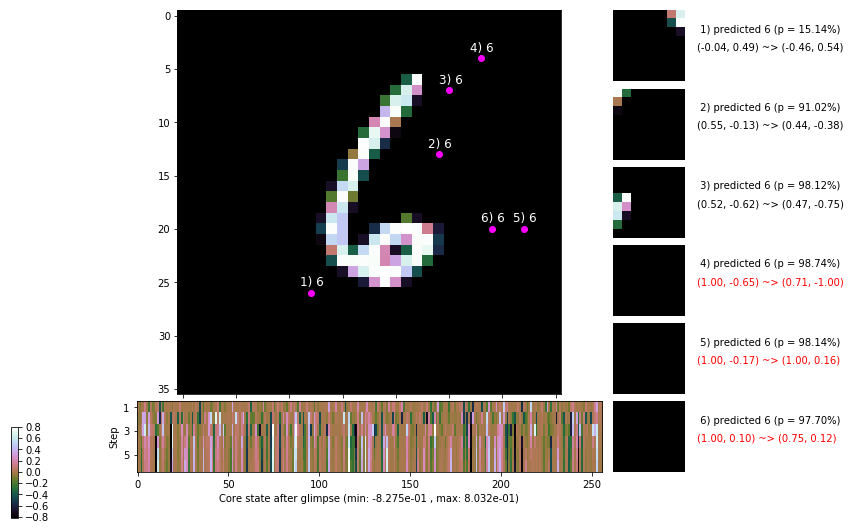

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 5 | Discounted rewards: [0.454, 0.928, 1.875, 1.750, 1.500, 1.000]


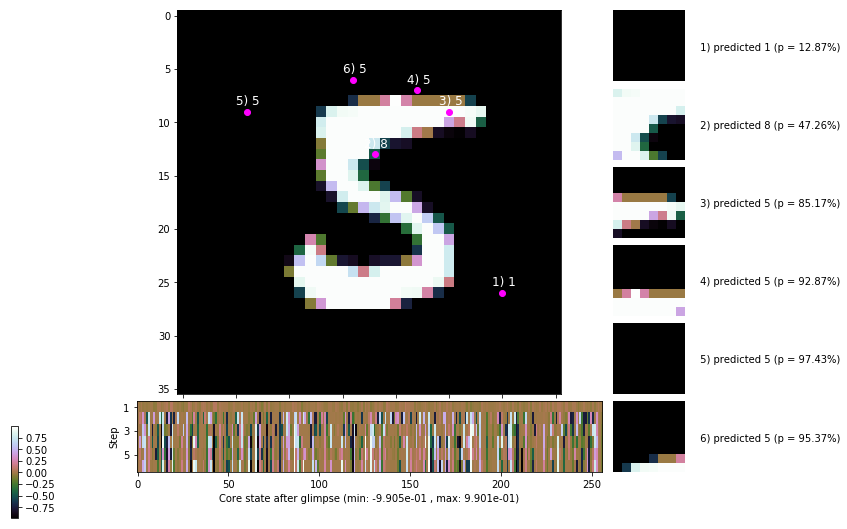


	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


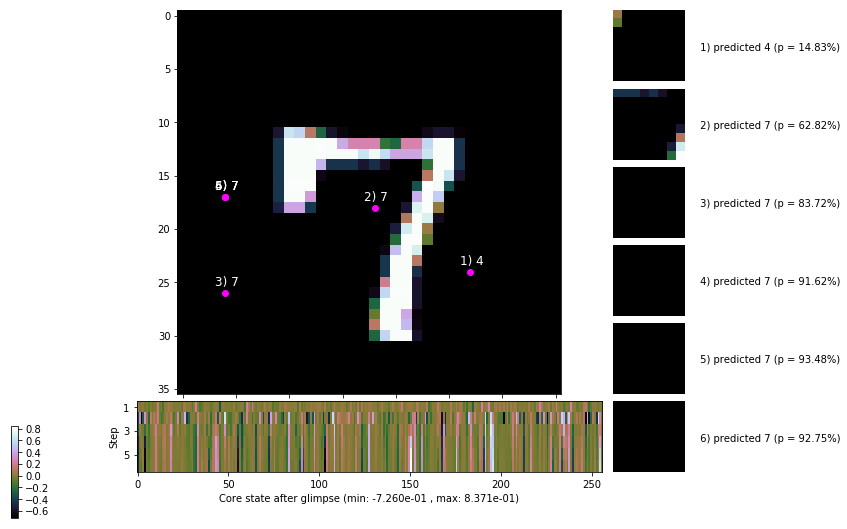

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


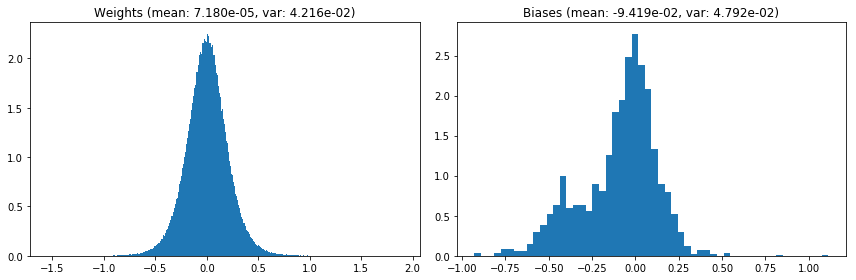

                                      Location network weights and biases


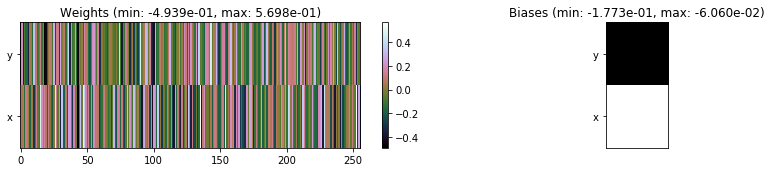

---------------------------------------------------------------------------------------------------------------
Elapsed time:  450.31 sec | TRAIN >> class loss: 0.6121 | steps:  2.566    | reward:  3.9671    | acc.: 79.192% 
                          | VAL   >> class loss: 0.6216 | steps:  2.525 :( | reward:  4.0323 :( | acc.: 78.480% :(


Epoch  14/400) lr = 0.0008228
 b    300/  3000 >> 156.7 ms/b | lr: 8.22e-04 | grad 2norm: 12.39 | grad inf norm:  3.287
         Weights || abs max:  1.89 ( 7431.53) | mean:  9.90e-05 ( 0.02) | var: 4.23e-02 ( 6732.49)
          Biases || abs max:  1.11 (   83.54) | mean: -9.46e-02 ( 0.11) | var: 4.80e-02 (   44.61)
                    class loss: 0.586 | steps: 2.528 | reward:  4.015 | acc.: 80.03%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 170.0 ms/b | lr: 8.21e-04 | grad 2norm: 12.44 | grad inf norm:  3.347
         Weights || abs max:  1.91 ( 2570.12) | mean:  1.01e-04 ( 0

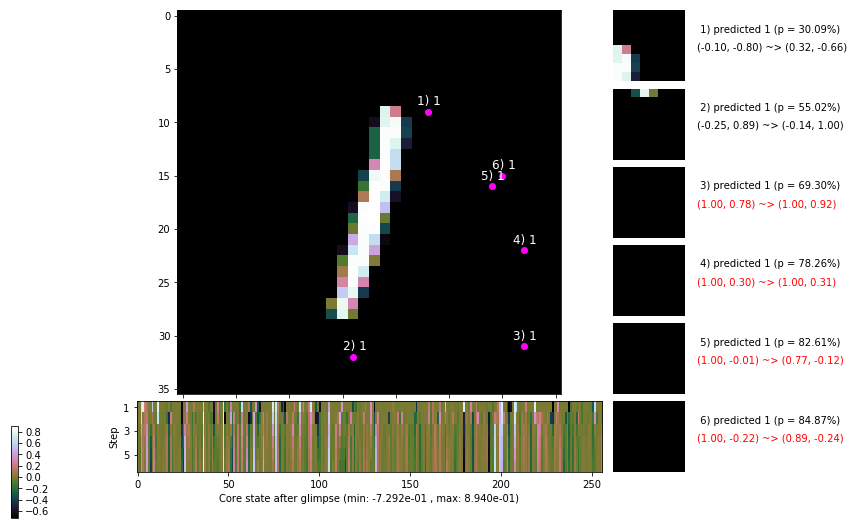

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 162.0 ms/b | lr: 8.19e-04 | grad 2norm: 12.11 | grad inf norm:  3.215
         Weights || abs max:  1.92 ( 2687.80) | mean:  1.21e-04 ( 0.02) | var: 4.26e-02 (   70.63)
          Biases || abs max:  1.11 (  107.10) | mean: -9.54e-02 ( 0.11) | var: 4.88e-02 (  301.89)
                    class loss: 0.585 | steps: 2.537 | reward:  4.002 | acc.: 79.85%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 155.0 ms/b | lr: 8.19e-04 | grad 2norm: 12.28 | grad inf norm:  3.250
         Weights || abs max:  1.93 ( 5228.96) | mean:  1.29e-04 ( 0.02) | var: 4.28e-02 ( 3480.51)
          Biases || abs max:  1.11 (  164.81) | mean: -9.65e-02 ( 0.15) | var: 4.91e-02 (  300.75)
                    class loss: 0.618 | steps: 2.562 | reward:  3.941 | acc.: 78.45%

	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.8

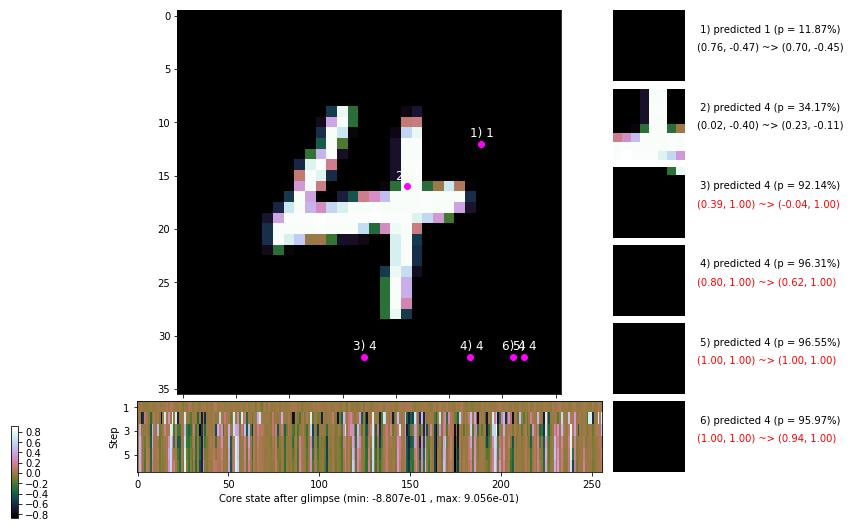

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 160.1 ms/b | lr: 8.17e-04 | grad 2norm: 12.22 | grad inf norm:  3.262
         Weights || abs max:  1.94 ( 2896.64) | mean:  1.56e-04 ( 0.02) | var: 4.30e-02 (   77.20)
          Biases || abs max:  1.10 (  279.69) | mean: -9.67e-02 ( 0.19) | var: 4.94e-02 ( 2710.61)
                    class loss: 0.594 | steps: 2.572 | reward:  3.963 | acc.: 79.35%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 152.5 ms/b | lr: 8.16e-04 | grad 2norm: 12.51 | grad inf norm:  3.333
         Weights || abs max:  1.96 ( 2474.29) | mean:  1.82e-04 ( 0.01) | var: 4.31e-02 (  122.26)
          Biases || abs max:  1.09 (  203.41) | mean: -9.70e-02 ( 0.16) | var: 4.96e-02 (  692.34)
                    class loss: 0.619 | steps: 2.625 | reward:  3.902 | acc.: 78.43%

	Target class: 8 | Discounted rewards: [0.454, 0.928, 1.8

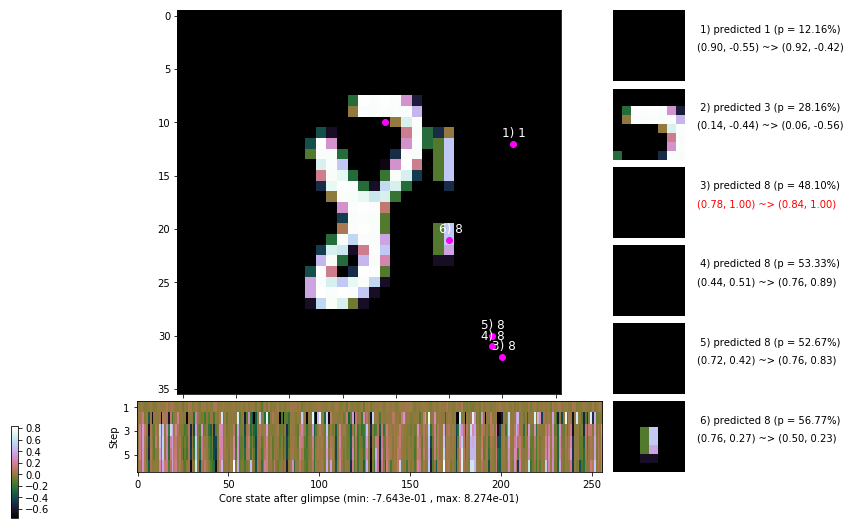

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 153.2 ms/b | lr: 8.15e-04 | grad 2norm: 12.18 | grad inf norm:  3.319
         Weights || abs max:  1.98 (17017.58) | mean:  1.75e-04 ( 0.04) | var: 4.33e-02 (122579.59)
          Biases || abs max:  1.10 (  175.41) | mean: -9.74e-02 ( 0.15) | var: 5.01e-02 (  120.00)
                    class loss: 0.600 | steps: 2.518 | reward:  4.030 | acc.: 79.70%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 149.7 ms/b | lr: 8.14e-04 | grad 2norm: 11.87 | grad inf norm:  3.187
         Weights || abs max:  1.99 ( 5920.60) | mean:  1.62e-04 ( 0.02) | var: 4.35e-02 ( 1195.91)
          Biases || abs max:  1.11 (  292.29) | mean: -9.73e-02 ( 0.21) | var: 5.04e-02 (  189.63)
                    class loss: 0.589 | steps: 2.527 | reward:  4.041 | acc.: 80.23%

	Target class: 8 | Discounted rewards: [0.359, 0.738, 1.

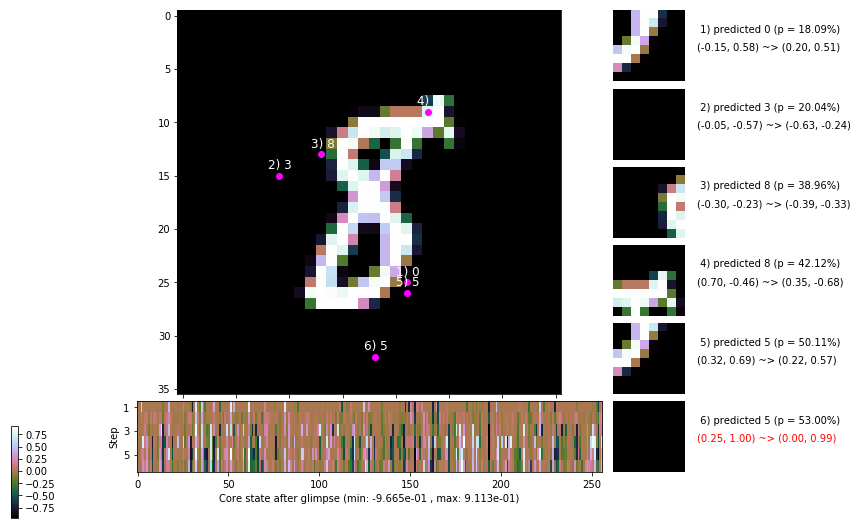

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 150.8 ms/b | lr: 8.12e-04 | grad 2norm: 12.16 | grad inf norm:  3.305
         Weights || abs max:  1.98 ( 4159.00) | mean:  1.71e-04 ( 0.02) | var: 4.36e-02 (  805.38)
          Biases || abs max:  1.11 (  158.35) | mean: -9.80e-02 ( 0.16) | var: 5.08e-02 (  419.25)
                    class loss: 0.584 | steps: 2.564 | reward:  3.991 | acc.: 80.08%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 149.8 ms/b | lr: 8.11e-04 | grad 2norm: 12.26 | grad inf norm:  3.216
         Weights || abs max:  1.98 ( 7216.97) | mean:  1.53e-04 ( 0.02) | var: 4.38e-02 ( 5343.01)
          Biases || abs max:  1.11 (  473.75) | mean: -9.83e-02 ( 0.28) | var: 5.11e-02 ( 1349.20)
                    class loss: 0.610 | steps: 2.571 | reward:  3.951 | acc.: 79.03%

	Target class: 3 | Discounted rewards: [0.043, 0.107, 0.2

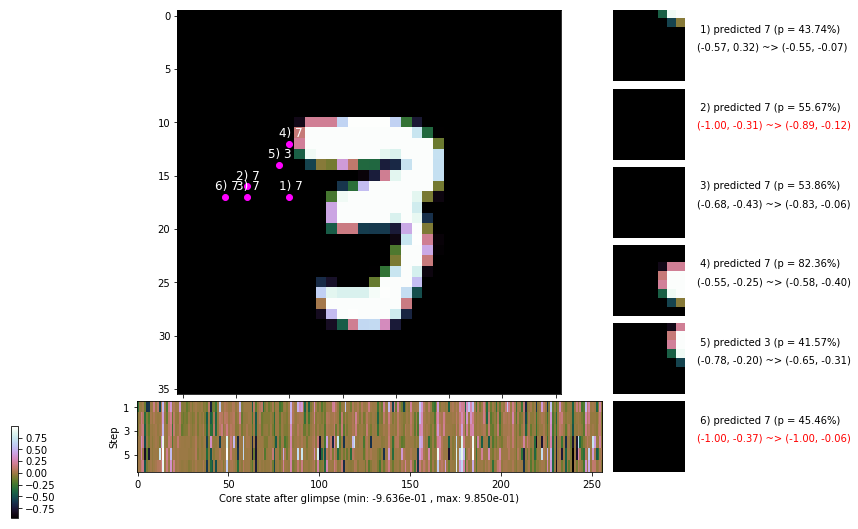

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 2 | Discounted rewards: [0.012, 0.044, 0.108, 0.235, 0.490, 1.000]


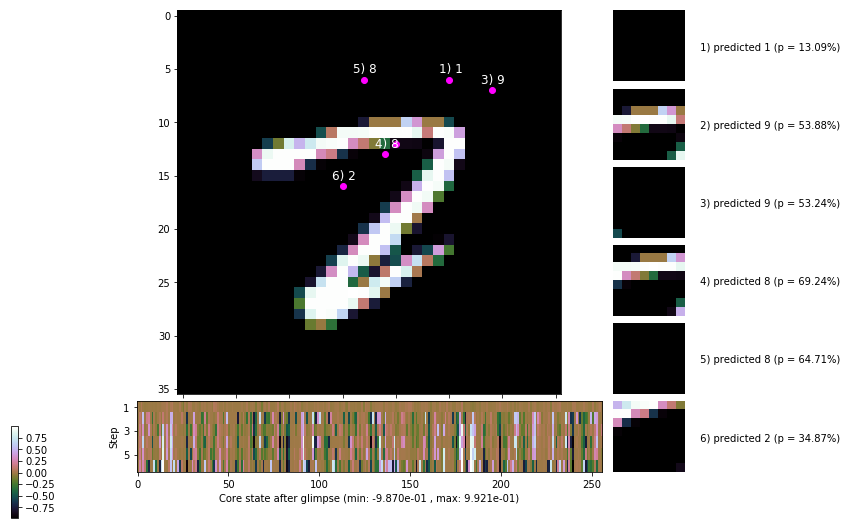


	Target class: 6 | Discounted rewards: [0.485, 0.991, -0.019, -0.018, -0.015, -0.010]


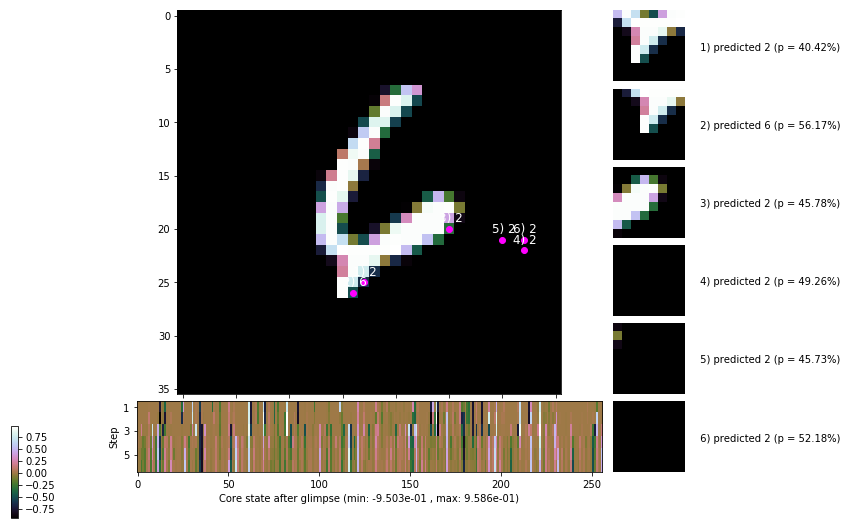

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


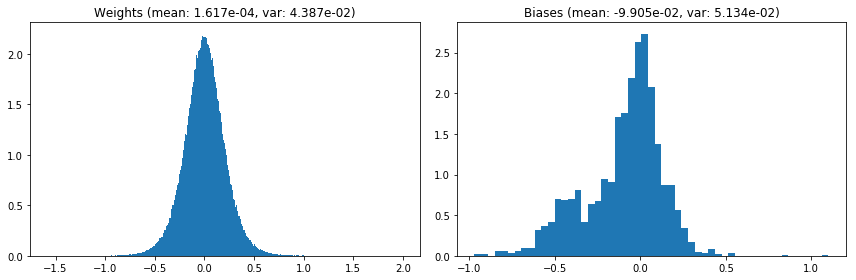

                                      Location network weights and biases


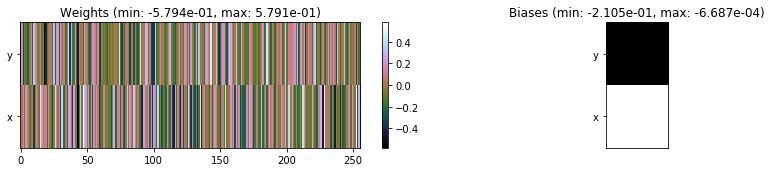

---------------------------------------------------------------------------------------------------------------
Elapsed time:  468.55 sec | TRAIN >> class loss: 0.5993 | steps:  2.561    | reward:  3.9779    | acc.: 79.417% 
                          | VAL   >> class loss: 0.5810 | steps:  2.446    | reward:  4.1131    | acc.: 79.840% 


Epoch  15/400) lr = 0.0008105
 b    300/  3000 >> 147.6 ms/b | lr: 8.10e-04 | grad 2norm: 12.27 | grad inf norm:  3.308
         Weights || abs max:  1.99 ( 3124.37) | mean:  1.60e-04 ( 0.02) | var: 4.40e-02 (  217.99)
          Biases || abs max:  1.10 (  285.67) | mean: -9.88e-02 ( 0.22) | var: 5.13e-02 (  370.65)
                    class loss: 0.608 | steps: 2.575 | reward:  3.966 | acc.: 79.18%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 137.6 ms/b | lr: 8.09e-04 | grad 2norm: 12.26 | grad inf norm:  3.256
         Weights || abs max:  1.99 ( 3355.19) | mean:  1.57e-04 ( 0.0

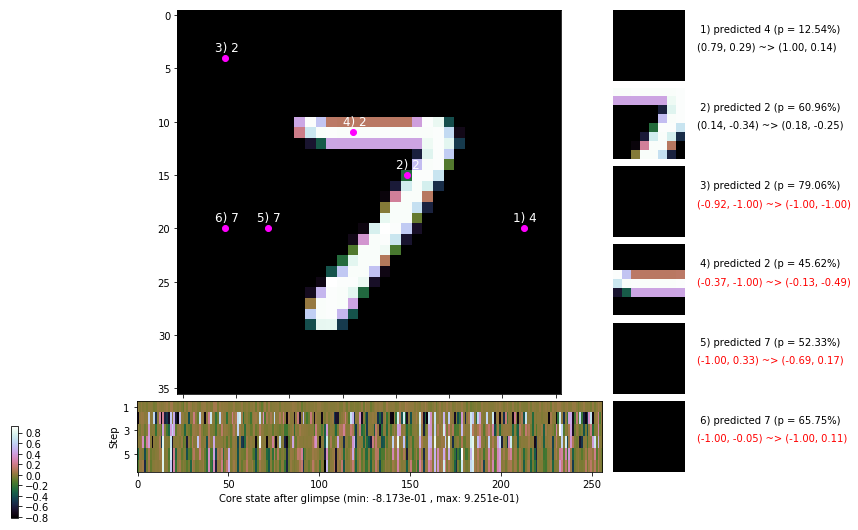

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 144.1 ms/b | lr: 8.07e-04 | grad 2norm: 12.31 | grad inf norm:  3.377
         Weights || abs max:  2.00 (15362.61) | mean:  1.55e-04 ( 0.04) | var: 4.43e-02 (93776.66)
          Biases || abs max:  1.10 (  244.11) | mean: -9.81e-02 ( 0.19) | var: 5.16e-02 (  951.68)
                    class loss: 0.598 | steps: 2.543 | reward:  3.987 | acc.: 79.23%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 137.6 ms/b | lr: 8.06e-04 | grad 2norm: 12.15 | grad inf norm:  3.166
         Weights || abs max:  2.00 ( 3888.14) | mean:  1.54e-04 ( 0.02) | var: 4.45e-02 ( 2020.82)
          Biases || abs max:  1.11 (  168.07) | mean: -9.87e-02 ( 0.16) | var: 5.19e-02 (  239.25)
                    class loss: 0.601 | steps: 2.536 | reward:  4.008 | acc.: 79.47%

	Target class: 3 | Discounted rewards: [1.969, 1.938, 1.8

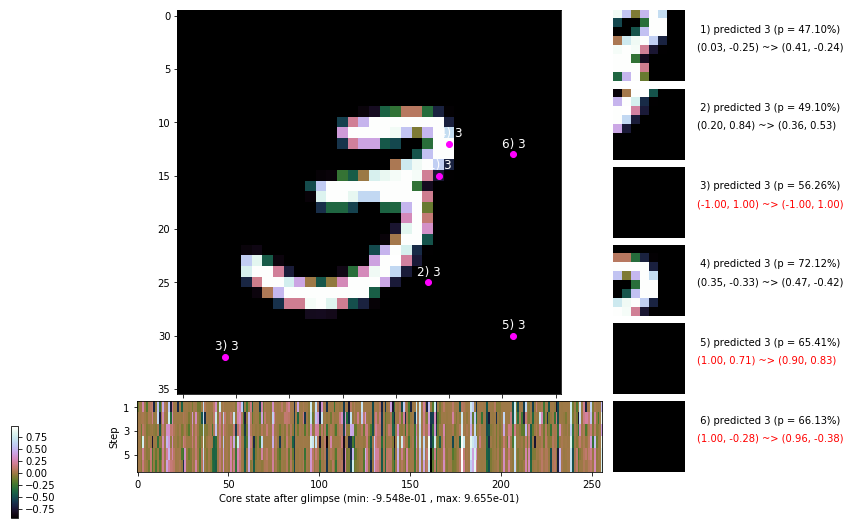

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 139.1 ms/b | lr: 8.05e-04 | grad 2norm: 12.18 | grad inf norm:  3.254
         Weights || abs max:  2.00 ( 3892.47) | mean:  1.06e-04 ( 0.02) | var: 4.46e-02 (  501.07)
          Biases || abs max:  1.11 (   87.80) | mean: -9.94e-02 ( 0.11) | var: 5.21e-02 (   33.63)
                    class loss: 0.608 | steps: 2.550 | reward:  3.989 | acc.: 79.15%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 138.3 ms/b | lr: 8.04e-04 | grad 2norm: 12.27 | grad inf norm:  3.314
         Weights || abs max:  2.00 ( 2277.71) | mean:  1.38e-04 ( 0.01) | var: 4.48e-02 (   72.12)
          Biases || abs max:  1.12 (  164.11) | mean: -9.95e-02 ( 0.14) | var: 5.21e-02 (  427.24)
                    class loss: 0.587 | steps: 2.520 | reward:  4.035 | acc.: 79.88%

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.8

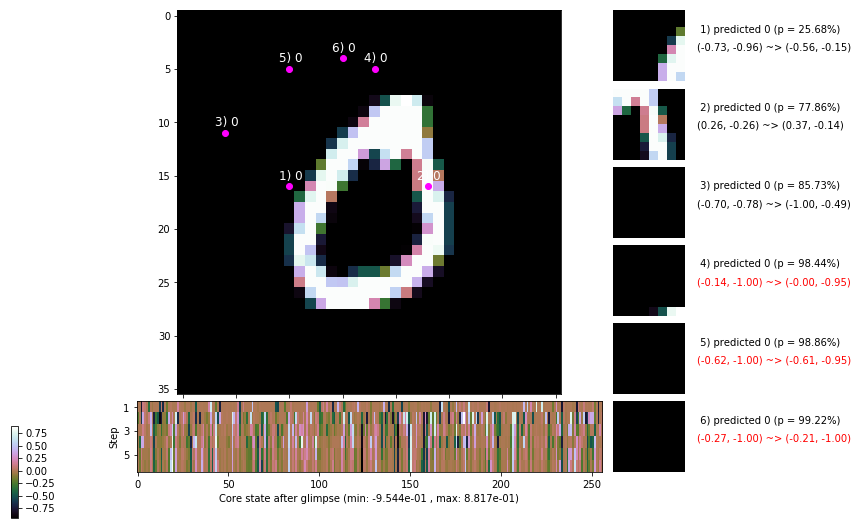

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 138.7 ms/b | lr: 8.02e-04 | grad 2norm: 12.03 | grad inf norm:  3.154
         Weights || abs max:  2.00 ( 2965.87) | mean:  1.47e-04 ( 0.01) | var: 4.50e-02 (  141.41)
          Biases || abs max:  1.12 (  302.01) | mean: -9.94e-02 ( 0.20) | var: 5.22e-02 ( 4236.69)
                    class loss: 0.580 | steps: 2.543 | reward:  3.996 | acc.: 79.78%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 138.1 ms/b | lr: 8.02e-04 | grad 2norm: 12.43 | grad inf norm:  3.370
         Weights || abs max:  2.00 ( 5506.94) | mean:  1.71e-04 ( 0.02) | var: 4.52e-02 ( 2670.93)
          Biases || abs max:  1.11 (  119.18) | mean: -1.00e-01 ( 0.13) | var: 5.25e-02 (   55.03)
                    class loss: 0.600 | steps: 2.558 | reward:  3.979 | acc.: 78.95%

	Target class: 9 | Discounted rewards: [0.201, 0.423, 0.8

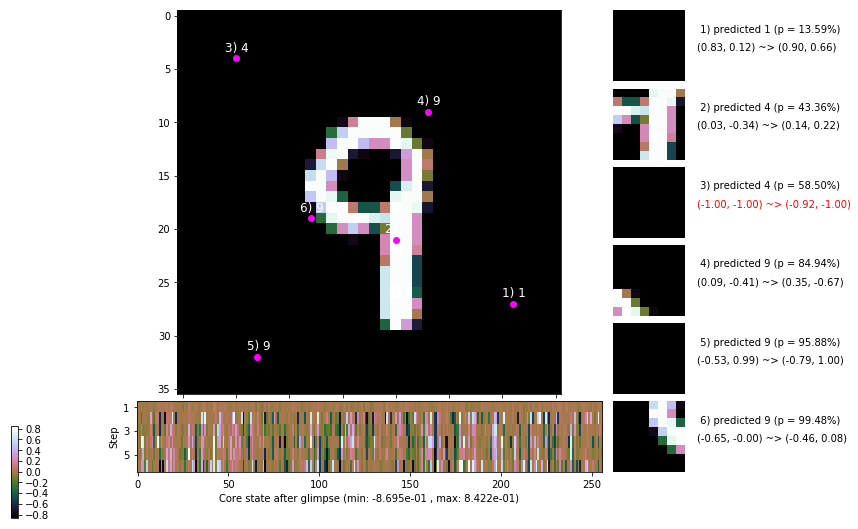

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 140.0 ms/b | lr: 8.00e-04 | grad 2norm: 12.19 | grad inf norm:  3.242
         Weights || abs max:  2.00 ( 8498.54) | mean:  1.93e-04 ( 0.03) | var: 4.53e-02 ( 4836.99)
          Biases || abs max:  1.11 (  241.85) | mean: -1.02e-01 ( 0.20) | var: 5.29e-02 ( 2194.48)
                    class loss: 0.623 | steps: 2.564 | reward:  3.953 | acc.: 78.72%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.1 ms/b | lr: 7.99e-04 | grad 2norm: 12.09 | grad inf norm:  3.256
         Weights || abs max:  2.00 (14453.15) | mean:  1.92e-04 ( 0.04) | var: 4.55e-02 (42145.48)
          Biases || abs max:  1.11 (  191.17) | mean: -1.01e-01 ( 0.16) | var: 5.32e-02 (  182.05)
                    class loss: 0.616 | steps: 2.570 | reward:  3.970 | acc.: 79.07%

	Target class: 6 | Discounted rewards: [0.959, 1.938, 1.8

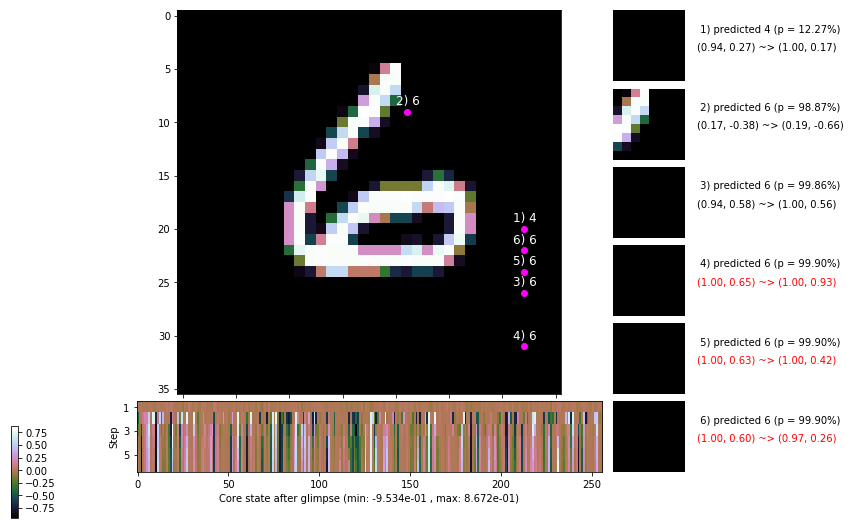

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


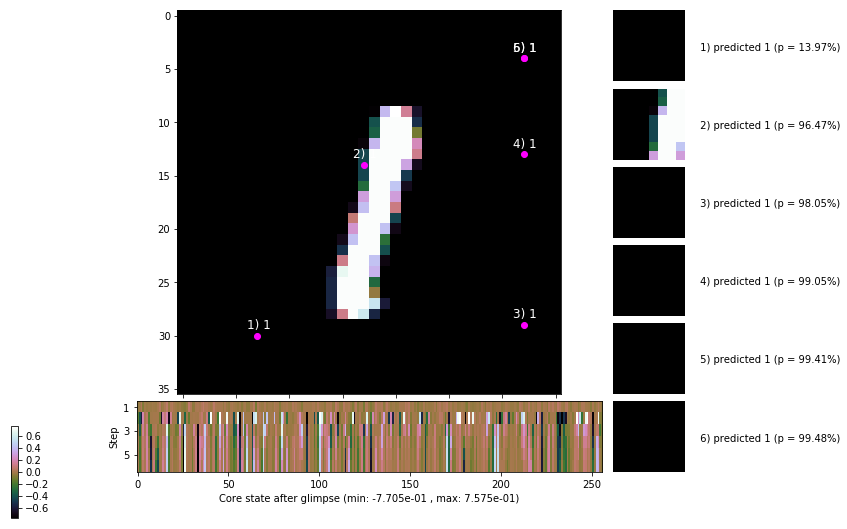


	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


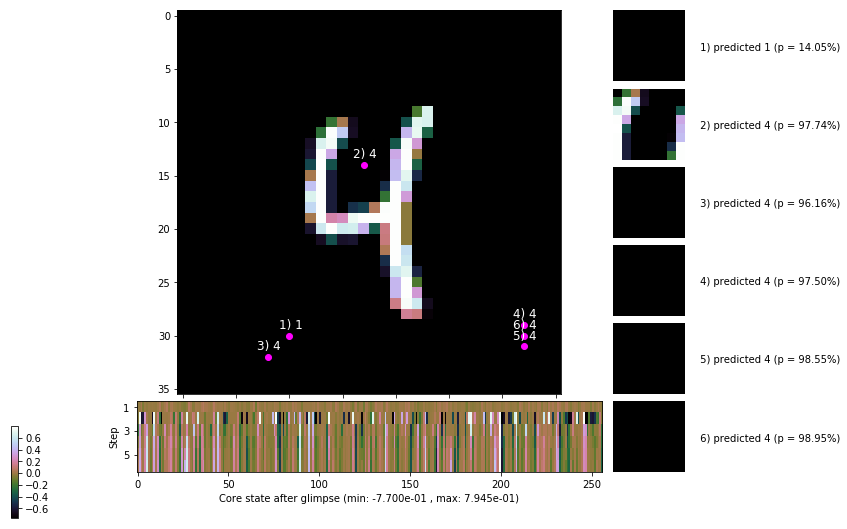

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


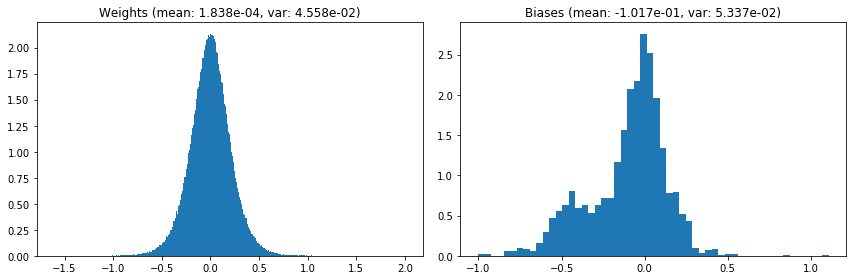

                                      Location network weights and biases


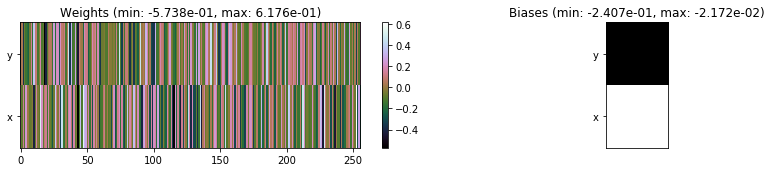

---------------------------------------------------------------------------------------------------------------
Elapsed time:  420.37 sec | TRAIN >> class loss: 0.6021 | steps:  2.552    | reward:  3.9867    | acc.: 79.278% :(
                          | VAL   >> class loss: 0.6030 | steps:  2.462 :( | reward:  4.0848 :( | acc.: 79.100% :(


Epoch  16/400) lr = 0.0007984
 b    300/  3000 >> 136.2 ms/b | lr: 7.98e-04 | grad 2norm: 11.86 | grad inf norm:  3.214
         Weights || abs max:  2.00 ( 2789.23) | mean:  1.87e-04 ( 0.01) | var: 4.57e-02 (  153.49)
          Biases || abs max:  1.11 (  174.43) | mean: -1.02e-01 ( 0.17) | var: 5.35e-02 (  264.86)
                    class loss: 0.591 | steps: 2.556 | reward:  4.006 | acc.: 80.10%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 137.0 ms/b | lr: 7.97e-04 | grad 2norm: 12.16 | grad inf norm:  3.176
         Weights || abs max:  2.00 ( 3708.65) | mean:  2.04e-04 (

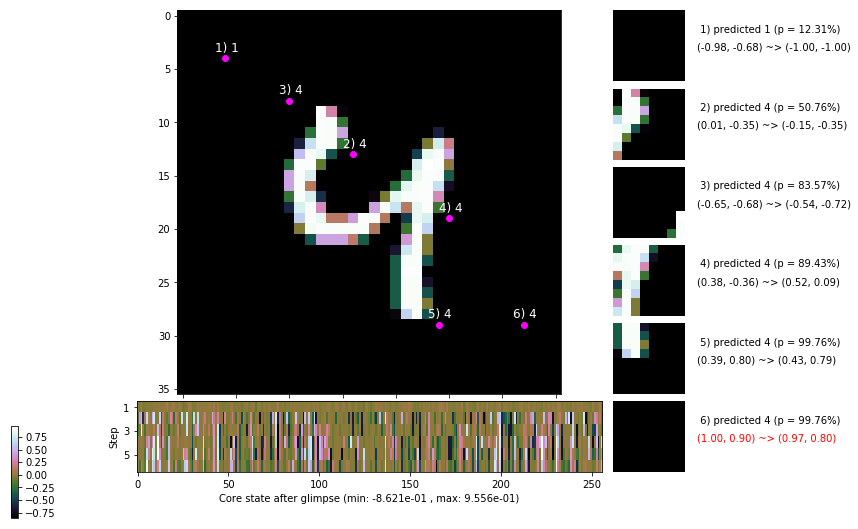

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 139.4 ms/b | lr: 7.95e-04 | grad 2norm: 11.96 | grad inf norm:  3.272
         Weights || abs max:  2.02 ( 4837.24) | mean:  2.26e-04 ( 0.02) | var: 4.60e-02 ( 2683.93)
          Biases || abs max:  1.11 (  140.46) | mean: -1.01e-01 ( 0.14) | var: 5.40e-02 (  142.07)
                    class loss: 0.606 | steps: 2.570 | reward:  3.989 | acc.: 79.43%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 135.9 ms/b | lr: 7.94e-04 | grad 2norm: 12.13 | grad inf norm:  3.165
         Weights || abs max:  2.02 ( 3989.42) | mean:  2.70e-04 ( 0.02) | var: 4.62e-02 (  333.73)
          Biases || abs max:  1.11 (  113.57) | mean: -1.02e-01 ( 0.12) | var: 5.42e-02 (   86.41)
                    class loss: 0.589 | steps: 2.572 | reward:  3.978 | acc.: 79.32%

	Target class: 3 | Discounted rewards: [0.012, 0.044, 0.1

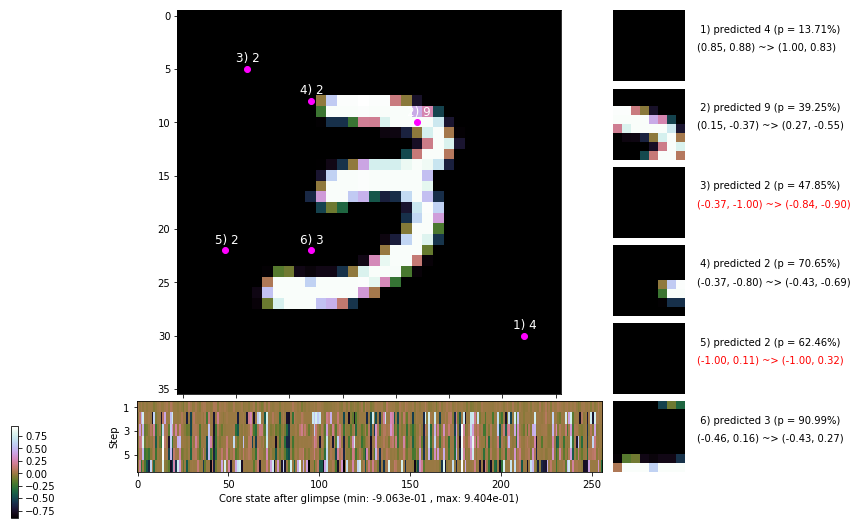

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 140.4 ms/b | lr: 7.93e-04 | grad 2norm: 12.35 | grad inf norm:  3.259
         Weights || abs max:  2.00 ( 3211.18) | mean:  2.71e-04 ( 0.02) | var: 4.63e-02 (  252.65)
          Biases || abs max:  1.11 (  164.87) | mean: -1.02e-01 ( 0.14) | var: 5.44e-02 (  177.94)
                    class loss: 0.589 | steps: 2.569 | reward:  3.985 | acc.: 80.07%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 135.1 ms/b | lr: 7.92e-04 | grad 2norm: 11.93 | grad inf norm:  3.067
         Weights || abs max:  2.00 ( 3586.23) | mean:  2.65e-04 ( 0.02) | var: 4.65e-02 (  438.02)
          Biases || abs max:  1.11 (  121.00) | mean: -1.03e-01 ( 0.11) | var: 5.45e-02 (   79.11)
                    class loss: 0.578 | steps: 2.525 | reward:  4.039 | acc.: 80.53%

	Target class: 3 | Discounted rewards: [0.959, 1.938, 1.8

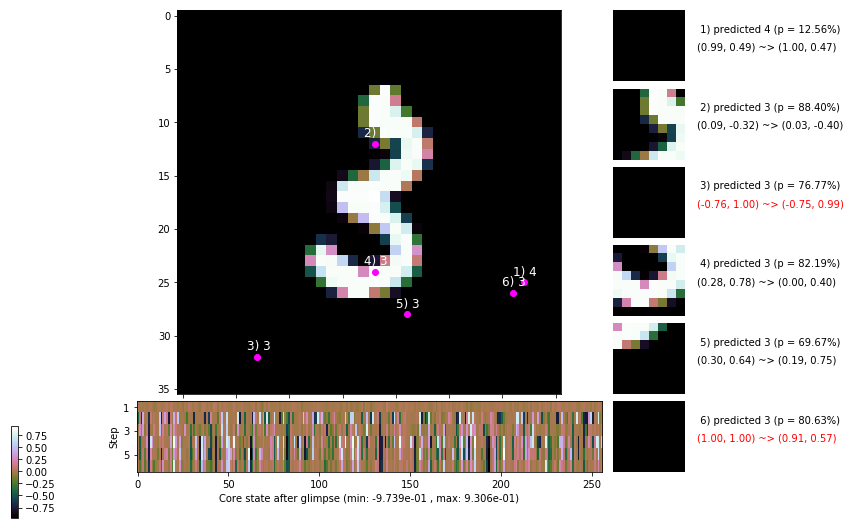

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 137.5 ms/b | lr: 7.90e-04 | grad 2norm: 12.21 | grad inf norm:  3.324
         Weights || abs max:  2.02 ( 3918.36) | mean:  3.32e-04 ( 0.02) | var: 4.66e-02 (  215.36)
          Biases || abs max:  1.10 (   76.24) | mean: -1.04e-01 ( 0.09) | var: 5.50e-02 (   65.46)
                    class loss: 0.590 | steps: 2.545 | reward:  4.015 | acc.: 80.20%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 134.5 ms/b | lr: 7.90e-04 | grad 2norm: 11.92 | grad inf norm:  3.356
         Weights || abs max:  2.01 ( 2194.48) | mean:  3.03e-04 ( 0.01) | var: 4.68e-02 (   84.10)
          Biases || abs max:  1.11 (  123.68) | mean: -1.04e-01 ( 0.12) | var: 5.52e-02 (   64.32)
                    class loss: 0.553 | steps: 2.534 | reward:  4.047 | acc.: 80.92%

	Target class: 2 | Discounted rewards: [0.959, 1.938, 1.8

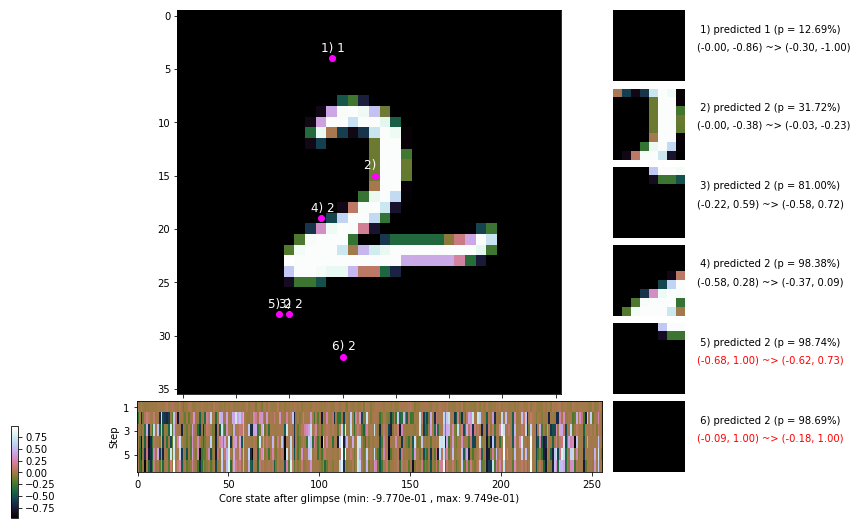

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 136.2 ms/b | lr: 7.88e-04 | grad 2norm: 11.80 | grad inf norm:  3.060
         Weights || abs max:  2.03 ( 3016.67) | mean:  3.36e-04 ( 0.01) | var: 4.70e-02 (  297.88)
          Biases || abs max:  1.11 (  165.08) | mean: -1.04e-01 ( 0.14) | var: 5.55e-02 (  136.18)
                    class loss: 0.562 | steps: 2.530 | reward:  4.040 | acc.: 80.97%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.0 ms/b | lr: 7.87e-04 | grad 2norm: 12.11 | grad inf norm:  3.232
         Weights || abs max:  2.00 ( 3884.13) | mean:  3.60e-04 ( 0.02) | var: 4.71e-02 (  407.10)
          Biases || abs max:  1.11 (   83.15) | mean: -1.04e-01 ( 0.10) | var: 5.56e-02 (   15.44)
                    class loss: 0.572 | steps: 2.526 | reward:  4.031 | acc.: 80.72%

	Target class: 5 | Discounted rewards: [1.969, 1.938, 1.8

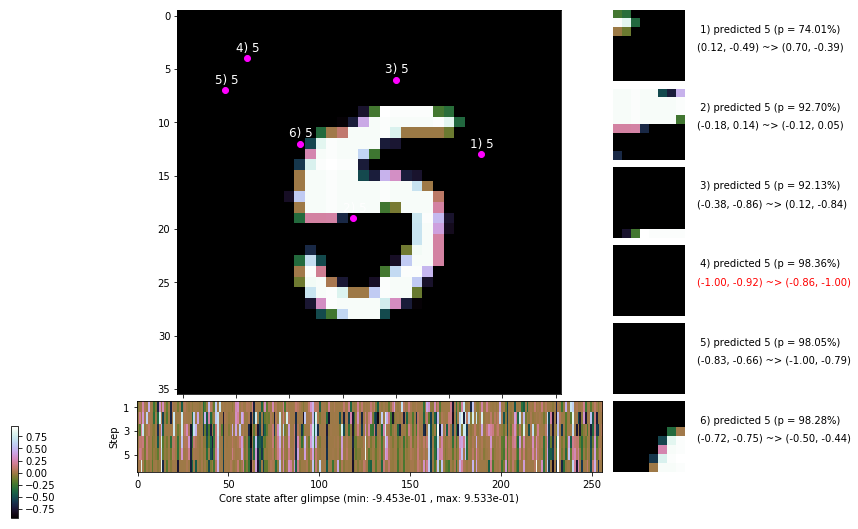

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 3 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


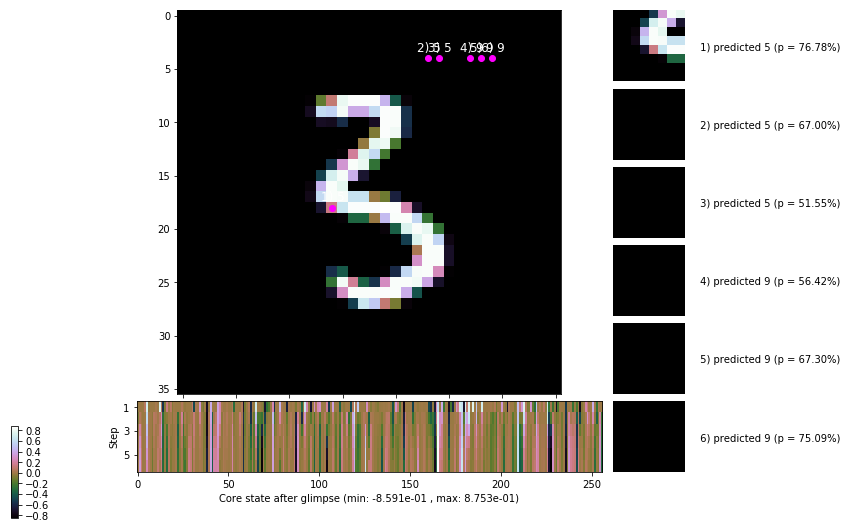


	Target class: 9 | Discounted rewards: [1.748, 1.496, 0.991, -0.018, -0.015, -0.010]


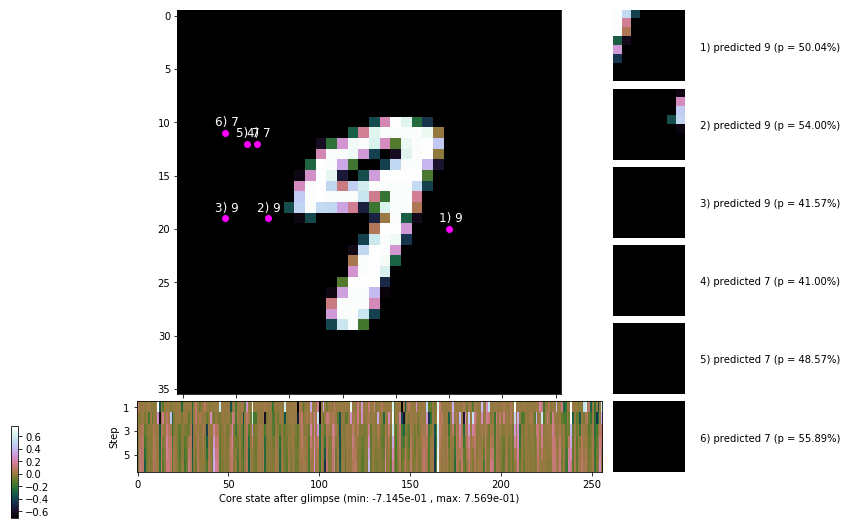

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


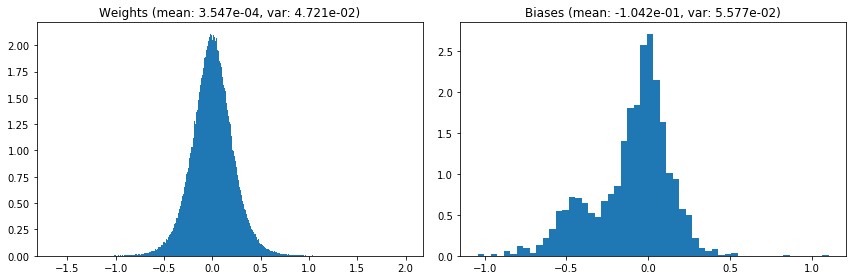

                                      Location network weights and biases


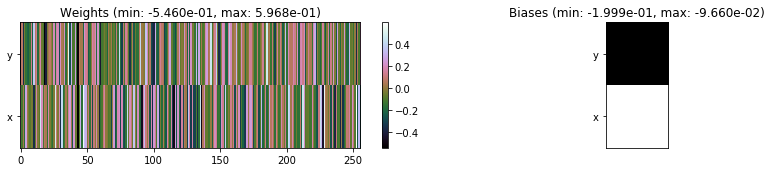

---------------------------------------------------------------------------------------------------------------
Elapsed time:  410.43 sec | TRAIN >> class loss: 0.5829 | steps:  2.547    | reward:  4.0108    | acc.: 80.165% 
                          | VAL   >> class loss: 0.5840 | steps:  2.471 :( | reward:  4.0755 :( | acc.: 79.200% :(


Epoch  17/400) lr = 0.0007865
 b    300/  3000 >> 133.6 ms/b | lr: 7.86e-04 | grad 2norm: 11.79 | grad inf norm:  3.165
         Weights || abs max:  1.99 ( 3632.59) | mean:  3.59e-04 ( 0.02) | var: 4.73e-02 (  262.35)
          Biases || abs max:  1.11 (  163.29) | mean: -1.04e-01 ( 0.14) | var: 5.58e-02 (  422.63)
                    class loss: 0.561 | steps: 2.504 | reward:  4.049 | acc.: 80.82%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 134.8 ms/b | lr: 7.85e-04 | grad 2norm: 12.03 | grad inf norm:  3.285
         Weights || abs max:  1.99 ( 3442.28) | mean:  3.35e-04 ( 0

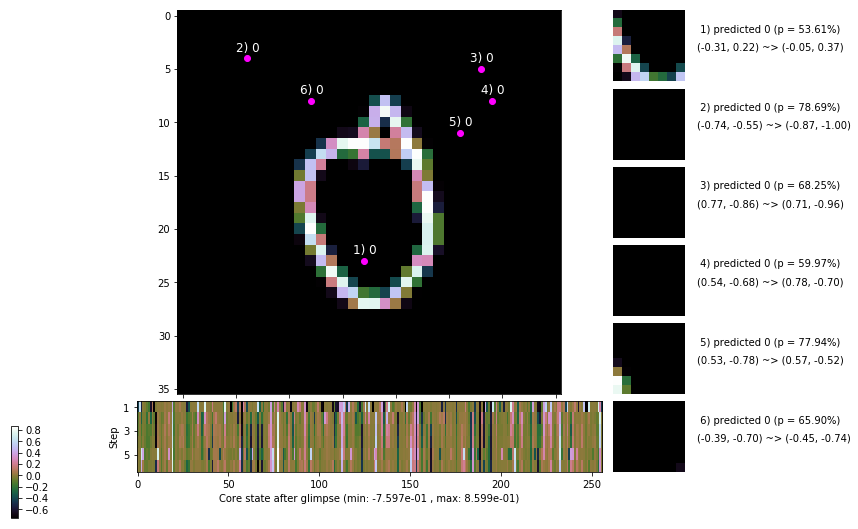

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 136.7 ms/b | lr: 7.83e-04 | grad 2norm: 11.95 | grad inf norm:  3.271
         Weights || abs max:  2.01 ( 4967.42) | mean:  3.20e-04 ( 0.02) | var: 4.76e-02 (  644.63)
          Biases || abs max:  1.11 (  777.87) | mean: -1.05e-01 ( 0.37) | var: 5.62e-02 (18067.47)
                    class loss: 0.593 | steps: 2.527 | reward:  4.020 | acc.: 79.45%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 135.7 ms/b | lr: 7.83e-04 | grad 2norm: 11.81 | grad inf norm:  3.138
         Weights || abs max:  2.03 ( 4240.63) | mean:  3.25e-04 ( 0.02) | var: 4.77e-02 (  399.80)
          Biases || abs max:  1.11 (  185.83) | mean: -1.06e-01 ( 0.14) | var: 5.66e-02 ( 1220.68)
                    class loss: 0.582 | steps: 2.553 | reward:  4.012 | acc.: 80.25%

	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.8

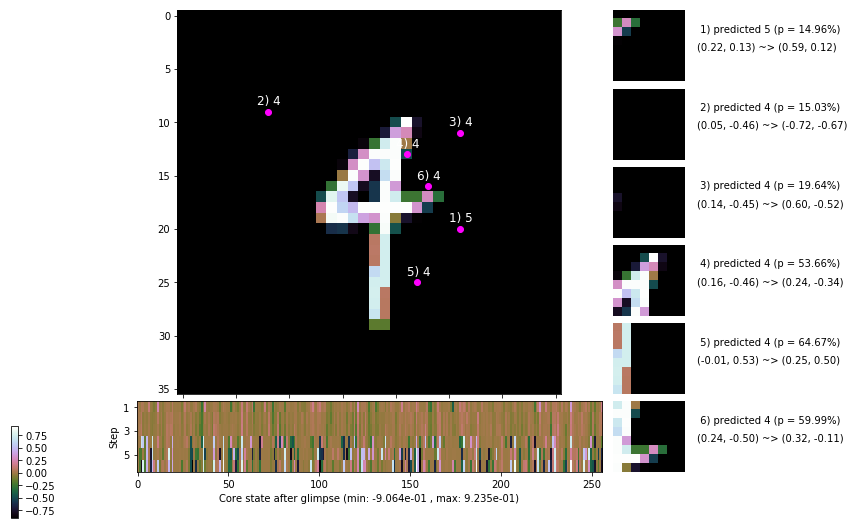

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 133.4 ms/b | lr: 7.81e-04 | grad 2norm: 11.77 | grad inf norm:  3.106
         Weights || abs max:  2.04 ( 2913.20) | mean:  2.89e-04 ( 0.02) | var: 4.79e-02 (  173.28)
          Biases || abs max:  1.11 (  146.96) | mean: -1.05e-01 ( 0.13) | var: 5.67e-02 (  175.29)
                    class loss: 0.568 | steps: 2.514 | reward:  4.058 | acc.: 81.10%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 134.4 ms/b | lr: 7.80e-04 | grad 2norm: 11.77 | grad inf norm:  3.216
         Weights || abs max:  2.04 ( 9786.34) | mean:  2.93e-04 ( 0.03) | var: 4.81e-02 (22501.80)
          Biases || abs max:  1.12 (  183.02) | mean: -1.06e-01 ( 0.16) | var: 5.70e-02 (  246.14)
                    class loss: 0.579 | steps: 2.541 | reward:  4.025 | acc.: 79.98%

	Target class: 3 | Discounted rewards: [1.969, 1.938, 1.8

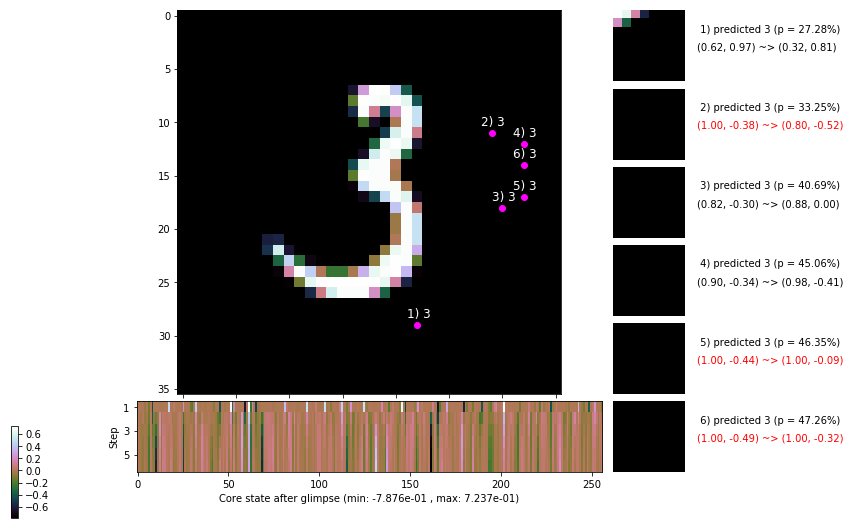

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 137.0 ms/b | lr: 7.79e-04 | grad 2norm: 11.93 | grad inf norm:  3.250
         Weights || abs max:  2.05 ( 2428.81) | mean:  2.83e-04 ( 0.01) | var: 4.83e-02 (  182.79)
          Biases || abs max:  1.11 (  278.55) | mean: -1.06e-01 ( 0.24) | var: 5.73e-02 ( 1359.35)
                    class loss: 0.581 | steps: 2.509 | reward:  4.039 | acc.: 80.45%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 133.0 ms/b | lr: 7.78e-04 | grad 2norm: 11.87 | grad inf norm:  3.309
         Weights || abs max:  2.06 ( 4014.72) | mean:  2.81e-04 ( 0.02) | var: 4.84e-02 (  662.55)
          Biases || abs max:  1.11 ( 1062.25) | mean: -1.06e-01 ( 0.49) | var: 5.77e-02 (73833.02)
                    class loss: 0.577 | steps: 2.533 | reward:  4.037 | acc.: 80.53%

	Target class: 5 | Discounted rewards: [1.969, 1.938, 1.8

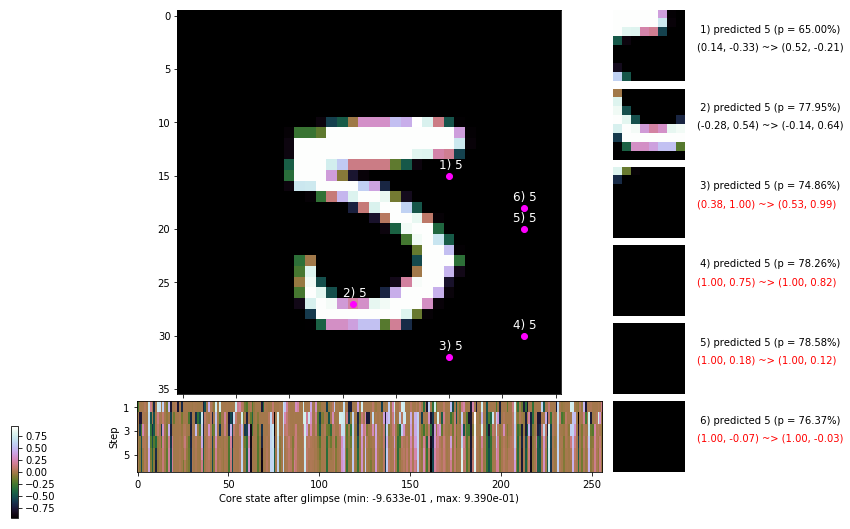

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 138.7 ms/b | lr: 7.76e-04 | grad 2norm: 11.73 | grad inf norm:  3.200
         Weights || abs max:  2.06 ( 4269.68) | mean:  2.60e-04 ( 0.02) | var: 4.86e-02 (  708.94)
          Biases || abs max:  1.11 (   83.51) | mean: -1.07e-01 ( 0.11) | var: 5.80e-02 (   25.97)
                    class loss: 0.588 | steps: 2.518 | reward:  4.040 | acc.: 80.55%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.6 ms/b | lr: 7.76e-04 | grad 2norm: 11.64 | grad inf norm:  3.159
         Weights || abs max:  2.05 ( 5356.97) | mean:  2.62e-04 ( 0.02) | var: 4.88e-02 ( 1749.26)
          Biases || abs max:  1.12 (  162.55) | mean: -1.07e-01 ( 0.14) | var: 5.82e-02 (  173.95)
                    class loss: 0.564 | steps: 2.521 | reward:  4.069 | acc.: 81.53%

	Target class: 5 | Discounted rewards: [1.969, 1.938, 1.8

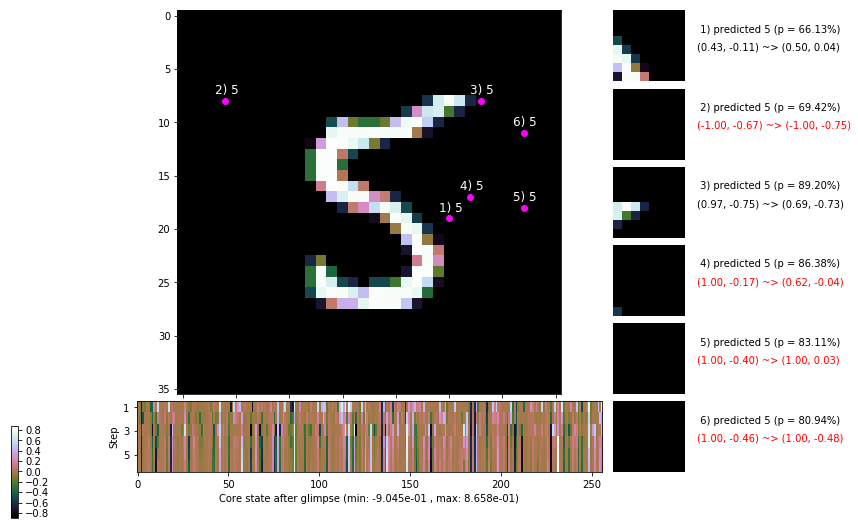

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 2 | Discounted rewards: [0.170, 0.359, 0.739, 1.497, 0.995, -0.010]


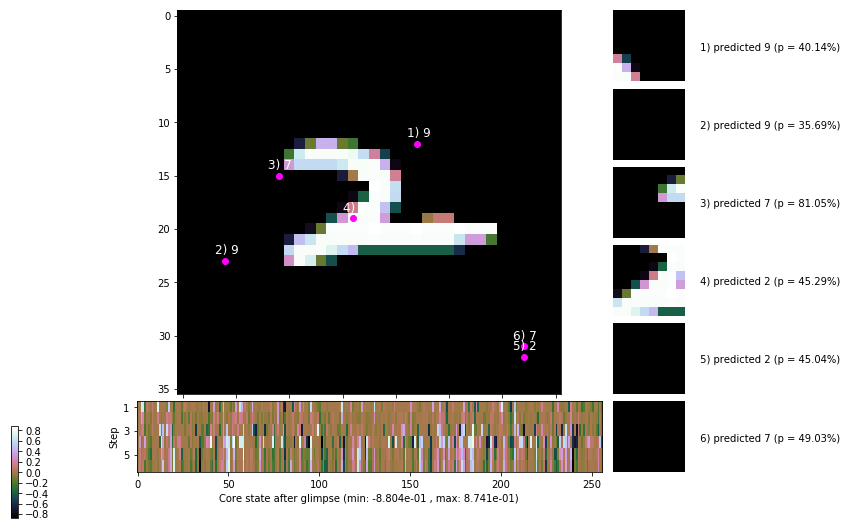


	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


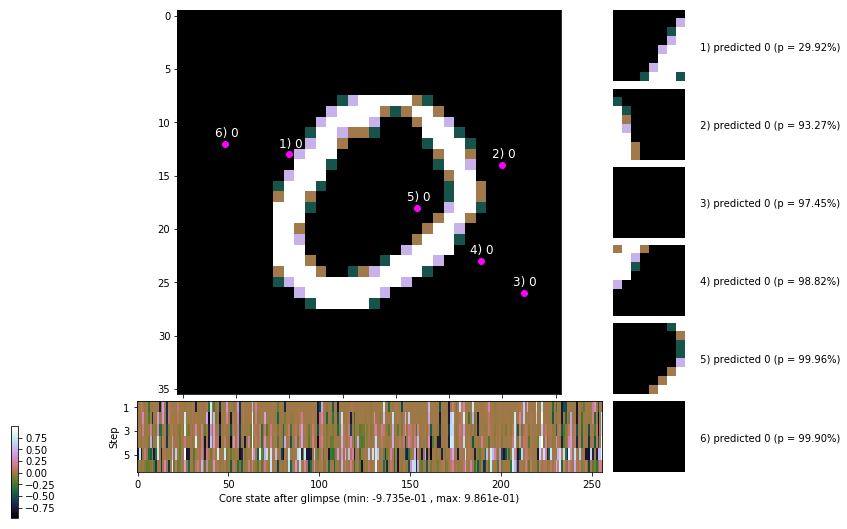

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


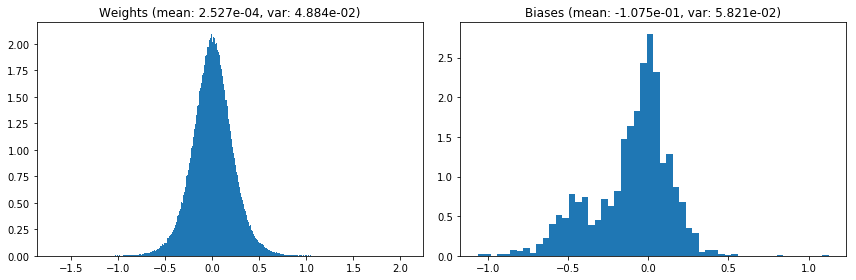

                                      Location network weights and biases


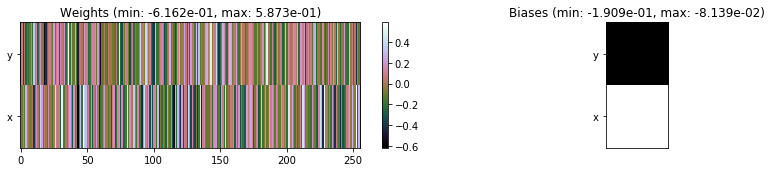

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.81 sec | TRAIN >> class loss: 0.5788 | steps:  2.523    | reward:  4.0377    | acc.: 80.460% 
                          | VAL   >> class loss: 0.5670 | steps:  2.430    | reward:  4.1634    | acc.: 80.720% 


Epoch  18/400) lr = 0.0007748
 b    300/  3000 >> 134.0 ms/b | lr: 7.74e-04 | grad 2norm: 11.56 | grad inf norm:  3.176
         Weights || abs max:  2.06 ( 3400.87) | mean:  2.41e-04 ( 0.02) | var: 4.89e-02 (  343.76)
          Biases || abs max:  1.13 (   72.76) | mean: -1.08e-01 ( 0.10) | var: 5.83e-02 (   14.85)
                    class loss: 0.548 | steps: 2.522 | reward:  4.063 | acc.: 81.53%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 134.0 ms/b | lr: 7.73e-04 | grad 2norm: 11.85 | grad inf norm:  3.183
         Weights || abs max:  2.07 ( 2770.77) | mean:  2.41e-04 ( 0.0

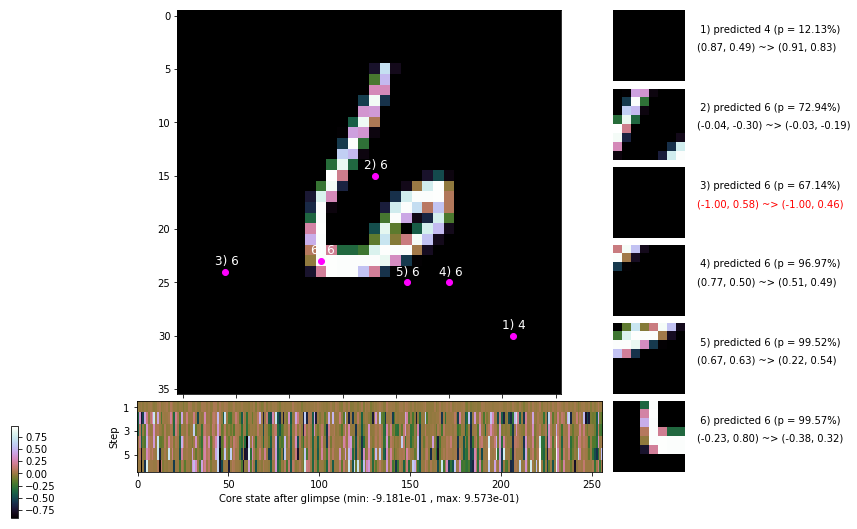

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 135.4 ms/b | lr: 7.72e-04 | grad 2norm: 11.44 | grad inf norm:  3.029
         Weights || abs max:  2.08 ( 2824.28) | mean:  2.19e-04 ( 0.01) | var: 4.92e-02 (  327.56)
          Biases || abs max:  1.12 (   91.24) | mean: -1.09e-01 ( 0.10) | var: 5.87e-02 (   31.89)
                    class loss: 0.548 | steps: 2.502 | reward:  4.065 | acc.: 81.02%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 132.1 ms/b | lr: 7.71e-04 | grad 2norm: 11.88 | grad inf norm:  3.211
         Weights || abs max:  2.07 ( 3256.60) | mean:  1.87e-04 ( 0.02) | var: 4.94e-02 (  337.87)
          Biases || abs max:  1.12 (  129.48) | mean: -1.09e-01 ( 0.13) | var: 5.88e-02 (   53.85)
                    class loss: 0.563 | steps: 2.563 | reward:  4.027 | acc.: 81.03%

	Target class: 2 | Discounted rewards: [1.969, 1.938, 1.8

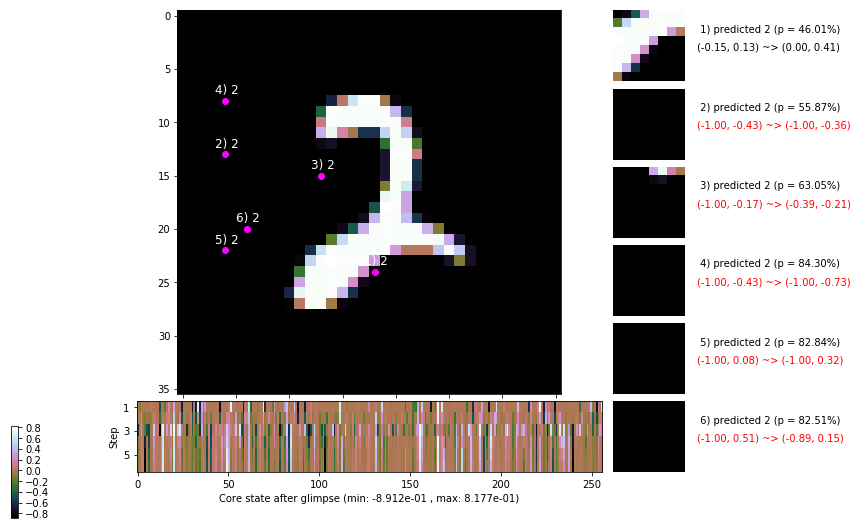

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 136.6 ms/b | lr: 7.69e-04 | grad 2norm: 11.47 | grad inf norm:  3.064
         Weights || abs max:  2.06 ( 3393.01) | mean:  1.95e-04 ( 0.02) | var: 4.95e-02 (  269.79)
          Biases || abs max:  1.12 (  238.79) | mean: -1.09e-01 ( 0.18) | var: 5.91e-02 ( 2237.75)
                    class loss: 0.568 | steps: 2.562 | reward:  4.008 | acc.: 80.60%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 134.4 ms/b | lr: 7.69e-04 | grad 2norm: 11.79 | grad inf norm:  3.177
         Weights || abs max:  2.06 ( 2141.61) | mean:  1.98e-04 ( 0.01) | var: 4.96e-02 (   42.64)
          Biases || abs max:  1.11 (  146.76) | mean: -1.10e-01 ( 0.14) | var: 5.93e-02 (  498.85)
                    class loss: 0.581 | steps: 2.554 | reward:  3.986 | acc.: 79.72%

	Target class: 5 | Discounted rewards: [1.969, 1.938, 1.8

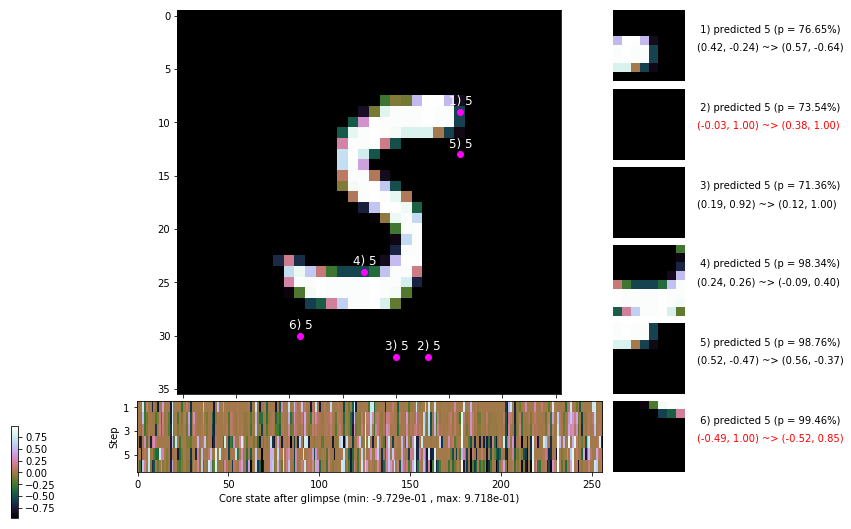

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 135.0 ms/b | lr: 7.67e-04 | grad 2norm: 11.52 | grad inf norm:  2.976
         Weights || abs max:  2.06 ( 3161.27) | mean:  2.04e-04 ( 0.02) | var: 4.98e-02 (  202.08)
          Biases || abs max:  1.12 (  212.97) | mean: -1.09e-01 ( 0.15) | var: 5.93e-02 ( 1268.09)
                    class loss: 0.568 | steps: 2.546 | reward:  4.000 | acc.: 80.13%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 136.2 ms/b | lr: 7.66e-04 | grad 2norm: 11.93 | grad inf norm:  3.275
         Weights || abs max:  2.07 ( 4515.12) | mean:  2.45e-04 ( 0.02) | var: 5.00e-02 ( 1014.65)
          Biases || abs max:  1.11 (  126.22) | mean: -1.10e-01 ( 0.12) | var: 5.96e-02 (  128.77)
                    class loss: 0.586 | steps: 2.574 | reward:  3.972 | acc.: 80.13%

	Target class: 5 | Discounted rewards: [0.959, 1.938, 1.8

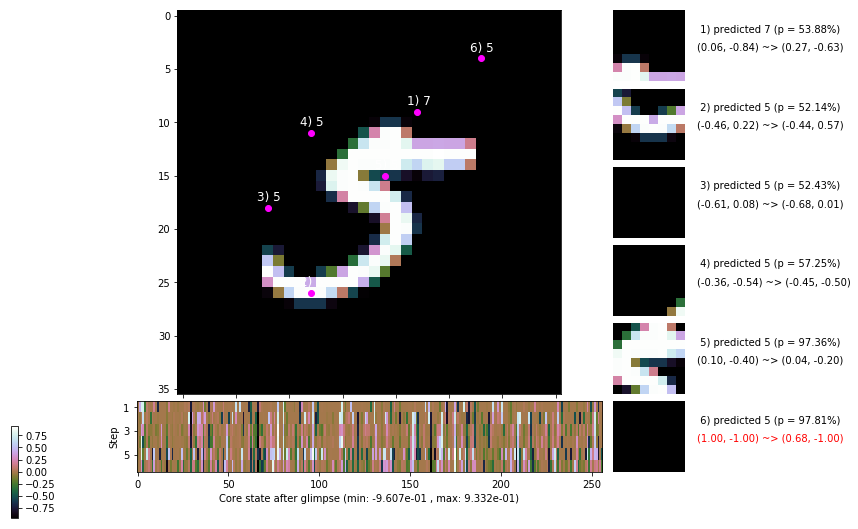

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 135.3 ms/b | lr: 7.65e-04 | grad 2norm: 11.76 | grad inf norm:  3.183
         Weights || abs max:  2.08 ( 2930.82) | mean:  2.29e-04 ( 0.01) | var: 5.01e-02 (  148.47)
          Biases || abs max:  1.12 (  217.01) | mean: -1.10e-01 ( 0.14) | var: 5.99e-02 ( 1657.73)
                    class loss: 0.582 | steps: 2.543 | reward:  4.009 | acc.: 80.35%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.2 ms/b | lr: 7.64e-04 | grad 2norm: 11.64 | grad inf norm:  3.267
         Weights || abs max:  2.09 ( 3323.12) | mean:  2.21e-04 ( 0.02) | var: 5.03e-02 (  270.16)
          Biases || abs max:  1.13 (  131.40) | mean: -1.10e-01 ( 0.12) | var: 5.99e-02 (   71.26)
                    class loss: 0.557 | steps: 2.525 | reward:  4.059 | acc.: 80.90%

	Target class: 3 | Discounted rewards: [1.085, 0.170, 0.3

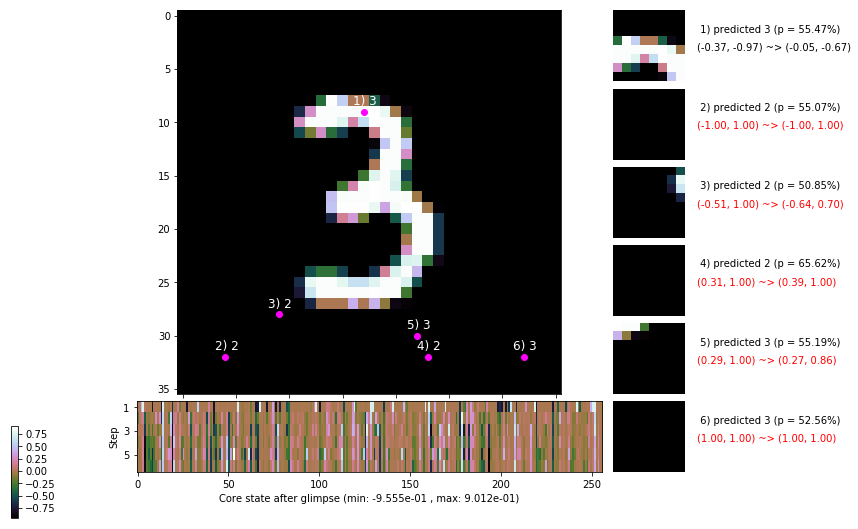

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 5 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


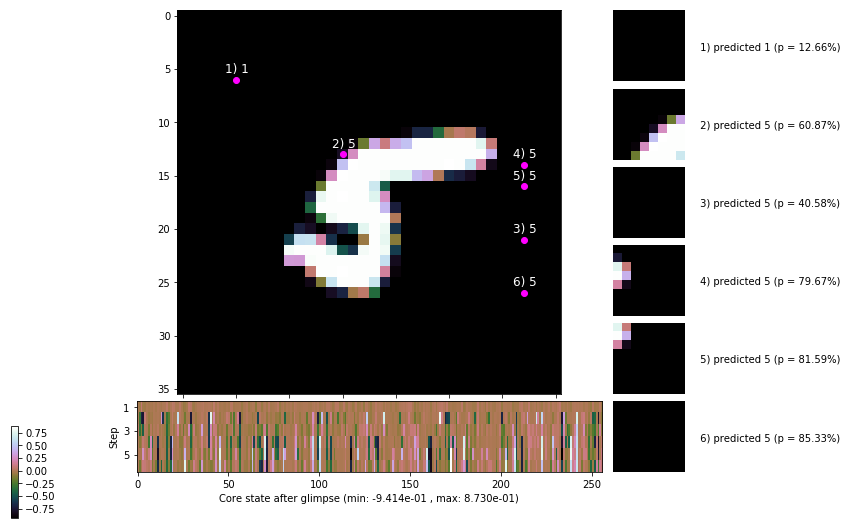


	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


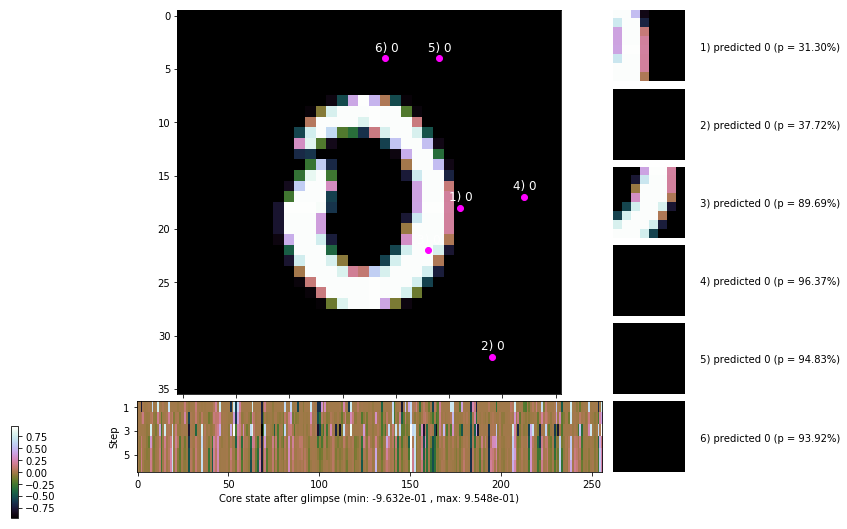

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


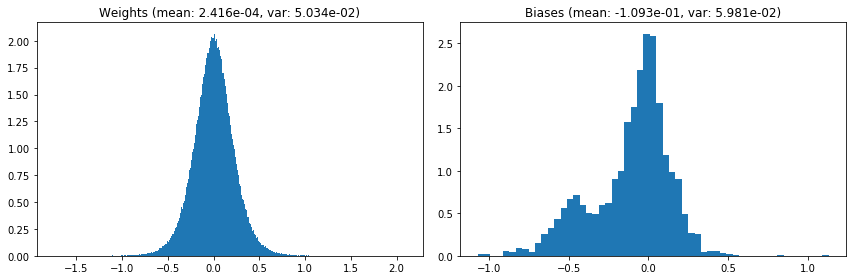

                                      Location network weights and biases


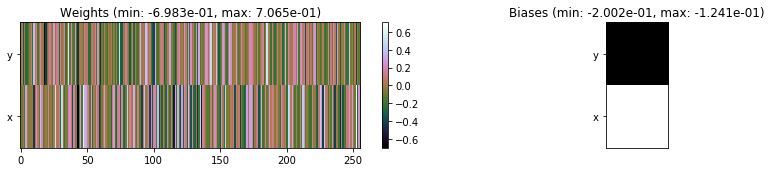

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.76 sec | TRAIN >> class loss: 0.5703 | steps:  2.548 :( | reward:  4.0139 :( | acc.: 80.463% 
                          | VAL   >> class loss: 0.6288 | steps:  2.492 :( | reward:  4.0299 :( | acc.: 78.180% :(


Epoch  19/400) lr = 0.0007633
 b    300/  3000 >> 133.9 ms/b | lr: 7.63e-04 | grad 2norm: 11.71 | grad inf norm:  3.267
         Weights || abs max:  2.09 ( 4589.72) | mean:  2.14e-04 ( 0.02) | var: 5.04e-02 (  890.31)
          Biases || abs max:  1.12 (  103.80) | mean: -1.09e-01 ( 0.11) | var: 6.00e-02 (   27.56)
                    class loss: 0.580 | steps: 2.532 | reward:  4.005 | acc.: 80.33%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 132.3 ms/b | lr: 7.62e-04 | grad 2norm: 11.84 | grad inf norm:  3.202
         Weights || abs max:  2.10 ( 3047.04) | mean:  2.12e-04 ( 0

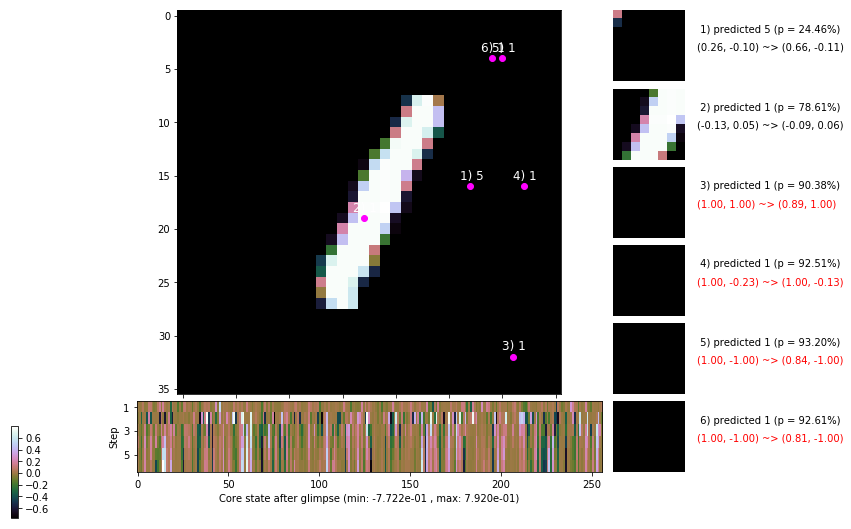

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 135.0 ms/b | lr: 7.60e-04 | grad 2norm: 11.85 | grad inf norm:  3.172
         Weights || abs max:  2.11 ( 5338.25) | mean:  2.03e-04 ( 0.02) | var: 5.08e-02 ( 2615.46)
          Biases || abs max:  1.12 (   38.90) | mean: -1.10e-01 ( 0.07) | var: 6.07e-02 (    6.07)
                    class loss: 0.592 | steps: 2.560 | reward:  3.985 | acc.: 79.68%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 137.2 ms/b | lr: 7.59e-04 | grad 2norm: 11.72 | grad inf norm:  3.206
         Weights || abs max:  2.12 ( 5550.28) | mean:  1.95e-04 ( 0.02) | var: 5.09e-02 ( 2142.37)
          Biases || abs max:  1.12 (  217.80) | mean: -1.10e-01 ( 0.19) | var: 6.09e-02 ( 2599.22)
                    class loss: 0.585 | steps: 2.553 | reward:  3.993 | acc.: 79.68%

	Target class: 2 | Discounted rewards: [0.959, 1.938, 1.8

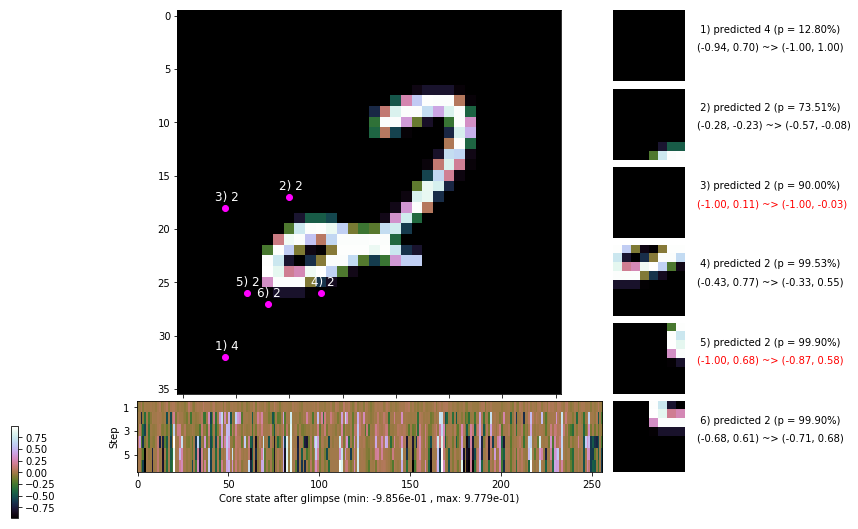

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 135.5 ms/b | lr: 7.58e-04 | grad 2norm: 11.61 | grad inf norm:  3.148
         Weights || abs max:  2.13 ( 4692.26) | mean:  1.82e-04 ( 0.02) | var: 5.10e-02 (  641.93)
          Biases || abs max:  1.13 (  444.61) | mean: -1.11e-01 ( 0.36) | var: 6.11e-02 (15550.10)
                    class loss: 0.560 | steps: 2.509 | reward:  4.076 | acc.: 80.90%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 135.1 ms/b | lr: 7.57e-04 | grad 2norm: 11.83 | grad inf norm:  3.241
         Weights || abs max:  2.14 ( 9143.50) | mean:  2.17e-04 ( 0.03) | var: 5.12e-02 (12544.27)
          Biases || abs max:  1.13 (  262.99) | mean: -1.11e-01 ( 0.17) | var: 6.13e-02 ( 3094.38)
                    class loss: 0.584 | steps: 2.537 | reward:  4.010 | acc.: 80.40%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

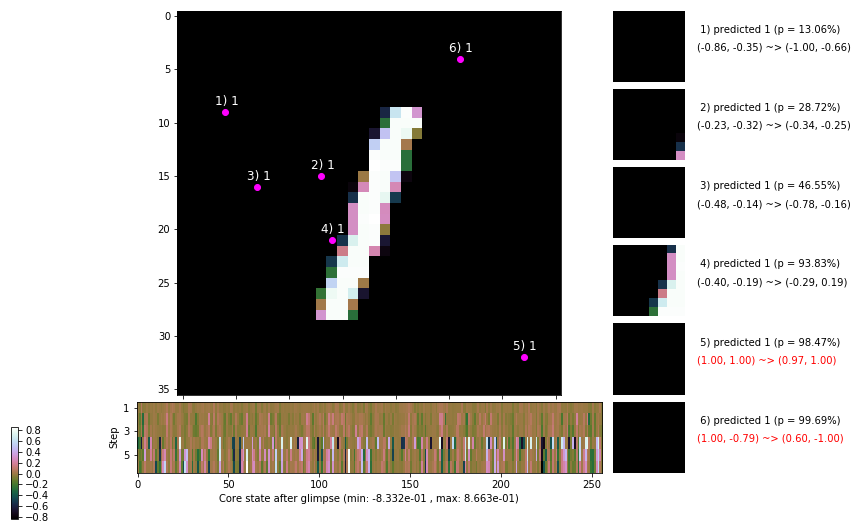

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 134.9 ms/b | lr: 7.56e-04 | grad 2norm: 11.64 | grad inf norm:  3.206
         Weights || abs max:  2.15 (29072.05) | mean:  2.29e-04 ( 0.06) | var: 5.13e-02 (167589.34)
          Biases || abs max:  1.13 (  191.33) | mean: -1.11e-01 ( 0.14) | var: 6.14e-02 (  634.77)
                    class loss: 0.573 | steps: 2.541 | reward:  4.030 | acc.: 80.63%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 136.6 ms/b | lr: 7.55e-04 | grad 2norm: 11.69 | grad inf norm:  3.261
         Weights || abs max:  2.17 ( 3199.79) | mean:  2.16e-04 ( 0.02) | var: 5.15e-02 (  181.41)
          Biases || abs max:  1.13 (  113.79) | mean: -1.12e-01 ( 0.11) | var: 6.19e-02 (  248.47)
                    class loss: 0.568 | steps: 2.529 | reward:  4.035 | acc.: 80.60%

	Target class: 7 | Discounted rewards: [0.075, 0.170, 0.

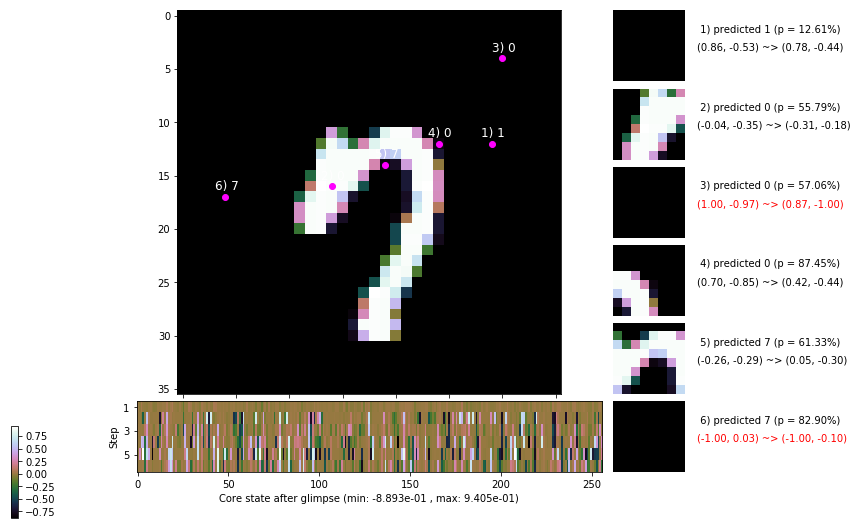

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 138.7 ms/b | lr: 7.53e-04 | grad 2norm: 11.60 | grad inf norm:  3.280
         Weights || abs max:  2.18 ( 2204.79) | mean:  2.00e-04 ( 0.01) | var: 5.16e-02 (   55.88)
          Biases || abs max:  1.13 (  308.92) | mean: -1.12e-01 ( 0.28) | var: 6.22e-02 ( 7199.76)
                    class loss: 0.571 | steps: 2.557 | reward:  4.026 | acc.: 80.60%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.3 ms/b | lr: 7.53e-04 | grad 2norm: 11.64 | grad inf norm:  3.258
         Weights || abs max:  2.19 (10448.18) | mean:  1.90e-04 ( 0.03) | var: 5.18e-02 (14797.18)
          Biases || abs max:  1.13 (  190.84) | mean: -1.12e-01 ( 0.15) | var: 6.21e-02 (  772.42)
                    class loss: 0.561 | steps: 2.525 | reward:  4.056 | acc.: 81.28%

	Target class: 5 | Discounted rewards: [0.075, 0.170, 0.3

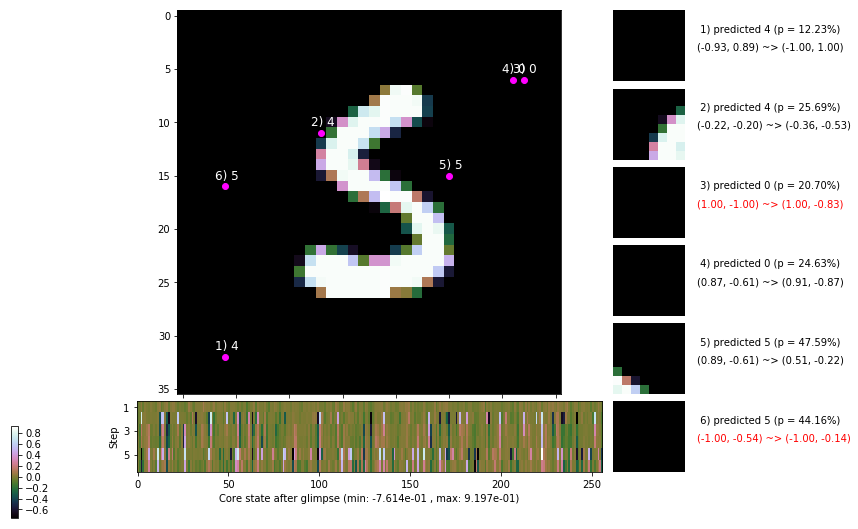

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


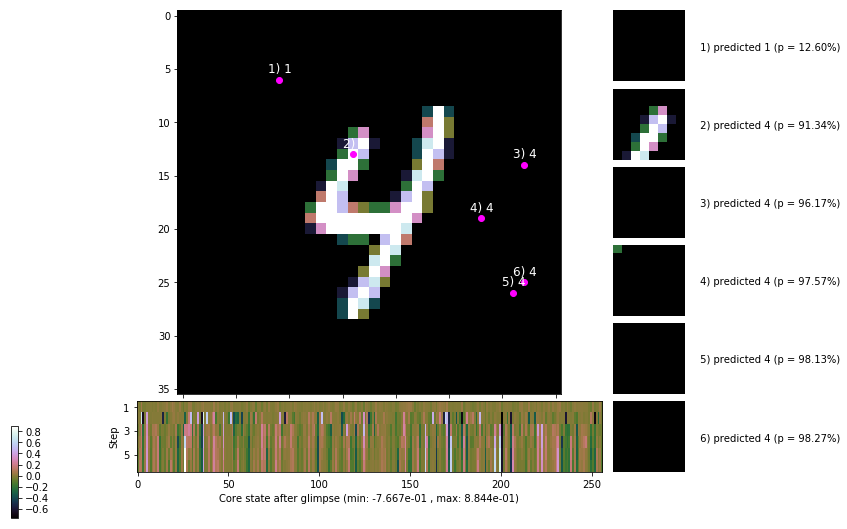


	Target class: 8 | Discounted rewards: [0.454, 0.928, 1.875, 1.750, 1.500, 1.000]


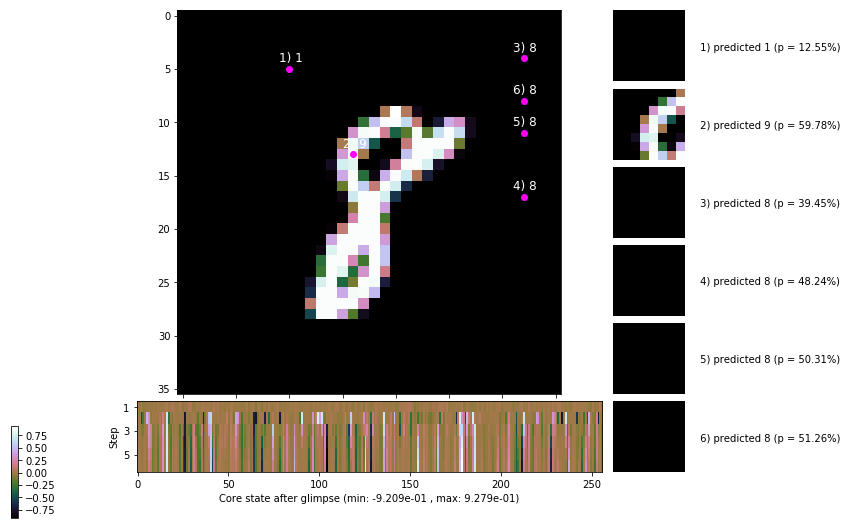

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


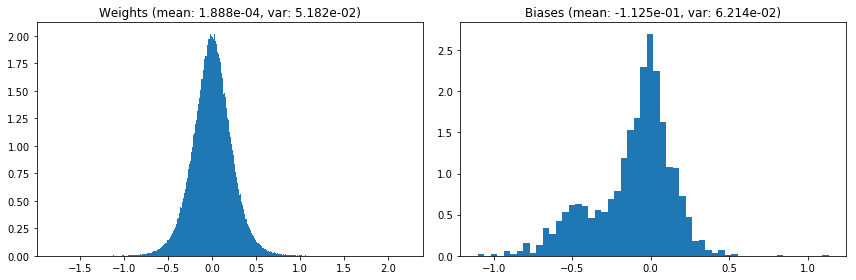

                                      Location network weights and biases


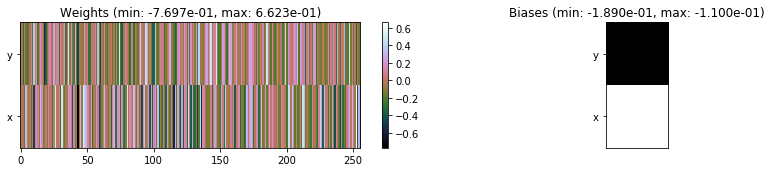

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.18 sec | TRAIN >> class loss: 0.5763 | steps:  2.540 :( | reward:  4.0219 :( | acc.: 80.397% :(
                          | VAL   >> class loss: 0.6045 | steps:  2.465 :( | reward:  4.0909 :( | acc.: 79.020% :(


Epoch  20/400) lr = 0.0007519
 b    300/  3000 >> 137.0 ms/b | lr: 7.51e-04 | grad 2norm: 11.71 | grad inf norm:  3.136
         Weights || abs max:  2.19 ( 5523.87) | mean:  2.06e-04 ( 0.02) | var: 5.19e-02 ( 5447.43)
          Biases || abs max:  1.13 (  123.56) | mean: -1.12e-01 ( 0.12) | var: 6.23e-02 (   37.85)
                    class loss: 0.569 | steps: 2.545 | reward:  4.020 | acc.: 80.27%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 141.0 ms/b | lr: 7.50e-04 | grad 2norm: 11.78 | grad inf norm:  3.231
         Weights || abs max:  2.20 (29321.20) | mean:  2.35e-04 (

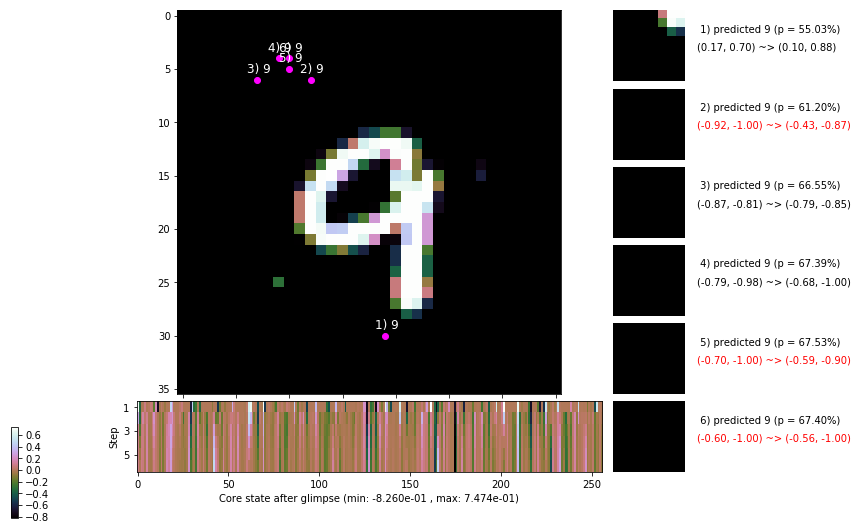

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 141.5 ms/b | lr: 7.49e-04 | grad 2norm: 11.63 | grad inf norm:  3.355
         Weights || abs max:  2.21 ( 3392.06) | mean:  2.77e-04 ( 0.02) | var: 5.22e-02 (  446.11)
          Biases || abs max:  1.13 (  315.12) | mean: -1.13e-01 ( 0.19) | var: 6.27e-02 ( 3781.75)
                    class loss: 0.551 | steps: 2.486 | reward:  4.086 | acc.: 81.38%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 139.3 ms/b | lr: 7.48e-04 | grad 2norm: 11.44 | grad inf norm:  3.076
         Weights || abs max:  2.20 ( 9134.56) | mean:  3.00e-04 ( 0.03) | var: 5.23e-02 (20014.39)
          Biases || abs max:  1.14 (  113.54) | mean: -1.13e-01 ( 0.11) | var: 6.30e-02 (   46.74)
                    class loss: 0.573 | steps: 2.533 | reward:  4.037 | acc.: 80.93%

	Target class: 8 | Discounted rewards: [1.969, 1.938, 1.8

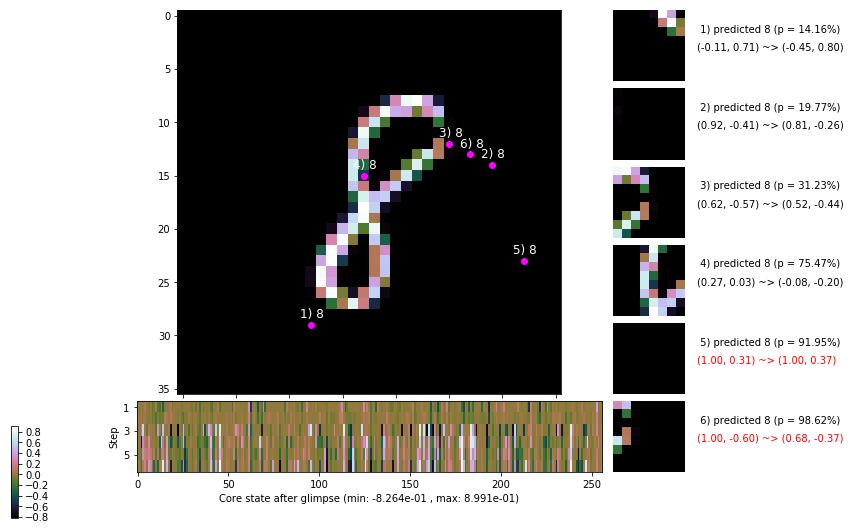

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 145.3 ms/b | lr: 7.47e-04 | grad 2norm: 11.64 | grad inf norm:  3.287
         Weights || abs max:  2.17 ( 2688.78) | mean:  3.22e-04 ( 0.01) | var: 5.25e-02 (  248.25)
          Biases || abs max:  1.13 (  143.30) | mean: -1.14e-01 ( 0.13) | var: 6.33e-02 (   82.77)
                    class loss: 0.596 | steps: 2.564 | reward:  3.974 | acc.: 79.80%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 157.5 ms/b | lr: 7.46e-04 | grad 2norm: 11.62 | grad inf norm:  3.165
         Weights || abs max:  2.17 ( 2751.71) | mean:  3.21e-04 ( 0.01) | var: 5.26e-02 (   91.20)
          Biases || abs max:  1.13 (  199.58) | mean: -1.13e-01 ( 0.16) | var: 6.34e-02 (  247.74)
                    class loss: 0.555 | steps: 2.515 | reward:  4.058 | acc.: 81.38%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

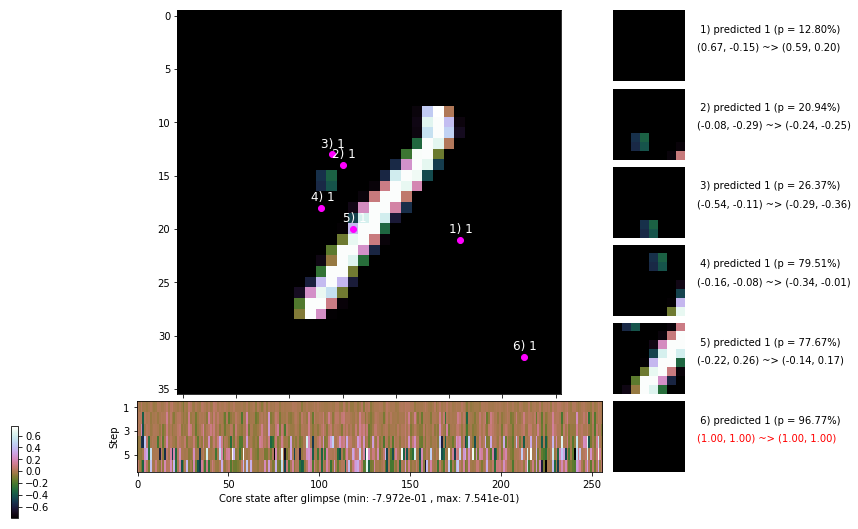

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 144.4 ms/b | lr: 7.44e-04 | grad 2norm: 11.81 | grad inf norm:  3.262
         Weights || abs max:  2.18 ( 2458.96) | mean:  3.30e-04 ( 0.01) | var: 5.28e-02 (  135.87)
          Biases || abs max:  1.14 (  185.14) | mean: -1.14e-01 ( 0.14) | var: 6.37e-02 (  383.25)
                    class loss: 0.557 | steps: 2.518 | reward:  4.048 | acc.: 80.75%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 148.8 ms/b | lr: 7.44e-04 | grad 2norm: 11.69 | grad inf norm:  3.200
         Weights || abs max:  2.16 (12163.40) | mean:  3.56e-04 ( 0.03) | var: 5.29e-02 (25567.45)
          Biases || abs max:  1.14 (  134.85) | mean: -1.14e-01 ( 0.13) | var: 6.38e-02 (   66.60)
                    class loss: 0.556 | steps: 2.517 | reward:  4.046 | acc.: 80.72%

	Target class: 3 | Discounted rewards: [1.969, 1.938, 1.8

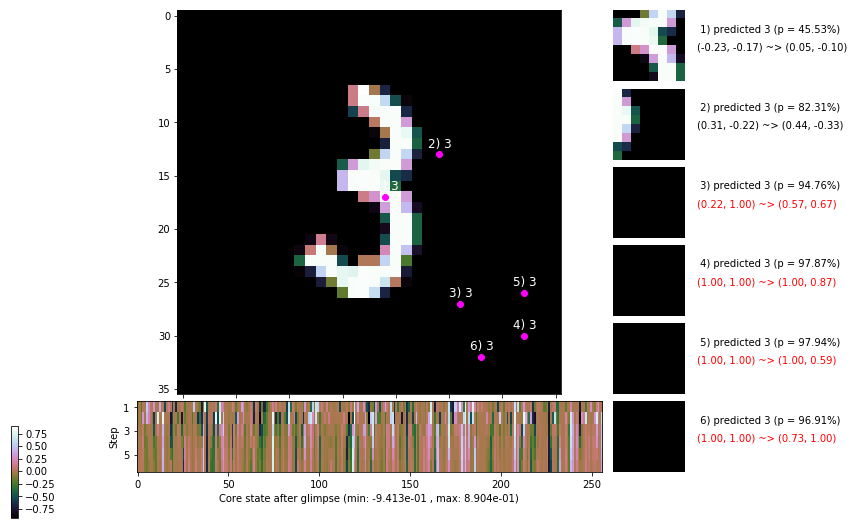

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 148.6 ms/b | lr: 7.42e-04 | grad 2norm: 11.62 | grad inf norm:  3.196
         Weights || abs max:  2.16 ( 3114.64) | mean:  3.61e-04 ( 0.02) | var: 5.31e-02 (  346.76)
          Biases || abs max:  1.14 (  116.04) | mean: -1.14e-01 ( 0.11) | var: 6.38e-02 (   42.99)
                    class loss: 0.539 | steps: 2.529 | reward:  4.047 | acc.: 81.28%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.6 ms/b | lr: 7.41e-04 | grad 2norm: 11.61 | grad inf norm:  3.106
         Weights || abs max:  2.17 ( 5853.08) | mean:  3.60e-04 ( 0.02) | var: 5.32e-02 ( 2765.19)
          Biases || abs max:  1.14 (  310.53) | mean: -1.14e-01 ( 0.19) | var: 6.39e-02 ( 1059.96)
                    class loss: 0.565 | steps: 2.516 | reward:  4.057 | acc.: 80.38%

	Target class: 1 | Discounted rewards: [0.454, 0.928, 1.8

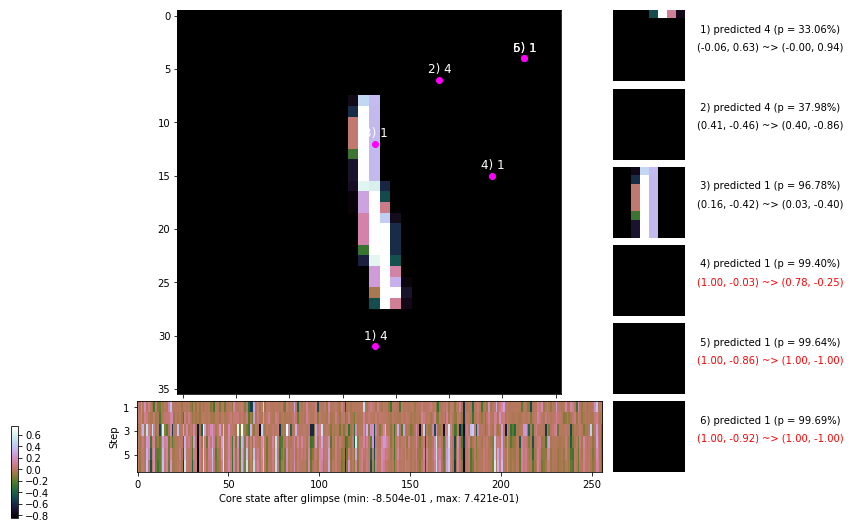

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


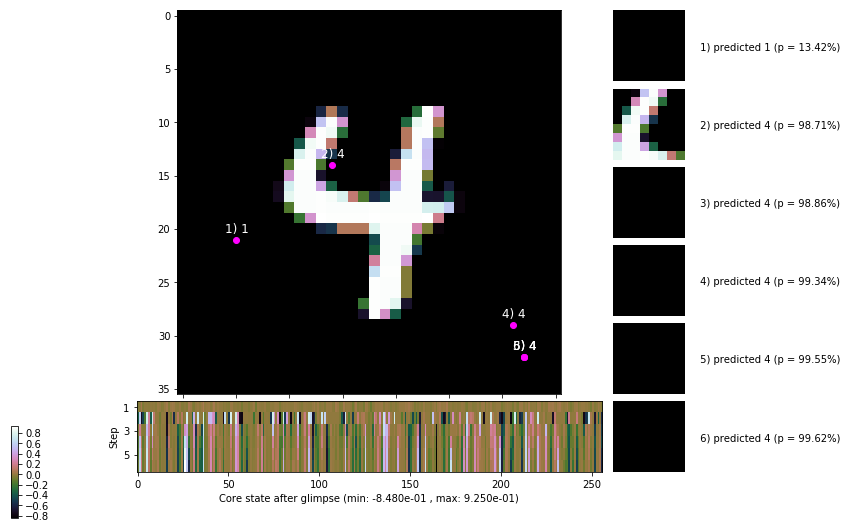


	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


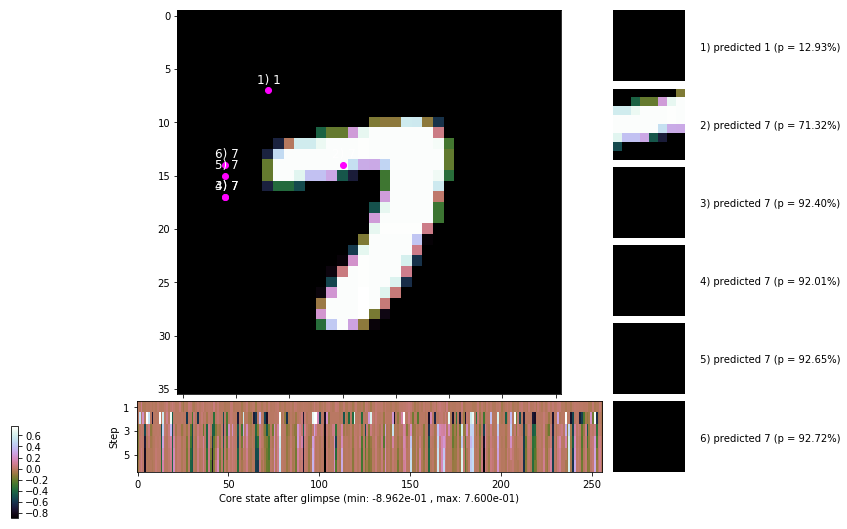

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


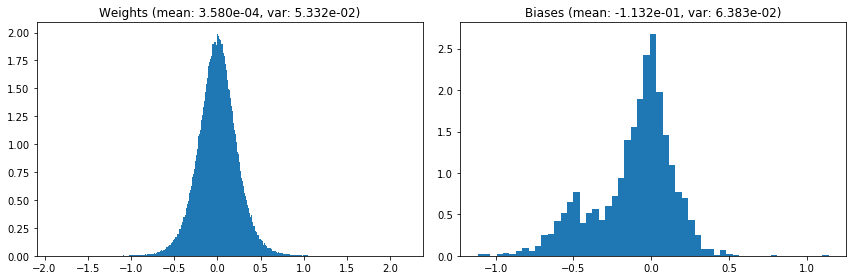

                                      Location network weights and biases


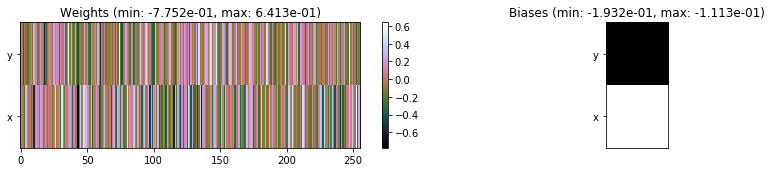

---------------------------------------------------------------------------------------------------------------
Elapsed time:  434.20 sec | TRAIN >> class loss: 0.5624 | steps:  2.526 :( | reward:  4.0392    | acc.: 80.737% 
                          | VAL   >> class loss: 0.6080 | steps:  2.457 :( | reward:  4.0992 :( | acc.: 79.420% :(


Epoch  21/400) lr = 0.0007407
 b    300/  3000 >> 138.6 ms/b | lr: 7.40e-04 | grad 2norm: 11.76 | grad inf norm:  3.169
         Weights || abs max:  2.16 ( 5723.51) | mean:  3.46e-04 ( 0.02) | var: 5.34e-02 ( 2109.78)
          Biases || abs max:  1.14 ( 1702.93) | mean: -1.14e-01 ( 0.74) | var: 6.40e-02 (294057.69)
                    class loss: 0.589 | steps: 2.580 | reward:  3.998 | acc.: 80.30%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 142.8 ms/b | lr: 7.39e-04 | grad 2norm: 11.46 | grad inf norm:  3.167
         Weights || abs max:  2.16 ( 8758.71) | mean:  3.28e-04 ( 

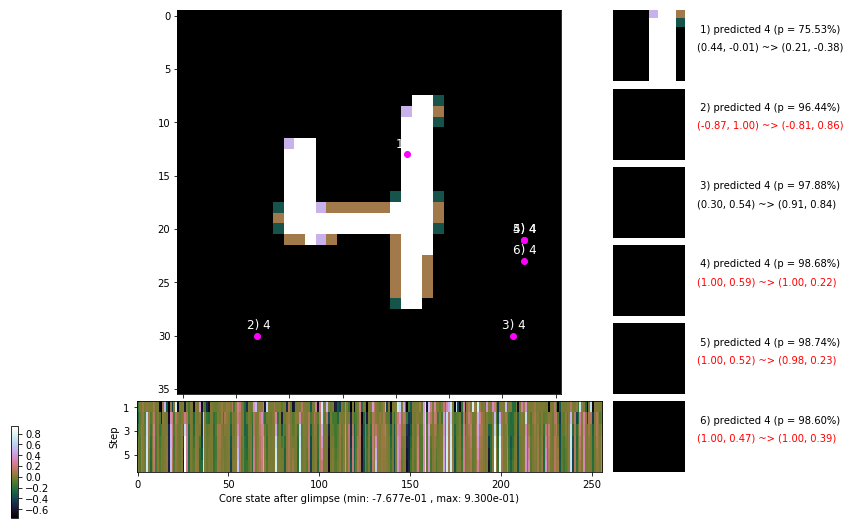

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 150.1 ms/b | lr: 7.38e-04 | grad 2norm: 11.56 | grad inf norm:  3.151
         Weights || abs max:  2.16 ( 8259.87) | mean:  3.64e-04 ( 0.03) | var: 5.37e-02 ( 3704.54)
          Biases || abs max:  1.15 (   88.15) | mean: -1.14e-01 ( 0.10) | var: 6.44e-02 (   34.18)
                    class loss: 0.540 | steps: 2.489 | reward:  4.101 | acc.: 81.87%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 145.9 ms/b | lr: 7.37e-04 | grad 2norm: 11.46 | grad inf norm:  3.174
         Weights || abs max:  2.18 ( 4596.07) | mean:  3.82e-04 ( 0.02) | var: 5.38e-02 ( 1582.37)
          Biases || abs max:  1.15 (  182.57) | mean: -1.14e-01 ( 0.15) | var: 6.46e-02 (  373.89)
                    class loss: 0.562 | steps: 2.525 | reward:  4.057 | acc.: 80.97%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

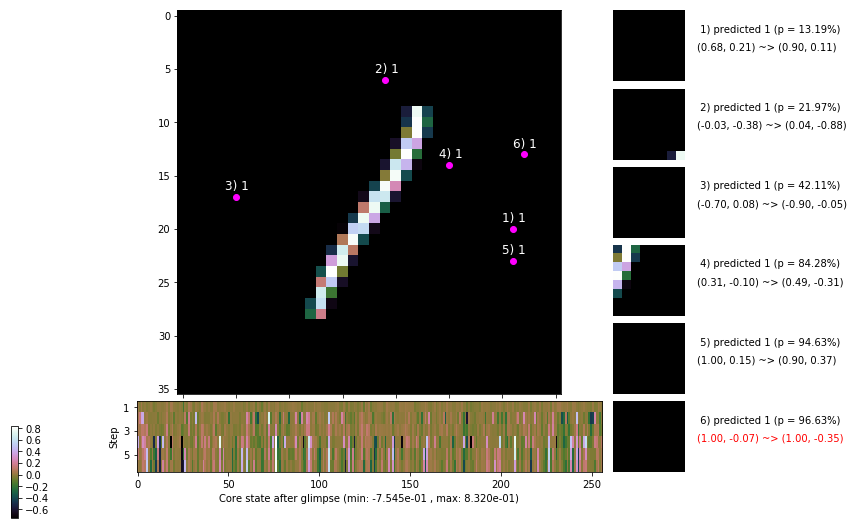

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 148.0 ms/b | lr: 7.36e-04 | grad 2norm: 11.41 | grad inf norm:  3.088
         Weights || abs max:  2.18 ( 5092.52) | mean:  3.75e-04 ( 0.02) | var: 5.39e-02 ( 1004.58)
          Biases || abs max:  1.14 (  183.43) | mean: -1.15e-01 ( 0.16) | var: 6.48e-02 (  365.99)
                    class loss: 0.547 | steps: 2.525 | reward:  4.055 | acc.: 81.50%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 145.7 ms/b | lr: 7.35e-04 | grad 2norm: 11.56 | grad inf norm:  3.212
         Weights || abs max:  2.19 ( 3952.18) | mean:  3.98e-04 ( 0.02) | var: 5.41e-02 ( 1671.22)
          Biases || abs max:  1.14 (  211.49) | mean: -1.15e-01 ( 0.16) | var: 6.49e-02 (  785.14)
                    class loss: 0.560 | steps: 2.545 | reward:  4.035 | acc.: 80.68%

	Target class: 6 | Discounted rewards: [0.959, 1.938, 1.8

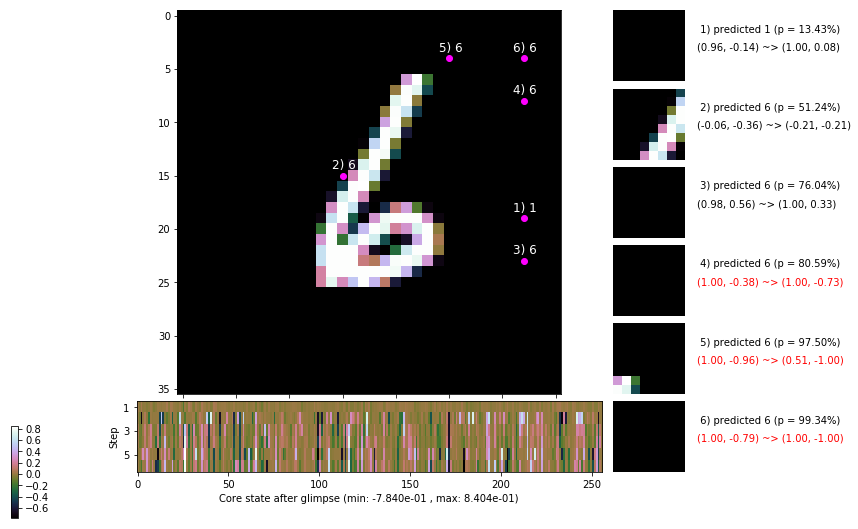

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 156.8 ms/b | lr: 7.33e-04 | grad 2norm: 11.64 | grad inf norm:  3.101
         Weights || abs max:  2.18 ( 2319.72) | mean:  3.74e-04 ( 0.01) | var: 5.42e-02 (   75.37)
          Biases || abs max:  1.13 (   87.44) | mean: -1.16e-01 ( 0.11) | var: 6.51e-02 (   41.50)
                    class loss: 0.588 | steps: 2.562 | reward:  4.004 | acc.: 79.87%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 144.6 ms/b | lr: 7.33e-04 | grad 2norm: 11.54 | grad inf norm:  3.219
         Weights || abs max:  2.18 ( 4450.27) | mean:  3.95e-04 ( 0.02) | var: 5.44e-02 ( 1460.22)
          Biases || abs max:  1.13 (  192.05) | mean: -1.16e-01 ( 0.14) | var: 6.52e-02 ( 1219.12)
                    class loss: 0.571 | steps: 2.509 | reward:  4.065 | acc.: 80.65%

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.8

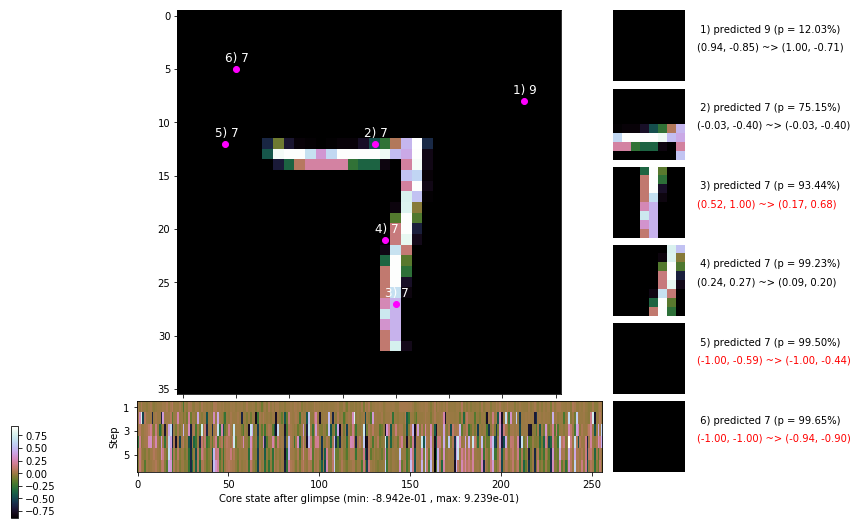

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 145.9 ms/b | lr: 7.31e-04 | grad 2norm: 11.75 | grad inf norm:  3.260
         Weights || abs max:  2.19 (16046.44) | mean:  3.76e-04 ( 0.04) | var: 5.45e-02 (66633.91)
          Biases || abs max:  1.13 (  109.06) | mean: -1.16e-01 ( 0.11) | var: 6.55e-02 (   40.78)
                    class loss: 0.605 | steps: 2.548 | reward:  4.020 | acc.: 79.95%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.8 ms/b | lr: 7.30e-04 | grad 2norm: 11.36 | grad inf norm:  3.146
         Weights || abs max:  2.19 ( 3562.03) | mean:  3.94e-04 ( 0.02) | var: 5.46e-02 (  933.12)
          Biases || abs max:  1.13 (  183.26) | mean: -1.16e-01 ( 0.16) | var: 6.57e-02 (  205.04)
                    class loss: 0.569 | steps: 2.523 | reward:  4.028 | acc.: 80.23%

	Target class: 2 | Discounted rewards: [0.012, 0.044, 0.1

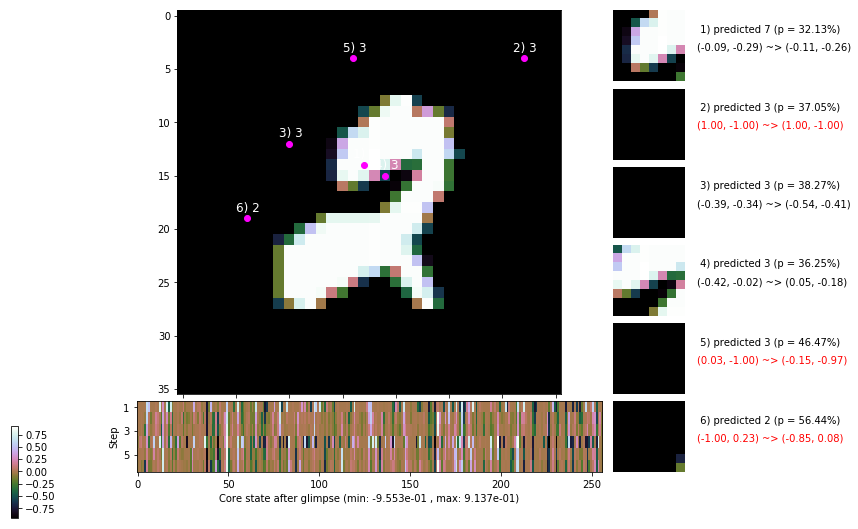

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 6 | Discounted rewards: [0.075, 0.170, 0.360, 0.740, 1.500, 1.000]


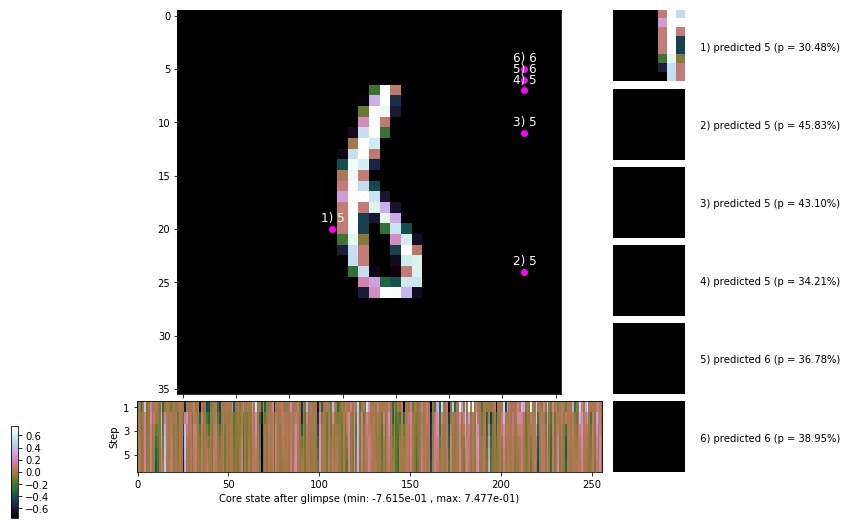


	Target class: 7 | Discounted rewards: [0.927, 1.874, 1.749, 1.497, 0.995, -0.010]


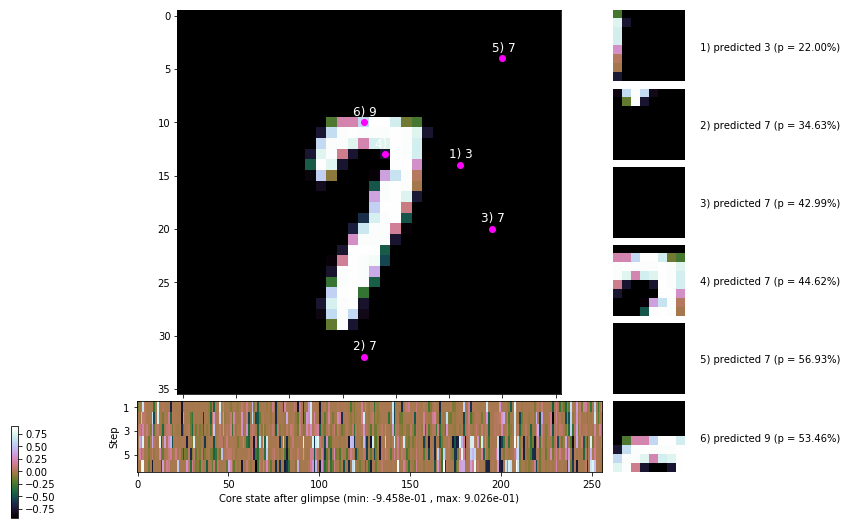

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


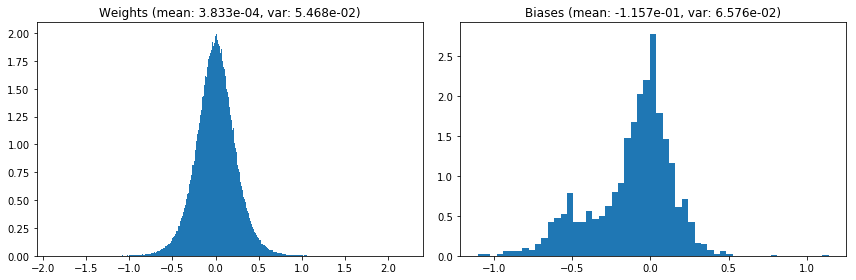

                                      Location network weights and biases


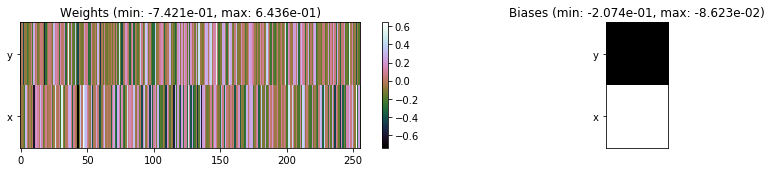

---------------------------------------------------------------------------------------------------------------
Elapsed time:  436.52 sec | TRAIN >> class loss: 0.5703 | steps:  2.534 :( | reward:  4.0403    | acc.: 80.632% :(
                          | VAL   >> class loss: 0.6001 | steps:  2.469 :( | reward:  4.0893 :( | acc.: 78.900% :(


Epoch  22/400) lr = 0.0007297
 b    300/  3000 >> 141.2 ms/b | lr: 7.29e-04 | grad 2norm: 11.66 | grad inf norm:  3.147
         Weights || abs max:  2.20 (10092.58) | mean:  3.50e-04 ( 0.03) | var: 5.47e-02 (30850.73)
          Biases || abs max:  1.13 (  243.46) | mean: -1.16e-01 ( 0.17) | var: 6.58e-02 ( 1123.94)
                    class loss: 0.590 | steps: 2.557 | reward:  3.998 | acc.: 79.72%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 138.4 ms/b | lr: 7.28e-04 | grad 2norm: 11.44 | grad inf norm:  3.208
         Weights || abs max:  2.21 ( 2470.25) | mean:  3.27e-04 (

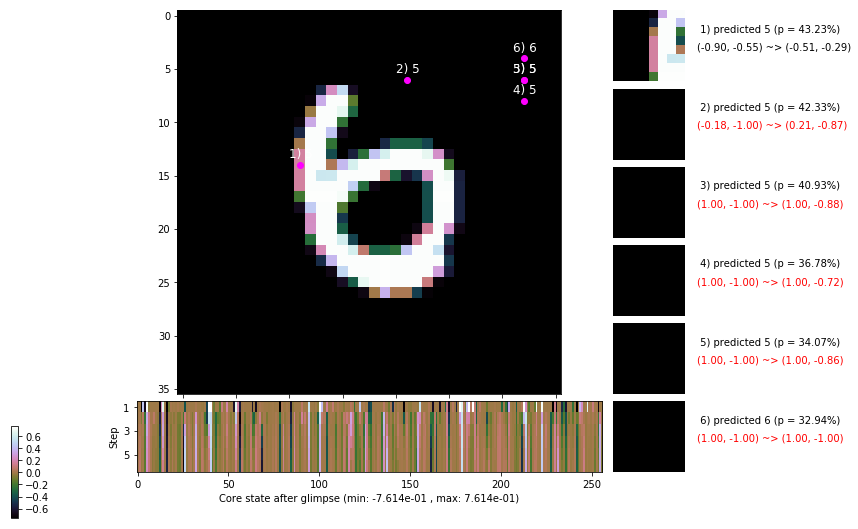

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 139.2 ms/b | lr: 7.27e-04 | grad 2norm: 11.44 | grad inf norm:  3.147
         Weights || abs max:  2.21 (19422.05) | mean:  3.29e-04 ( 0.04) | var: 5.50e-02 (148057.31)
          Biases || abs max:  1.13 (   98.69) | mean: -1.16e-01 ( 0.11) | var: 6.62e-02 (   38.50)
                    class loss: 0.572 | steps: 2.524 | reward:  4.045 | acc.: 80.27%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 141.3 ms/b | lr: 7.26e-04 | grad 2norm: 11.68 | grad inf norm:  3.191
         Weights || abs max:  2.22 ( 3117.55) | mean:  3.24e-04 ( 0.01) | var: 5.51e-02 (  398.86)
          Biases || abs max:  1.14 (  315.95) | mean: -1.16e-01 ( 0.24) | var: 6.65e-02 ( 1960.33)
                    class loss: 0.577 | steps: 2.535 | reward:  4.027 | acc.: 80.27%

	Target class: 3 | Discounted rewards: [0.959, 1.938, 1.

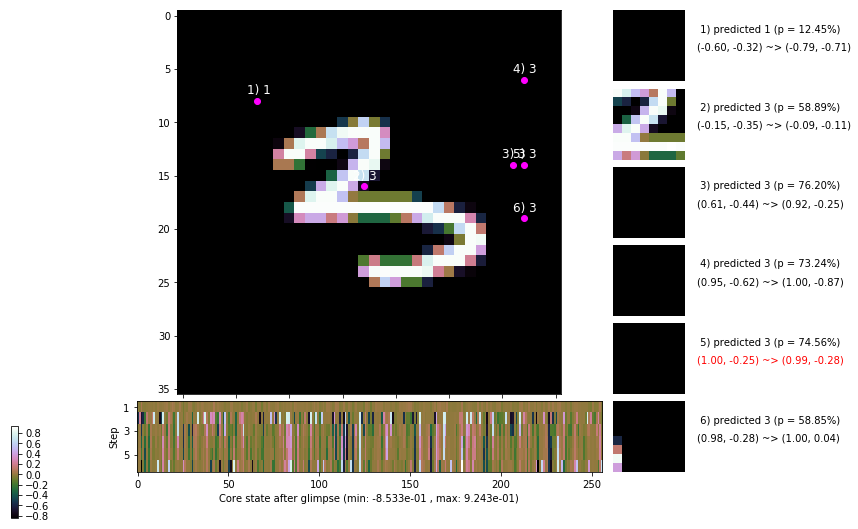

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 149.4 ms/b | lr: 7.25e-04 | grad 2norm: 11.66 | grad inf norm:  3.161
         Weights || abs max:  2.23 (42492.77) | mean:  3.60e-04 ( 0.09) | var: 5.53e-02 (879651.00)
          Biases || abs max:  1.13 (  196.59) | mean: -1.16e-01 ( 0.16) | var: 6.65e-02 (  160.09)
                    class loss: 0.600 | steps: 2.567 | reward:  4.000 | acc.: 79.72%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 138.8 ms/b | lr: 7.24e-04 | grad 2norm: 11.78 | grad inf norm:  3.303
         Weights || abs max:  2.23 ( 1922.86) | mean:  3.74e-04 ( 0.01) | var: 5.54e-02 (   40.83)
          Biases || abs max:  1.13 (  102.06) | mean: -1.17e-01 ( 0.12) | var: 6.68e-02 (   22.43)
                    class loss: 0.588 | steps: 2.565 | reward:  4.000 | acc.: 79.58%

	Target class: 3 | Discounted rewards: [-0.020, -0.019, 

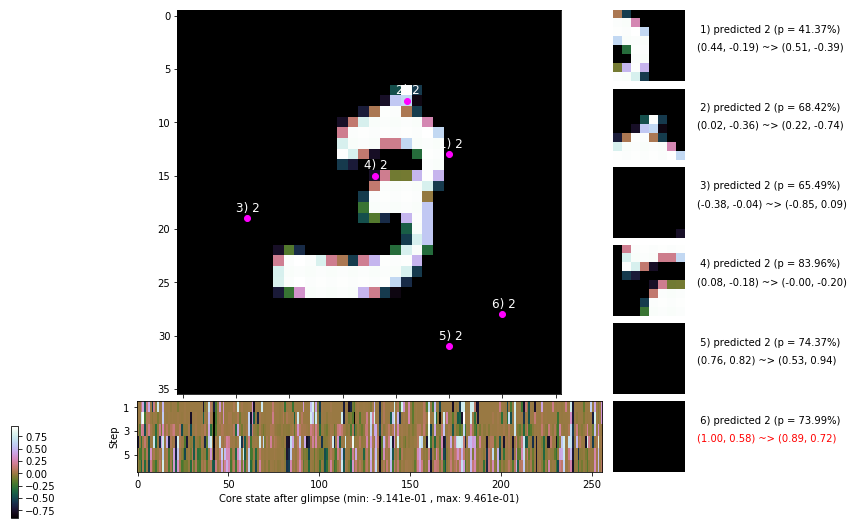

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 144.5 ms/b | lr: 7.22e-04 | grad 2norm: 11.55 | grad inf norm:  3.246
         Weights || abs max:  2.23 ( 1782.07) | mean:  4.24e-04 ( 0.01) | var: 5.55e-02 (   43.54)
          Biases || abs max:  1.13 (   97.82) | mean: -1.17e-01 ( 0.11) | var: 6.70e-02 (   27.26)
                    class loss: 0.559 | steps: 2.516 | reward:  4.047 | acc.: 80.70%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 138.9 ms/b | lr: 7.22e-04 | grad 2norm: 11.55 | grad inf norm:  3.151
         Weights || abs max:  2.23 ( 2366.22) | mean:  4.26e-04 ( 0.01) | var: 5.57e-02 (  111.27)
          Biases || abs max:  1.13 (  145.95) | mean: -1.17e-01 ( 0.13) | var: 6.73e-02 (  258.51)
                    class loss: 0.569 | steps: 2.548 | reward:  4.032 | acc.: 80.62%

	Target class: 2 | Discounted rewards: [-0.020, -0.019, -

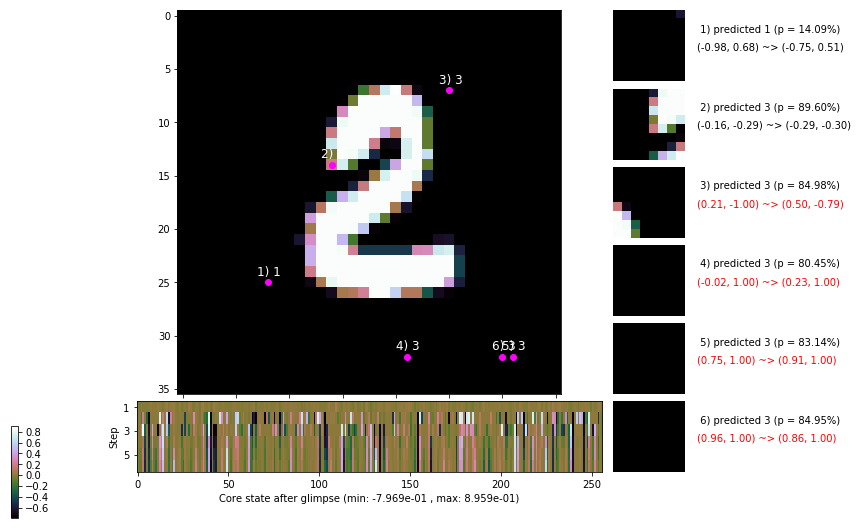

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 141.3 ms/b | lr: 7.20e-04 | grad 2norm: 11.67 | grad inf norm:  3.307
         Weights || abs max:  2.21 ( 2797.74) | mean:  4.40e-04 ( 0.01) | var: 5.58e-02 (  111.13)
          Biases || abs max:  1.13 (   93.90) | mean: -1.18e-01 ( 0.10) | var: 6.74e-02 (   45.70)
                    class loss: 0.573 | steps: 2.562 | reward:  4.014 | acc.: 80.17%
                 --------------------------------------------------------------------------------


H:\Users\Andrew\Anaconda3\envs\conda_jupyter\lib\site-packages\numpy\lib\nanfunctions.py:1315: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe')


 b   3000/  3000 >> 138.0 ms/b | lr: 7.20e-04 | grad 2norm: 11.56 | grad inf norm:  3.184
         Weights || abs max:  2.22 (     inf) | mean:  4.51e-04 (  inf) | var: 5.59e-02 (     nan)
          Biases || abs max:  1.14 (  128.63) | mean: -1.18e-01 ( 0.12) | var: 6.77e-02 (   98.88)
                    class loss: 0.562 | steps: 2.518 | reward:  4.058 | acc.: 80.65%

	Target class: 5 | Discounted rewards: [0.328, 0.675, 1.370, 0.740, 1.500, 1.000]
	                | Baseline rewards:   [1.054, 1.232, 1.313, 1.349, 1.203, 0.940]


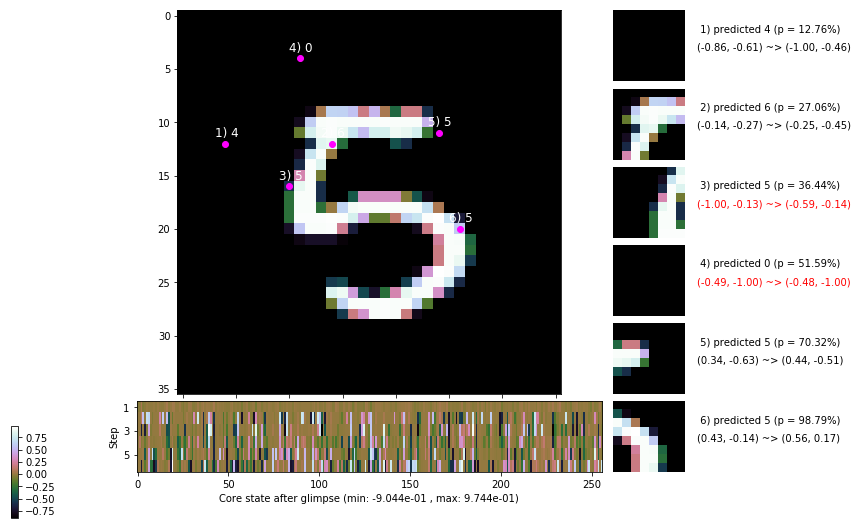

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


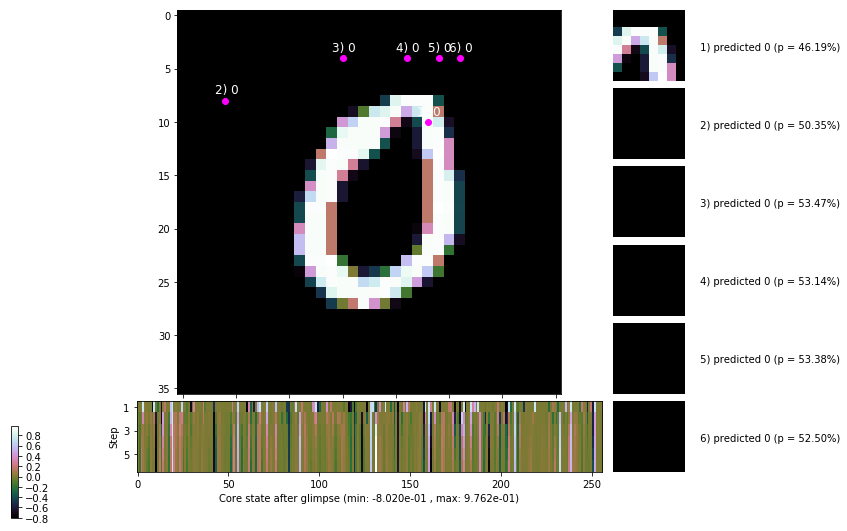


	Target class: 4 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


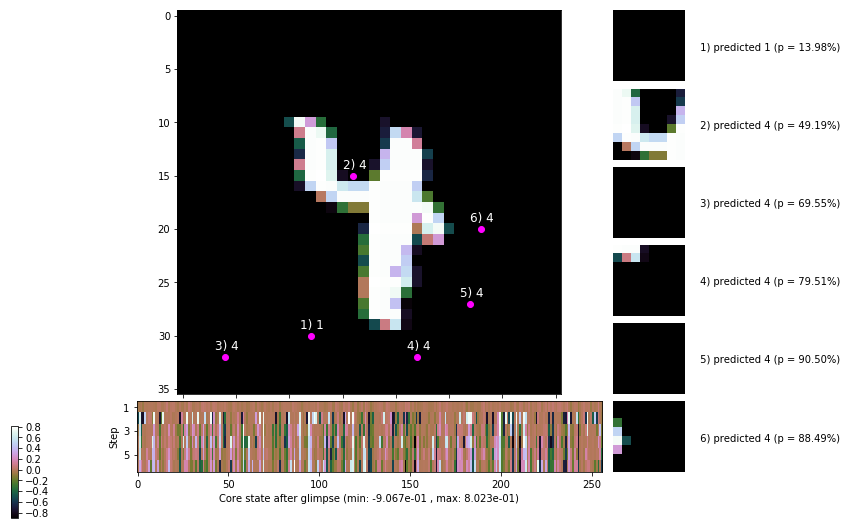

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


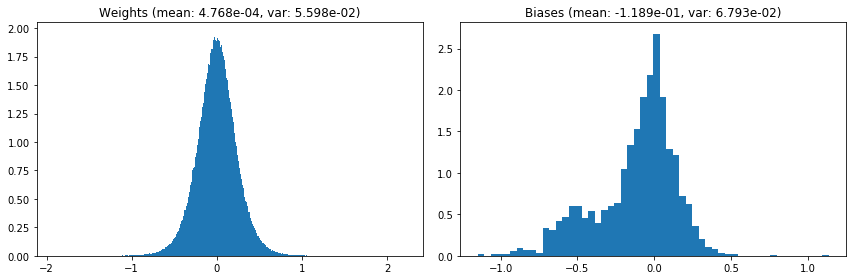

                                      Location network weights and biases


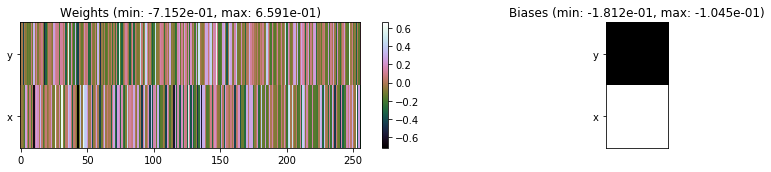

---------------------------------------------------------------------------------------------------------------
Elapsed time:  423.87 sec | TRAIN >> class loss: 0.5776 | steps:  2.543 :( | reward:  4.0241 :( | acc.: 80.150% :(
                          | VAL   >> class loss: 0.5470 | steps:  2.404    | reward:  4.1830    | acc.: 81.280% 


Epoch  23/400) lr = 0.0007188
 b    300/  3000 >> 140.4 ms/b | lr: 7.18e-04 | grad 2norm: 11.60 | grad inf norm:  3.130
         Weights || abs max:  2.22 ( 4257.94) | mean:  4.72e-04 ( 0.02) | var: 5.61e-02 ( 2129.20)
          Biases || abs max:  1.14 (  123.81) | mean: -1.18e-01 ( 0.12) | var: 6.80e-02 (  160.59)
                    class loss: 0.546 | steps: 2.465 | reward:  4.104 | acc.: 80.95%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 153.1 ms/b | lr: 7.17e-04 | grad 2norm: 11.52 | grad inf norm:  3.314
         Weights || abs max:  2.22 ( 2256.90) | mean:  4.54e-04 ( 0

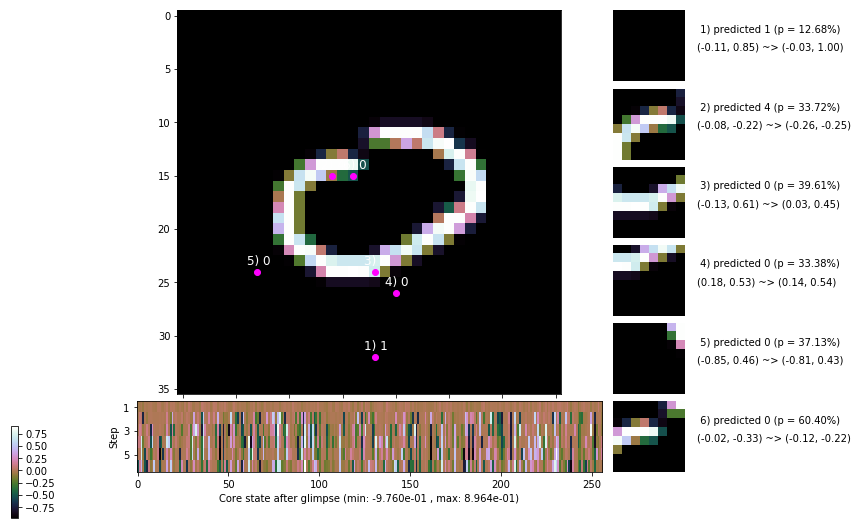

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 146.9 ms/b | lr: 7.16e-04 | grad 2norm: 11.59 | grad inf norm:  3.097
         Weights || abs max:  2.22 ( 2342.78) | mean:  4.53e-04 ( 0.01) | var: 5.63e-02 (  120.01)
          Biases || abs max:  1.14 (  180.75) | mean: -1.18e-01 ( 0.16) | var: 6.84e-02 (  384.72)
                    class loss: 0.556 | steps: 2.493 | reward:  4.097 | acc.: 81.30%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 139.3 ms/b | lr: 7.15e-04 | grad 2norm: 11.63 | grad inf norm:  3.194
         Weights || abs max:  2.23 ( 2768.38) | mean:  4.29e-04 ( 0.01) | var: 5.65e-02 (  100.12)
          Biases || abs max:  1.14 (  132.27) | mean: -1.18e-01 ( 0.12) | var: 6.86e-02 (  209.24)
                    class loss: 0.541 | steps: 2.479 | reward:  4.104 | acc.: 81.55%

	Target class: 8 | Discounted rewards: [0.959, 1.938, 1.8

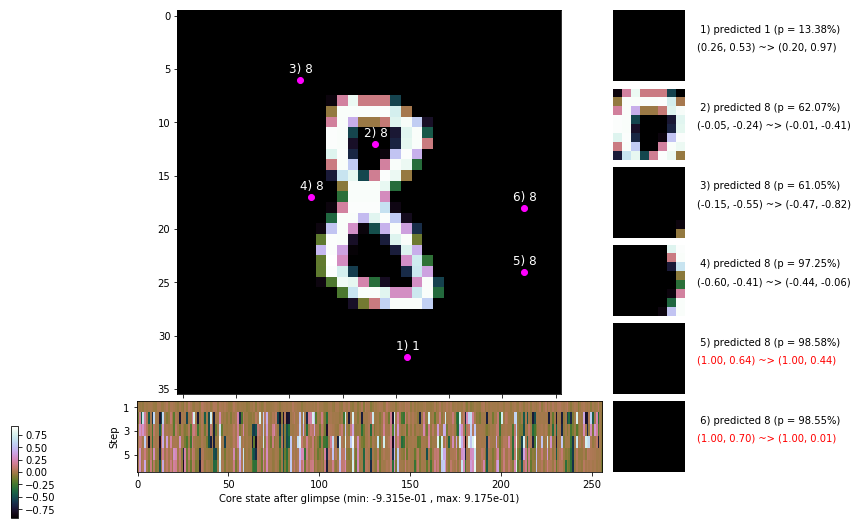

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 143.0 ms/b | lr: 7.14e-04 | grad 2norm: 11.42 | grad inf norm:  2.968
         Weights || abs max:  2.24 ( 5842.90) | mean:  4.51e-04 ( 0.02) | var: 5.66e-02 ( 2510.09)
          Biases || abs max:  1.15 (  105.28) | mean: -1.18e-01 ( 0.11) | var: 6.85e-02 (   53.15)
                    class loss: 0.547 | steps: 2.496 | reward:  4.068 | acc.: 80.52%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 148.8 ms/b | lr: 7.13e-04 | grad 2norm: 11.47 | grad inf norm:  3.017
         Weights || abs max:  2.24 ( 4195.25) | mean:  4.75e-04 ( 0.02) | var: 5.67e-02 (  317.15)
          Biases || abs max:  1.14 (  140.57) | mean: -1.18e-01 ( 0.13) | var: 6.86e-02 (   83.42)
                    class loss: 0.533 | steps: 2.458 | reward:  4.120 | acc.: 81.97%

	Target class: 2 | Discounted rewards: [0.075, 0.170, 0.3

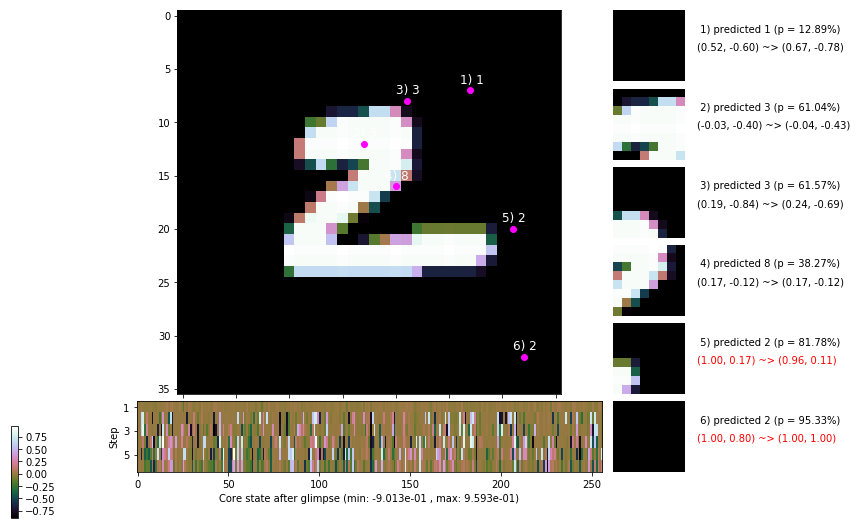

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 153.1 ms/b | lr: 7.12e-04 | grad 2norm: 11.61 | grad inf norm:  3.203
         Weights || abs max:  2.25 ( 2267.92) | mean:  4.55e-04 ( 0.01) | var: 5.68e-02 (  165.38)
          Biases || abs max:  1.15 (  694.15) | mean: -1.19e-01 ( 0.46) | var: 6.89e-02 (28839.70)
                    class loss: 0.570 | steps: 2.504 | reward:  4.072 | acc.: 80.60%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 149.9 ms/b | lr: 7.11e-04 | grad 2norm: 11.71 | grad inf norm:  3.275
         Weights || abs max:  2.25 (20801.20) | mean:  4.76e-04 ( 0.05) | var: 5.70e-02 (86938.30)
          Biases || abs max:  1.14 (  118.47) | mean: -1.19e-01 ( 0.13) | var: 6.90e-02 (   50.88)
                    class loss: 0.559 | steps: 2.498 | reward:  4.073 | acc.: 80.83%

	Target class: 2 | Discounted rewards: [-0.020, -0.019, -

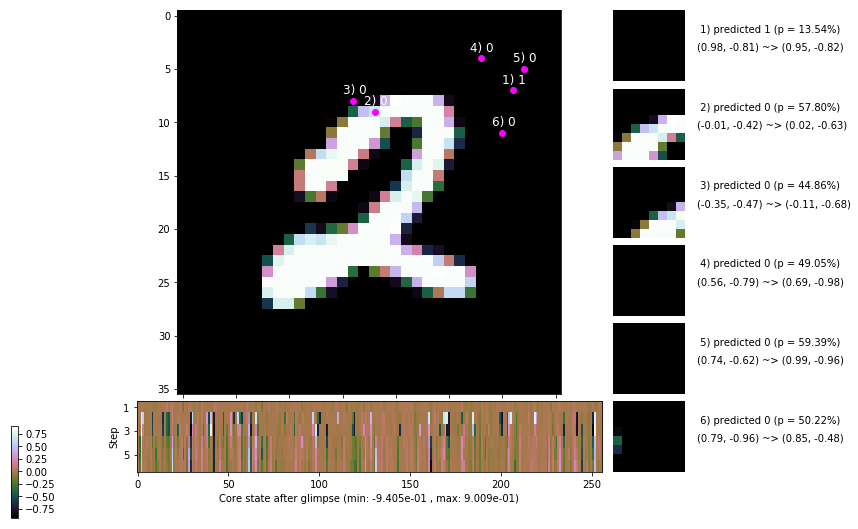

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 150.1 ms/b | lr: 7.10e-04 | grad 2norm: 11.59 | grad inf norm:  3.168
         Weights || abs max:  2.26 ( 5273.63) | mean:  4.96e-04 ( 0.02) | var: 5.71e-02 ( 3087.43)
          Biases || abs max:  1.15 (  266.83) | mean: -1.19e-01 ( 0.19) | var: 6.91e-02 (  640.92)
                    class loss: 0.551 | steps: 2.498 | reward:  4.084 | acc.: 81.03%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 147.0 ms/b | lr: 7.09e-04 | grad 2norm: 11.55 | grad inf norm:  3.130
         Weights || abs max:  2.26 ( 6420.59) | mean:  4.98e-04 ( 0.02) | var: 5.72e-02 ( 3535.14)
          Biases || abs max:  1.15 (  303.36) | mean: -1.19e-01 ( 0.19) | var: 6.93e-02 ( 3826.64)
                    class loss: 0.536 | steps: 2.454 | reward:  4.099 | acc.: 81.28%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

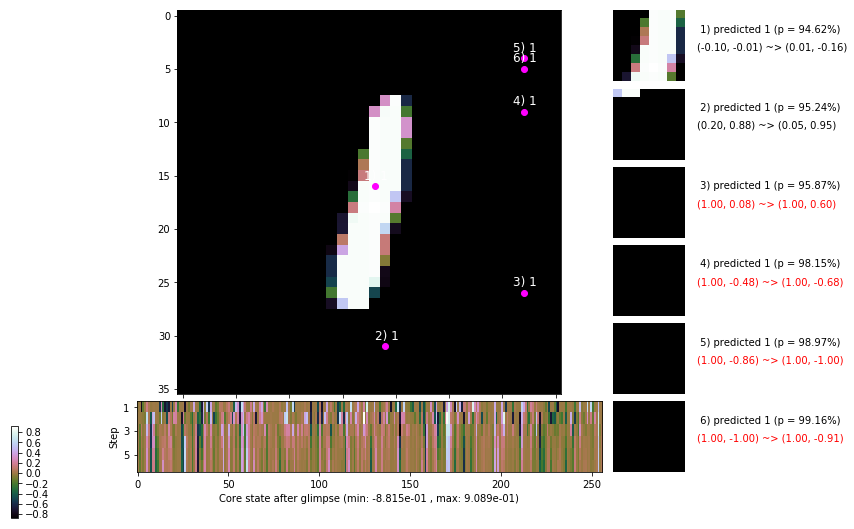

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 3 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


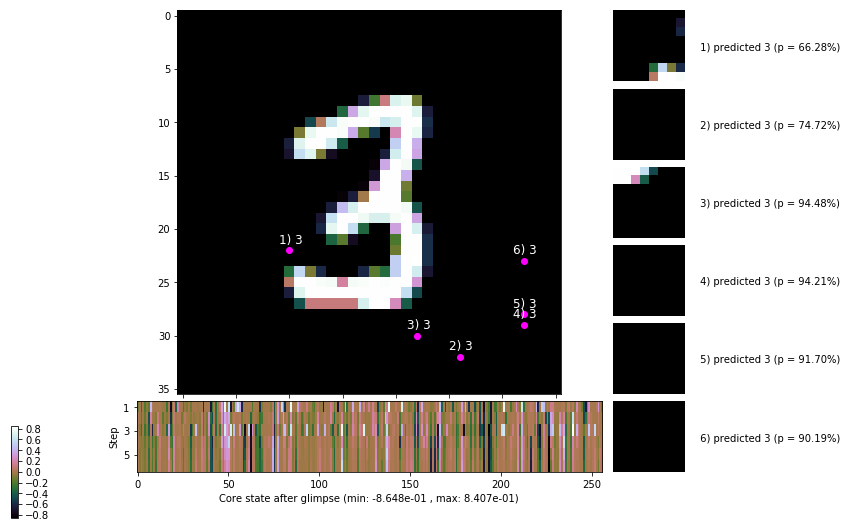


	Target class: 3 | Discounted rewards: [0.454, 0.928, 1.875, 1.750, 1.500, 1.000]


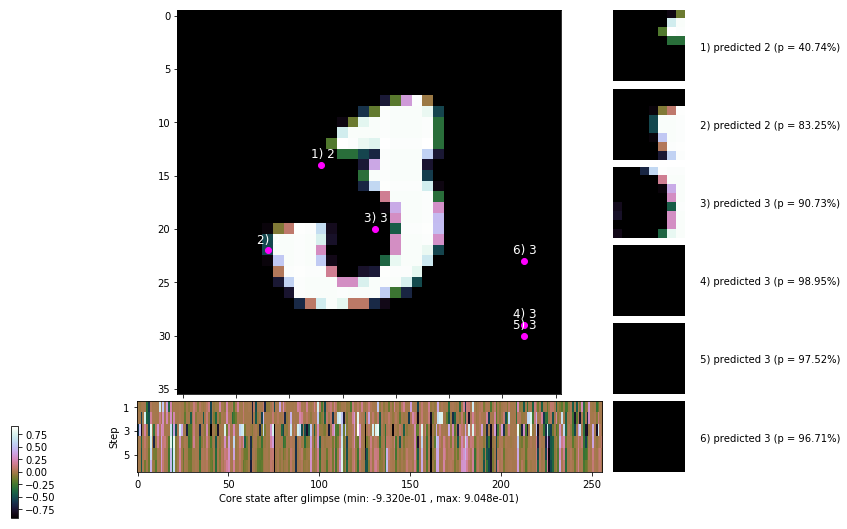

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


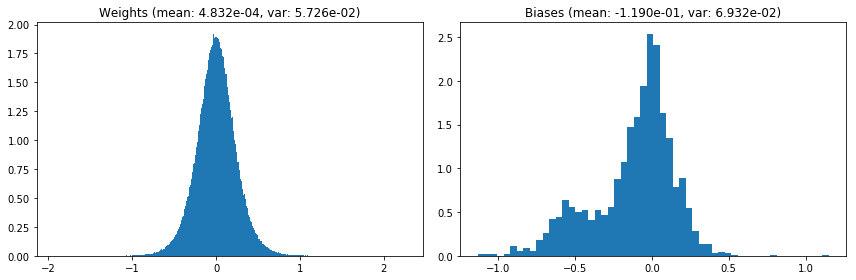

                                      Location network weights and biases


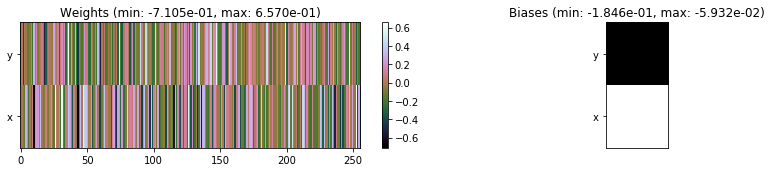

---------------------------------------------------------------------------------------------------------------
Elapsed time:  442.14 sec | TRAIN >> class loss: 0.5492 | steps:  2.485    | reward:  4.0890    | acc.: 81.132% 
                          | VAL   >> class loss: 0.5485 | steps:  2.359    | reward:  4.2064    | acc.: 80.580% :(


Epoch  24/400) lr = 0.0007081
 b    300/  3000 >> 144.3 ms/b | lr: 7.07e-04 | grad 2norm: 11.56 | grad inf norm:  3.179
         Weights || abs max:  2.25 ( 2702.43) | mean:  5.06e-04 ( 0.01) | var: 5.73e-02 (  119.74)
          Biases || abs max:  1.15 (  202.25) | mean: -1.19e-01 ( 0.15) | var: 6.94e-02 (  404.85)
                    class loss: 0.544 | steps: 2.472 | reward:  4.127 | acc.: 82.17%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 140.4 ms/b | lr: 7.07e-04 | grad 2norm: 11.71 | grad inf norm:  3.130
         Weights || abs max:  2.25 ( 2866.61) | mean:  5.38e-04 ( 0

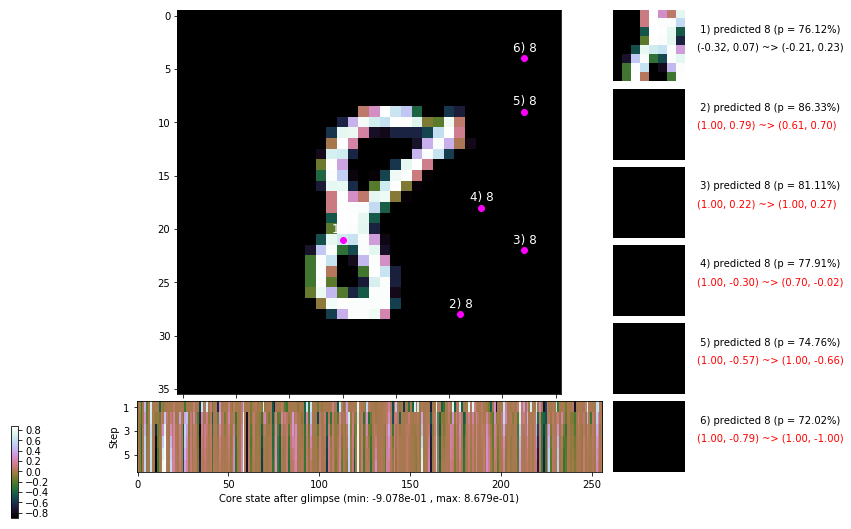

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 142.0 ms/b | lr: 7.05e-04 | grad 2norm: 11.52 | grad inf norm:  3.271
         Weights || abs max:  2.26 ( 3878.63) | mean:  5.33e-04 ( 0.02) | var: 5.75e-02 (  892.76)
          Biases || abs max:  1.14 (  113.25) | mean: -1.20e-01 ( 0.11) | var: 6.99e-02 (   68.59)
                    class loss: 0.555 | steps: 2.499 | reward:  4.107 | acc.: 81.57%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 141.3 ms/b | lr: 7.05e-04 | grad 2norm: 11.68 | grad inf norm:  3.373
         Weights || abs max:  2.26 ( 1975.98) | mean:  5.36e-04 ( 0.01) | var: 5.77e-02 (   65.93)
          Biases || abs max:  1.14 (  408.40) | mean: -1.20e-01 ( 0.24) | var: 7.00e-02 ( 3310.33)
                    class loss: 0.554 | steps: 2.508 | reward:  4.057 | acc.: 80.98%

	Target class: 6 | Discounted rewards: [1.464, 0.928, 1.8

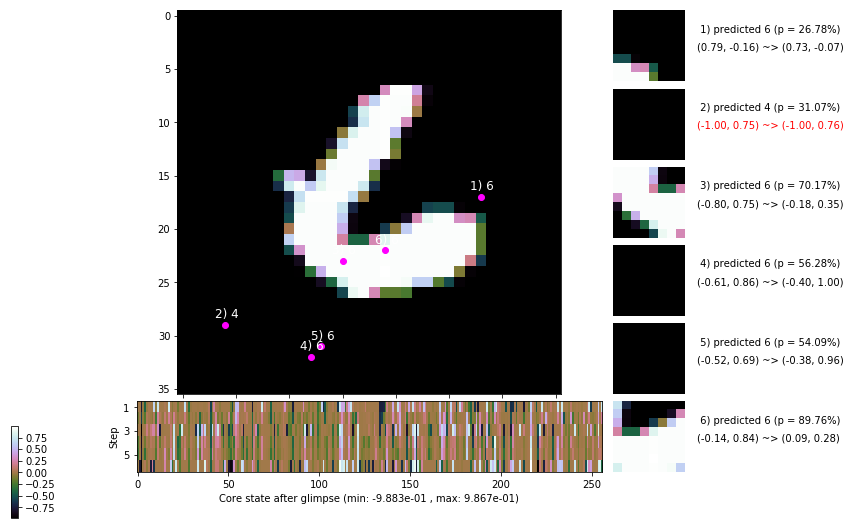

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 141.0 ms/b | lr: 7.03e-04 | grad 2norm: 11.56 | grad inf norm:  3.267
         Weights || abs max:  2.28 ( 4159.48) | mean:  5.05e-04 ( 0.02) | var: 5.78e-02 ( 1652.70)
          Biases || abs max:  1.14 (  250.43) | mean: -1.20e-01 ( 0.23) | var: 7.02e-02 ( 1715.98)
                    class loss: 0.583 | steps: 2.506 | reward:  4.058 | acc.: 80.30%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 138.9 ms/b | lr: 7.02e-04 | grad 2norm: 11.35 | grad inf norm:  3.156
         Weights || abs max:  2.29 ( 4048.92) | mean:  4.94e-04 ( 0.02) | var: 5.79e-02 ( 1399.89)
          Biases || abs max:  1.15 (  118.75) | mean: -1.21e-01 ( 0.13) | var: 7.07e-02 (   73.94)
                    class loss: 0.587 | steps: 2.510 | reward:  4.063 | acc.: 80.02%

	Target class: 6 | Discounted rewards: [0.454, 0.928, 1.8

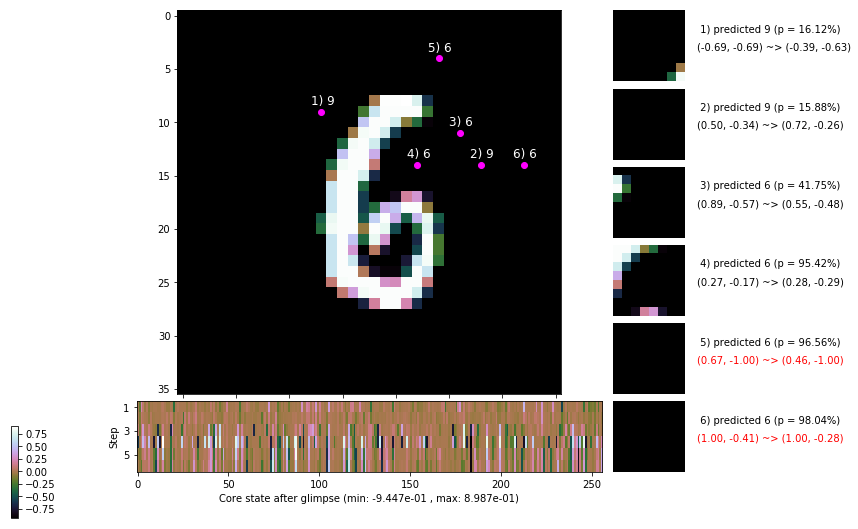

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 157.6 ms/b | lr: 7.01e-04 | grad 2norm: 11.46 | grad inf norm:  3.183
         Weights || abs max:  2.29 ( 4879.64) | mean:  4.90e-04 ( 0.02) | var: 5.80e-02 ( 2047.37)
          Biases || abs max:  1.14 (  237.25) | mean: -1.21e-01 ( 0.16) | var: 7.08e-02 ( 2051.41)
                    class loss: 0.580 | steps: 2.540 | reward:  4.026 | acc.: 79.43%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 152.6 ms/b | lr: 7.00e-04 | grad 2norm: 11.31 | grad inf norm:  3.096
         Weights || abs max:  2.30 ( 3272.87) | mean:  4.57e-04 ( 0.02) | var: 5.81e-02 (  752.05)
          Biases || abs max:  1.15 (  360.27) | mean: -1.20e-01 ( 0.26) | var: 7.09e-02 ( 3838.62)
                    class loss: 0.561 | steps: 2.491 | reward:  4.083 | acc.: 80.60%

	Target class: 3 | Discounted rewards: [1.969, 1.938, 1.8

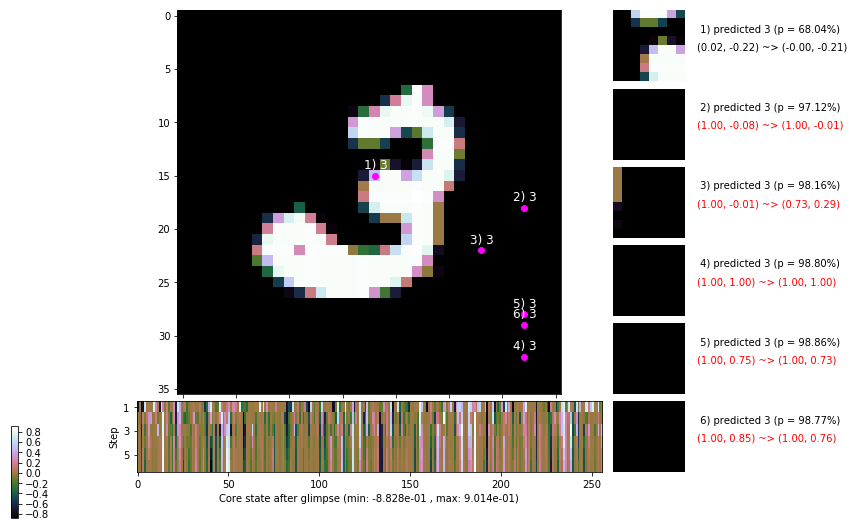

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 147.4 ms/b | lr: 6.99e-04 | grad 2norm: 11.81 | grad inf norm:  3.361
         Weights || abs max:  2.30 ( 2872.30) | mean:  4.47e-04 ( 0.01) | var: 5.82e-02 (  390.74)
          Biases || abs max:  1.14 (  111.45) | mean: -1.21e-01 ( 0.11) | var: 7.12e-02 (  124.94)
                    class loss: 0.591 | steps: 2.511 | reward:  4.049 | acc.: 79.75%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 144.7 ms/b | lr: 6.98e-04 | grad 2norm: 11.29 | grad inf norm:  3.113
         Weights || abs max:  2.31 ( 2742.96) | mean:  4.52e-04 ( 0.01) | var: 5.84e-02 (  123.27)
          Biases || abs max:  1.14 (  203.14) | mean: -1.21e-01 ( 0.15) | var: 7.13e-02 (  564.80)
                    class loss: 0.563 | steps: 2.504 | reward:  4.070 | acc.: 80.75%

	Target class: 2 | Discounted rewards: [1.969, 1.938, 1.8

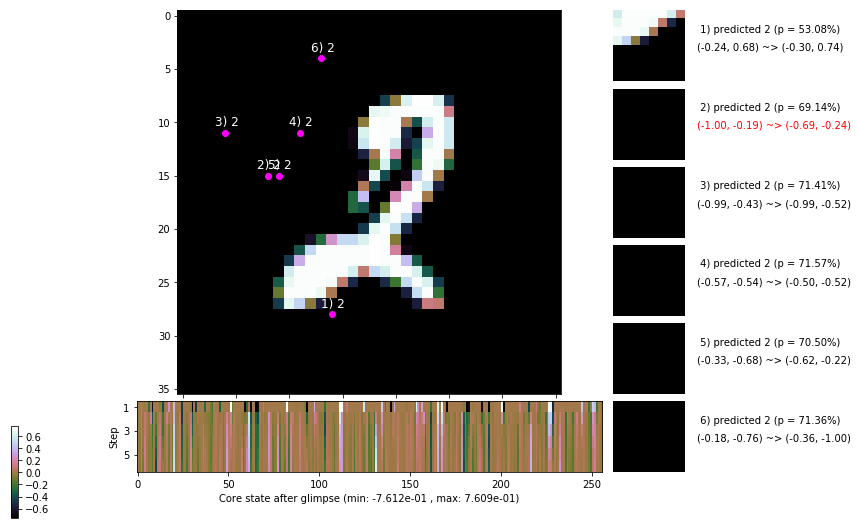

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


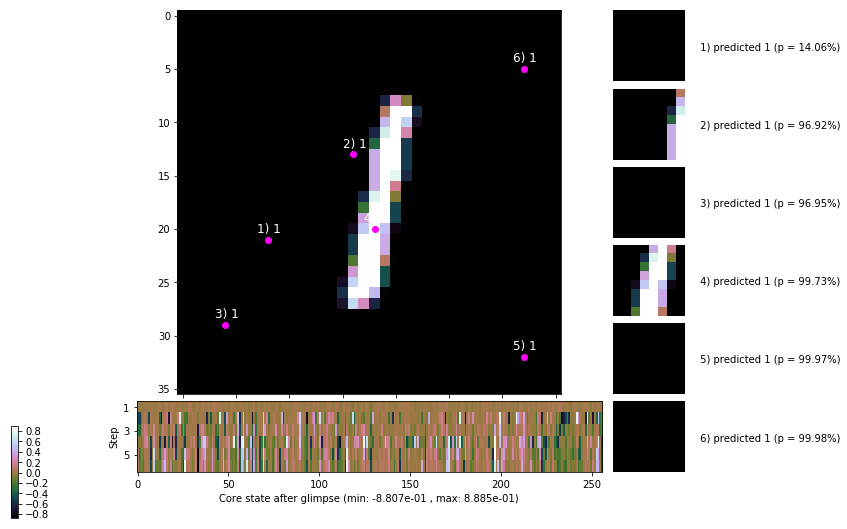


	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


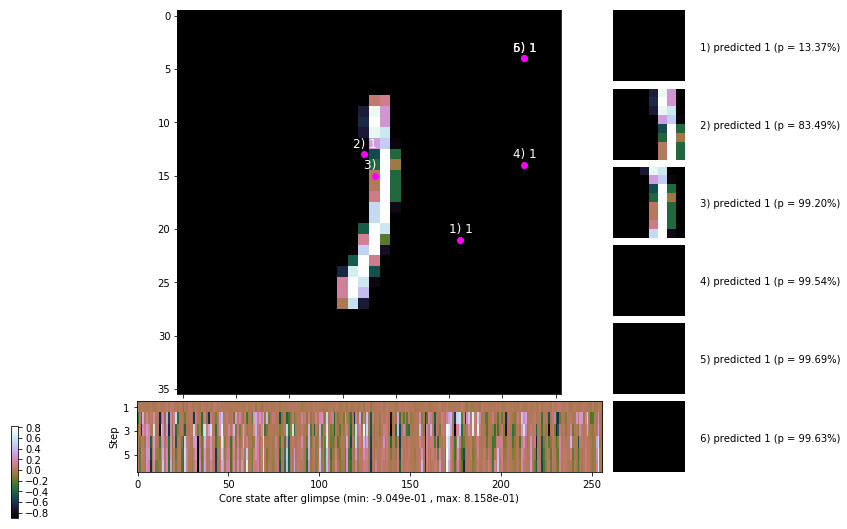

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


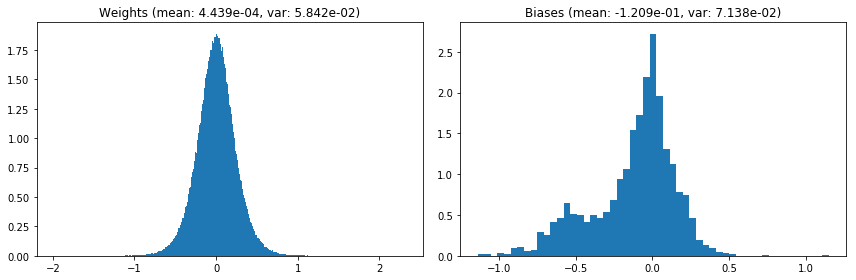

                                      Location network weights and biases


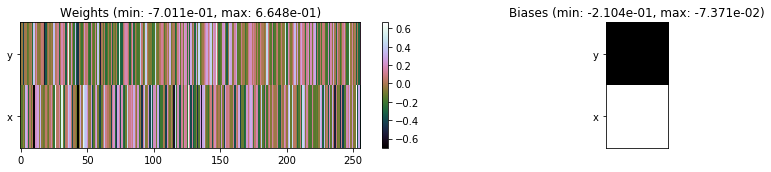

---------------------------------------------------------------------------------------------------------------
Elapsed time:  435.60 sec | TRAIN >> class loss: 0.5692 | steps:  2.507 :( | reward:  4.0677 :( | acc.: 80.548% :(
                          | VAL   >> class loss: 0.5546 | steps:  2.424 :( | reward:  4.1719 :( | acc.: 80.900% :(


Epoch  25/400) lr = 0.0006976
 b    300/  3000 >> 146.2 ms/b | lr: 6.97e-04 | grad 2norm: 11.48 | grad inf norm:  3.209
         Weights || abs max:  2.31 ( 1605.19) | mean:  4.29e-04 ( 0.01) | var: 5.85e-02 (   31.50)
          Biases || abs max:  1.15 (   92.47) | mean: -1.21e-01 ( 0.11) | var: 7.13e-02 (   41.06)
                    class loss: 0.557 | steps: 2.477 | reward:  4.107 | acc.: 81.02%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 141.2 ms/b | lr: 6.96e-04 | grad 2norm: 11.46 | grad inf norm:  3.215
         Weights || abs max:  2.30 ( 4671.48) | mean:  4.17e-04 (

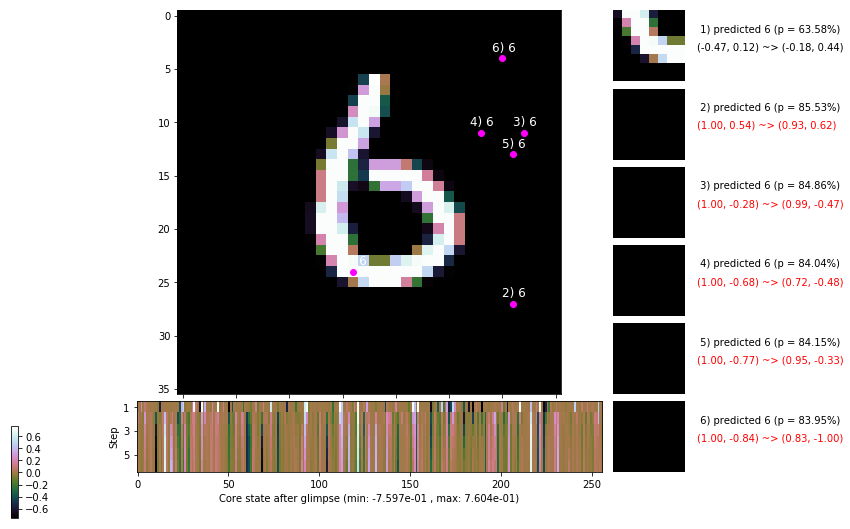

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 140.0 ms/b | lr: 6.95e-04 | grad 2norm: 11.50 | grad inf norm:  3.212
         Weights || abs max:  2.30 ( 4547.21) | mean:  4.08e-04 ( 0.02) | var: 5.87e-02 ( 1235.15)
          Biases || abs max:  1.15 (  167.23) | mean: -1.22e-01 ( 0.14) | var: 7.18e-02 (  619.21)
                    class loss: 0.589 | steps: 2.553 | reward:  4.009 | acc.: 80.15%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 145.8 ms/b | lr: 6.94e-04 | grad 2norm: 11.56 | grad inf norm:  3.223
         Weights || abs max:  2.31 ( 2568.40) | mean:  4.16e-04 ( 0.01) | var: 5.88e-02 (  151.15)
          Biases || abs max:  1.15 (  262.66) | mean: -1.22e-01 ( 0.17) | var: 7.19e-02 ( 4563.47)
                    class loss: 0.585 | steps: 2.548 | reward:  4.011 | acc.: 79.87%

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.8

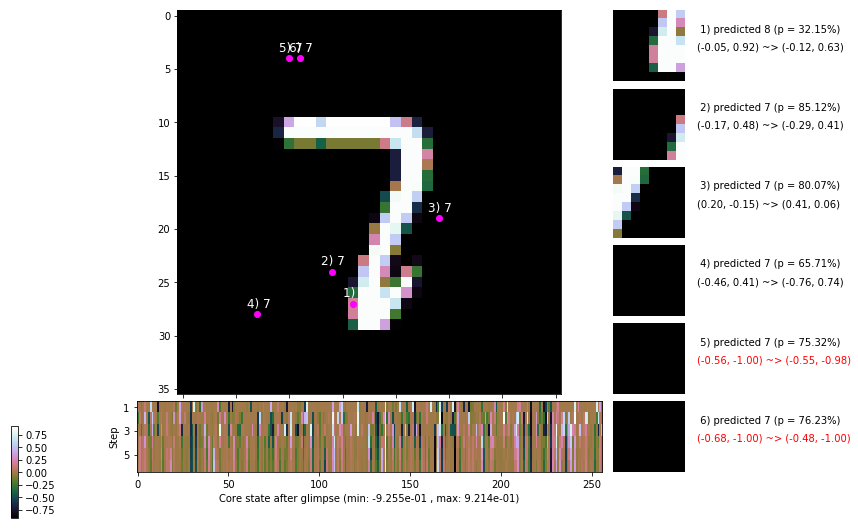

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 143.4 ms/b | lr: 6.93e-04 | grad 2norm: 11.32 | grad inf norm:  3.049
         Weights || abs max:  2.32 ( 4717.64) | mean:  4.04e-04 ( 0.02) | var: 5.90e-02 (  968.35)
          Biases || abs max:  1.16 (  126.66) | mean: -1.22e-01 ( 0.13) | var: 7.21e-02 (  120.27)
                    class loss: 0.606 | steps: 2.533 | reward:  4.032 | acc.: 80.00%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 145.0 ms/b | lr: 6.92e-04 | grad 2norm: 11.41 | grad inf norm:  3.042
         Weights || abs max:  2.33 ( 2503.79) | mean:  4.10e-04 ( 0.01) | var: 5.91e-02 (  115.25)
          Biases || abs max:  1.18 (  125.87) | mean: -1.22e-01 ( 0.12) | var: 7.24e-02 (   40.71)
                    class loss: 0.593 | steps: 2.519 | reward:  4.034 | acc.: 79.40%

	Target class: 5 | Discounted rewards: [1.969, 1.938, 1.8

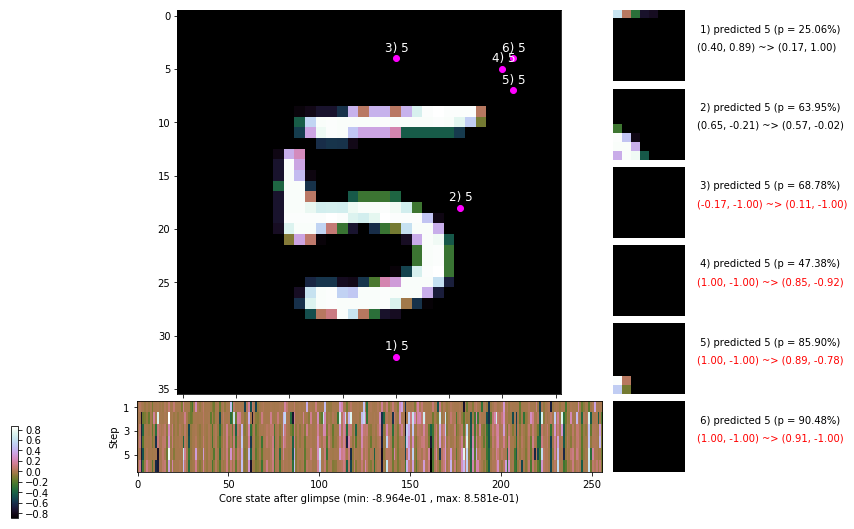

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 144.7 ms/b | lr: 6.91e-04 | grad 2norm: 11.20 | grad inf norm:  3.284
         Weights || abs max:  2.32 ( 2642.00) | mean:  4.01e-04 ( 0.01) | var: 5.92e-02 (  103.20)
          Biases || abs max:  1.19 (  255.77) | mean: -1.23e-01 ( 0.21) | var: 7.24e-02 ( 1363.71)
                    class loss: 0.577 | steps: 2.536 | reward:  4.038 | acc.: 80.53%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 138.5 ms/b | lr: 6.90e-04 | grad 2norm: 11.22 | grad inf norm:  3.110
         Weights || abs max:  2.33 ( 2014.17) | mean:  3.76e-04 ( 0.01) | var: 5.93e-02 (   40.40)
          Biases || abs max:  1.20 (  133.02) | mean: -1.23e-01 ( 0.13) | var: 7.27e-02 (   58.30)
                    class loss: 0.596 | steps: 2.557 | reward:  4.003 | acc.: 79.63%

	Target class: 6 | Discounted rewards: [0.201, 0.423, 0.8

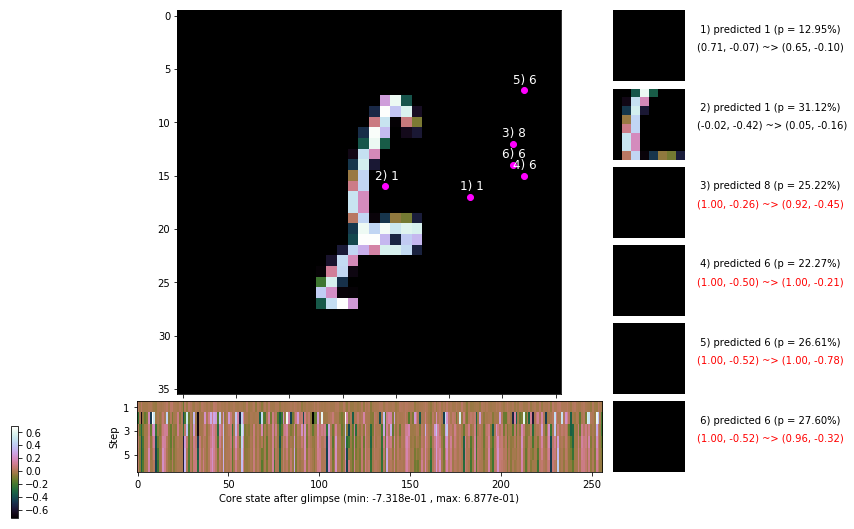

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 143.5 ms/b | lr: 6.89e-04 | grad 2norm: 11.04 | grad inf norm:  3.058
         Weights || abs max:  2.33 ( 3882.60) | mean:  3.71e-04 ( 0.02) | var: 5.94e-02 (  278.37)
          Biases || abs max:  1.20 (   81.23) | mean: -1.23e-01 ( 0.10) | var: 7.28e-02 (   38.94)
                    class loss: 0.561 | steps: 2.480 | reward:  4.067 | acc.: 80.32%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.9 ms/b | lr: 6.88e-04 | grad 2norm: 11.45 | grad inf norm:  3.282
         Weights || abs max:  2.35 ( 3129.83) | mean:  3.44e-04 ( 0.01) | var: 5.95e-02 (  168.35)
          Biases || abs max:  1.19 (  160.24) | mean: -1.23e-01 ( 0.14) | var: 7.28e-02 (  137.63)
                    class loss: 0.618 | steps: 2.549 | reward:  4.005 | acc.: 79.32%

	Target class: 0 | Discounted rewards: [0.454, 0.928, 1.8

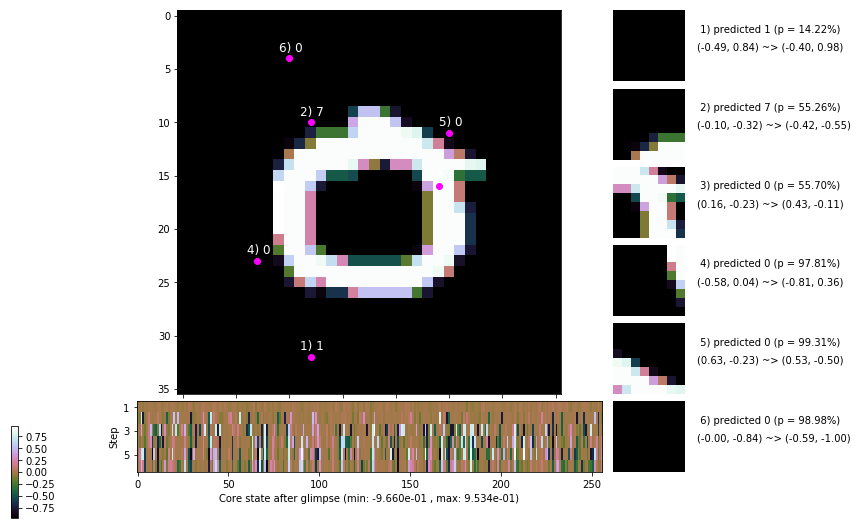

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 8 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


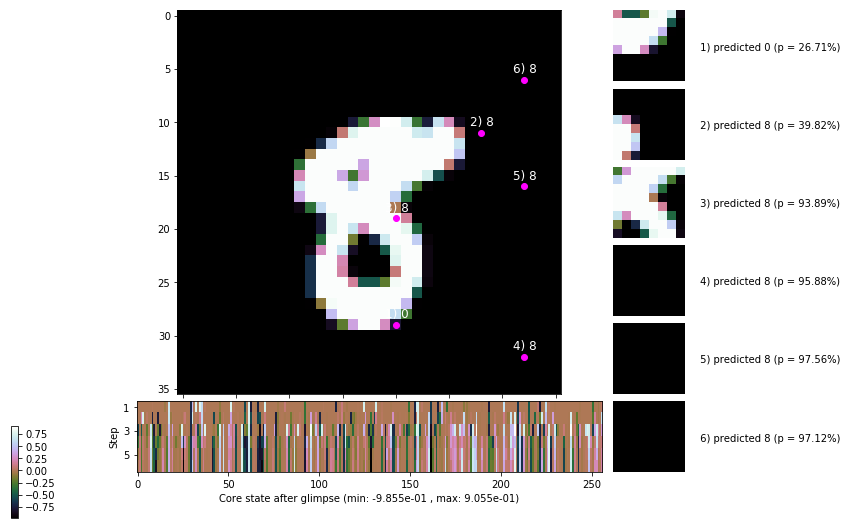


	Target class: 9 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


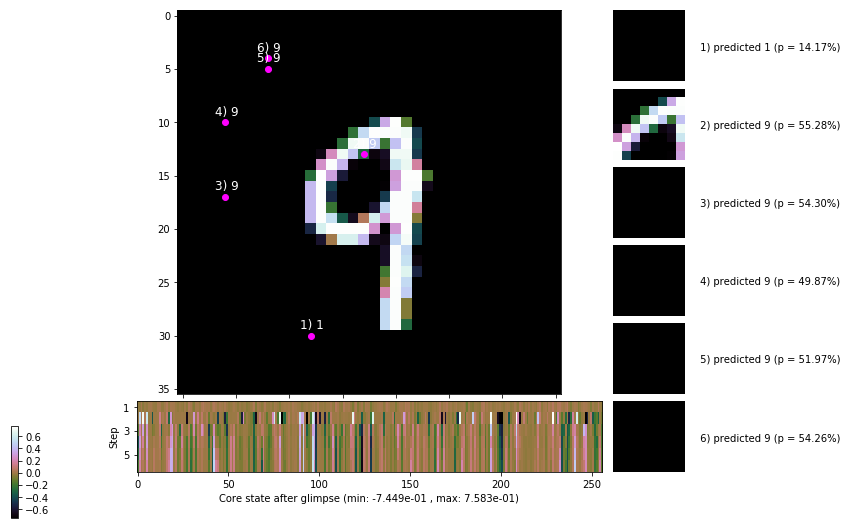

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


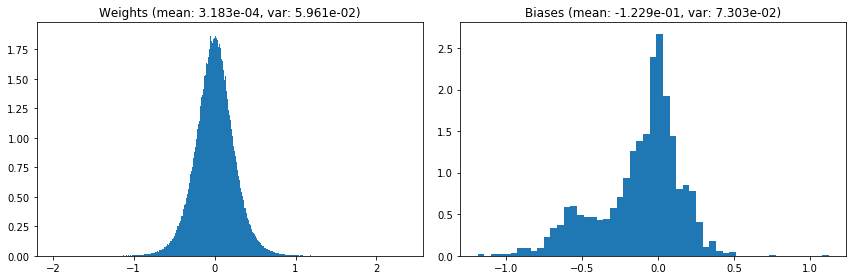

                                      Location network weights and biases


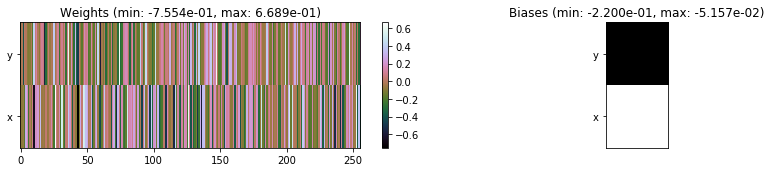

---------------------------------------------------------------------------------------------------------------
Elapsed time:  429.77 sec | TRAIN >> class loss: 0.5854 | steps:  2.528 :( | reward:  4.0358 :( | acc.: 80.075% :(
                          | VAL   >> class loss: 0.6202 | steps:  2.444 :( | reward:  4.1149 :( | acc.: 78.880% :(


Epoch  26/400) lr = 0.0006872
 b    300/  3000 >> 138.6 ms/b | lr: 6.86e-04 | grad 2norm: 11.31 | grad inf norm:  3.306
         Weights || abs max:  2.36 ( 4540.65) | mean:  3.33e-04 ( 0.02) | var: 5.97e-02 ( 1652.21)
          Biases || abs max:  1.19 (  234.56) | mean: -1.23e-01 ( 0.20) | var: 7.32e-02 (  997.17)
                    class loss: 0.615 | steps: 2.565 | reward:  3.993 | acc.: 78.95%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 145.6 ms/b | lr: 6.86e-04 | grad 2norm: 11.27 | grad inf norm:  3.162
         Weights || abs max:  2.37 ( 3762.24) | mean:  3.07e-04 (

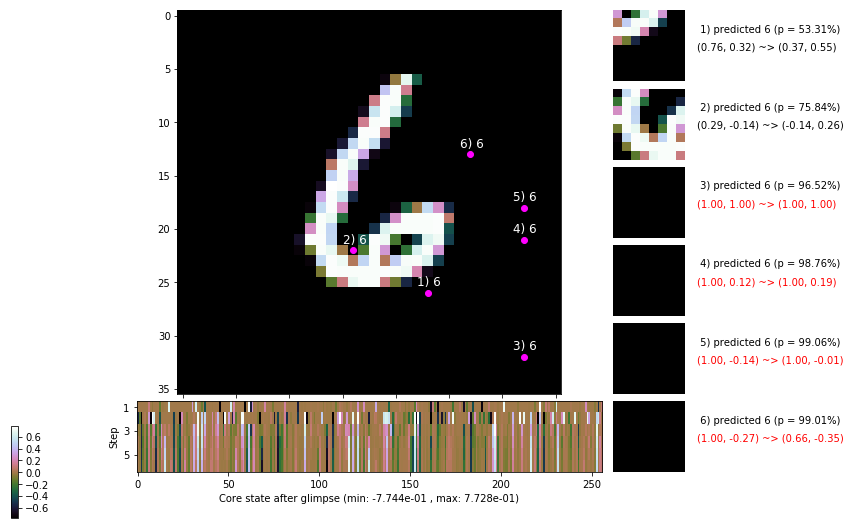

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 142.3 ms/b | lr: 6.84e-04 | grad 2norm: 11.21 | grad inf norm:  3.077
         Weights || abs max:  2.37 ( 5975.97) | mean:  3.23e-04 ( 0.02) | var: 5.99e-02 ( 2701.15)
          Biases || abs max:  1.19 (  120.26) | mean: -1.23e-01 ( 0.13) | var: 7.33e-02 (   60.18)
                    class loss: 0.593 | steps: 2.534 | reward:  4.035 | acc.: 79.87%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 141.2 ms/b | lr: 6.84e-04 | grad 2norm: 11.36 | grad inf norm:  3.202
         Weights || abs max:  2.36 ( 2466.71) | mean:  3.42e-04 ( 0.01) | var: 6.00e-02 (  103.63)
          Biases || abs max:  1.18 (  214.88) | mean: -1.23e-01 ( 0.19) | var: 7.34e-02 (  978.12)
                    class loss: 0.596 | steps: 2.549 | reward:  4.017 | acc.: 79.52%

	Target class: 7 | Discounted rewards: [0.959, 1.938, 1.8

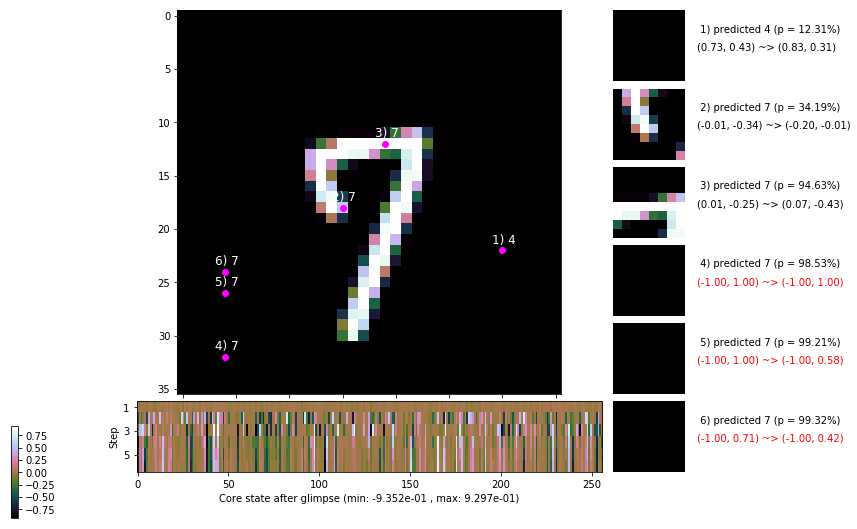

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 146.1 ms/b | lr: 6.82e-04 | grad 2norm: 11.49 | grad inf norm:  3.243
         Weights || abs max:  2.36 ( 2582.32) | mean:  3.41e-04 ( 0.01) | var: 6.01e-02 (  163.23)
          Biases || abs max:  1.18 (  105.06) | mean: -1.23e-01 ( 0.11) | var: 7.37e-02 (   85.95)
                    class loss: 0.588 | steps: 2.532 | reward:  4.003 | acc.: 79.33%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 140.0 ms/b | lr: 6.82e-04 | grad 2norm: 11.31 | grad inf norm:  3.135
         Weights || abs max:  2.35 ( 9026.00) | mean:  3.25e-04 ( 0.03) | var: 6.02e-02 (12008.49)
          Biases || abs max:  1.19 (   50.63) | mean: -1.23e-01 ( 0.08) | var: 7.39e-02 (    6.86)
                    class loss: 0.568 | steps: 2.492 | reward:  4.082 | acc.: 80.53%

	Target class: 6 | Discounted rewards: [1.969, 1.938, 1.8

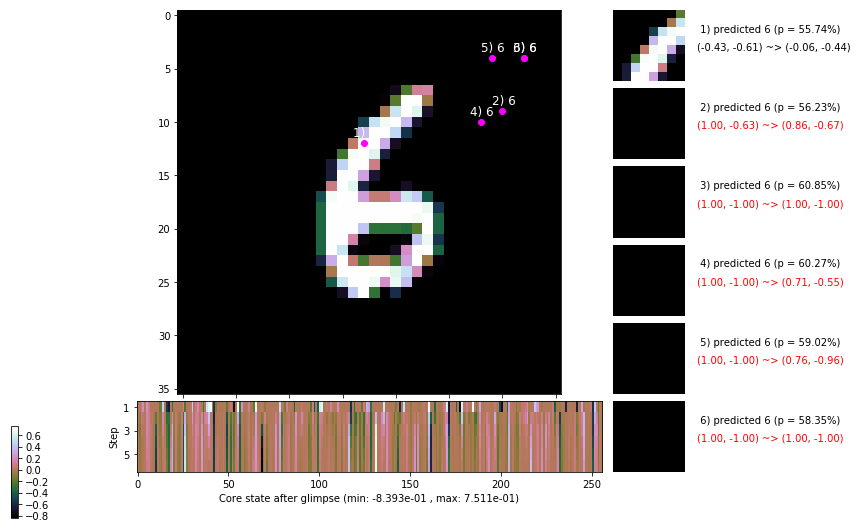

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 142.0 ms/b | lr: 6.80e-04 | grad 2norm: 11.63 | grad inf norm:  3.205
         Weights || abs max:  2.35 ( 2584.16) | mean:  3.48e-04 ( 0.01) | var: 6.03e-02 (   85.87)
          Biases || abs max:  1.19 (  263.31) | mean: -1.24e-01 ( 0.17) | var: 7.41e-02 ( 1921.33)
                    class loss: 0.584 | steps: 2.543 | reward:  4.018 | acc.: 79.65%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 144.5 ms/b | lr: 6.80e-04 | grad 2norm: 11.27 | grad inf norm:  3.187
         Weights || abs max:  2.36 ( 3102.17) | mean:  3.34e-04 ( 0.01) | var: 6.05e-02 (  255.19)
          Biases || abs max:  1.18 (  390.27) | mean: -1.24e-01 ( 0.22) | var: 7.43e-02 ( 9505.07)
                    class loss: 0.554 | steps: 2.473 | reward:  4.110 | acc.: 80.63%

	Target class: 8 | Discounted rewards: [-0.020, -0.019, -

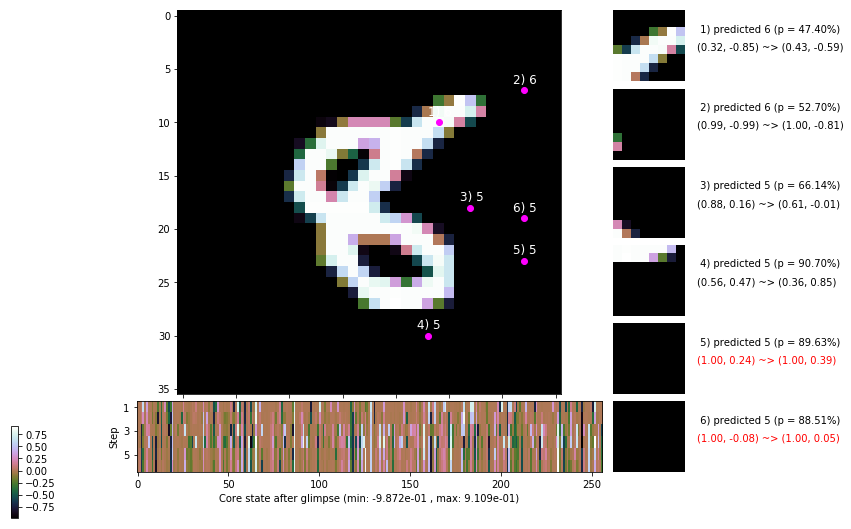

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 139.5 ms/b | lr: 6.78e-04 | grad 2norm: 11.31 | grad inf norm:  3.099
         Weights || abs max:  2.36 ( 3008.42) | mean:  3.33e-04 ( 0.01) | var: 6.06e-02 (  333.01)
          Biases || abs max:  1.18 (  197.60) | mean: -1.24e-01 ( 0.15) | var: 7.43e-02 ( 1004.77)
                    class loss: 0.570 | steps: 2.469 | reward:  4.095 | acc.: 80.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 140.8 ms/b | lr: 6.78e-04 | grad 2norm: 11.27 | grad inf norm:  3.147
         Weights || abs max:  2.36 (66422.01) | mean:  3.43e-04 ( 0.13) | var: 6.07e-02 (2187068.00)
          Biases || abs max:  1.18 (  126.36) | mean: -1.24e-01 ( 0.13) | var: 7.44e-02 (  191.79)
                    class loss: 0.565 | steps: 2.481 | reward:  4.095 | acc.: 80.25%

	Target class: 9 | Discounted rewards: [0.959, 1.938, 1

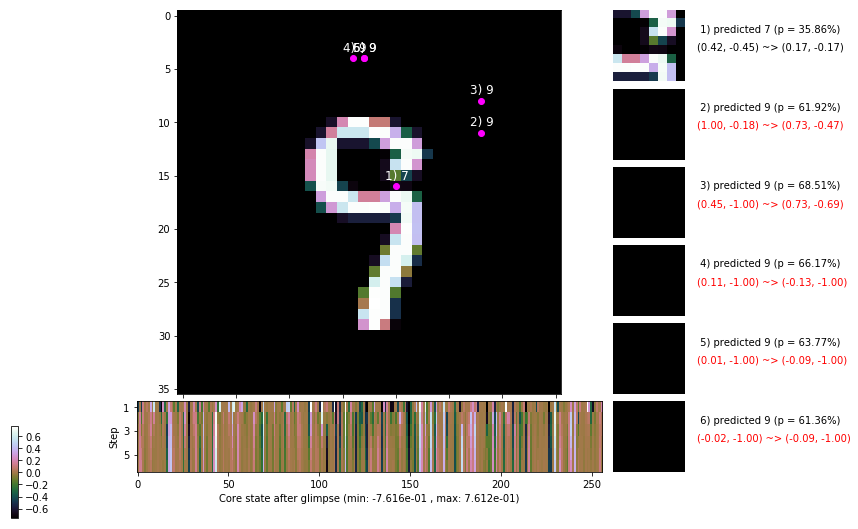

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 9 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


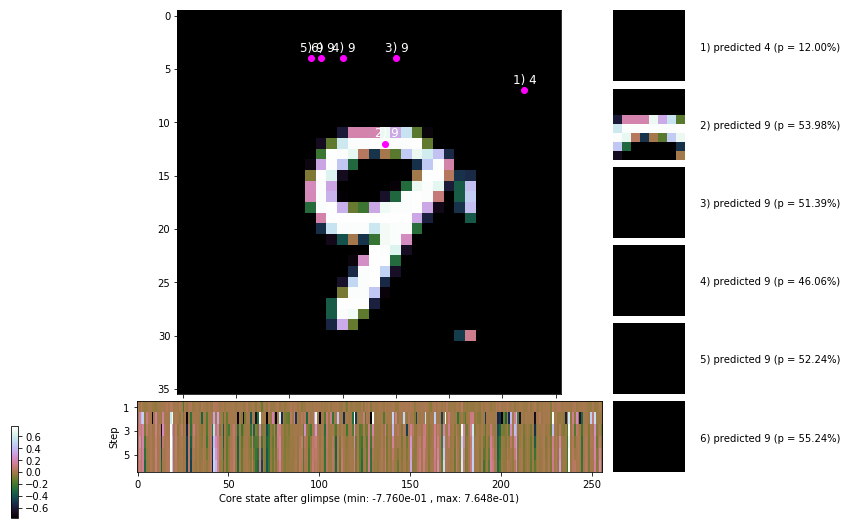


	Target class: 3 | Discounted rewards: [0.454, 0.928, 1.875, 1.750, 1.500, 1.000]


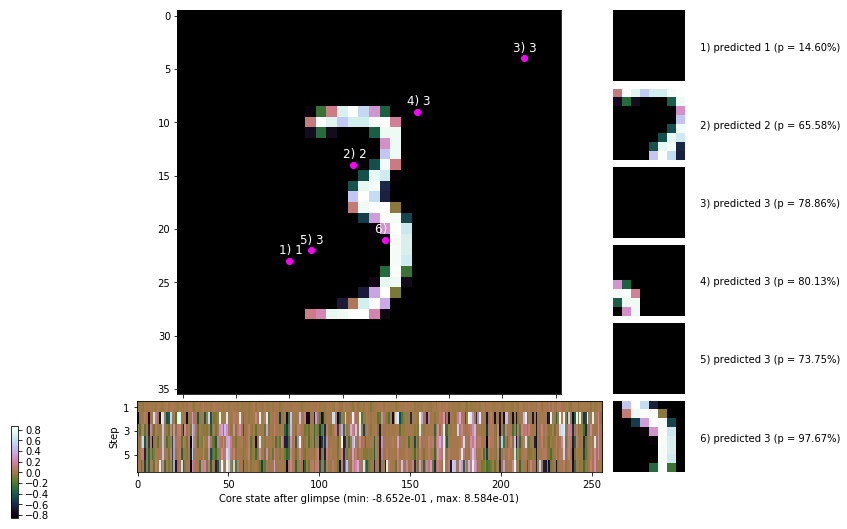

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


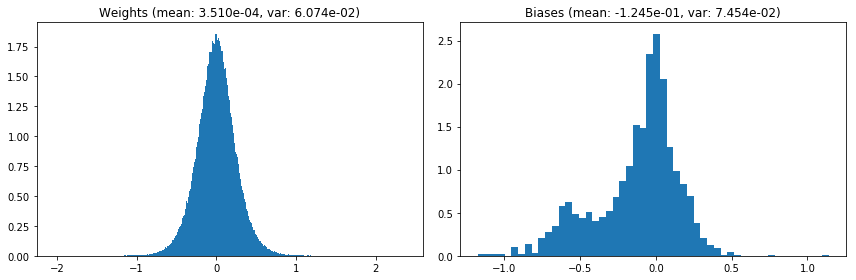

                                      Location network weights and biases


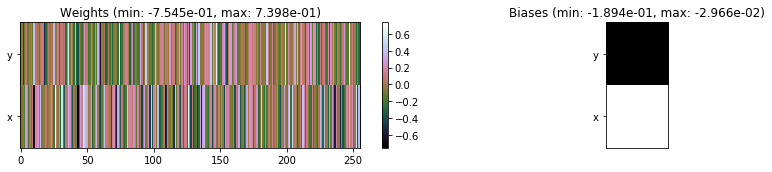

---------------------------------------------------------------------------------------------------------------
Elapsed time:  426.81 sec | TRAIN >> class loss: 0.5836 | steps:  2.518 :( | reward:  4.0449 :( | acc.: 79.798% :(
                          | VAL   >> class loss: 0.5857 | steps:  2.456 :( | reward:  4.0994 :( | acc.: 78.860% :(


Epoch  27/400) lr = 0.0006769
 b    300/  3000 >> 139.3 ms/b | lr: 6.76e-04 | grad 2norm: 11.38 | grad inf norm:  3.146
         Weights || abs max:  2.37 ( 2687.29) | mean:  3.54e-04 ( 0.01) | var: 6.08e-02 (  140.32)
          Biases || abs max:  1.19 (  116.19) | mean: -1.24e-01 ( 0.11) | var: 7.45e-02 (  155.64)
                    class loss: 0.557 | steps: 2.488 | reward:  4.073 | acc.: 80.38%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 138.2 ms/b | lr: 6.76e-04 | grad 2norm: 11.37 | grad inf norm:  3.168
         Weights || abs max:  2.37 ( 2408.09) | mean:  3.86e-04 (

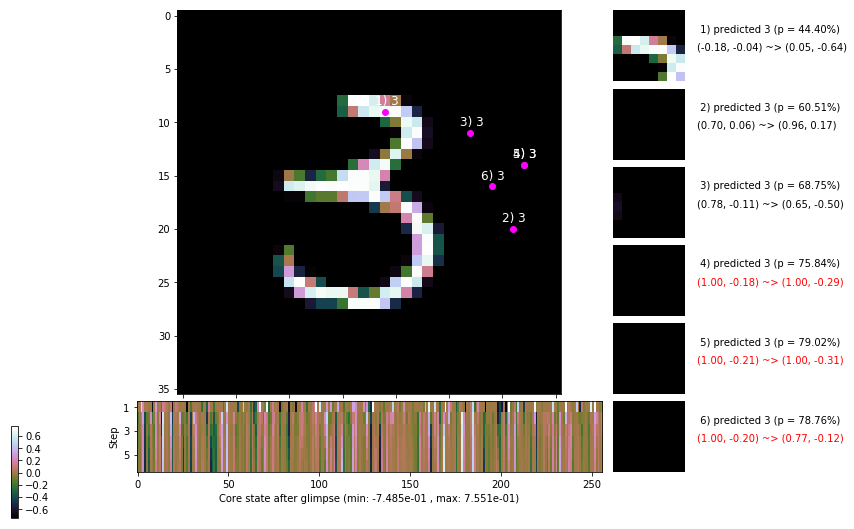

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 142.1 ms/b | lr: 6.74e-04 | grad 2norm: 11.24 | grad inf norm:  3.120
         Weights || abs max:  2.37 ( 3334.24) | mean:  4.17e-04 ( 0.02) | var: 6.10e-02 (  166.39)
          Biases || abs max:  1.20 (  213.58) | mean: -1.24e-01 ( 0.17) | var: 7.49e-02 (  399.16)
                    class loss: 0.568 | steps: 2.495 | reward:  4.087 | acc.: 80.65%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 136.5 ms/b | lr: 6.74e-04 | grad 2norm: 11.49 | grad inf norm:  3.251
         Weights || abs max:  2.37 ( 2646.26) | mean:  4.43e-04 ( 0.01) | var: 6.11e-02 (  129.35)
          Biases || abs max:  1.20 (  176.01) | mean: -1.24e-01 ( 0.15) | var: 7.51e-02 (   85.09)
                    class loss: 0.562 | steps: 2.468 | reward:  4.106 | acc.: 80.88%

	Target class: 5 | Discounted rewards: [0.959, 1.938, 1.8

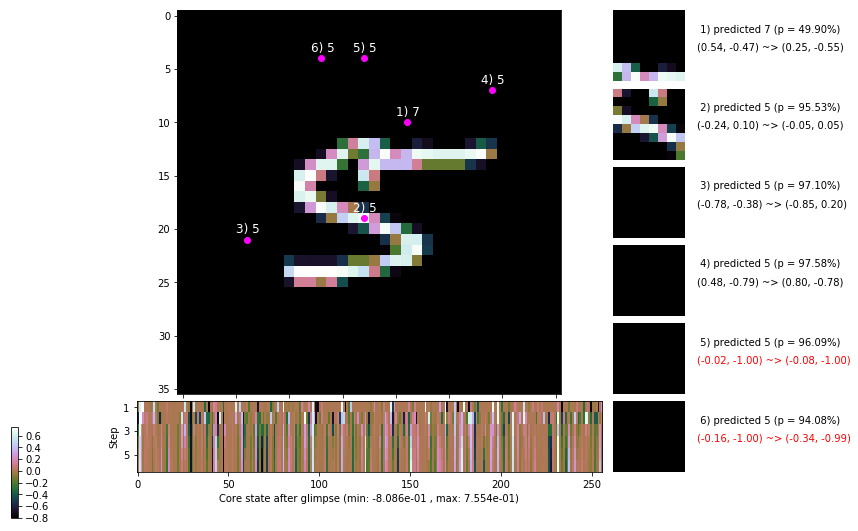

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 140.2 ms/b | lr: 6.72e-04 | grad 2norm: 11.34 | grad inf norm:  3.260
         Weights || abs max:  2.38 ( 2628.69) | mean:  4.57e-04 ( 0.01) | var: 6.12e-02 (   84.53)
          Biases || abs max:  1.19 (  184.77) | mean: -1.24e-01 ( 0.16) | var: 7.52e-02 (  259.30)
                    class loss: 0.578 | steps: 2.504 | reward:  4.084 | acc.: 80.00%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 145.0 ms/b | lr: 6.72e-04 | grad 2norm: 11.26 | grad inf norm:  3.150
         Weights || abs max:  2.38 ( 3868.55) | mean:  4.52e-04 ( 0.02) | var: 6.13e-02 (  643.67)
          Biases || abs max:  1.19 (  130.00) | mean: -1.25e-01 ( 0.13) | var: 7.50e-02 (  131.96)
                    class loss: 0.576 | steps: 2.494 | reward:  4.078 | acc.: 80.23%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

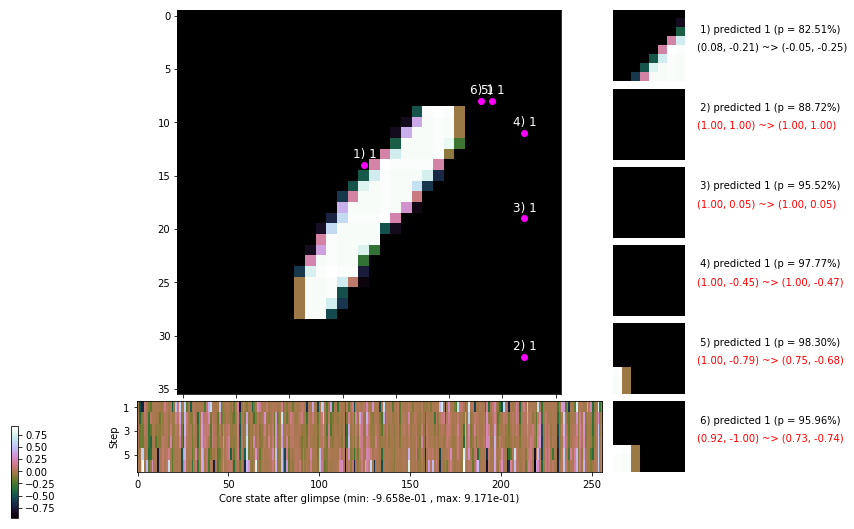

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 139.4 ms/b | lr: 6.70e-04 | grad 2norm: 11.14 | grad inf norm:  3.117
         Weights || abs max:  2.39 ( 6314.40) | mean:  4.52e-04 ( 0.02) | var: 6.15e-02 ( 7785.57)
          Biases || abs max:  1.20 (  242.68) | mean: -1.25e-01 ( 0.18) | var: 7.50e-02 (  649.34)
                    class loss: 0.554 | steps: 2.446 | reward:  4.140 | acc.: 81.52%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 137.4 ms/b | lr: 6.70e-04 | grad 2norm: 11.21 | grad inf norm:  3.079
         Weights || abs max:  2.39 ( 2412.35) | mean:  4.61e-04 ( 0.01) | var: 6.16e-02 (   87.89)
          Biases || abs max:  1.21 (  139.01) | mean: -1.26e-01 ( 0.14) | var: 7.52e-02 (  115.83)
                    class loss: 0.550 | steps: 2.494 | reward:  4.088 | acc.: 80.90%

	Target class: 8 | Discounted rewards: [-0.020, -0.019, -

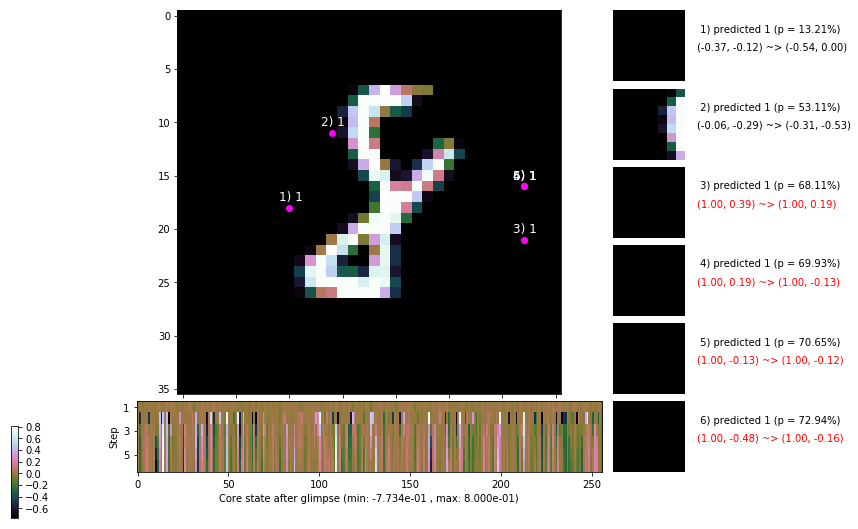

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 145.2 ms/b | lr: 6.68e-04 | grad 2norm: 11.19 | grad inf norm:  3.190
         Weights || abs max:  2.38 ( 4351.54) | mean:  4.57e-04 ( 0.02) | var: 6.17e-02 (  520.63)
          Biases || abs max:  1.21 (  369.72) | mean: -1.26e-01 ( 0.22) | var: 7.54e-02 ( 1610.66)
                    class loss: 0.573 | steps: 2.491 | reward:  4.052 | acc.: 79.75%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.1 ms/b | lr: 6.68e-04 | grad 2norm: 11.35 | grad inf norm:  3.196
         Weights || abs max:  2.39 ( 3936.63) | mean:  4.63e-04 ( 0.02) | var: 6.18e-02 (  847.16)
          Biases || abs max:  1.21 (  407.07) | mean: -1.26e-01 ( 0.24) | var: 7.55e-02 ( 1316.91)
                    class loss: 0.564 | steps: 2.487 | reward:  4.099 | acc.: 80.85%

	Target class: 9 | Discounted rewards: [0.012, 0.044, 0.1

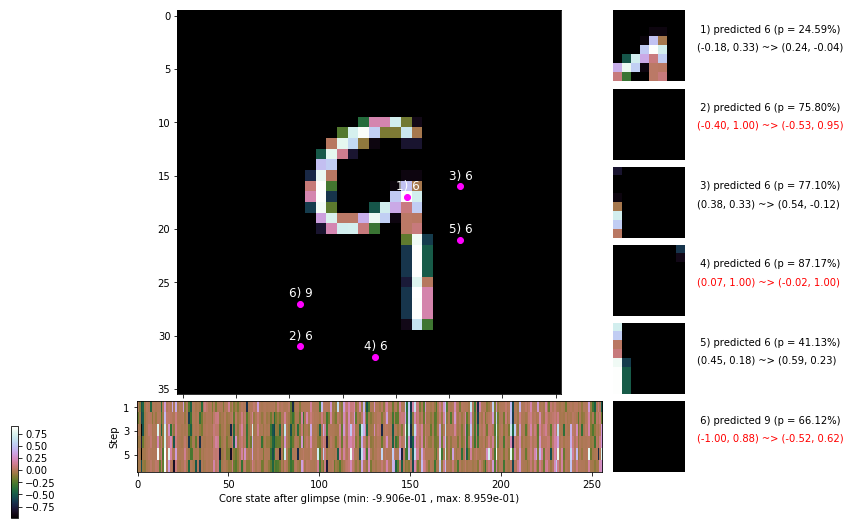

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 5 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


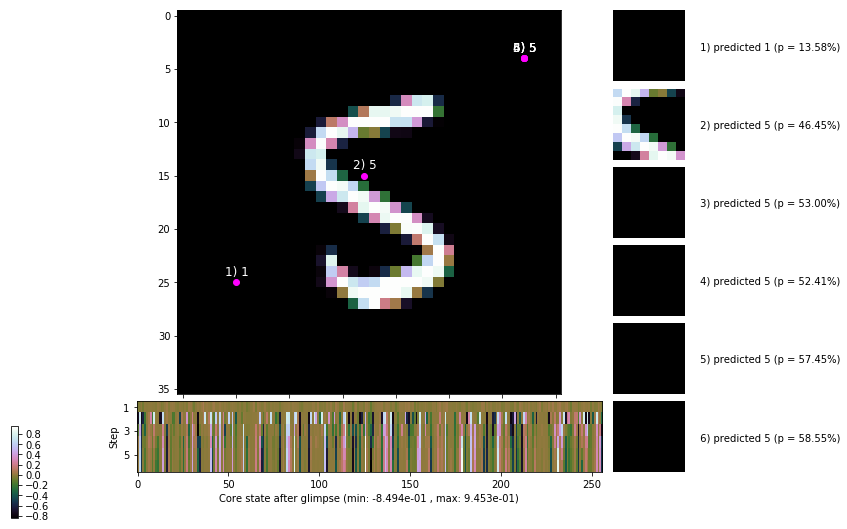


	Target class: 2 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


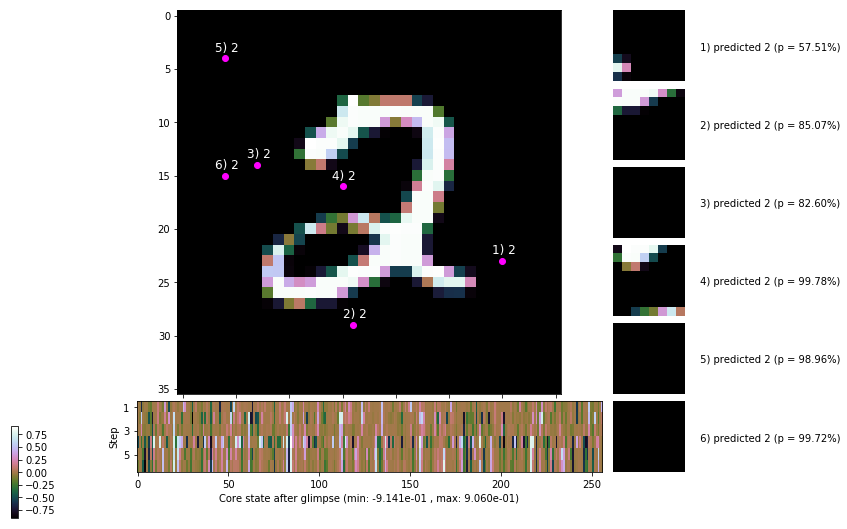

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


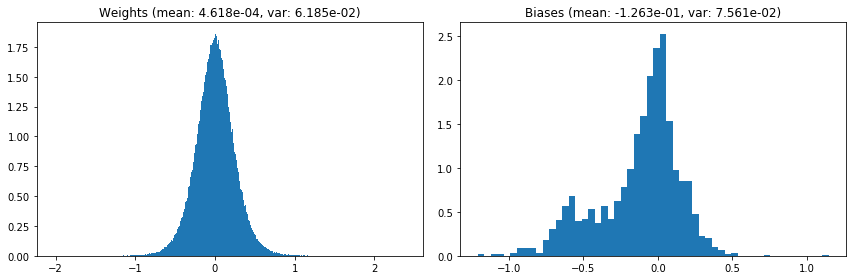

                                      Location network weights and biases


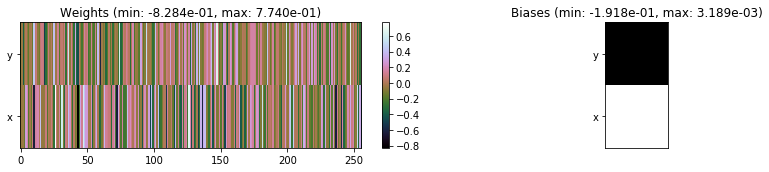

---------------------------------------------------------------------------------------------------------------
Elapsed time:  420.41 sec | TRAIN >> class loss: 0.5657 | steps:  2.486 :( | reward:  4.0887 :( | acc.: 80.537% :(
                          | VAL   >> class loss: 0.5700 | steps:  2.382 :( | reward:  4.2004 :( | acc.: 80.500% :(


Epoch  28/400) lr = 0.0006668
 b    300/  3000 >> 139.4 ms/b | lr: 6.66e-04 | grad 2norm: 11.21 | grad inf norm:  3.121
         Weights || abs max:  2.38 ( 1951.19) | mean:  4.85e-04 ( 0.01) | var: 6.19e-02 (   53.12)
          Biases || abs max:  1.21 (  167.69) | mean: -1.26e-01 ( 0.15) | var: 7.56e-02 (   77.89)
                    class loss: 0.558 | steps: 2.495 | reward:  4.078 | acc.: 80.43%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 137.5 ms/b | lr: 6.66e-04 | grad 2norm: 11.30 | grad inf norm:  3.151
         Weights || abs max:  2.39 ( 3332.73) | mean:  4.95e-04 (

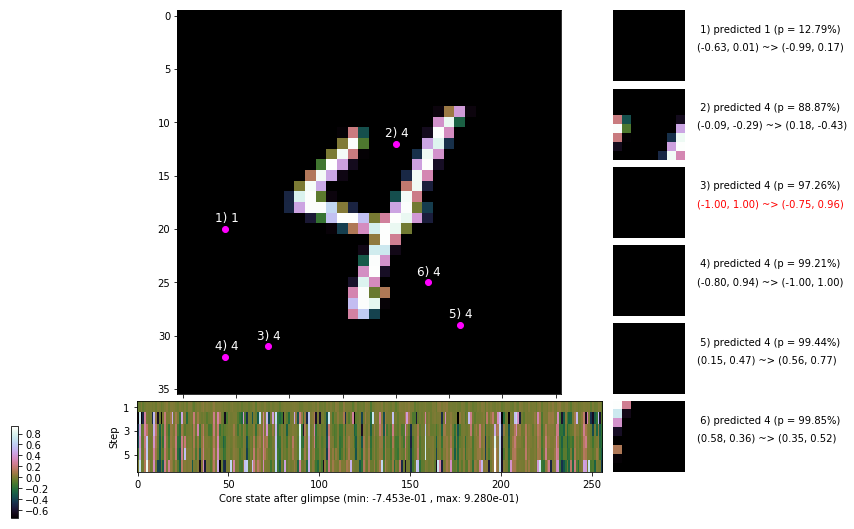

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 138.9 ms/b | lr: 6.64e-04 | grad 2norm: 11.32 | grad inf norm:  3.214
         Weights || abs max:  2.39 ( 5093.00) | mean:  4.79e-04 ( 0.02) | var: 6.21e-02 ( 4605.47)
          Biases || abs max:  1.22 (  238.44) | mean: -1.27e-01 ( 0.18) | var: 7.63e-02 (  192.87)
                    class loss: 0.566 | steps: 2.478 | reward:  4.088 | acc.: 80.07%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 140.4 ms/b | lr: 6.64e-04 | grad 2norm: 11.05 | grad inf norm:  3.099
         Weights || abs max:  2.40 ( 1596.14) | mean:  4.62e-04 ( 0.01) | var: 6.22e-02 (   29.14)
          Biases || abs max:  1.21 (  414.27) | mean: -1.26e-01 ( 0.26) | var: 7.67e-02 ( 1725.49)
                    class loss: 0.572 | steps: 2.502 | reward:  4.084 | acc.: 80.78%

	Target class: 6 | Discounted rewards: [-0.020, -0.019, -

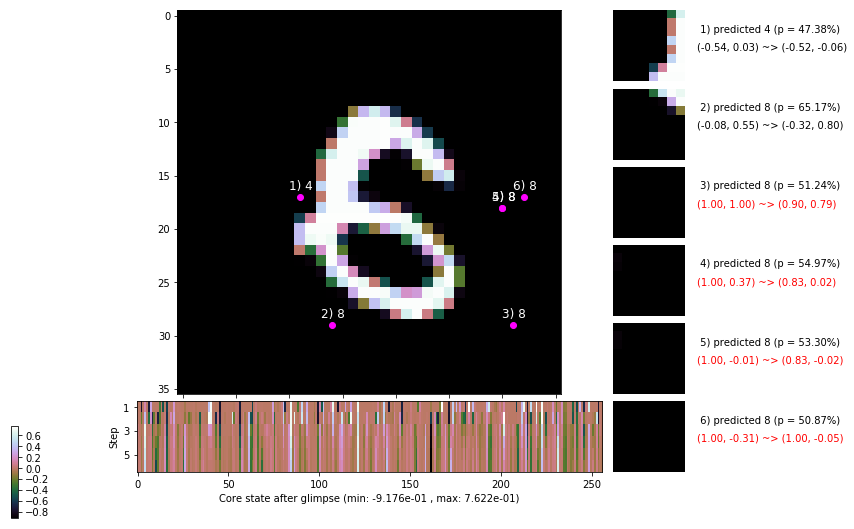

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 141.3 ms/b | lr: 6.62e-04 | grad 2norm: 11.12 | grad inf norm:  3.289
         Weights || abs max:  2.43 ( 4354.84) | mean:  4.69e-04 ( 0.02) | var: 6.23e-02 ( 1360.87)
          Biases || abs max:  1.22 (  267.84) | mean: -1.27e-01 ( 0.19) | var: 7.69e-02 (  566.50)
                    class loss: 0.574 | steps: 2.499 | reward:  4.069 | acc.: 80.02%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 137.1 ms/b | lr: 6.62e-04 | grad 2norm: 11.21 | grad inf norm:  3.115
         Weights || abs max:  2.42 ( 4216.50) | mean:  4.60e-04 ( 0.02) | var: 6.24e-02 ( 1667.86)
          Biases || abs max:  1.24 ( 1408.69) | mean: -1.27e-01 ( 0.63) | var: 7.71e-02 (124134.45)
                    class loss: 0.586 | steps: 2.487 | reward:  4.076 | acc.: 80.23%

	Target class: 3 | Discounted rewards: [0.012, 0.044, 0.

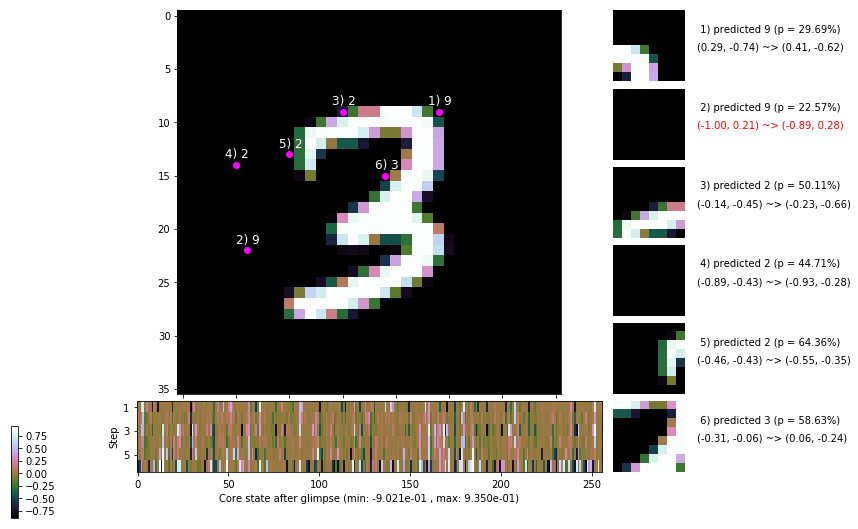

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 142.6 ms/b | lr: 6.60e-04 | grad 2norm: 11.11 | grad inf norm:  3.240
         Weights || abs max:  2.42 ( 5706.89) | mean:  4.71e-04 ( 0.02) | var: 6.25e-02 ( 5484.31)
          Biases || abs max:  1.25 (  707.99) | mean: -1.27e-01 ( 0.36) | var: 7.73e-02 (13844.51)
                    class loss: 0.596 | steps: 2.507 | reward:  4.052 | acc.: 79.58%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 138.2 ms/b | lr: 6.60e-04 | grad 2norm: 11.28 | grad inf norm:  3.235
         Weights || abs max:  2.42 ( 3228.74) | mean:  4.79e-04 ( 0.01) | var: 6.26e-02 (  405.05)
          Biases || abs max:  1.25 (  246.19) | mean: -1.26e-01 ( 0.19) | var: 7.73e-02 (  338.23)
                    class loss: 0.588 | steps: 2.483 | reward:  4.079 | acc.: 79.58%

	Target class: 8 | Discounted rewards: [-0.020, -0.019, -

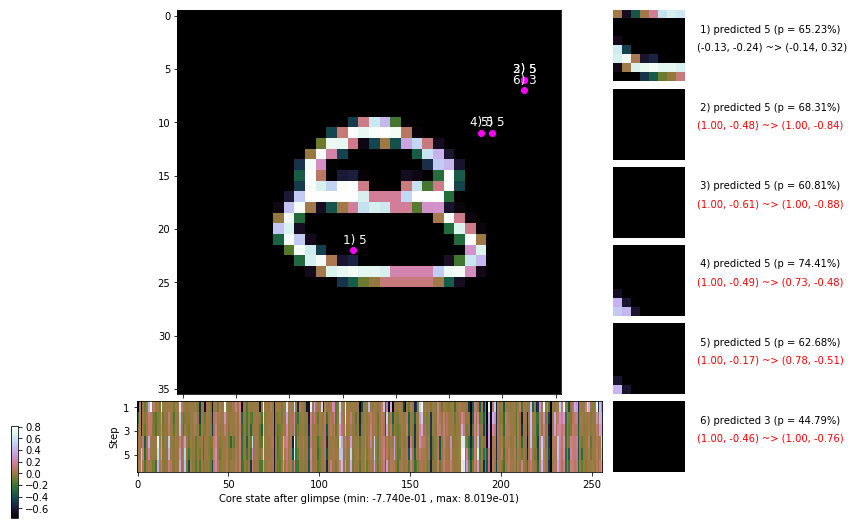

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 138.9 ms/b | lr: 6.58e-04 | grad 2norm: 11.03 | grad inf norm:  3.037
         Weights || abs max:  2.42 ( 2646.81) | mean:  4.92e-04 ( 0.01) | var: 6.27e-02 (  158.09)
          Biases || abs max:  1.24 (  154.29) | mean: -1.27e-01 ( 0.14) | var: 7.74e-02 (   76.48)
                    class loss: 0.612 | steps: 2.538 | reward:  4.019 | acc.: 79.58%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 142.7 ms/b | lr: 6.58e-04 | grad 2norm: 11.25 | grad inf norm:  3.288
         Weights || abs max:  2.43 ( 5318.80) | mean:  5.16e-04 ( 0.02) | var: 6.28e-02 ( 1801.04)
          Biases || abs max:  1.24 (  132.76) | mean: -1.27e-01 ( 0.14) | var: 7.74e-02 (  115.44)
                    class loss: 0.584 | steps: 2.512 | reward:  4.045 | acc.: 79.67%

	Target class: 0 | Discounted rewards: [0.959, 1.938, 1.8

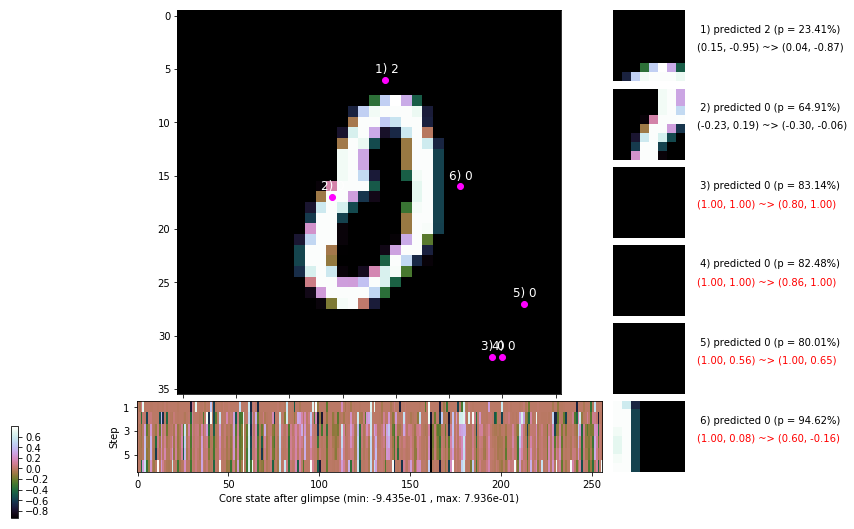

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 3 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


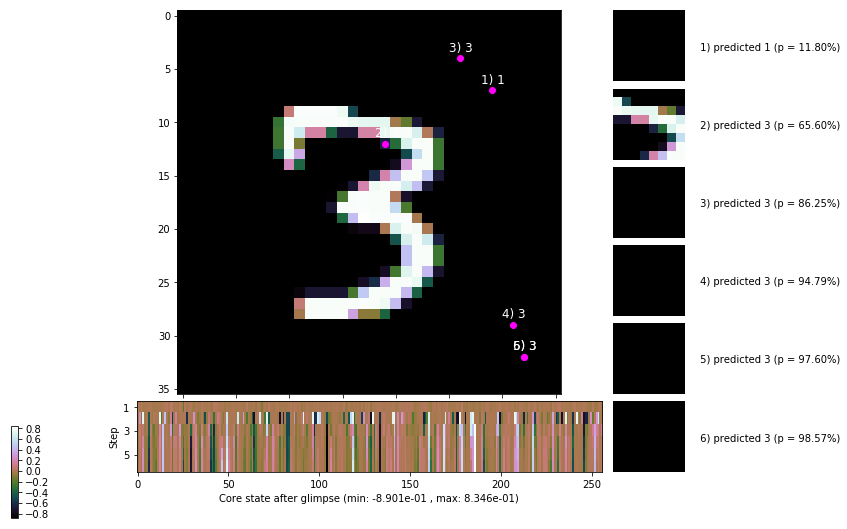


	Target class: 1 | Discounted rewards: [0.959, 1.938, 1.875, 1.750, 1.500, 1.000]


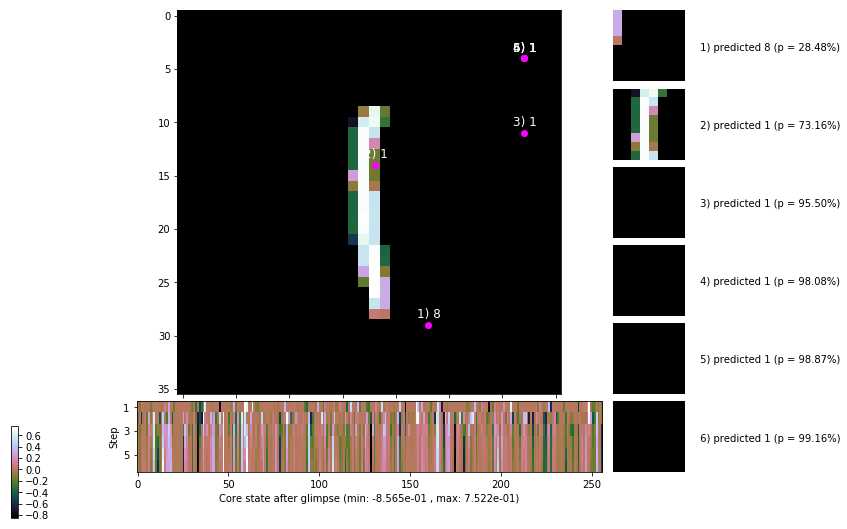

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


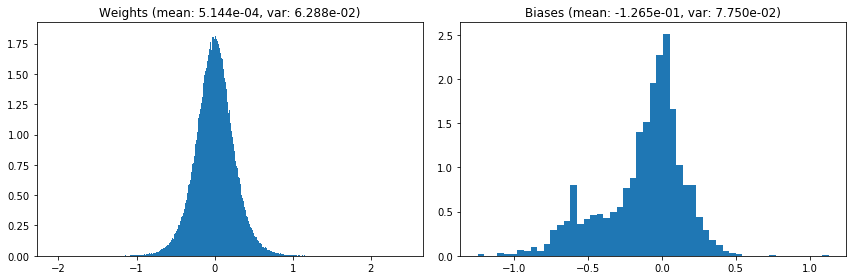

                                      Location network weights and biases


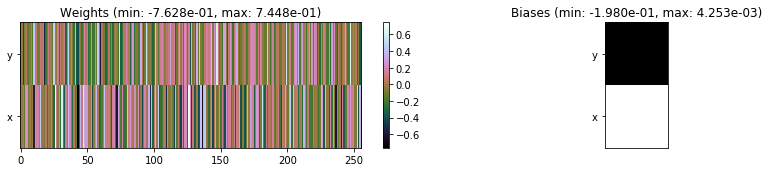

---------------------------------------------------------------------------------------------------------------
Elapsed time:  419.88 sec | TRAIN >> class loss: 0.5805 | steps:  2.502 :( | reward:  4.0651 :( | acc.: 79.993% :(
                          | VAL   >> class loss: 0.6146 | steps:  2.461 :( | reward:  4.0996 :( | acc.: 78.980% :(


Epoch  29/400) lr = 0.0006569
 b    300/  3000 >> 136.2 ms/b | lr: 6.56e-04 | grad 2norm: 11.33 | grad inf norm:  3.265
         Weights || abs max:  2.43 ( 5583.18) | mean:  5.07e-04 ( 0.02) | var: 6.29e-02 ( 2881.90)
          Biases || abs max:  1.24 (  145.17) | mean: -1.27e-01 ( 0.13) | var: 7.75e-02 (   51.53)
                    class loss: 0.599 | steps: 2.536 | reward:  4.019 | acc.: 79.15%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 135.7 ms/b | lr: 6.56e-04 | grad 2norm: 11.14 | grad inf norm:  3.140
         Weights || abs max:  2.43 ( 9221.44) | mean:  5.17e-04 (

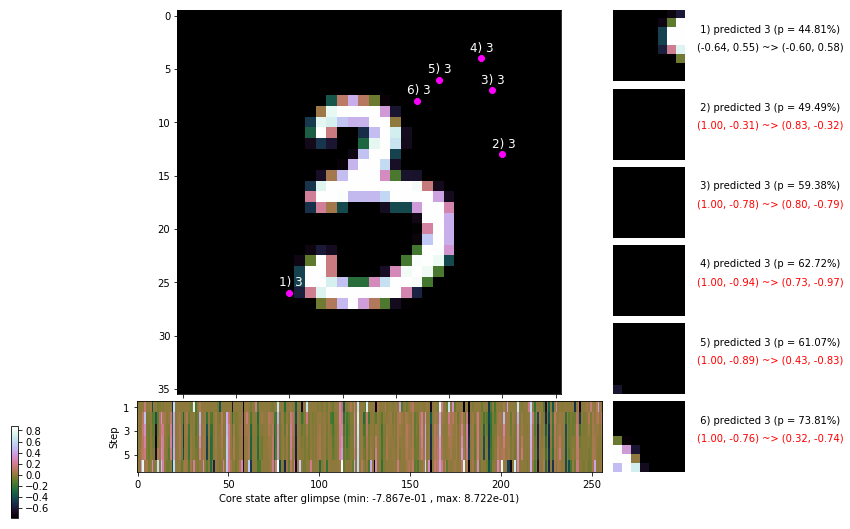

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 144.3 ms/b | lr: 6.54e-04 | grad 2norm: 11.24 | grad inf norm:  3.237
         Weights || abs max:  2.45 (11182.49) | mean:  5.32e-04 ( 0.03) | var: 6.32e-02 (47953.27)
          Biases || abs max:  1.24 (  465.28) | mean: -1.27e-01 ( 0.28) | var: 7.76e-02 ( 5127.17)
                    class loss: 0.589 | steps: 2.490 | reward:  4.051 | acc.: 79.83%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 135.2 ms/b | lr: 6.54e-04 | grad 2norm: 11.21 | grad inf norm:  3.193
         Weights || abs max:  2.46 ( 2329.85) | mean:  5.41e-04 ( 0.01) | var: 6.32e-02 (   66.40)
          Biases || abs max:  1.23 (  311.95) | mean: -1.27e-01 ( 0.22) | var: 7.77e-02 ( 2088.39)
                    class loss: 0.589 | steps: 2.498 | reward:  4.039 | acc.: 79.50%

	Target class: 9 | Discounted rewards: [0.959, 1.938, 1.8

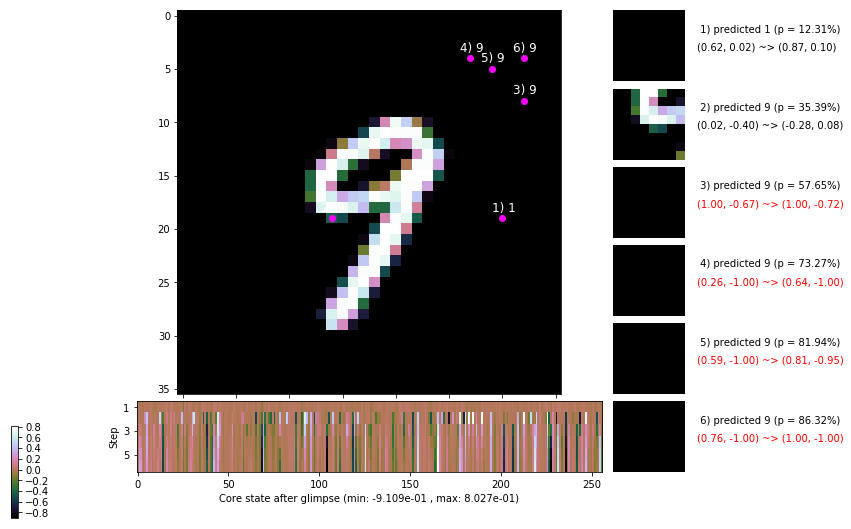

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 139.9 ms/b | lr: 6.52e-04 | grad 2norm: 11.05 | grad inf norm:  3.144
         Weights || abs max:  2.47 ( 3025.88) | mean:  5.54e-04 ( 0.01) | var: 6.33e-02 (  207.16)
          Biases || abs max:  1.23 (  296.07) | mean: -1.28e-01 ( 0.21) | var: 7.80e-02 (  372.38)
                    class loss: 0.573 | steps: 2.493 | reward:  4.080 | acc.: 80.72%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 141.8 ms/b | lr: 6.52e-04 | grad 2norm: 11.27 | grad inf norm:  3.225
         Weights || abs max:  2.46 ( 2301.18) | mean:  5.65e-04 ( 0.01) | var: 6.35e-02 (  204.53)
          Biases || abs max:  1.23 (  516.38) | mean: -1.27e-01 ( 0.32) | var: 7.81e-02 ( 4563.08)
                    class loss: 0.575 | steps: 2.466 | reward:  4.088 | acc.: 80.53%

	Target class: 0 | Discounted rewards: [1.969, 1.938, 1.8

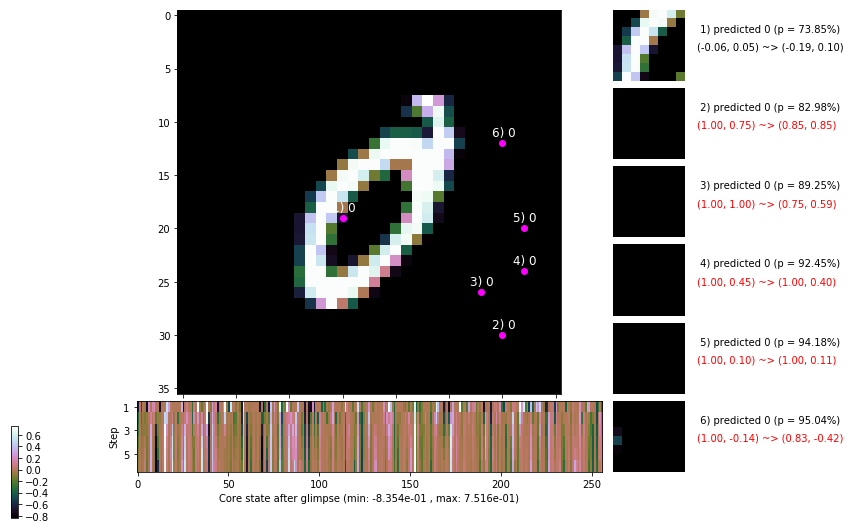

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 138.0 ms/b | lr: 6.50e-04 | grad 2norm: 11.03 | grad inf norm:  3.155
         Weights || abs max:  2.47 ( 9364.99) | mean:  5.44e-04 ( 0.03) | var: 6.36e-02 (29183.38)
          Biases || abs max:  1.23 (  464.28) | mean: -1.27e-01 ( 0.29) | var: 7.82e-02 ( 3704.49)
                    class loss: 0.569 | steps: 2.465 | reward:  4.111 | acc.: 81.12%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 138.4 ms/b | lr: 6.50e-04 | grad 2norm: 11.17 | grad inf norm:  3.213
         Weights || abs max:  2.49 ( 2696.30) | mean:  5.39e-04 ( 0.01) | var: 6.37e-02 (  173.66)
          Biases || abs max:  1.23 (  162.78) | mean: -1.27e-01 ( 0.16) | var: 7.82e-02 (   93.95)
                    class loss: 0.586 | steps: 2.522 | reward:  4.024 | acc.: 79.38%

	Target class: 0 | Discounted rewards: [0.201, 0.423, 0.8

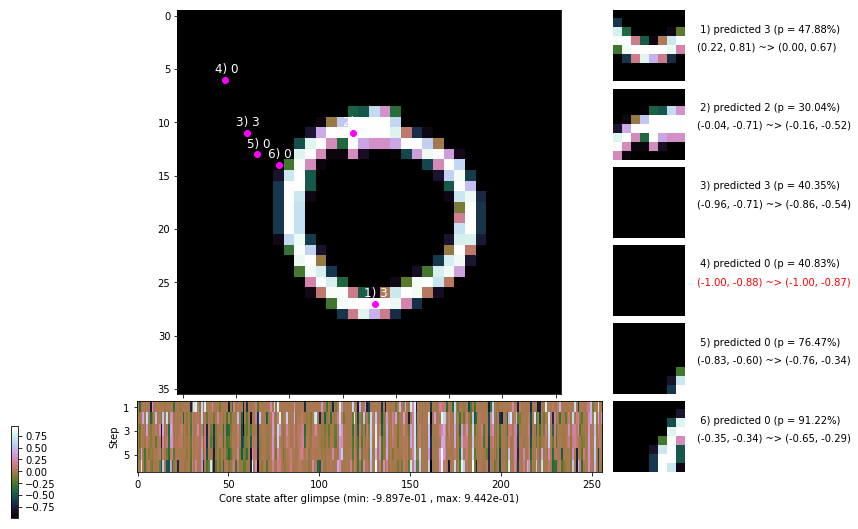

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 140.4 ms/b | lr: 6.48e-04 | grad 2norm: 11.20 | grad inf norm:  3.043
         Weights || abs max:  2.49 ( 2972.11) | mean:  5.63e-04 ( 0.01) | var: 6.38e-02 (  466.39)
          Biases || abs max:  1.22 (  219.71) | mean: -1.28e-01 ( 0.21) | var: 7.83e-02 (  862.76)
                    class loss: 0.591 | steps: 2.497 | reward:  4.055 | acc.: 80.03%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.3 ms/b | lr: 6.48e-04 | grad 2norm: 11.27 | grad inf norm:  3.246
         Weights || abs max:  2.47 ( 2434.77) | mean:  5.70e-04 ( 0.01) | var: 6.39e-02 (   76.58)
          Biases || abs max:  1.23 (  655.98) | mean: -1.28e-01 ( 0.34) | var: 7.85e-02 (23635.34)
                    class loss: 0.602 | steps: 2.515 | reward:  4.025 | acc.: 79.38%

	Target class: 5 | Discounted rewards: [-0.020, -0.019, -

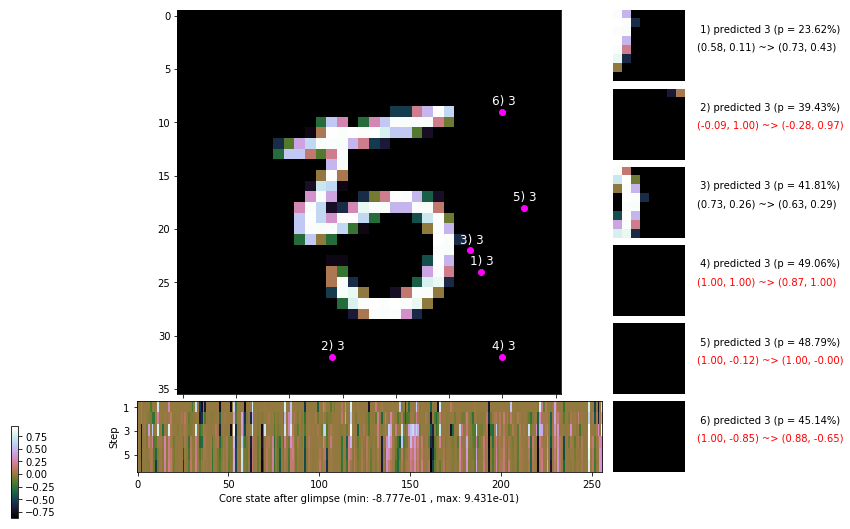

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 7 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


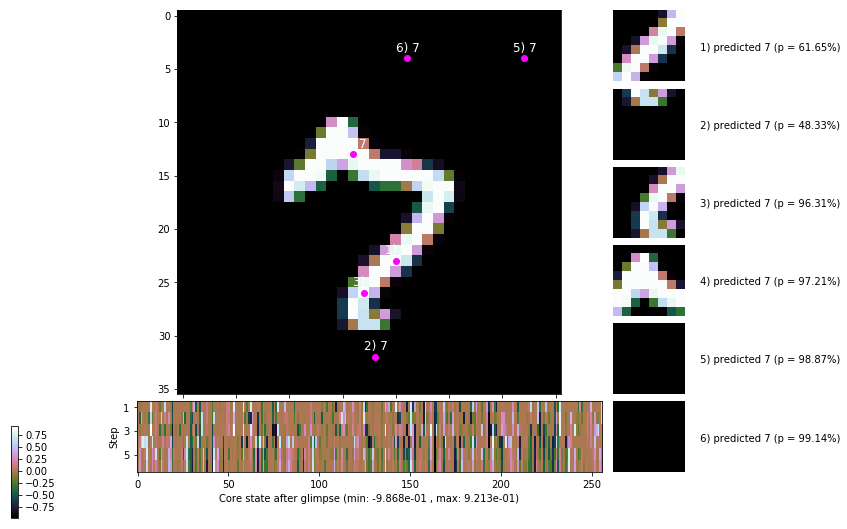


	Target class: 6 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


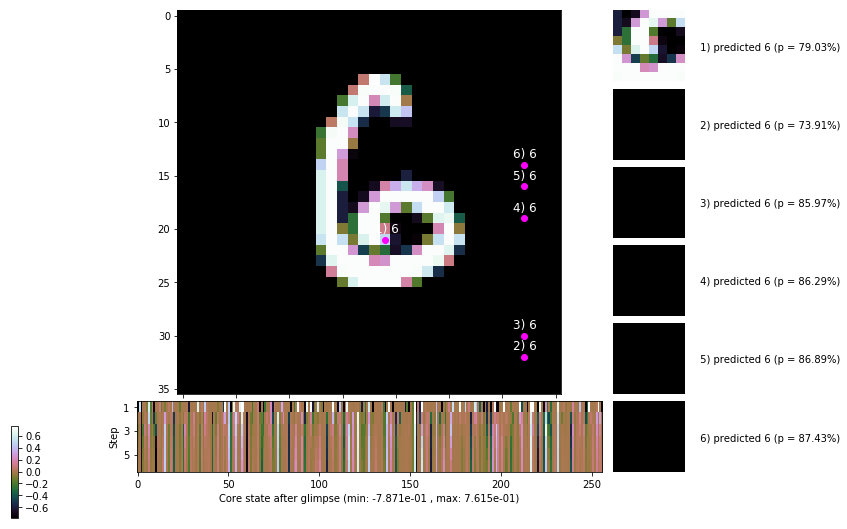

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


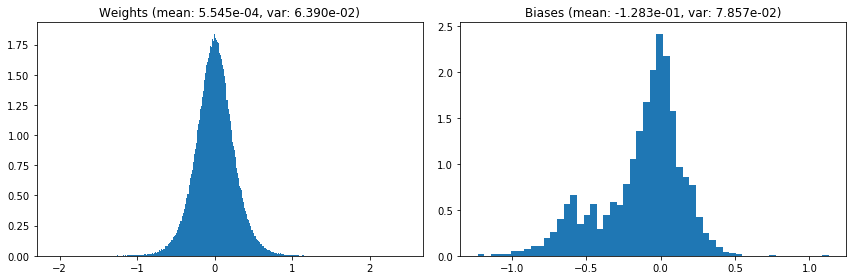

                                      Location network weights and biases


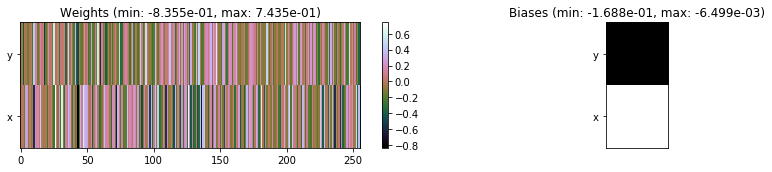

---------------------------------------------------------------------------------------------------------------
Elapsed time:  416.26 sec | TRAIN >> class loss: 0.5845 | steps:  2.496 :( | reward:  4.0570 :( | acc.: 79.963% :(
                          | VAL   >> class loss: 0.5981 | steps:  2.453 :( | reward:  4.0998 :( | acc.: 78.560% :(


Epoch  30/400) lr = 0.0006471
 b    300/  3000 >> 141.7 ms/b | lr: 6.46e-04 | grad 2norm: 10.99 | grad inf norm:  3.097
         Weights || abs max:  2.46 ( 2810.71) | mean:  5.64e-04 ( 0.01) | var: 6.40e-02 (  798.31)
          Biases || abs max:  1.23 (  251.06) | mean: -1.28e-01 ( 0.20) | var: 7.85e-02 (  459.15)
                    class loss: 0.576 | steps: 2.482 | reward:  4.060 | acc.: 80.13%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 137.9 ms/b | lr: 6.46e-04 | grad 2norm: 11.26 | grad inf norm:  3.318
         Weights || abs max:  2.47 ( 2693.48) | mean:  6.22e-04 (

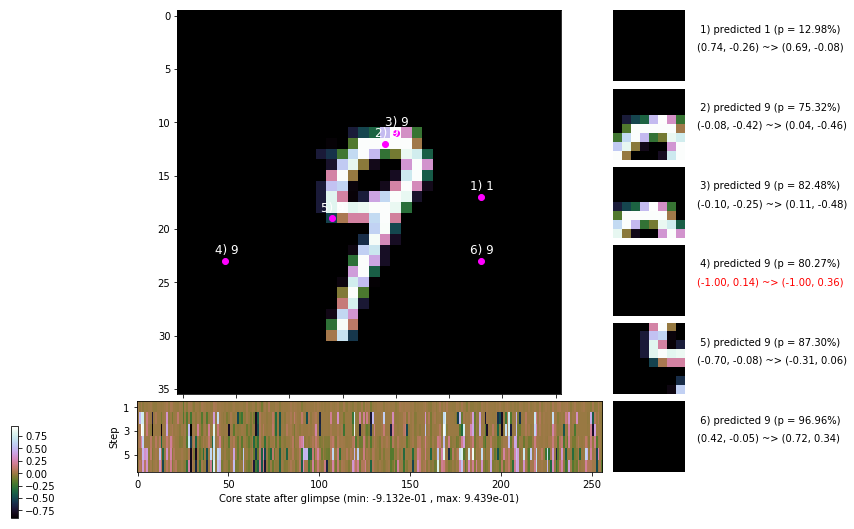

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 137.5 ms/b | lr: 6.45e-04 | grad 2norm: 11.05 | grad inf norm:  3.112
         Weights || abs max:  2.48 ( 3280.29) | mean:  6.32e-04 ( 0.02) | var: 6.42e-02 ( 1036.51)
          Biases || abs max:  1.23 (  135.48) | mean: -1.28e-01 ( 0.15) | var: 7.89e-02 (   87.24)
                    class loss: 0.568 | steps: 2.507 | reward:  4.041 | acc.: 80.02%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 138.3 ms/b | lr: 6.44e-04 | grad 2norm: 10.85 | grad inf norm:  3.067
         Weights || abs max:  2.48 ( 3961.04) | mean:  6.46e-04 ( 0.02) | var: 6.43e-02 ( 1412.39)
          Biases || abs max:  1.24 (  126.49) | mean: -1.28e-01 ( 0.14) | var: 7.90e-02 (  364.55)
                    class loss: 0.560 | steps: 2.482 | reward:  4.098 | acc.: 81.38%

	Target class: 8 | Discounted rewards: [0.075, 0.170, 0.3

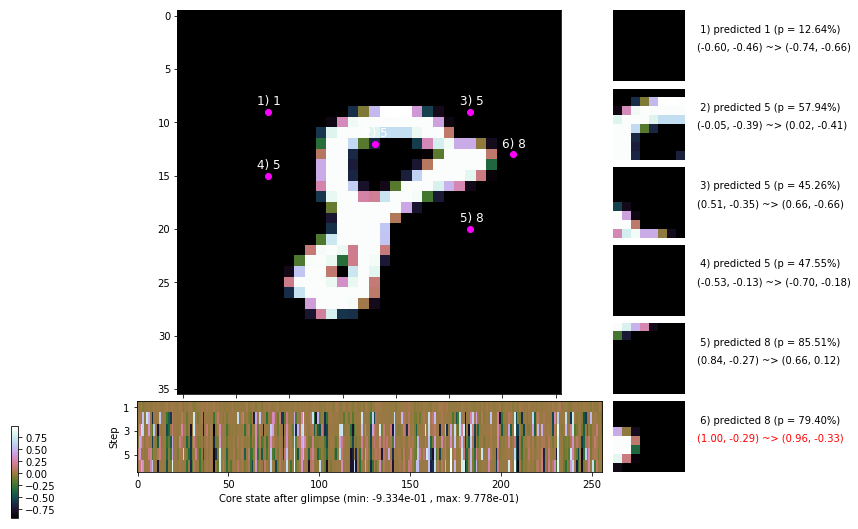

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 139.2 ms/b | lr: 6.43e-04 | grad 2norm: 11.10 | grad inf norm:  3.118
         Weights || abs max:  2.48 ( 5911.17) | mean:  6.24e-04 ( 0.02) | var: 6.44e-02 ( 3710.05)
          Biases || abs max:  1.24 (  101.66) | mean: -1.28e-01 ( 0.11) | var: 7.90e-02 (   90.30)
                    class loss: 0.583 | steps: 2.533 | reward:  4.035 | acc.: 79.80%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 134.1 ms/b | lr: 6.42e-04 | grad 2norm: 11.00 | grad inf norm:  3.144
         Weights || abs max:  2.48 ( 3028.71) | mean:  6.23e-04 ( 0.01) | var: 6.45e-02 (  186.60)
          Biases || abs max:  1.23 (   63.41) | mean: -1.28e-01 ( 0.09) | var: 7.95e-02 (   23.58)
                    class loss: 0.597 | steps: 2.537 | reward:  4.019 | acc.: 79.73%

	Target class: 8 | Discounted rewards: [0.454, 0.928, 1.8

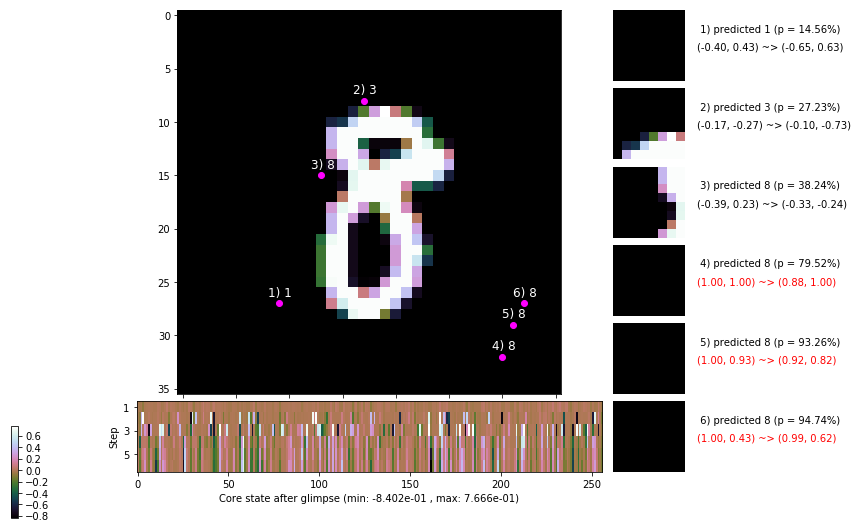

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 144.3 ms/b | lr: 6.41e-04 | grad 2norm: 10.74 | grad inf norm:  3.121
         Weights || abs max:  2.50 ( 1898.11) | mean:  6.13e-04 ( 0.01) | var: 6.46e-02 (   77.00)
          Biases || abs max:  1.23 (  126.81) | mean: -1.28e-01 ( 0.13) | var: 8.00e-02 (  106.64)
                    class loss: 0.585 | steps: 2.495 | reward:  4.059 | acc.: 80.02%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 138.8 ms/b | lr: 6.40e-04 | grad 2norm: 11.23 | grad inf norm:  3.197
         Weights || abs max:  2.51 ( 4110.27) | mean:  6.33e-04 ( 0.02) | var: 6.47e-02 (  649.60)
          Biases || abs max:  1.23 (  621.28) | mean: -1.28e-01 ( 0.37) | var: 8.00e-02 (16039.11)
                    class loss: 0.610 | steps: 2.526 | reward:  3.994 | acc.: 78.78%

	Target class: 5 | Discounted rewards: [0.864, 1.748, 1.4

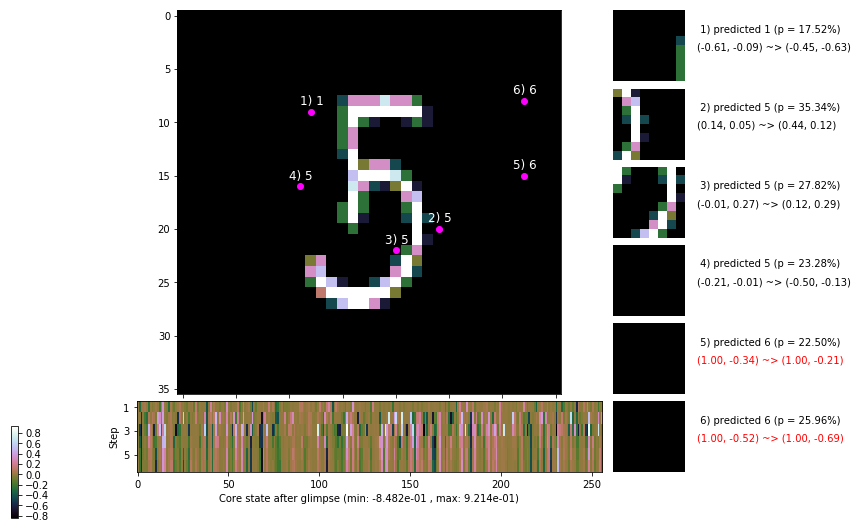

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 147.7 ms/b | lr: 6.39e-04 | grad 2norm: 10.99 | grad inf norm:  3.277
         Weights || abs max:  2.51 ( 3905.80) | mean:  6.02e-04 ( 0.02) | var: 6.48e-02 (  770.60)
          Biases || abs max:  1.23 ( 1127.44) | mean: -1.29e-01 ( 0.92) | var: 8.03e-02 (245745.89)
                    class loss: 0.607 | steps: 2.525 | reward:  4.039 | acc.: 79.22%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 153.4 ms/b | lr: 6.38e-04 | grad 2norm: 10.87 | grad inf norm:  3.179
         Weights || abs max:  2.53 ( 3648.67) | mean:  5.87e-04 ( 0.01) | var: 6.49e-02 (  543.73)
          Biases || abs max:  1.23 (  244.10) | mean: -1.29e-01 ( 0.17) | var: 8.07e-02 ( 2722.95)
                    class loss: 0.597 | steps: 2.545 | reward:  4.021 | acc.: 79.77%

	Target class: 5 | Discounted rewards: [0.706, 1.433, 0.

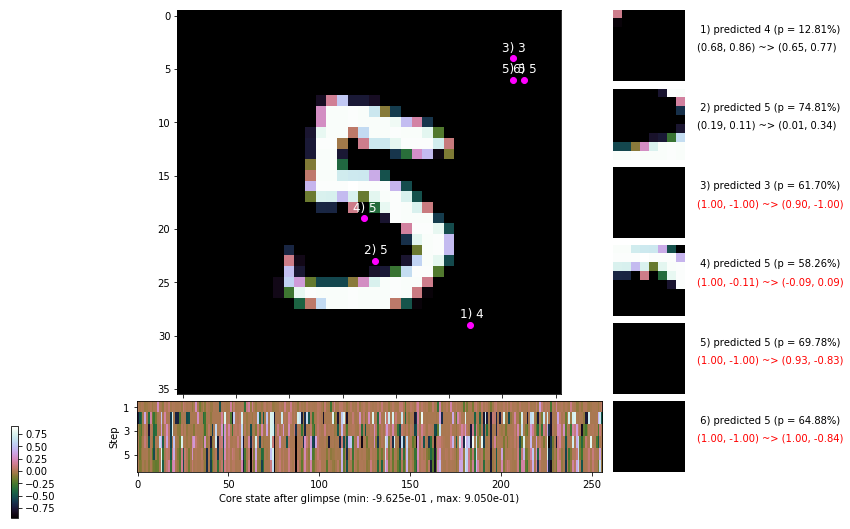

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 6 | Discounted rewards: [0.075, 0.170, 0.360, 0.740, 1.500, 1.000]


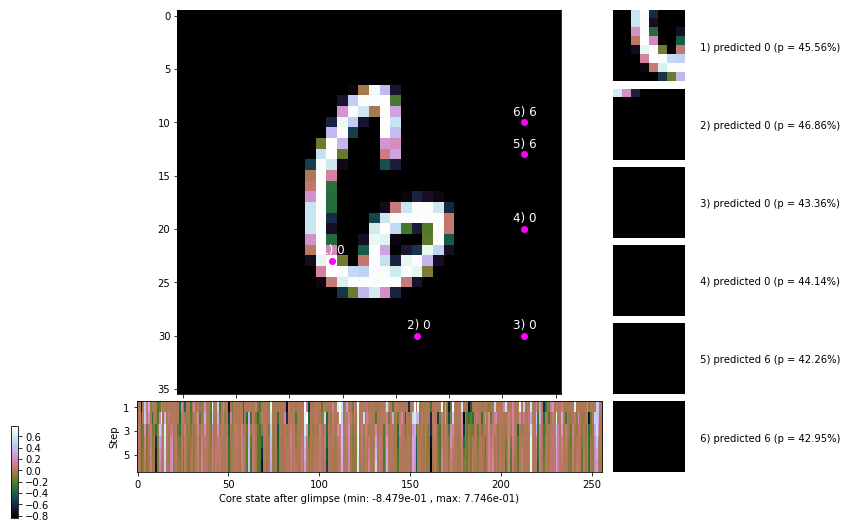


	Target class: 0 | Discounted rewards: [-0.020, -0.019, -0.019, -0.018, -0.015, -0.010]


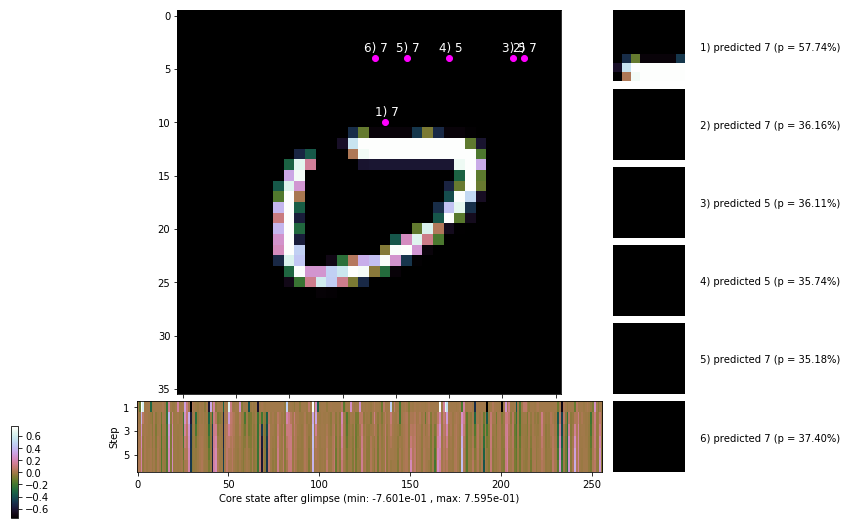

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


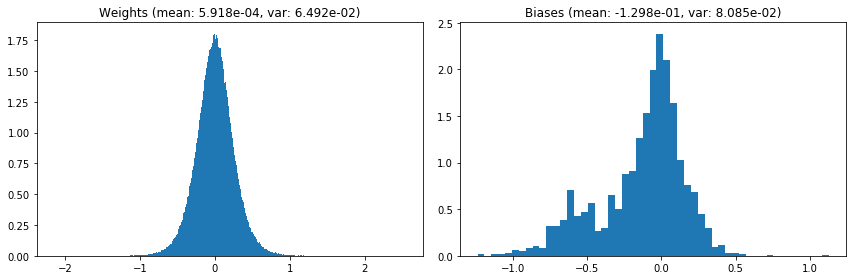

                                      Location network weights and biases


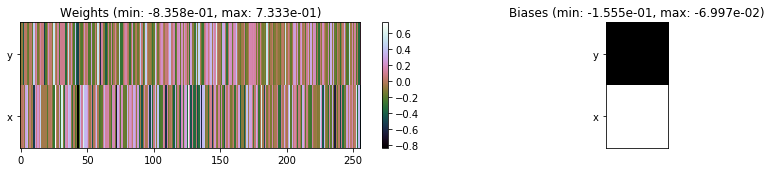

---------------------------------------------------------------------------------------------------------------
Elapsed time:  424.40 sec | TRAIN >> class loss: 0.5850 | steps:  2.516 :( | reward:  4.0398 :( | acc.: 79.887% :(
                          | VAL   >> class loss: 0.6006 | steps:  2.463 :( | reward:  4.0844 :( | acc.: 79.000% :(


Epoch  31/400) lr = 0.0006375
 b    300/  3000 >> 143.6 ms/b | lr: 6.37e-04 | grad 2norm: 11.21 | grad inf norm:  3.117
         Weights || abs max:  2.55 ( 1966.93) | mean:  5.93e-04 ( 0.01) | var: 6.50e-02 (  111.72)
          Biases || abs max:  1.24 (  912.59) | mean: -1.29e-01 ( 0.74) | var: 8.08e-02 (143048.14)
                    class loss: 0.595 | steps: 2.513 | reward:  4.024 | acc.: 79.75%
                 --------------------------------------------------------------------------------
 b    600/  3000 >> 142.1 ms/b | lr: 6.36e-04 | grad 2norm: 11.25 | grad inf norm:  3.301
         Weights || abs max:  2.55 ( 2362.12) | mean:  5.87e-04 

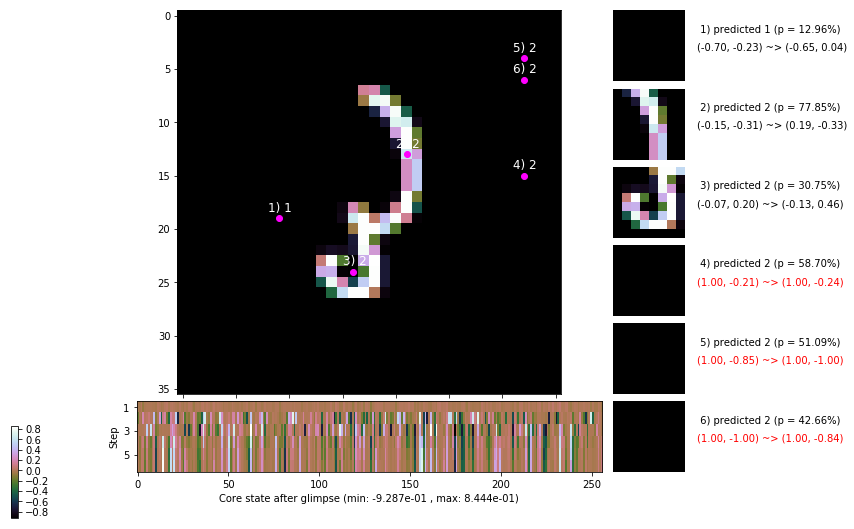

                 --------------------------------------------------------------------------------
 b    900/  3000 >> 149.2 ms/b | lr: 6.35e-04 | grad 2norm: 11.12 | grad inf norm:  3.241
         Weights || abs max:  2.56 ( 2182.80) | mean:  5.88e-04 ( 0.01) | var: 6.52e-02 (  372.78)
          Biases || abs max:  1.26 (  292.73) | mean: -1.29e-01 ( 0.21) | var: 8.10e-02 ( 1830.91)
                    class loss: 0.596 | steps: 2.518 | reward:  4.021 | acc.: 79.27%
                 --------------------------------------------------------------------------------
 b   1200/  3000 >> 139.9 ms/b | lr: 6.34e-04 | grad 2norm: 11.18 | grad inf norm:  3.429
         Weights || abs max:  2.57 ( 2883.64) | mean:  6.08e-04 ( 0.01) | var: 6.53e-02 (  178.75)
          Biases || abs max:  1.25 (  167.76) | mean: -1.29e-01 ( 0.14) | var: 8.10e-02 (  310.62)
                    class loss: 0.598 | steps: 2.531 | reward:  4.009 | acc.: 79.58%

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.8

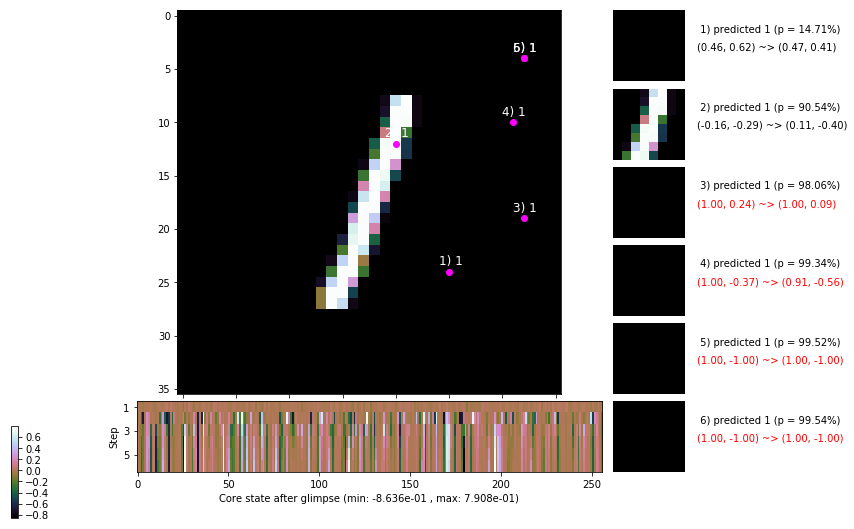

                 --------------------------------------------------------------------------------
 b   1500/  3000 >> 145.4 ms/b | lr: 6.33e-04 | grad 2norm: 11.23 | grad inf norm:  3.214
         Weights || abs max:  2.58 ( 2269.73) | mean:  6.27e-04 ( 0.01) | var: 6.54e-02 (   81.41)
          Biases || abs max:  1.26 (  198.15) | mean: -1.29e-01 ( 0.16) | var: 8.11e-02 (  650.02)
                    class loss: 0.598 | steps: 2.534 | reward:  4.024 | acc.: 79.47%
                 --------------------------------------------------------------------------------
 b   1800/  3000 >> 139.5 ms/b | lr: 6.32e-04 | grad 2norm: 11.10 | grad inf norm:  3.075
         Weights || abs max:  2.59 (20767.52) | mean:  6.46e-04 ( 0.05) | var: 6.54e-02 (187929.73)
          Biases || abs max:  1.27 (  101.02) | mean: -1.30e-01 ( 0.11) | var: 8.14e-02 (   41.91)
                    class loss: 0.598 | steps: 2.522 | reward:  4.032 | acc.: 79.48%

	Target class: 2 | Discounted rewards: [0.706, 1.433, 0.

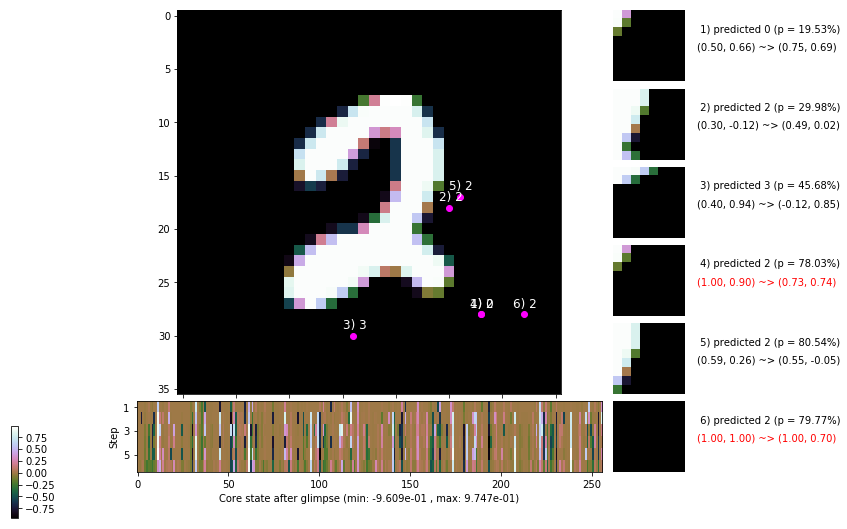

                 --------------------------------------------------------------------------------
 b   2100/  3000 >> 139.6 ms/b | lr: 6.31e-04 | grad 2norm: 11.08 | grad inf norm:  3.126
         Weights || abs max:  2.58 ( 2805.59) | mean:  6.61e-04 ( 0.01) | var: 6.55e-02 (  219.82)
          Biases || abs max:  1.26 (  472.86) | mean: -1.30e-01 ( 0.27) | var: 8.14e-02 ( 8069.25)
                    class loss: 0.564 | steps: 2.512 | reward:  4.076 | acc.: 80.53%
                 --------------------------------------------------------------------------------
 b   2400/  3000 >> 143.5 ms/b | lr: 6.31e-04 | grad 2norm: 11.01 | grad inf norm:  3.130
         Weights || abs max:  2.59 ( 3170.00) | mean:  6.83e-04 ( 0.01) | var: 6.56e-02 (  188.32)
          Biases || abs max:  1.25 (  314.90) | mean: -1.30e-01 ( 0.20) | var: 8.17e-02 ( 1240.22)
                    class loss: 0.578 | steps: 2.528 | reward:  4.034 | acc.: 79.58%

	Target class: 4 | Discounted rewards: [1.969, 1.938, 1.8

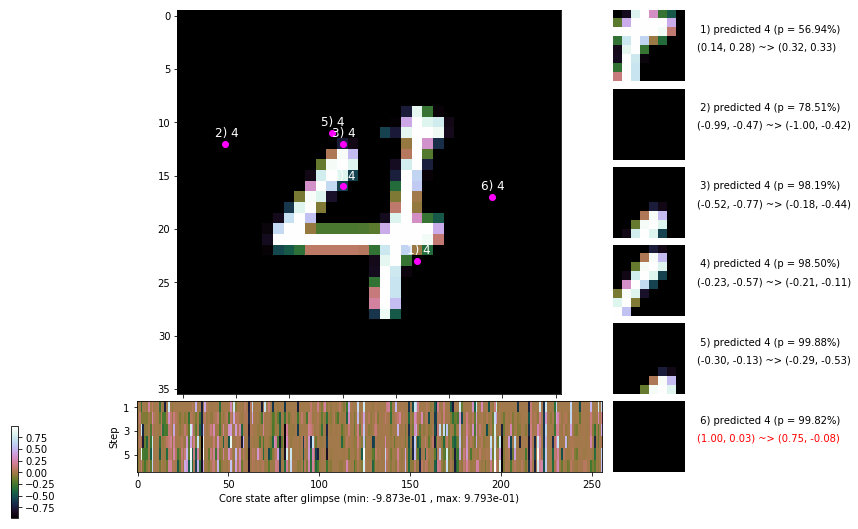

                 --------------------------------------------------------------------------------
 b   2700/  3000 >> 143.0 ms/b | lr: 6.29e-04 | grad 2norm: 10.99 | grad inf norm:  3.255
         Weights || abs max:  2.59 ( 3045.47) | mean:  6.63e-04 ( 0.01) | var: 6.57e-02 (  193.54)
          Biases || abs max:  1.25 (  177.27) | mean: -1.30e-01 ( 0.15) | var: 8.19e-02 (  151.38)
                    class loss: 0.591 | steps: 2.476 | reward:  4.075 | acc.: 79.65%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 139.6 ms/b | lr: 6.29e-04 | grad 2norm: 10.94 | grad inf norm:  3.151
         Weights || abs max:  2.61 ( 6927.57) | mean:  6.46e-04 ( 0.02) | var: 6.58e-02 (12830.08)
          Biases || abs max:  1.25 (  192.13) | mean: -1.30e-01 ( 0.15) | var: 8.19e-02 (  469.12)
                    class loss: 0.588 | steps: 2.533 | reward:  4.034 | acc.: 79.60%

	Target class: 7 | Discounted rewards: [-0.020, -0.019, -

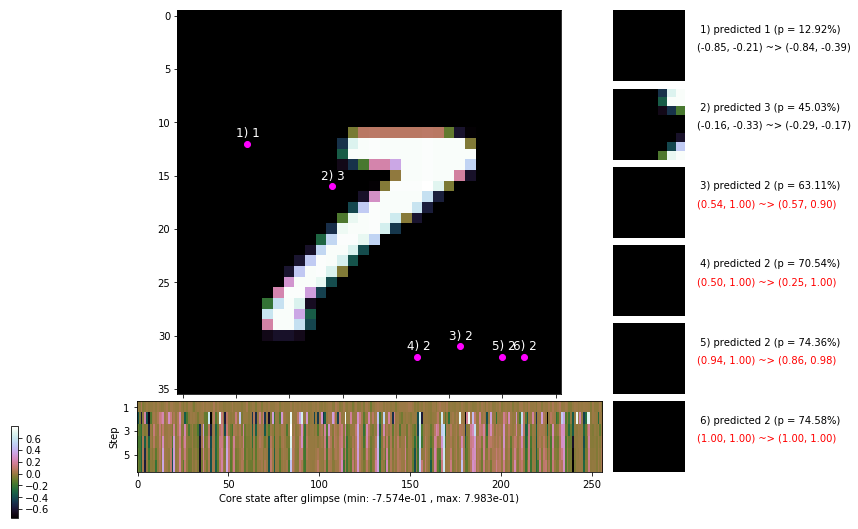

                 --------------------------------------------------------------------------------
                                          ---===  VALIDATION  ===---

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


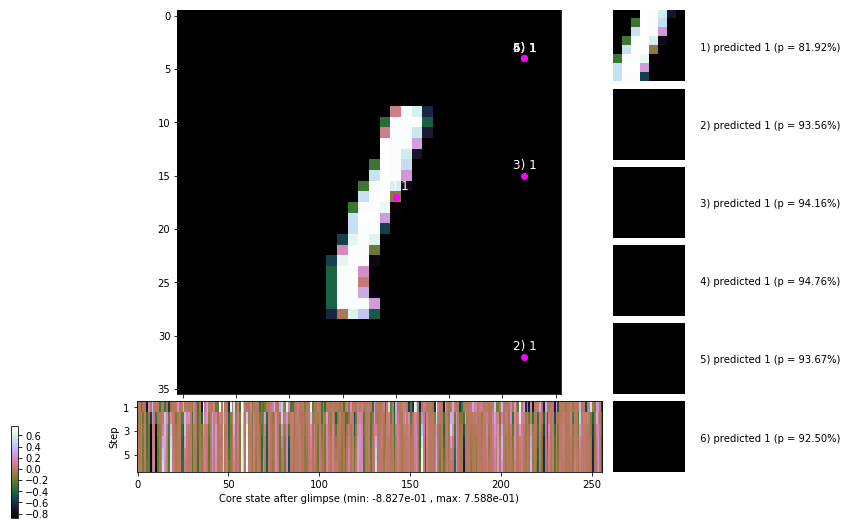


	Target class: 6 | Discounted rewards: [0.485, 0.991, -0.019, -0.018, -0.015, -0.010]


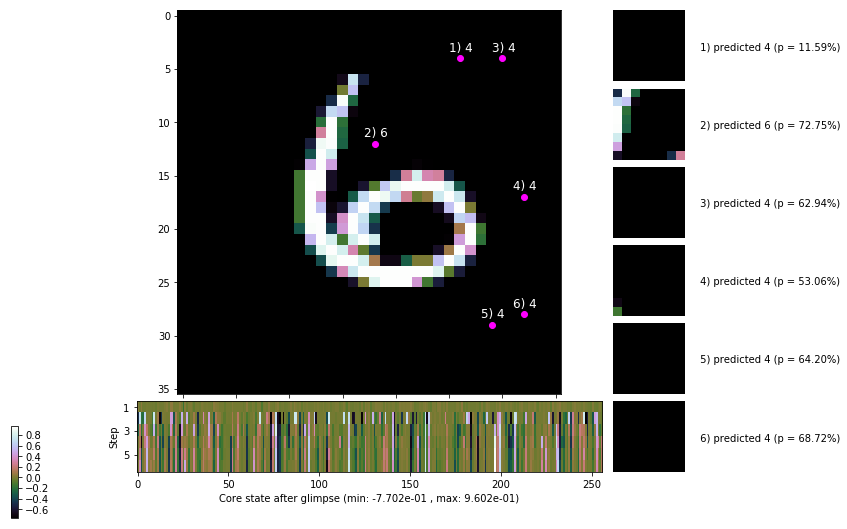

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


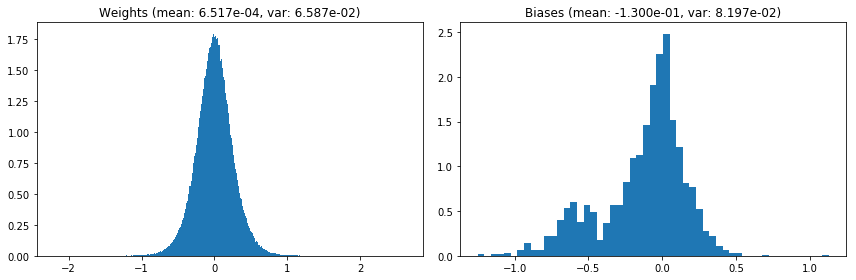

                                      Location network weights and biases


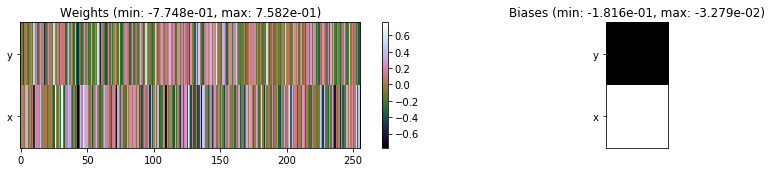

---------------------------------------------------------------------------------------------------------------
Elapsed time:  428.28 sec | TRAIN >> class loss: 0.5909 | steps:  2.520 :( | reward:  4.0342 :( | acc.: 79.598% :(
                          | VAL   >> class loss: 0.5757 | steps:  2.408 :( | reward:  4.1517 :( | acc.: 79.680% :(



			---~~~=== End of training ===~~~---

Evaluating on the TEST dataset...

	Target class: 1 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


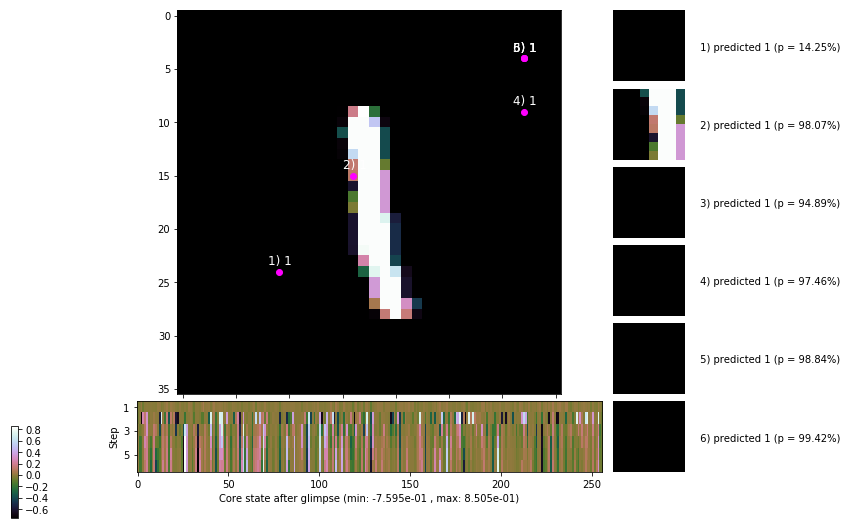


	Target class: 2 | Discounted rewards: [1.969, 1.938, 1.875, 1.750, 1.500, 1.000]


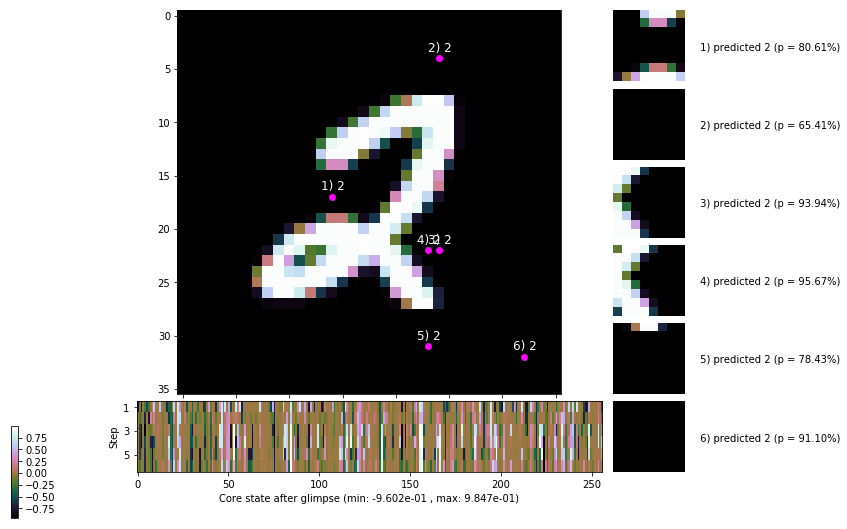

	>> class loss: 0.5844 | steps:  2.457 | reward:  4.1198 | acc.: 79.360%


In [7]:
model_info, train_info, val_info, test_info, epochs = train_eval_loop(
    model = model, epochs = num_epochs, image_size = image_size,
    train_data = train_data, val_data = val_data, test_data = test_data,
    padding = padding, optimizer = optimizer, lr_scheduler = lr_scheduler,
    class_criterion = class_criterion, error_penalty = error_penalty,
    loc_std = loc_std, random_start_loc = random_start_loc, gamma = gamma,
    grad_clip = grad_clip, steps_per_epoch = steps_per_epoch,
    max_ep_len = max_ep_len, log_freq = log_freq, viz_freq = viz_freq,
    early_stopping = early_stopping, eval_viz_freq = eval_viz_freq,
    reward_all_correct = True
)

In [8]:
print('Trained over %d epochs\n' % epochs)

for name, best_stats in zip(['train', 'val'], [train_info['bests'], val_info['bests']]):
    print('Best %s stats:' % name)
    for k, v in best_stats.items():
        print('    %s: %.2f (epoch %d)' % (k, v[k], v['epoch']))
    print('')

Trained over 31 epochs

Best train stats:
    steps: 2.49 (epoch 23)
    reward: 4.09 (epoch 23)
    accuracy: 0.81 (epoch 23)

Best val stats:
    steps: 2.36 (epoch 23)
    reward: 4.21 (epoch 23)
    accuracy: 0.81 (epoch 22)



### Training curves

In [9]:
epoch_range = range(1, epochs+1)
train_col = (1, 0, 0); train_err_col = (1, 0.1, 0.1)
val_col = (0, 0, 1); val_err_col = (0.1, 0.1, 1)

Text(0.5,1,'Weight and bias values over training time')

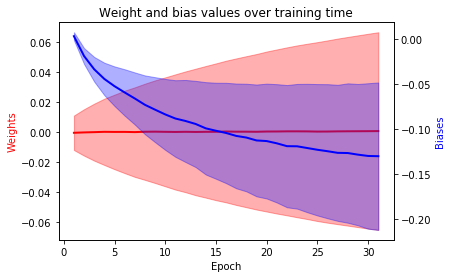

In [10]:
wts_mean = np.array(model_info['weights']['mean'])
wts_var = np.array(model_info['weights']['var'])
bias_mean = np.array(model_info['biases']['mean'])
bias_var = np.array(model_info['biases']['var'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_mean, color = train_col, linewidth = 2)
wts_ax.fill_between(epoch_range,
    wts_mean - wts_var, wts_mean + wts_var,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_mean, color = val_col, linewidth = 2)
bias_ax.fill_between(epoch_range,
    bias_mean - bias_var, bias_mean + bias_var,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Weight and bias values over training time')

Text(0.5,1,'Max absolute weight and bias values over training time')

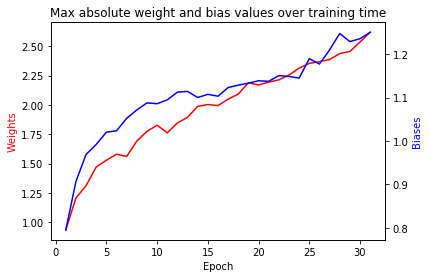

In [11]:
wts_absmax = np.array(model_info['weights']['abs max'])
bias_absmax = np.array(model_info['biases']['abs max'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_absmax, color = train_col)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_absmax, color = val_col)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Max absolute weight and bias values over training time')

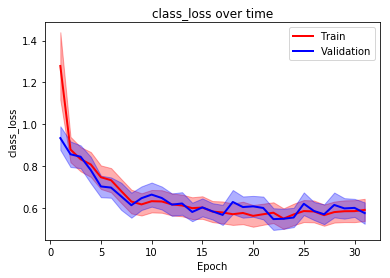

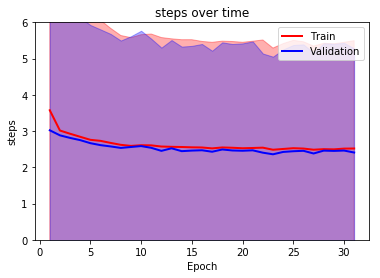

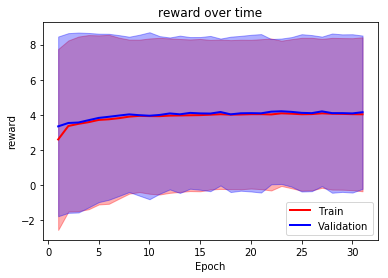

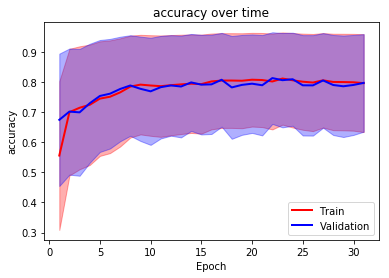

In [12]:
things_to_plot = ['class_loss', 'steps', 'reward', 'accuracy']
for thing in things_to_plot:
    train_avg = np.array([info['averages'][thing] for info in train_info['stats']])
    train_err = np.array([np.var(info['histories'][thing]) for info in train_info['stats']])
    
    val_avg = np.array([info['averages'][thing] for info in val_info['stats']])
    val_err = np.array([np.var(info['histories'][thing]) for info in val_info['stats']])
    
    plt.plot(epoch_range, train_avg, color = train_col, linewidth = 2)
    plt.plot(epoch_range, val_avg, color = val_col, linewidth = 2)
    plt.fill_between(epoch_range,
        train_avg - train_err, train_avg + train_err, alpha = 0.35,
        edgecolor = train_col, facecolor = train_err_col
    )
    plt.fill_between(epoch_range,
        val_avg - val_err, val_avg + val_err, alpha = 0.35,
        edgecolor = val_col, facecolor = val_err_col
    )
    if thing == 'steps':
        plt.ylim([0, 6])
    plt.legend(['Train', 'Validation'], loc = 'upper right' if thing in ['class_loss', 'steps'] else 'lower right')
    plt.xlabel('Epoch'); plt.ylabel(thing)
    plt.title('%s over time' % thing)
    plt.show()
    print('')

Text(0.5,1,'Gradient norms over training time')

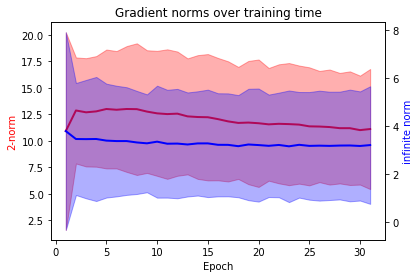

In [13]:
# Gradient stats
grad_2norm = np.array([info['averages']['grad_2norm'] for info in train_info['stats']])
grad_inf_norm = np.array([info['averages']['grad_inf_norm'] for info in train_info['stats']])
grad_2norm_err = np.array([np.var(info['histories']['grad_2norm']) for info in train_info['stats']])
grad_inf_norm_err = np.array([np.var(info['histories']['grad_inf_norm']) for info in train_info['stats']])

fig, pnorm_ax = plt.subplots()
pnorm_ax.plot(epoch_range, grad_2norm, color = train_col, linewidth = 2)
pnorm_ax.fill_between(epoch_range,
    grad_2norm - grad_2norm_err, grad_2norm + grad_2norm_err,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
pnorm_ax.set_xlabel('Epoch');
pnorm_ax.set_ylabel('2-norm', color = train_col)

infnorm_ax = pnorm_ax.twinx()
infnorm_ax.plot(epoch_range, grad_inf_norm, color = val_col, linewidth = 2)
infnorm_ax.fill_between(epoch_range,
    grad_inf_norm - grad_inf_norm_err, grad_inf_norm + grad_inf_norm_err,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
infnorm_ax.set_ylabel('infinite norm', color = val_col)

plt.title('Gradient norms over training time')